In [3]:
#import sys
#sys.path.insert(0, 'C:/Users/marco/Downloads/Thesis_notebooks/Thesis_Marcos')
#
#import chaosmagpy as cp
#import pandas as pd
#import matplotlib.pyplot as plt
#import numpy as np
%config InlineBackend.figure_format ='retina'
#from glob import glob
#import glob
#import matplotlib.gridspec as gridspec
#import thesis_functions as mvs
#import data_processing_tools as dpt
#import utilities_tools as utt
#import support_functions as spf
##import pwlf
#%matplotlib inline
#from datetime import datetime,date
#import timeit
#from datetime import datetime 
#import plots_obs as obs
import seaborn as sns
#import os
import pandas as pd
import numpy as np
#import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import geopandas as gpd


In [45]:
df_RMS = pd.read_csv('RMS_xyz_corrected_from_2000to202206.txt', sep = ' ', index_col = [0] )
#df_RMS_n = pd.read_csv('RMS_normal_from_2000to202202.txt', sep = ' ', index_col = [0] )

In [3]:
df_imos = pd.read_csv('Thesis_Marcos/Data/Imos informations/IMOS_INTERMAGNET.txt', sep = '\t', index_col = [0])
df_imos

,Latitude,Longitude,Elevation
Imos,,,
AAA,43.250,76.920,1300.0
ABG,18.638,72.872,6.0
ABK,68.358,18.823,380.0
AIA,-65.245,-64.258,10.0
API,-13.815,-171.781,2.0
...,...,...,...
TAN,-18.917,47.552,1375.0
TEO,19.747,-99.182,2280.0
TIK,71.580,129.000,57.0


In [72]:
df_RMS['Latitude'] =np.nan
df_RMS['Longitude'] = np.nan
df_RMS_n['Latitude'] =np.nan
df_RMS_n['Longitude'] = np.nan
for imo in df_imos.index[0:150]:
    try:
        print(imo)
        df_RMS_n.loc[imo]['Latitude'] = df_imos.loc[imo]['Latitude']
        df_RMS_n.loc[imo]['Longitude'] = df_imos.loc[imo]['Longitude']
        df_RMS.loc[imo]['Latitude'] = df_imos.loc[imo]['Latitude']
        df_RMS.loc[imo]['Longitude'] = df_imos.loc[imo]['Longitude']
    except:
        pass

AAA
ABG
ABK
AIA
API
ARS
ASC
BDV
BEL
BFO
BLC
BMT
BOU
BOX
BRD
BRW
BSL
CBB
CKI
CLF
CMO
CNB
CPL
CSY
CTA
CYG
CZT
DED
DLT
DOU
DRV
DUR
EBR
ESK
EYR
FCC
FRD
FRN
FUR
GAN
GCK
GDH
GNG
GUA
GUI
HAD
HBK
HER
HLP
HON
HRB
HRN
HUA
HYB
IPM
IQA
IRT
IZN
JAI
JCO
KAK
KDU
KEP
KHB
KIV
KMH
KNY
KOU
LER
LON
LRM
LVV
LYC
MAB
MAW
MCQ
MEA
MGD
MMB
NAQ
NCK
NEW
NGK
NUR
NVS
ORC
OTT
PAF
PAG
PEG
PET
PHU
PIL
PPT
PST
RES
SBA
SBL
SFS
SHE
SHU
SIT
SJG
SOD
SPT
STJ
SUA
TAM
TDC
THL
THY
TRW
TSU
TTB
TUC
UPS
VAL
VIC
VNA
VOS
VSS
WIC
WNG
YAK
YKC
AAE
ALE
AMS
AQU
BFE
BNG
CNH
DLR
DMC
GLN
GNA
GZH
ISK
LNP
LOV
LZH
MBC
MBO
MID
PBQ
QSB
SON
TAN
TEO
TIK


In [73]:
df_RMS.to_csv('rms.txt', sep = '\t')

In [5]:
df_RMS_n.drop('SBA',inplace=True)
df_RMS.drop('SBA',inplace=True)
df_RMS_n.drop('IQA',inplace=True)
df_RMS.drop('IQA',inplace=True)

In [16]:
df_RMS.nlargest(columns = ['X_RMS'], n = 4)

,X_RMS,Y_RMS,Z_RMS,Latitude,Longitude
SBA,17.349,19.639,27.322,-77.850,166.762
DMC,13.984,8.247,20.740,-75.250,124.167
CBB,14.672,20.271,15.509,69.123,-105.031
CSY,14.981,6.686,14.109,-66.283,110.533


In [6]:
df_RMS = df_RMS.drop(df_RMS.nlargest(columns = ['X_RMS'], n = 4).index).dropna()
df_RMS_n = df_RMS_n.drop(df_RMS_n.nlargest(columns = ['X_RMS'], n = 4).index).dropna()

NameError: name 'df_sv' is not defined

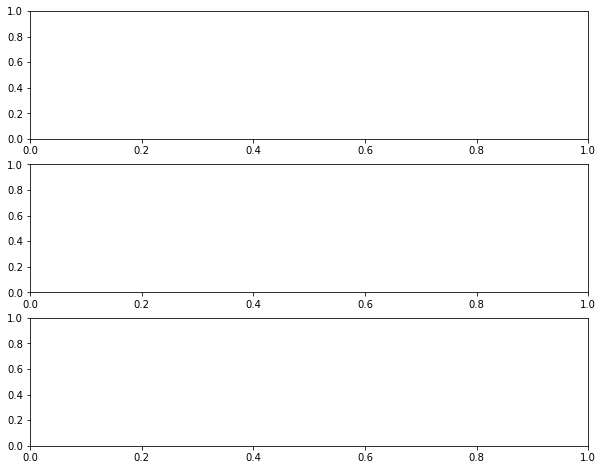

In [84]:
fig, axis = plt.subplots(3,1, figsize = (10,8))

for col, cols, ax, i in zip(df_sv.columns, ['X_int','Y_int','Z_int'], axis.flatten(), rms):
    ax.plot(df_sv[col], 'o',color = 'blue', label = 'Observed')
    ax.plot(df_c_sv[cols],color = 'red', label  = f'Predicted - rms {i}')
    #ax.text(0.4,0.85, f'RMS = {i}', size=10, ha="center", 
         #transform=ax.transAxes)
    ax.set_ylabel(f'SV {col} (nT/Yr)', fontsize = 10)
    ax.set_xlim(df_sv[col].index[0],df_sv[col].index[-1])
    ax.set_ylim(df_sv[col].min() - 25,df_sv[col].max() +25)
    
    ax.legend()
plt.savefig('PPT_RMS.jpeg', dpi = 300,bbox_inches = 'tight')
plt.show()

In [3]:
df_RMS = df_RMS.drop(df_RMS.loc[df_RMS['X_RMS'] > 15].index)
df_RMS = df_RMS.drop(df_RMS.loc[df_RMS['Y_RMS'] > 15].index)
df_RMS = df_RMS.drop(df_RMS.loc[df_RMS['Z_RMS'] > 15].index)

In [3]:
M_lat = df_RMS[(((df_RMS['Latitude'] >= 30) & (df_RMS['Latitude'] < 60)) |
        ((df_RMS['Latitude'] <= - 30) & (df_RMS['Latitude'] > - 60)))]

H_lat = df_RMS[((df_RMS['Latitude'] >= 60) | (df_RMS['Latitude'] <= - 60))]

L_lat = df_RMS[(((df_RMS['Latitude'] < 30) & (df_RMS['Latitude'] > 0))| ((df_RMS['Latitude'] > - 30) & (df_RMS['Latitude'] < 0)))]


In [44]:
H_lat_n

,X_RMS,Y_RMS,Z_RMS,Latitude,Longitude
BLC,16.812,6.879,20.209,64.318,-96.012
BRW,20.801,12.460,18.198,71.320,-156.620
CBB,15.291,20.601,22.540,69.123,-105.031
CMO,19.499,9.629,10.711,64.870,-147.860
CSY,15.291,6.710,17.632,-66.283,110.533
DED,12.151,10.820,20.375,70.360,-148.790
DRV,13.528,6.891,19.837,-66.670,140.010
GDH,10.537,6.724,20.467,69.252,-53.533
JCO,12.987,15.082,19.890,70.356,148.799
LER,9.060,4.554,7.949,60.138,-1.183


In [22]:
M_lat_n = df_RMS_n[(((df_RMS_n['Latitude'] >= 30) & (df_RMS_n['Latitude'] < 60)) |
        ((df_RMS_n['Latitude'] <= - 30) & (df_RMS_n['Latitude'] > - 60)))]

H_lat_n = df_RMS_n[((df_RMS_n['Latitude'] >= 60) | (df_RMS_n['Latitude'] <= - 60))]

L_lat_n = df_RMS_n[(((df_RMS_n['Latitude'] < 30) & (df_RMS_n['Latitude'] > 0))| ((df_RMS_n['Latitude'] > - 30) & (df_RMS_n['Latitude'] < 0)))]

In [48]:
H_lat

,X_RMS,Y_RMS,Z_RMS,Latitude,Longitude
ABK,11.237,2.585,5.988,68.358,18.823
BLC,6.674,3.619,12.277,64.318,-96.012
BRW,9.555,4.874,9.111,71.320,-156.620
CBB,9.450,5.219,11.992,69.123,-105.031
CMO,10.625,4.943,6.049,64.870,-147.860
CSY,14.981,6.686,14.109,-66.283,110.533
DED,9.432,9.346,11.565,70.360,-148.790
GDH,7.749,4.596,11.329,69.252,-53.533
IQA,9.212,5.200,10.353,63.753,-68.518
JCO,9.899,14.260,13.505,70.356,148.799


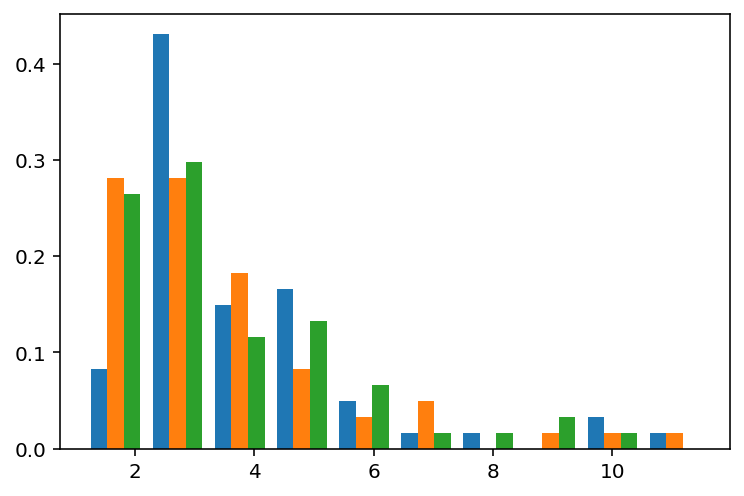

In [6]:
plt.hist(M_lat[['X_RMS','Y_RMS','Z_RMS']],density=True, bins=10)

plt.show()

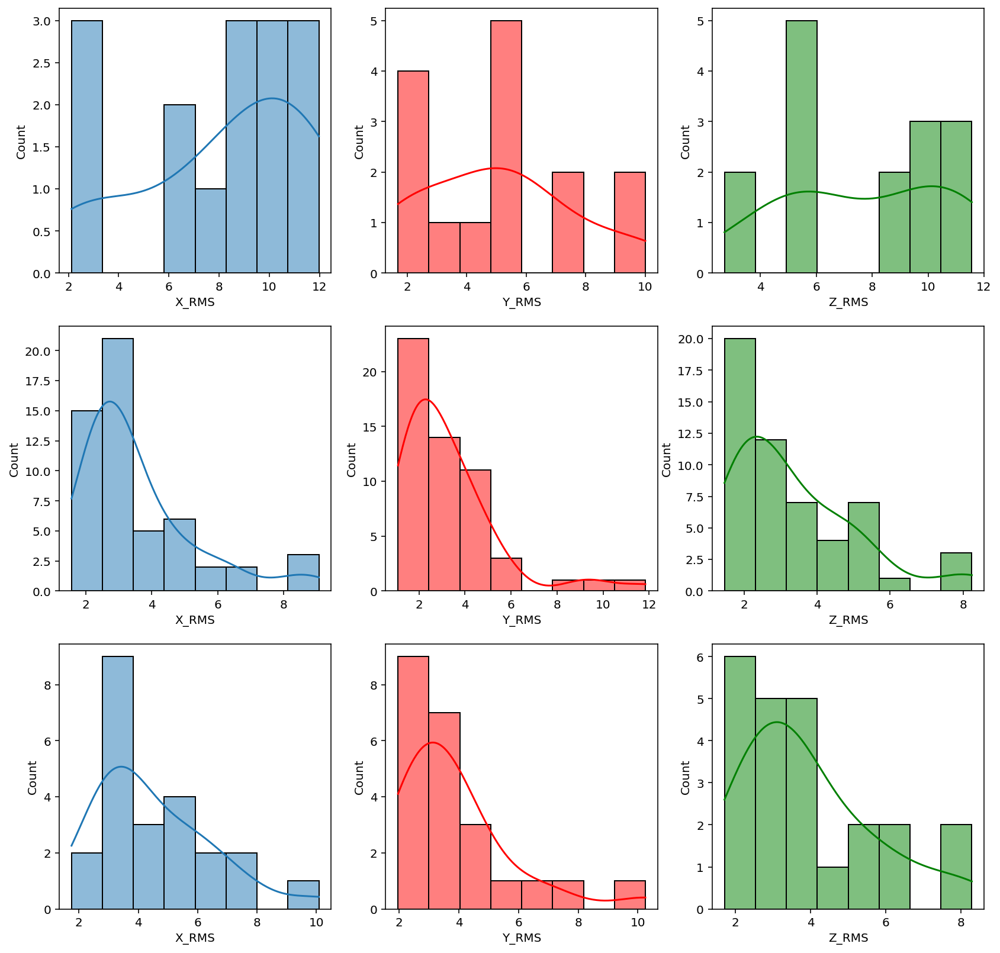

In [5]:
fig, axes = plt.subplots(3,3, figsize = (14,14))

sns.histplot(ax = axes[0,0], x = H_lat['X_RMS'] ,bins = 8,kde=True);

sns.histplot(ax = axes[0,1], x = H_lat['Y_RMS'] ,bins = 8,kde=True, color = 'red');

sns.histplot(ax = axes[0,2], x = H_lat['Z_RMS'] ,bins = 8,kde=True, color = 'green');

sns.histplot(ax = axes[1,0], x = M_lat['X_RMS'] ,bins = 8,kde=True);

sns.histplot(ax = axes[1,1], x = M_lat['Y_RMS'] ,bins = 8,kde=True, color = 'red');

sns.histplot(ax = axes[1,2], x = M_lat['Z_RMS'] ,bins = 8,kde=True, color = 'green');

sns.histplot(ax = axes[2,0], x = L_lat['X_RMS'] ,bins = 8,kde=True);

sns.histplot(ax = axes[2,1], x = L_lat['Y_RMS'] ,bins = 8,kde=True, color = 'red');

sns.histplot(ax = axes[2,2], x = L_lat['Z_RMS'] ,bins = 8,kde=True, color = 'green');

ValueError: If using all scalar values, you must pass an index

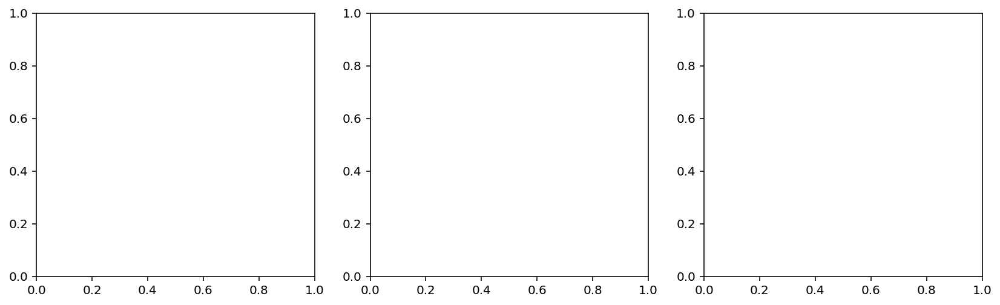

In [6]:
fig, axes = plt.subplots(1,3, figsize = (14,4))
sns.histplot(ax = axes[0],x = H_lat[['X_RMS','Y_RMS','Z_RMS']] ,bins = 10,kde=True);

sns.histplot(ax = axes[1],x = M_lat[['X_RMS','Y_RMS','Z_RMS']] ,bins = 10,kde=True);

sns.histplot(ax = axes[2],x = L_lat[['X_RMS','Y_RMS','Z_RMS']] ,bins = 10,kde=True);

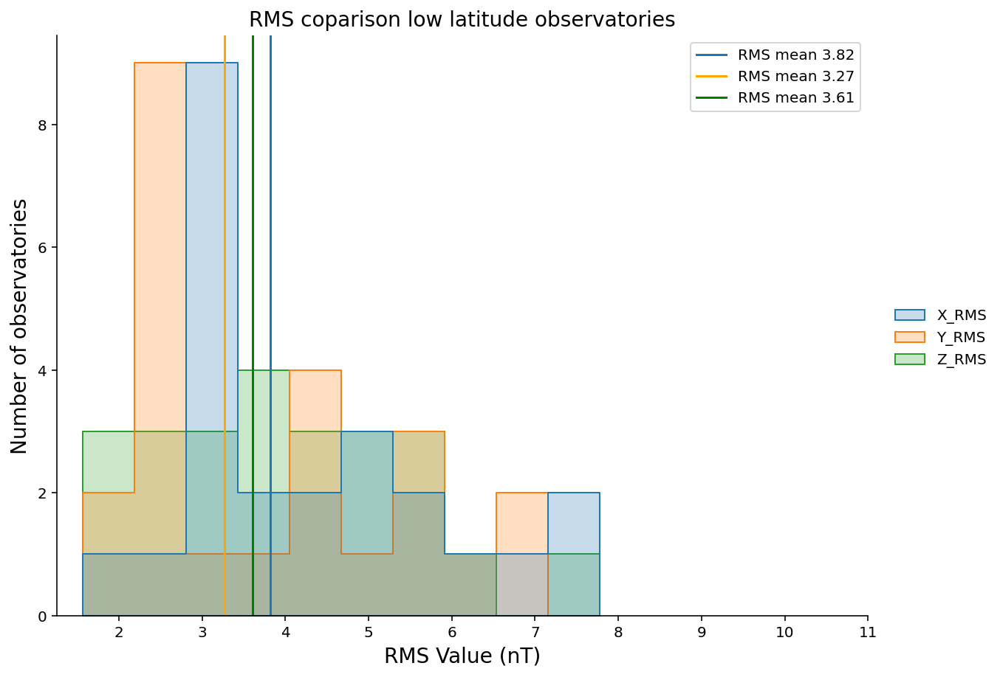

In [42]:
sns.displot(L_lat[['X_RMS','Y_RMS','Z_RMS']] ,bins = 10,kde=False,height=6, aspect=1.4, element="step");
            #element="step");
plt.axvline(L_lat['X_RMS'].median(), label = ('RMS mean ' + str(round(L_lat['X_RMS'].median(),2))))
plt.axvline(L_lat['Y_RMS'].median(), label = ('RMS mean ' + str(round(L_lat['Y_RMS'].median(),2))), color = 'orange')
plt.axvline(L_lat['Z_RMS'].median(), label = ('RMS mean ' + str(round(L_lat['Z_RMS'].median(),2))), color = 'green')
plt.xticks(np.arange(2,12,1))
plt.legend()
plt.title('RMS coparison low latitude observatories', fontsize = 14)
plt.xlabel('RMS Value (nT)', fontsize = 14)
plt.ylabel('Number of observatories', fontsize = 14)
plt.savefig('LOW_RMS.jpeg', dpi = 400,bbox_inches = 'tight')
plt.show()

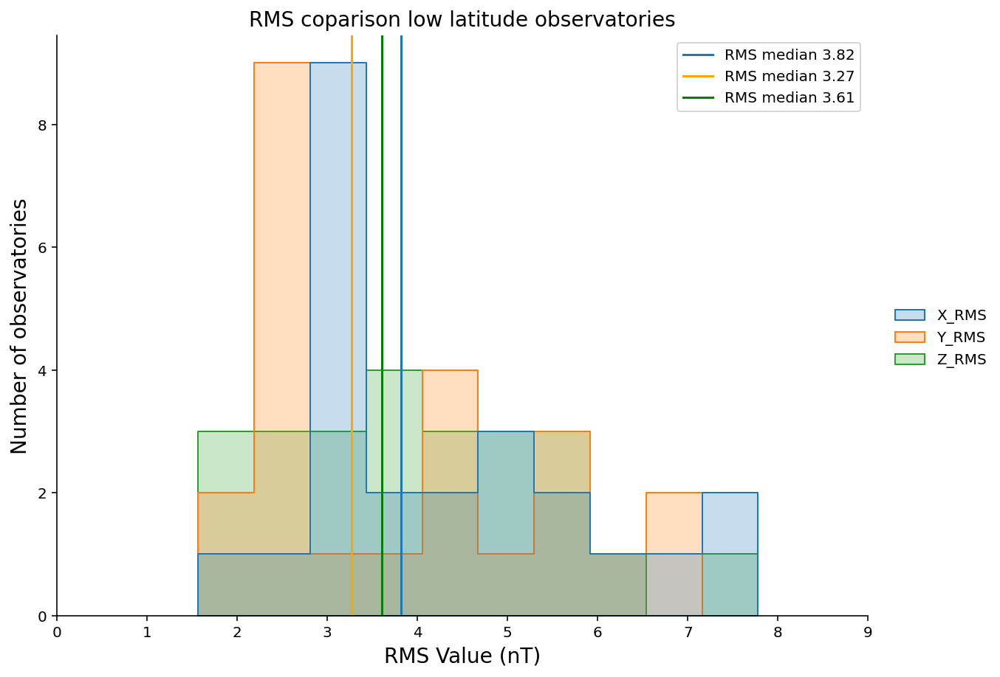

In [46]:
sns.displot(L_lat[['X_RMS','Y_RMS','Z_RMS']] ,bins = 10,kde=False,height=6, aspect=1.4, element="step");
            #element="step");
plt.axvline(L_lat['X_RMS'].median(), label = ('RMS median ' + str(round(L_lat['X_RMS'].median(),2))))
plt.axvline(L_lat['Y_RMS'].median(), label = ('RMS median ' + str(round(L_lat['Y_RMS'].median(),2))), color = 'orange')
plt.axvline(L_lat['Z_RMS'].median(), label = ('RMS median ' + str(round(L_lat['Z_RMS'].median(),2))), color = 'green')
plt.xticks(np.arange(0,10,1))
plt.legend()
plt.title('RMS coparison low latitude observatories', fontsize = 14)
plt.xlabel('RMS Value (nT)', fontsize = 14)
plt.ylabel('Number of observatories', fontsize = 14)
plt.savefig('LOW_RMS.jpeg', dpi = 300,bbox_inches = 'tight')
plt.show()

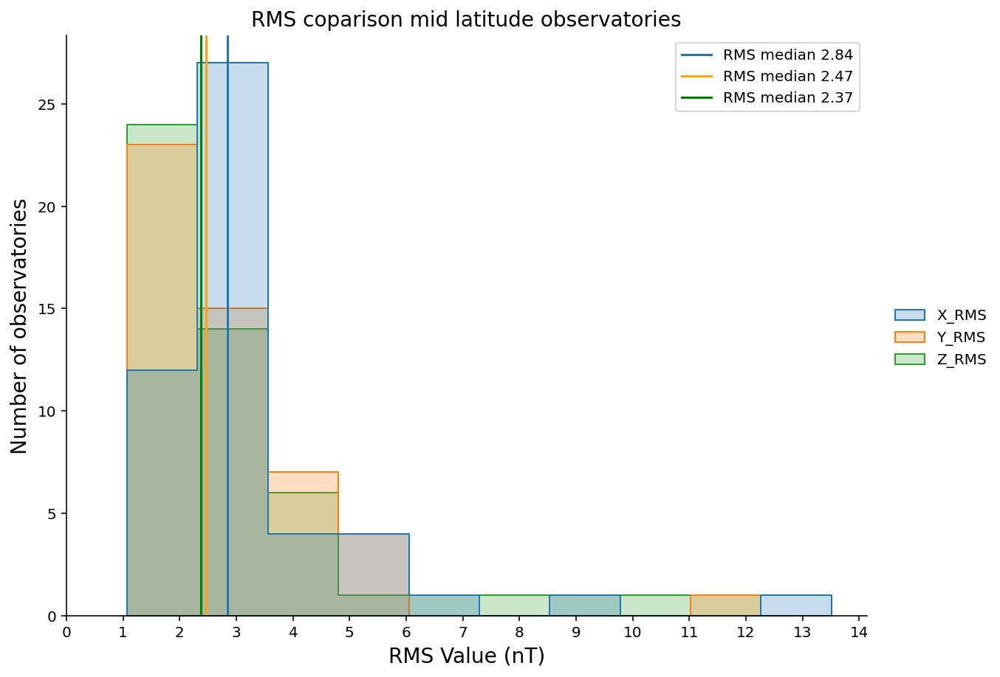

In [44]:
sns.displot(M_lat[['X_RMS','Y_RMS','Z_RMS']] ,bins = 10,kde=False,height=6, aspect=1.4, element="step");
            #element="step");
plt.axvline(M_lat['X_RMS'].median(), label = ('RMS median ' + str(round(M_lat['X_RMS'].median(),2))))
plt.axvline(M_lat['Y_RMS'].median(), label = ('RMS median ' + str(round(M_lat['Y_RMS'].median(),2))), color = 'orange')
plt.axvline(M_lat['Z_RMS'].median(), label = ('RMS median ' + str(round(M_lat['Z_RMS'].median(),2))), color = 'green')
plt.xticks(np.arange(0,15,1))
plt.legend()
plt.title('RMS coparison mid latitude observatories', fontsize = 14)
plt.xlabel('RMS Value (nT)', fontsize = 14)
plt.ylabel('Number of observatories', fontsize = 14)
plt.savefig('MID_RMS.jpeg', dpi = 300,bbox_inches = 'tight')
plt.show()

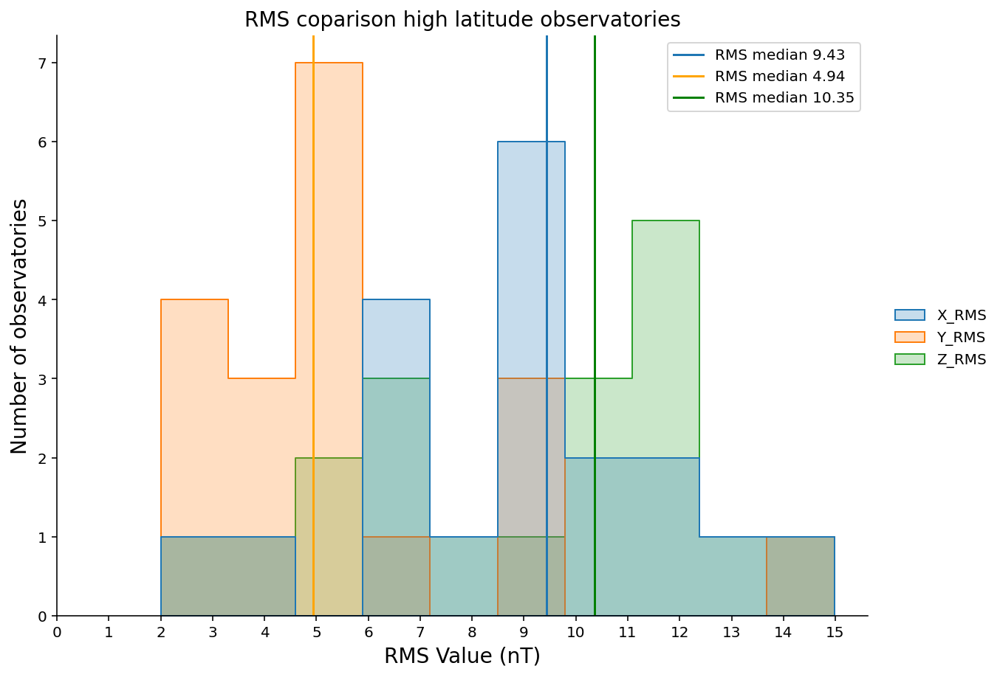

In [45]:
sns.displot(H_lat[['X_RMS','Y_RMS','Z_RMS']] ,bins = 10,kde=False,height=6, aspect=1.4, element="step");
            #element="step");
plt.axvline(H_lat['X_RMS'].median(), label = ('RMS median ' + str(round(H_lat['X_RMS'].median(),2))))
plt.axvline(H_lat['Y_RMS'].median(), label = ('RMS median ' + str(round(H_lat['Y_RMS'].median(),2))), color = 'orange')
plt.axvline(H_lat['Z_RMS'].median(), label = ('RMS median ' + str(round(H_lat['Z_RMS'].median(),2))), color = 'green')
plt.xticks(np.arange(0,16,1))
plt.legend()
plt.title('RMS coparison high latitude observatories', fontsize = 14)
plt.xlabel('RMS Value (nT)', fontsize = 14)
plt.ylabel('Number of observatories', fontsize = 14)
plt.savefig('HIGH_RMS.jpeg', dpi = 300,bbox_inches = 'tight')
plt.show()

ValueError: Length of list vectors must match length of `data` when both are used, but `data` has length 94 and the vector passed to `hue` has length 1.

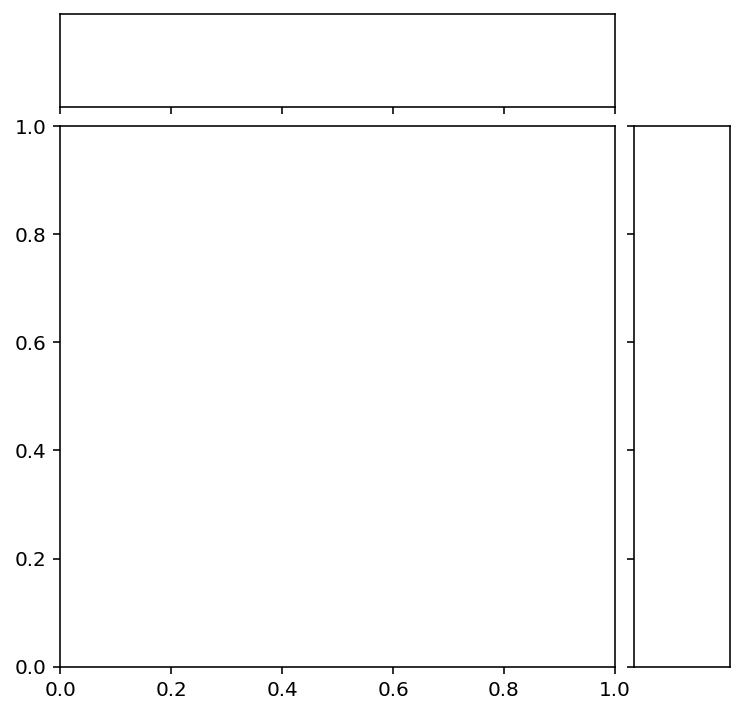

In [26]:
sns.jointplot(data=df_RMS, x="Longitude", y="Latitude", hue=[["X_RMS",'Y_RMS']],xlim = (-180,180),ylim = (-90,90))

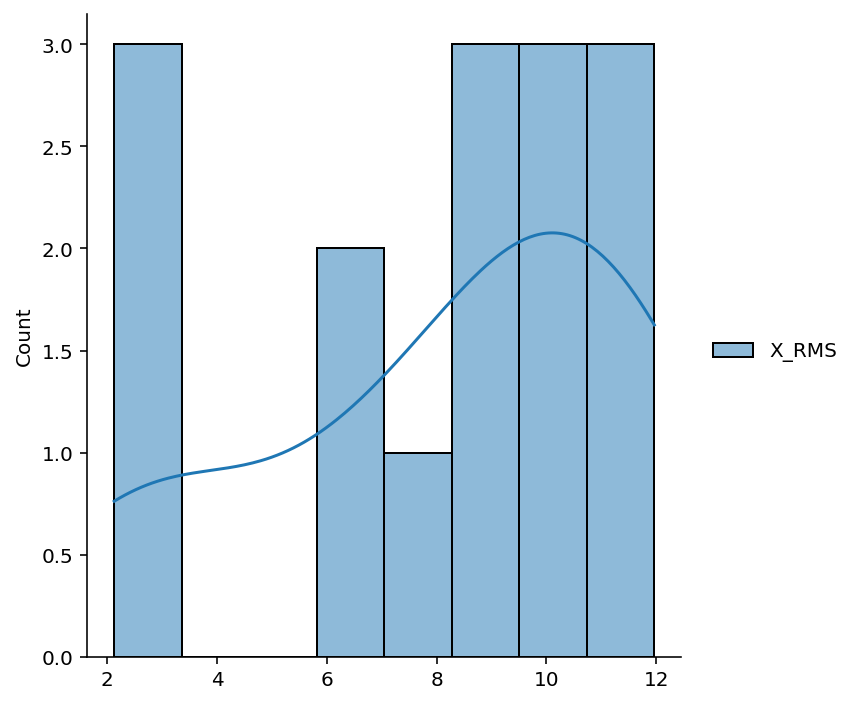

In [31]:
sns.displot(H_lat[['X_RMS']] ,bins = 8,kde=True);

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
#import geopandas as gpd

In [47]:
len(df_RMS)

115

In [62]:
x = []
for i in df_RMS.index:
    x.append(i)

In [71]:
len(x)

115

In [69]:
with open("imos_list.txt", "w") as output:
    for i in df_RMS.index: 
        output.write(i + ', ')

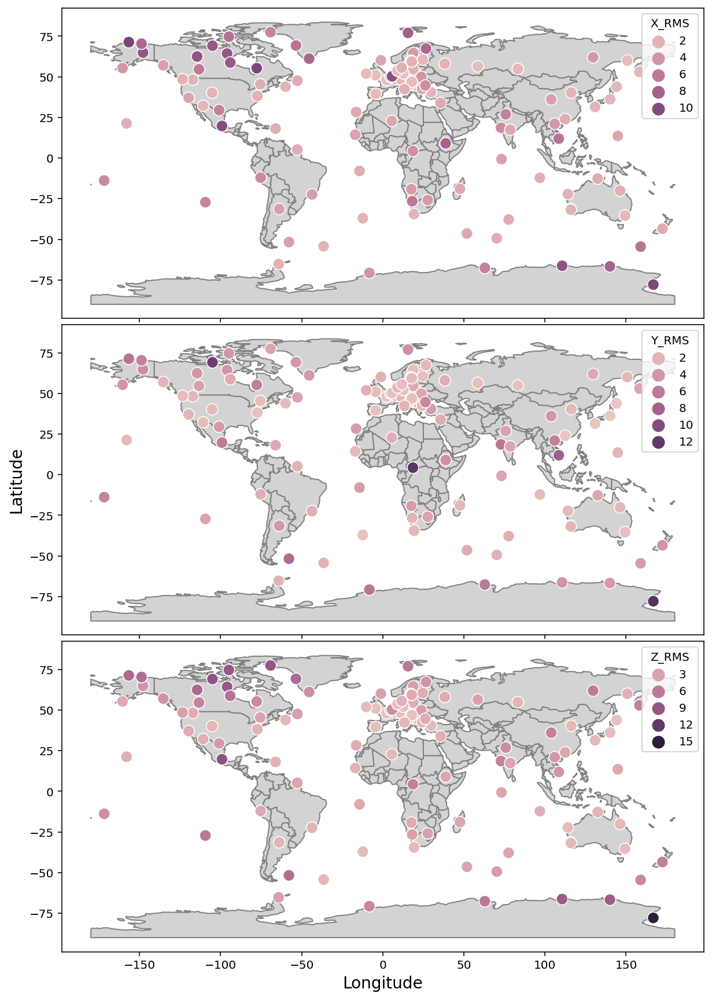

In [40]:
countries = gpd.read_file(
               gpd.datasets.get_path("naturalearth_lowres"))
countries.head()
fig, axes = plt.subplots(3, 1, figsize = (20,15), sharex = True, sharey = True)
plt.subplots_adjust(hspace=0.02)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
for ax, comp in zip(axes.flatten(), ['X_RMS','Y_RMS','Z_RMS']):
    countries.plot(color="lightgrey",
                   ax = ax,
                   edgecolor="grey")
    
    sns.scatterplot(ax = ax,
                    data=df_RMS,
                    x='Longitude',
                    y='Latitude', 
                    alpha=1,
                    hue=comp,
                    hue_norm =(0,15),
                    size = comp,
                    sizes=(100, 100))
axes[1].set_ylabel(ylabel = 'Latitude',
                   fontsize = 14)
axes[2].set_xlabel(xlabel = 'Longitude',
                   fontsize = 14)
axes[0].set(ylabel=None)
axes[2].set(ylabel=None)
    #ax.legend( title='SV_X RMSe')

#plt.title('RMS distribution for XYZ - INTERMAGNET observatories')
plt.savefig('RMS_distribution_XYZ.jpeg', dpi = 300, bbox_inches = 'tight')
plt.show()
#worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

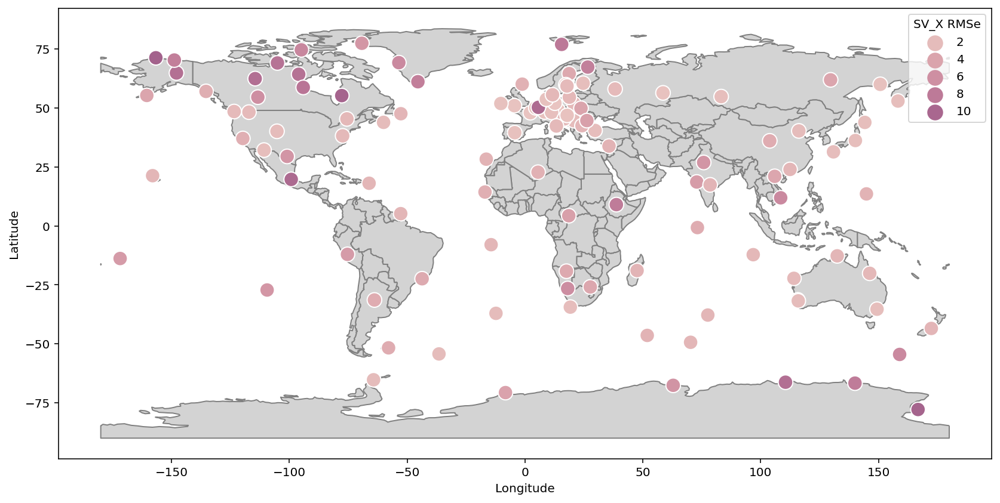

In [4]:
countries = gpd.read_file(
               gpd.datasets.get_path("naturalearth_lowres"))
countries.head()
fig, ax = plt.subplots(1, figsize = (14,7))
countries.plot(color="lightgrey",ax = ax,edgecolor="grey")

sns.scatterplot(ax = ax,
                data=df_RMS,
                x='Longitude',
                y='Latitude', 
                alpha=1,
                hue='X_RMS',
                hue_norm =(0,20),
                size = 'X_RMS',
                sizes=(150, 150))
ax.legend( title='SV_X RMSe')

#plt.title('RMS distribution for X component - INTERMAGNET observatories')
#plt.savefig('map_x_rms.jpeg', dpi = 300, bbox_inches = 'tight')
plt.show()
#worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

In [49]:
plt.figure(figsize = (12,12))
ax = plt.axes(projection=ccrs.Robinson(central_longitude=0, globe=None))

sns.scatterplot(ax = ax,data=df_RMS, x='Longitude', y='Latitude', 
                alpha=1, hue='X_RMS', size = 'X_RMS',sizes=(150, 150),transform = ccrs.PlateCarree())
ax.coastlines()

NameError: name 'ccrs' is not defined

<Figure size 864x864 with 0 Axes>

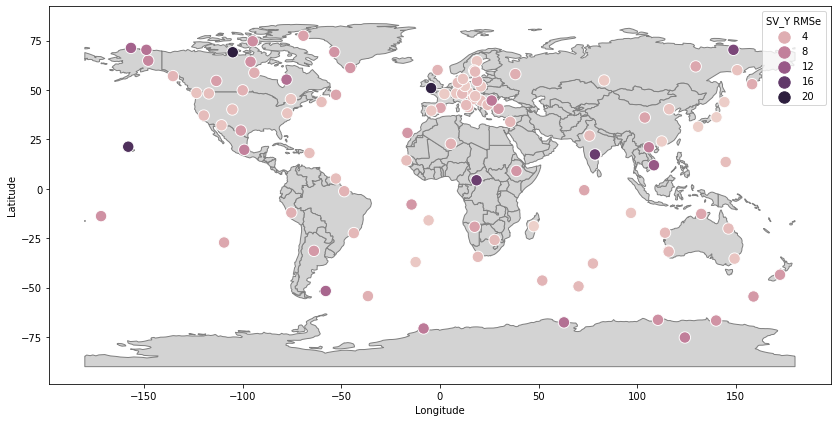

In [36]:
countries = gpd.read_file(
               gpd.datasets.get_path("naturalearth_lowres"))
countries.head()
fig, ax = plt.subplots(1, figsize = (14,7))
countries.plot(color="lightgrey",ax = ax,edgecolor="grey")

sns.scatterplot(ax = ax,
                data=df_RMS,
                x='Longitude',
                y='Latitude', 
                alpha=1,
                hue='Y_RMS',
                hue_norm =(1,20),
                size = 'Y_RMS',
                sizes=(130, 130),
               legend = 'auto')
ax.legend( title='SV_Y RMSe')

#plt.title('RMS distribution for X component - INTERMAGNET observatories')
plt.savefig('map_y_rms.jpeg', dpi = 300, bbox_inches = 'tight')
plt.show()
#worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

In [41]:
df_RMS_n.median()

X_RMS        13.297
Y_RMS         4.383
Z_RMS         7.709
Latitude     36.232
Longitude    14.020
dtype: float64

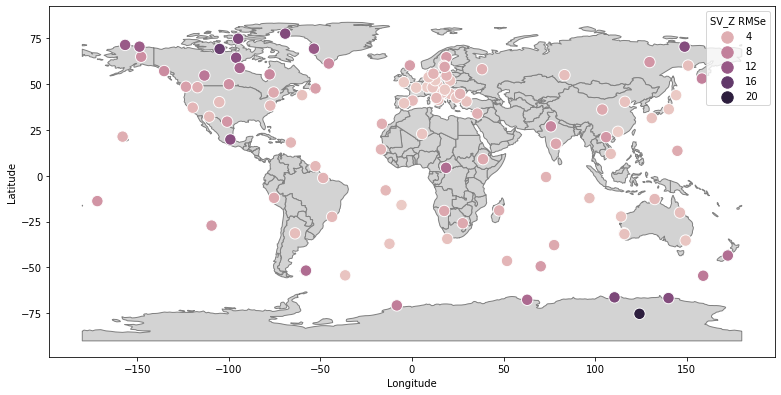

In [37]:
countries = gpd.read_file(
               gpd.datasets.get_path("naturalearth_lowres"))
countries.head()
fig, ax = plt.subplots(1, figsize = (13,7))
countries.plot(color="lightgrey",ax = ax,edgecolor="grey")

sns.scatterplot(ax = ax,
                data=df_RMS,
                x='Longitude',
                y='Latitude', 
                alpha=1,
                hue='Z_RMS',
                hue_norm =(1,20),
                size = 'Z_RMS',
                sizes=(130, 130))
ax.legend( title='SV_Z RMSe')

#plt.title('RMS distribution for X component - INTERMAGNET observatories')
plt.savefig('map_z_rms.jpeg', dpi = 300, bbox_inches = 'tight')
plt.show()
#worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

In [14]:
(M_lat[['X_RMS','Y_RMS','Z_RMS']].std())

X_RMS    2.038333
Y_RMS    1.801680
Z_RMS    2.244577
dtype: float64

In [15]:
L_lat[['X_RMS','Y_RMS','Z_RMS']].std()

X_RMS    1.565082
Y_RMS    1.586043
Z_RMS    1.526290
dtype: float64

In [16]:
H_lat[['X_RMS','Y_RMS','Z_RMS']].std()

X_RMS    3.055722
Y_RMS    3.016415
Z_RMS    3.413927
dtype: float64

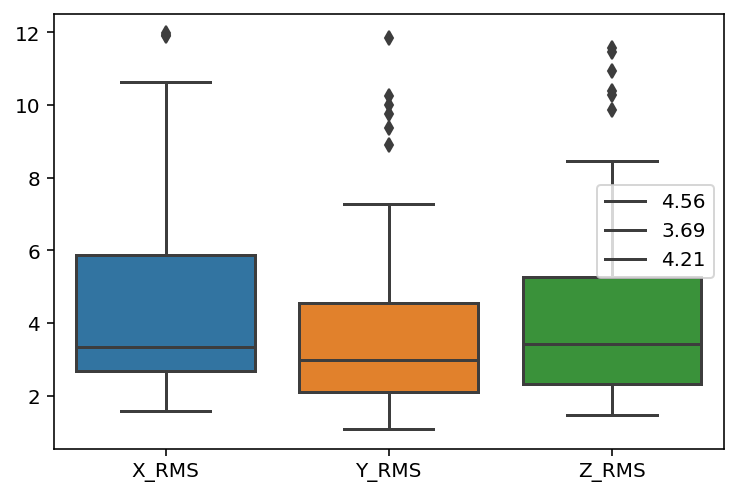

In [77]:
sns.boxplot(data=df_RMS[['X_RMS','Y_RMS','Z_RMS']])
plt.legend(round(df_RMS[['X_RMS','Y_RMS','Z_RMS']].mean(),2))

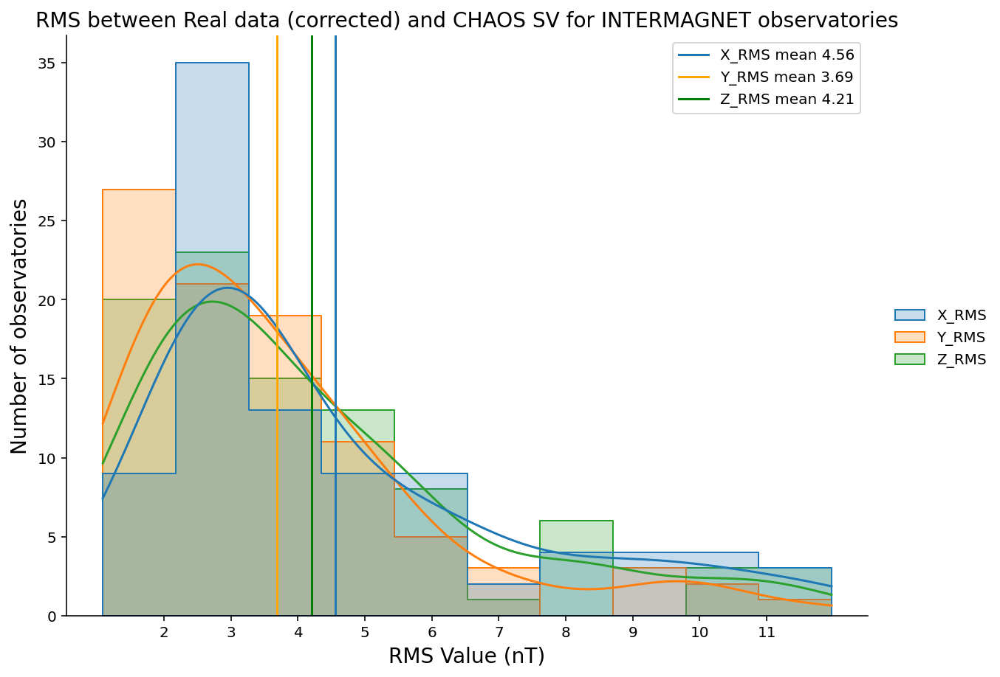

In [6]:
sns.displot(df_RMS[['X_RMS','Y_RMS','Z_RMS']] ,bins = 10,kde=True,height=6, aspect=1.4, element="step");
            #element="step");
plt.axvline(df_RMS['X_RMS'].mean(), label = ('X_RMS mean ' + str(round(df_RMS['X_RMS'].mean(),2))))
plt.axvline(df_RMS['Y_RMS'].mean(), label = ('Y_RMS mean ' + str(round(df_RMS['Y_RMS'].mean(),2))), color = 'orange')
plt.axvline(df_RMS['Z_RMS'].mean(), label = ('Z_RMS mean ' + str(round(df_RMS['Z_RMS'].mean(),2))), color = 'green')
plt.xticks(np.arange(2,12,1))
plt.legend()
plt.title('RMS between Real data (corrected) and CHAOS SV for INTERMAGNET observatories', fontsize = 14)
plt.xlabel('RMS Value (nT)', fontsize = 14)
plt.ylabel('Number of observatories', fontsize = 14)
plt.show()

Reading files from NGK...
Initiating geomagnetic field computation for NGK.
Computing core field.
Computing crustal field up to degree 70.
Computing field due to external sources, incl. induced field: GSM.
Computing field due to external sources, incl. induced field: SM.


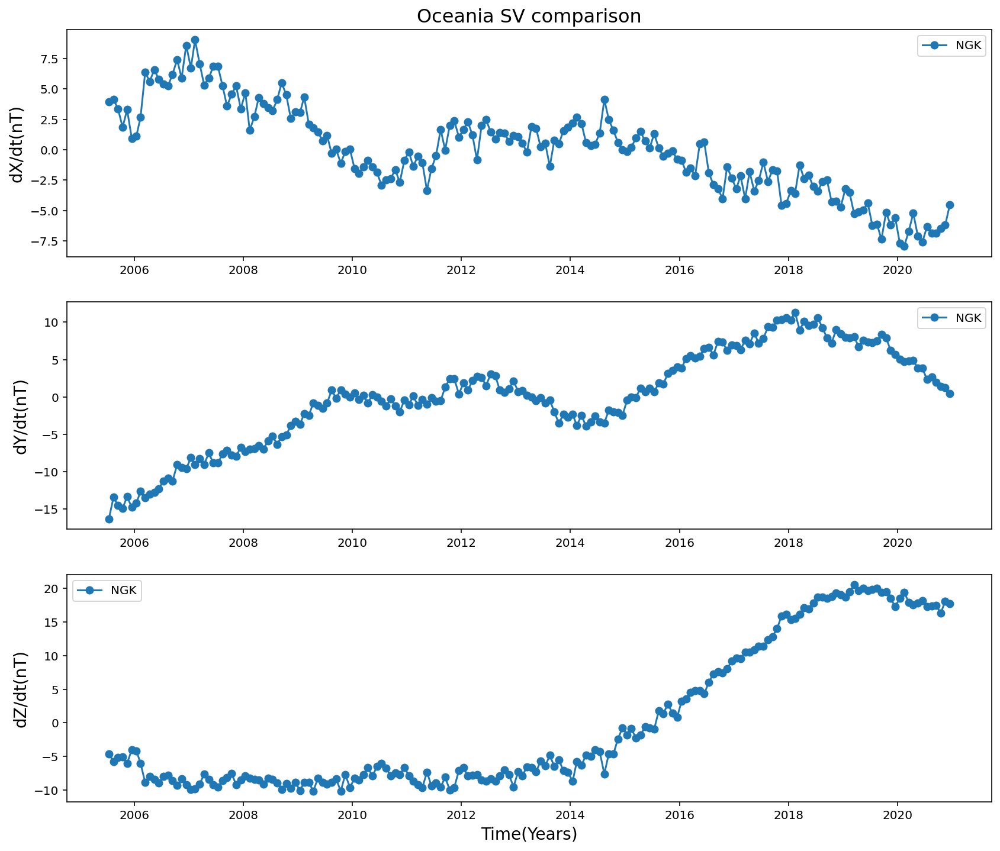

In [12]:
starttime = '2005-01-01'
endtime = '2021-06-30'
#europe
stations = ['NGK']
            #,'BEL','DOU','FUR']

#North America
#stations = ['FRD','OTT','BOU','TUC']

#Oceania

#stations = ['CNB','CTA','ASP','LRM']


fig,ax = plt.subplots(3,1, figsize = (14,12))

ax[0].set_ylabel('dX/dt(nT)',fontsize = 14)
ax[1].set_ylabel('dY/dt(nT)',fontsize = 14)
ax[2].set_ylabel('dZ/dt(nT)',fontsize = 14)
plt.xlabel('Time(Years)', fontsize =14)
ax[0].set_title('Oceania SV comparison', fontsize = 16)


for station in stations:

    df_OBS = mvs.load_obs_files_OTIMIZADA(station = station,
                                 starttime = starttime,
                                 endtime = endtime)
    
    df_OBS_Corrected, df_CHAOS = mvs.external_field_correction_chaos_model(station= station,
                                              starttime = starttime,
                                              endtime = endtime,
                                              df_station = df_OBS,
                                              df_chaos = None)
    
    df_OBS_SV = mvs.calculate_SV(dataframe = df_OBS_Corrected,
                                 starttime = starttime,
                                 endtime = endtime,
                                 info = 'ADMM',
                                 columns = None)
    
    
    
    ax[0].plot(df_OBS_SV['X'] - df_OBS_SV['X'].mean(), 'o-', label = str(station))
    ax[1].plot(df_OBS_SV['Y'] - df_OBS_SV['Y'].mean(), 'o-', label = str(station))
    ax[2].plot(df_OBS_SV['Z'] - df_OBS_SV['Z'].mean(), 'o-', label = str(station))
    
    #df_CHAOS_SV = mvs.calculate_SV(dataframe = df_CHAOS,
    #                             starttime = starttime,
    #                             endtime = endtime,
    #                             info = 'ADMM',
    #                             columns = ['X_int','Y_int','Z_int'])
    #
ax[0].legend()
ax[1].legend()
ax[2].legend()

In [11]:

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures

In [58]:
df_OBS_SV['X'].size

186

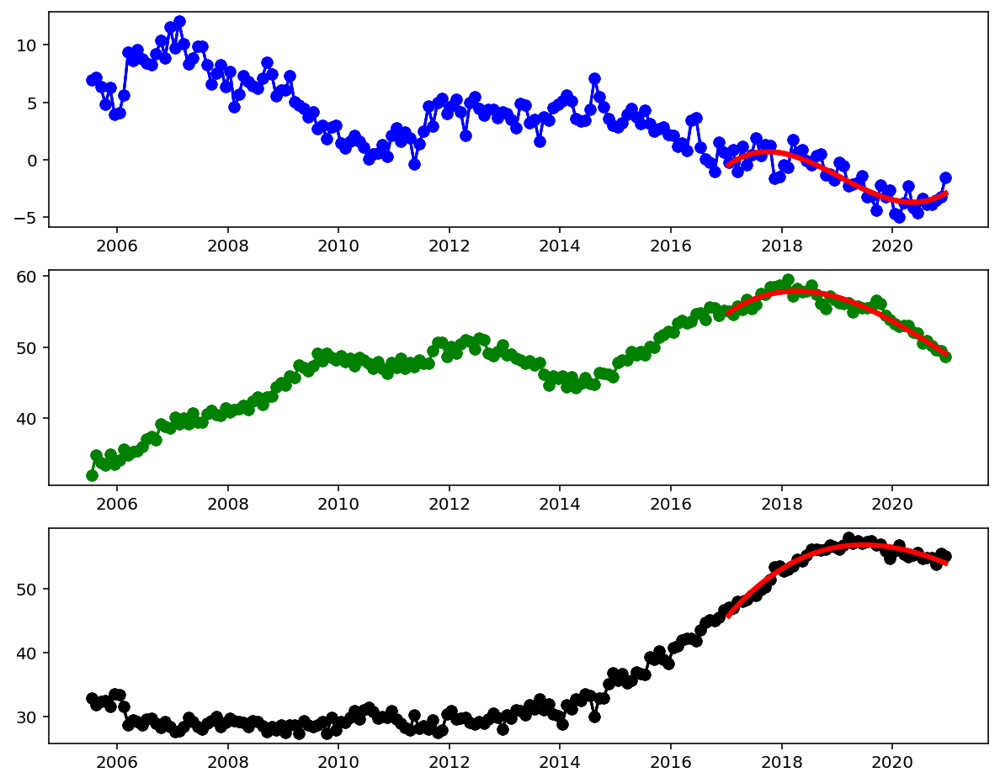

In [145]:
start_window = '2017'
end_window = '2020'

t = np.arange(0,df_OBS_SV.loc['2017':'2020']['Z'].size).reshape(-1,1)


y_poly_pred = pd.DataFrame()

for column in df_OBS_SV:

    polynomial_features= PolynomialFeatures(degree=3)
    x_poly = polynomial_features.fit_transform(t)
    
    model = LinearRegression()
    model.fit(x_poly, df_OBS_SV[column].loc[start_window:end_window])
    y_poly_pred[column] = model.predict(x_poly)
    
fig,ax = plt.subplots(3,1,figsize = (10,8))  

for column in df_OBS_SV:    
      
    ax[0].plot(df_OBS_SV['X'],'o-',color = 'blue')
    ax[0].plot(df_OBS_SV['X'].loc[start_window:end_window].index,
         y_poly_pred['X'],
         color = 'red',linewidth = 3)
    
    ax[1].plot(df_OBS_SV['Y'],'o-',color = 'green')
    ax[1].plot(df_OBS_SV['Y'].loc[start_window:end_window].index,
         y_poly_pred["Y"],
         color = 'red',linewidth = 3)
    
    ax[2].plot(df_OBS_SV['Z'],'o-',color = 'black')
    ax[2].plot(df_OBS_SV['Z'].loc[start_window:end_window].index,
         y_poly_pred["Z"],
         color = 'red',linewidth = 3)

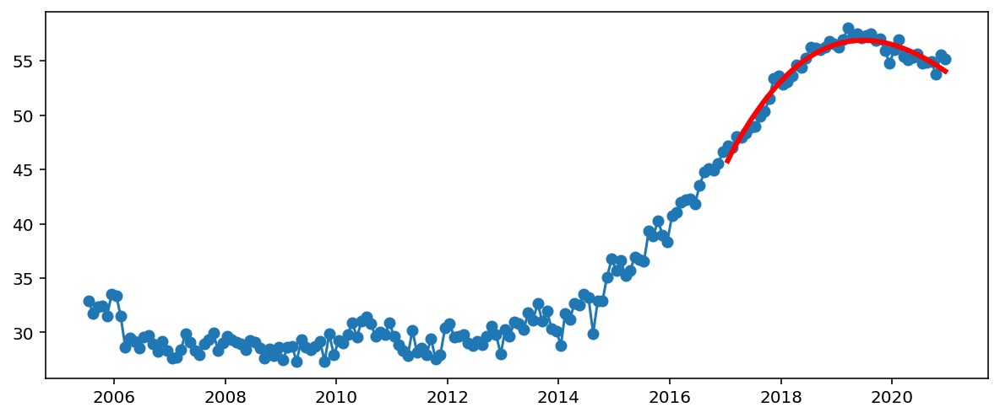

In [109]:
plt.figure(figsize = (10,4))
plt.plot(df_OBS_SV['Z'],'o-')
plt.plot(df_OBS_SV['2017':'2020']['Z'].index,y_poly_pred, color = 'red',linewidth = 3)

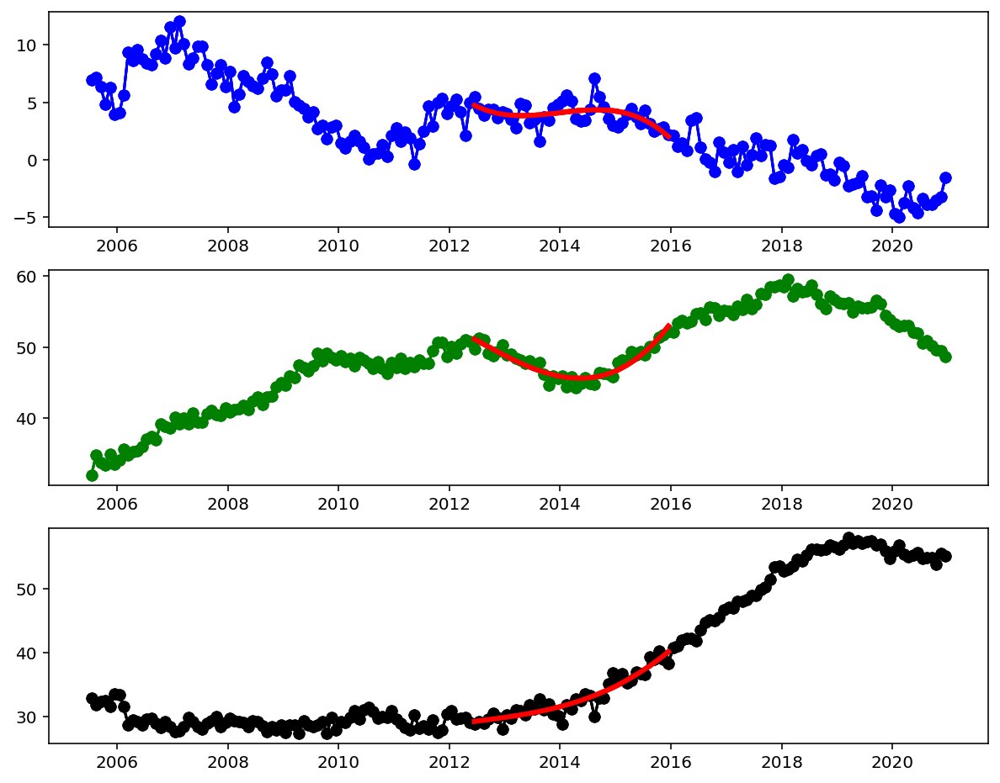

In [146]:
start_window = '2012-06-01'
end_window = '2015'

t = np.arange(0,df_OBS_SV.loc[start_window:end_window]['Z'].size).reshape(-1,1)


y_poly_pred = pd.DataFrame()

for column in df_OBS_SV:

    polynomial_features= PolynomialFeatures(degree=3)
    x_poly = polynomial_features.fit_transform(t)
    
    model = LinearRegression()
    model.fit(x_poly, df_OBS_SV[column].loc[start_window:end_window])
    y_poly_pred[column] = model.predict(x_poly)
    
fig,ax = plt.subplots(3,1,figsize = (10,8))  

for column in df_OBS_SV:    
      
    ax[0].plot(df_OBS_SV['X'],'o-',color = 'blue')
    ax[0].plot(df_OBS_SV['X'].loc[start_window:end_window].index,
         y_poly_pred['X'],
         color = 'red',linewidth = 3)
    
    ax[1].plot(df_OBS_SV['Y'],'o-',color = 'green')
    ax[1].plot(df_OBS_SV['Y'].loc[start_window:end_window].index,
         y_poly_pred["Y"],
         color = 'red',linewidth = 3)
    
    ax[2].plot(df_OBS_SV['Z'],'o-',color = 'black')
    ax[2].plot(df_OBS_SV['Z'].loc[start_window:end_window].index,
         y_poly_pred["Z"],
         color = 'red',linewidth = 3)

In [35]:
def polynomial_jerk_detection(station, window_start, 
                              window_end, 
                              starttime, 
                              endtime,
                              df_station = None,
                              read_txt_SV: bool = False,
                              plot_detection: bool = True,
                              CHAOS_correction: bool = True):
    
    station = station
    window_start = window_start
    window_end = window_end
    starttime = starttime
    endtime = endtime
    
    if read_txt_SV is True:
        
        df_SV = read_txt_SV(station = station, starttime = starttime, endtime = endtime)
        df_station = []
        
    elif df_station is not None and read_txt_SV is False:
        
        df_station = df_station
        
        
    else:
        
        df_station = mvs.load_obs_files_OTIMIZADA(station = station, starttime = starttime, endtime = endtime)
        
        
    if CHAOS_correction == True:
        
        df_station, df_chaos = mvs.external_field_correction_chaos_model(station = station,
                                                  starttime = starttime,
                                                  endtime = endtime,
                                                  df_station = df_station,
                                                  df_chaos = None)
        
    else:
        pass
    
    #calculating SV
    
    
    #starting with polynomial jerk detection
    
    t = np.arange(0,df_SV.loc[window_start:window_end].size/3).reshape(-1,1)
    jerk_prediction = pd.DataFrame()
    jerk_prediction.index = df_SV.loc[window_start:window_end].index
    
    for column in df_SV:

        polynomial_features= PolynomialFeatures(degree=3)
        x_poly = polynomial_features.fit_transform(t)
        
        model = LinearRegression()
        model.fit(x_poly, df_SV[column].loc[window_start:window_end])
        jerk_prediction[column] = model.predict(x_poly)
        
    if plot_detection == True:
        colors = ['blue','green','black']
        fig, axes = plt.subplots(3,1,figsize = (10,8))
        plt.suptitle(station.upper() +' secular variation', fontsize = 14, y = 0.92)
        plt.xlabel('Date (Years)', fontsize = 12)
        
        for col, ax, color in zip(df_SV.columns, axes.flatten(), colors):
            ax.plot(df_SV[col],'o-',color = color)
            ax.plot(df_SV[col].loc[window_start:window_end].index,
                    jerk_prediction[col],color = 'red', linewidth = 3, label = '3rd order polynomial')
            ax.set_ylabel('d' + col.upper() +'/dt (nT)', fontsize = 12)
            ax.legend()
        plt.savefig('NGK_detection.jpeg', bbox_inches='tight', dpi = 1000)
        
        fig, axes = plt.subplots(3,1,figsize = (5,12))
        plt.suptitle(station.upper() +' secular variation', fontsize = 14, y = 0.90)
        #fig.text(0.5, 0.01, 'Date (Years)', ha='center', fontsize = 14)
        fig.text(0.5, 0.08, 'Date (Years)', ha='center', fontsize = 14)
     
        upper_limit = int(str(datetime.strptime(window_end ,'%Y-%m-%d'))[0:4]) +1
        lower_limit = int(str(datetime.strptime(window_start ,'%Y-%m-%d'))[0:4]) -1

        for col, ax, color in zip(df_SV.columns, axes.flatten(), colors):
            ax.plot(df_SV[col].loc[str(lower_limit):str(upper_limit)],'o-',color = color)
            ax.plot(jerk_prediction[col],color = 'red', linewidth = 3)
            ax.set_ylabel('d' + col.upper() +'/dt (nT)', fontsize = 12)
        plt.savefig('NGK_detection2.jpeg', bbox_inches='tight', dpi = 1000)    
        
        
    else:
        pass
        
    return df_SV, jerk_prediction  

In [88]:
start_window = '2012-06-01'

lower_limit = int(str(datetime.strptime(end_window ,'%Y-%m-%d'))[0:4]) -1
upper_limit = int(str(datetime.strptime(start_window ,'%Y-%m-%d'))[0:4]) +1


NameError: name 'end_window' is not defined

In [76]:
timedelta()

NameError: name 'timedelta' is not defined

In [88]:
if all(x is not None for x in[df_station, starttime, endtime]):

144

In [25]:
df_NGK = mvs.load_obs_files_OTIMIZADA(station = 'NGK', starttime = '2005-01-01', endtime = '2021-06-30')

Reading files from NGK...


Initiating geomagnetic field computation for NGK.
Computing core field.
Computing crustal field up to degree 70.
Computing field due to external sources, incl. induced field: GSM.
Computing field due to external sources, incl. induced field: SM.


(                X       Y       Z
 Date                             
 2005-07-16  6.944  31.907  32.903
 2005-08-16  7.134  34.790  31.767
 2005-09-15  6.333  33.681  32.333
 2005-10-16  4.837  33.321  32.424
 2005-11-15  6.278  34.864  31.489
 ...           ...     ...     ...
 2020-08-16 -3.876  50.872  54.892
 2020-09-15 -3.879  50.184  54.961
 2020-10-16 -3.478  49.593  53.791
 2020-11-15 -3.226  49.477  55.602
 2020-12-16 -1.537  48.625  55.187
 
 [186 rows x 3 columns],
                    X          Y          Z
 Date                                      
 2012-06-15  4.729922  51.113315  29.198293
 2012-07-16  4.543870  50.750374  29.291530
 2012-08-16  4.383184  50.388995  29.385152
 2012-09-15  4.246405  50.030545  29.479743
 2012-10-16  4.132075  49.676395  29.575883
 2012-11-15  4.038736  49.327912  29.674155
 2012-12-16  3.964930  48.986466  29.775141
 2013-01-16  3.909200  48.653424  29.879422
 2013-02-13  3.870086  48.330157  29.987582
 2013-03-16  3.846132  48.018032  

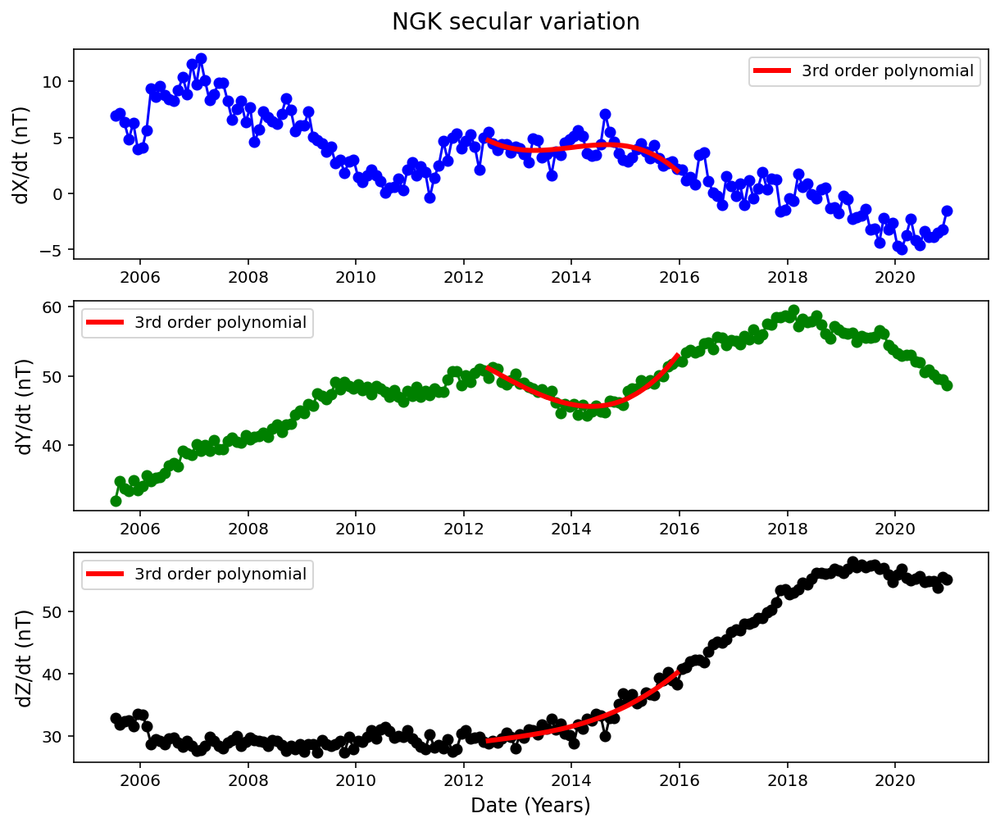

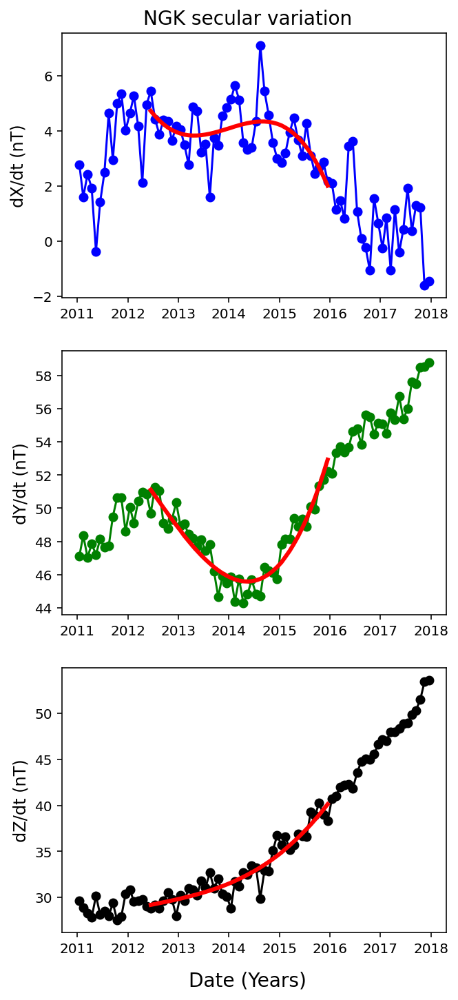

In [36]:
polynomial_jerk_detection(station = 'NGK', 
                          window_start = '2012-06-15',
                          window_end = '2016-01-01',
                          starttime = '2005-01-01' ,
                          endtime = '2021-06-30',
                          df_station = df_NGK,
                          plot_detection = True,
                          CHAOS_correction = True)

2.5

In [120]:
def validate(str_date):
    try:
        datetime.strptime(str_date, '%Y-%m-%d')
    except ValueError:
        raise ValueError("Incorrect date format, should be YYYY-MM-DD")

In [122]:
validate('2021-01-31')

In [2]:
df = mvs.load_INTERMAGNET_files('VSS','2015-01-01','2021-12-31')

Reading files from VSS...


In [3]:
df

,X,Y,Z
Date,,,
2015-01-01 00:00:00,16897.00,-6987.50,-14426.50
2015-01-01 00:01:00,16897.60,-6987.60,-14426.50
2015-01-01 00:02:00,16898.00,-6987.60,-14426.40
2015-01-01 00:03:00,16898.30,-6987.50,-14426.50
2015-01-01 00:04:00,16898.20,-6987.50,-14426.50
...,...,...,...
2021-12-31 23:55:00,16242.50,-6863.53,-15182.93
2021-12-31 23:56:00,16242.29,-6863.58,-15183.04
2021-12-31 23:57:00,16241.96,-6863.66,-15183.10


In [11]:
class read_files:

    def __init__(self, station, starttime, endtime):
        self.station = station
        self.starttime = starttime
        self.endtime = endtime
    
        
        
    return mvs.load_INTERMAGNET_files(station,starttime,endtime)
    
#a = MyClass(my_dataframe)
#b = MyClass(my_dataframe)

SyntaxError: 'return' outside function (1702419180.py, line 10)

In [10]:
a = read_files('VSS','2010-01-01','2015-12-31')

Reading files from VSS...


TypeError: __init__() should return None, not 'DataFrame'

In [6]:
df_RMS

,X_RMS,Y_RMS,Z_RMS,Latitude,Longitude
ABG,5.382,6.568,5.360,18.638,72.872
API,5.702,6.206,6.418,-13.815,-171.781
ABK,11.237,2.585,5.988,68.358,18.823
ASC,3.924,5.849,3.682,-7.950,-14.380
BDV,2.287,1.391,2.624,49.080,14.020
...,...,...,...,...,...
VSS,3.372,2.765,1.965,-22.400,-43.650
WNG,1.815,2.449,1.628,53.725,9.053
YAK,6.071,4.522,6.144,61.960,129.660
LZH,4.995,5.414,3.534,36.087,103.845


In [2]:
df_RMS = pd.read_csv('RMS_new_2.txt', sep = ' ', usecols = [0,1,2,3], index_col = [0] )

In [11]:
station = 'NGK'
path = f'RMS_figures/{station}_RMS_MAP.jpeg'
os.path.isfile(path)

True

Reading files from ABK...
Initiating geomagnetic field computation for ABK.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


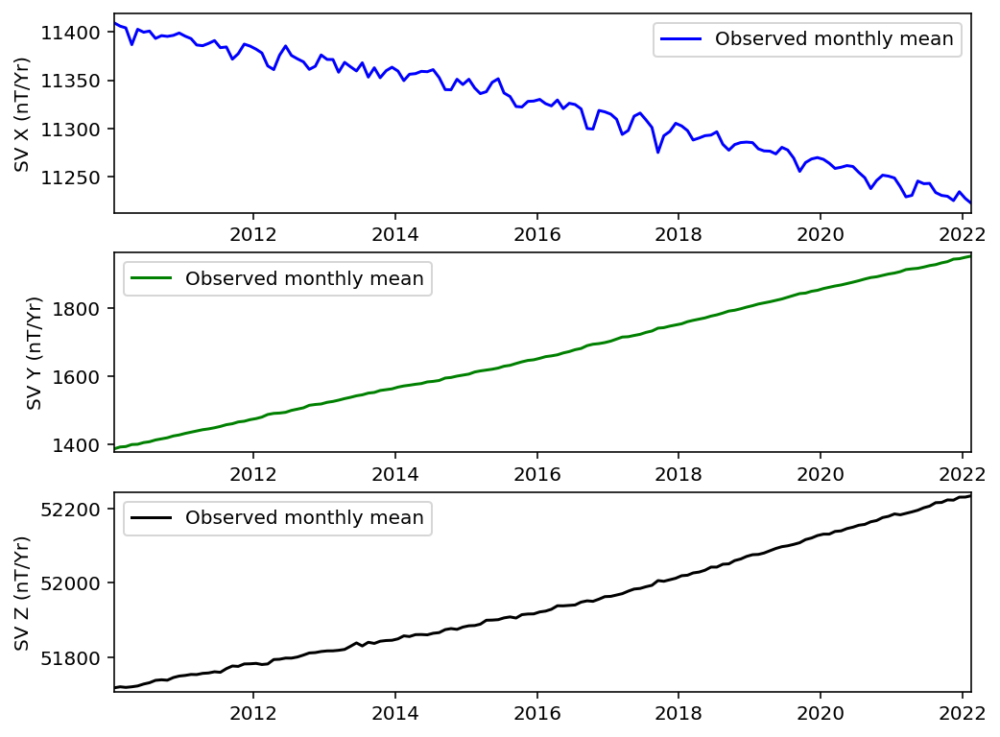

Reading files from BDV...
Initiating geomagnetic field computation for BDV.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


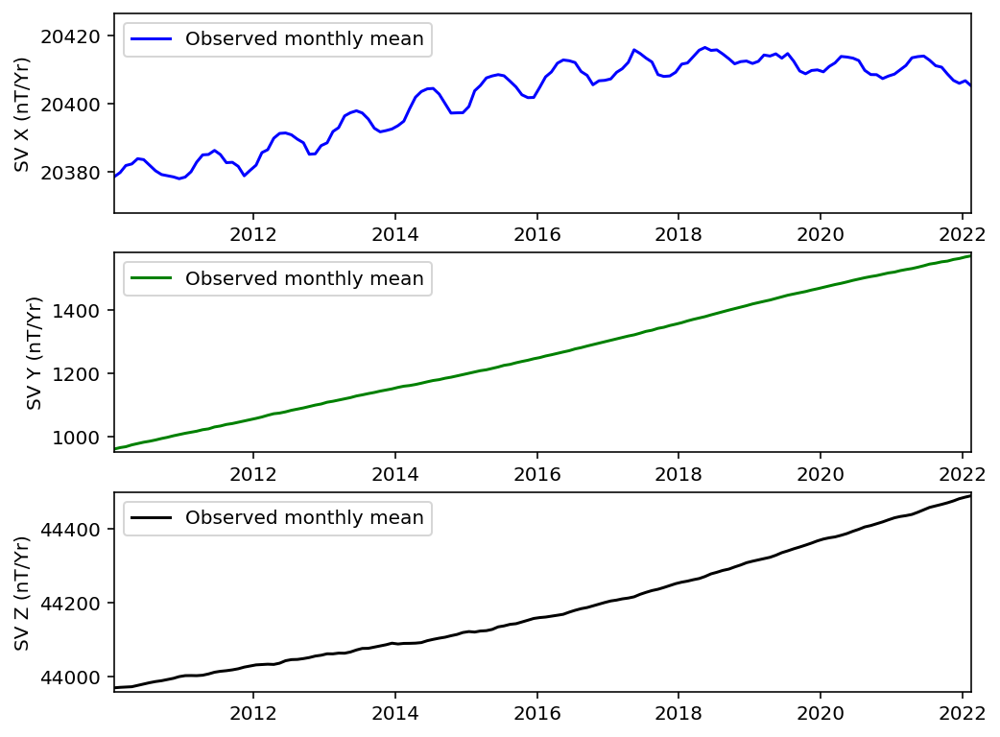

Reading files from BEL...
Initiating geomagnetic field computation for BEL.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


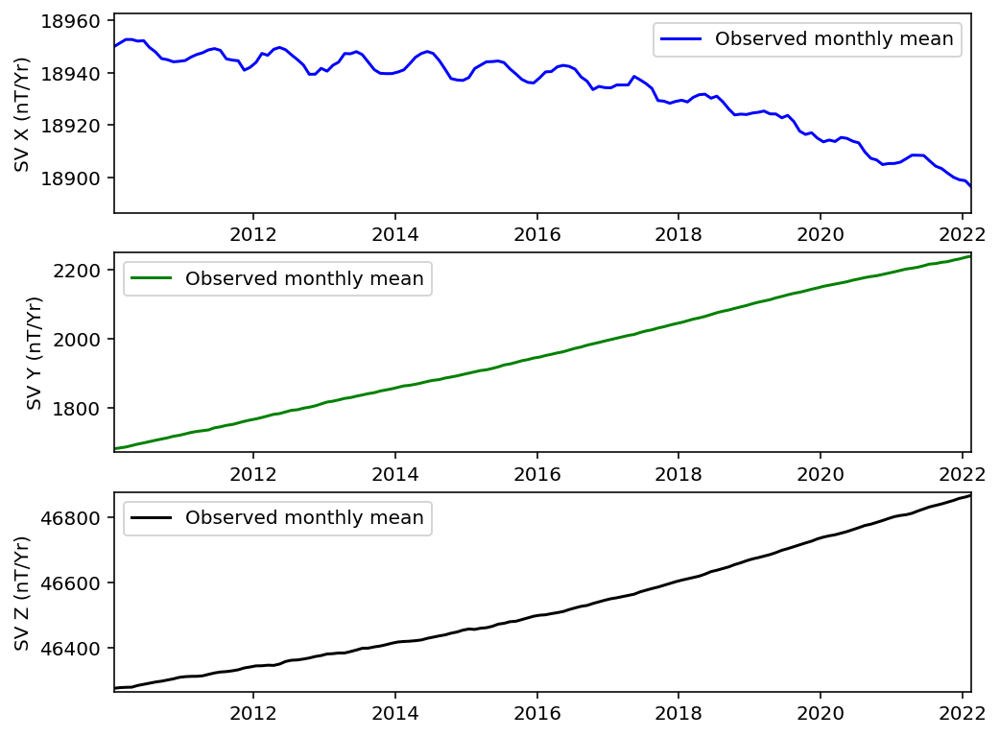

Reading files from BFO...
Initiating geomagnetic field computation for BFO.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


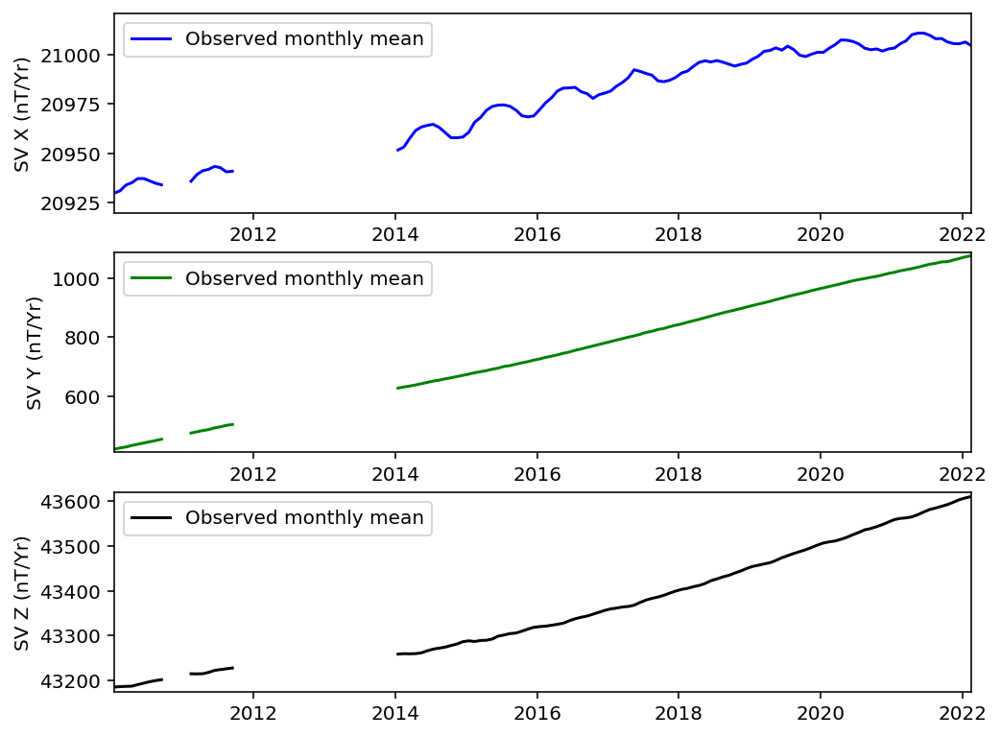

Reading files from BLC...
Initiating geomagnetic field computation for BLC.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


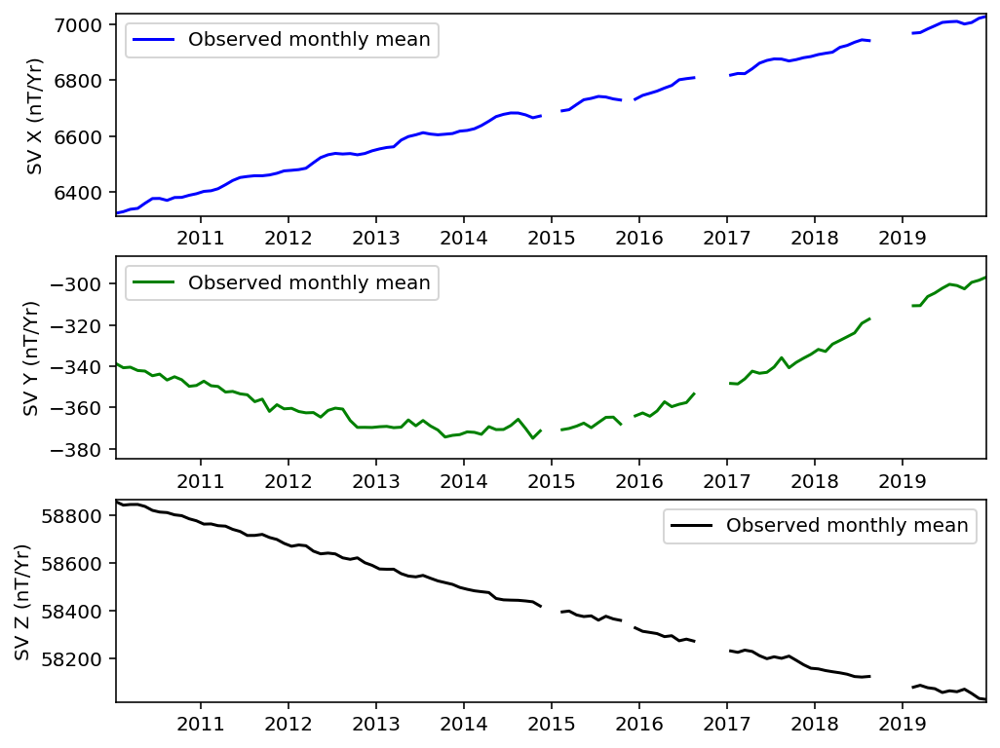

Reading files from BMT...
Initiating geomagnetic field computation for BMT.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


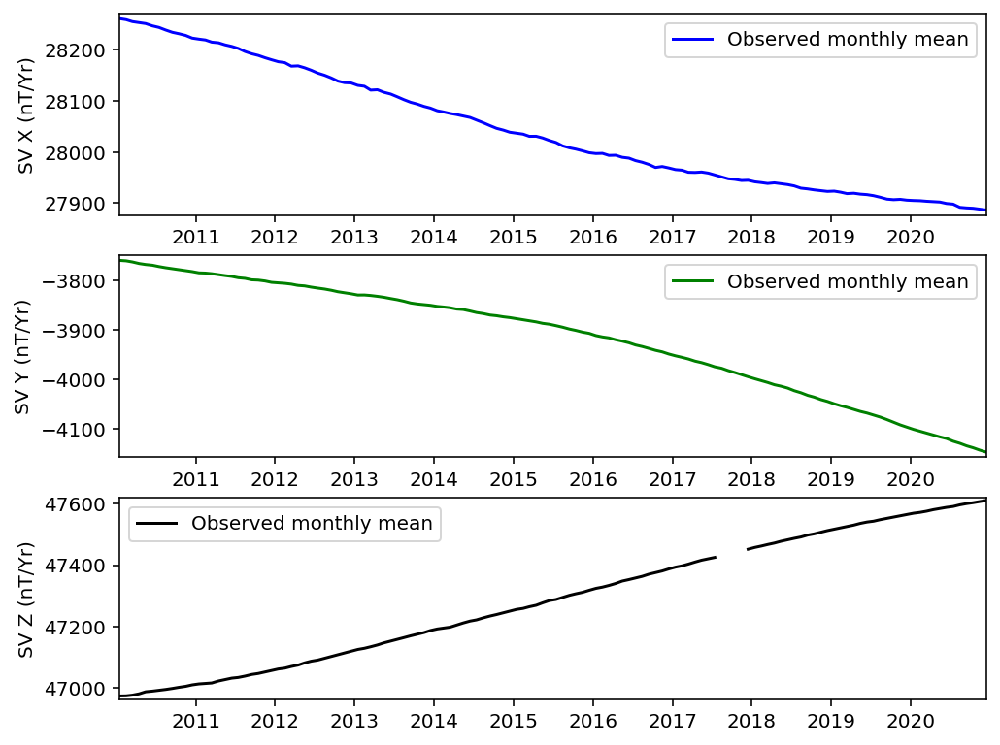

Reading files from BOU...
Initiating geomagnetic field computation for BOU.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


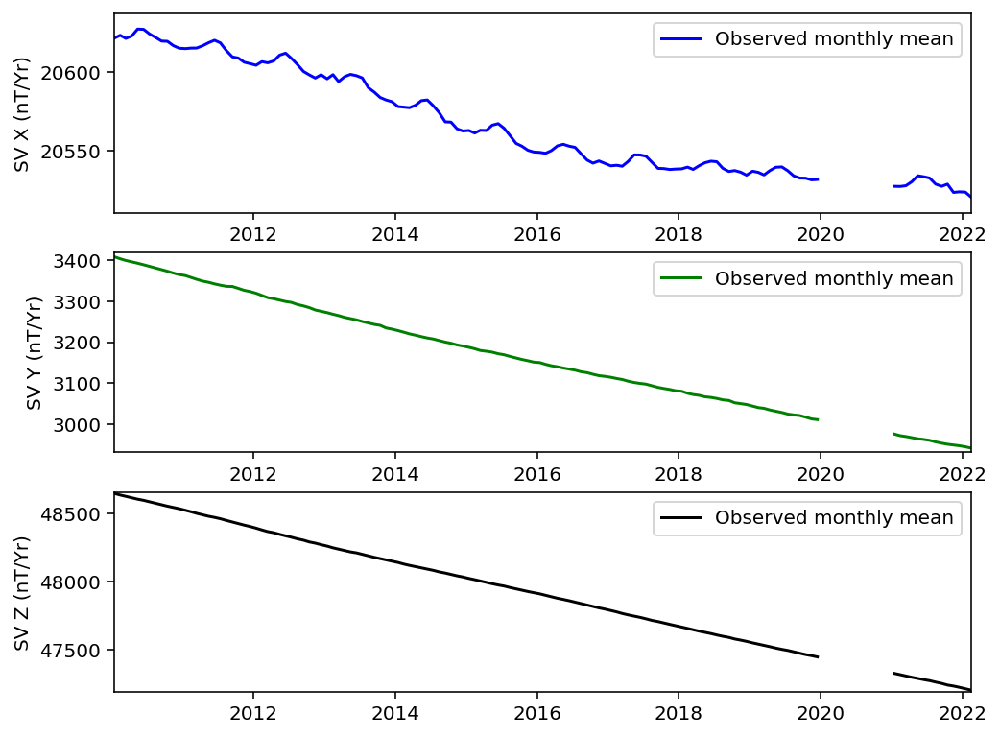

Reading files from BOX...
Initiating geomagnetic field computation for BOX.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


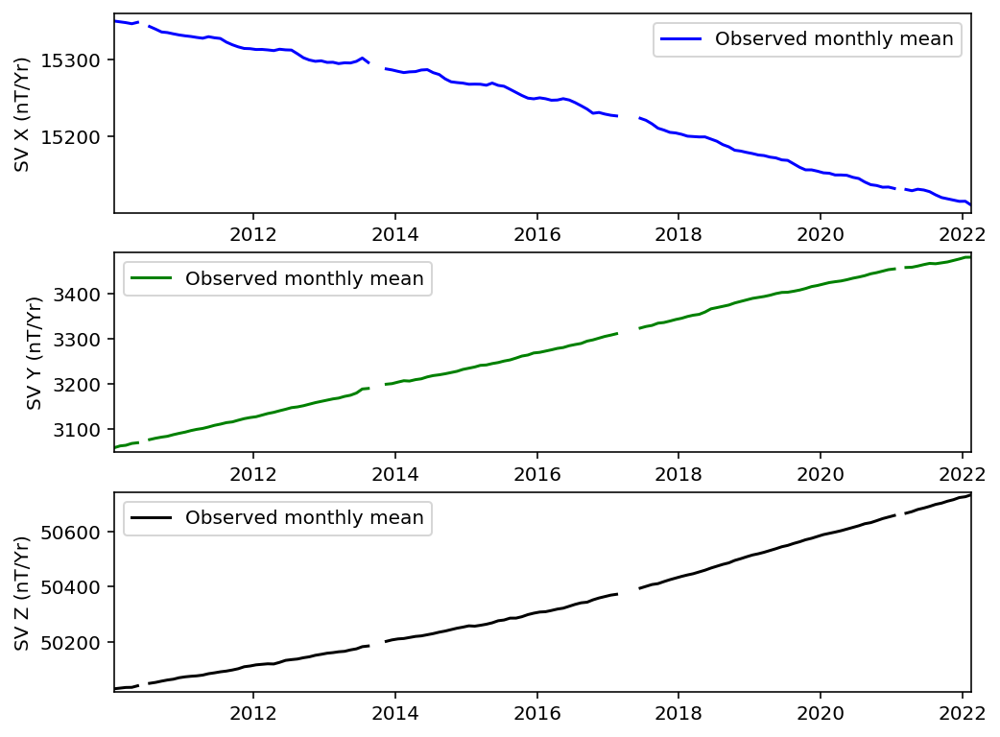

Reading files from BRD...
Initiating geomagnetic field computation for BRD.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


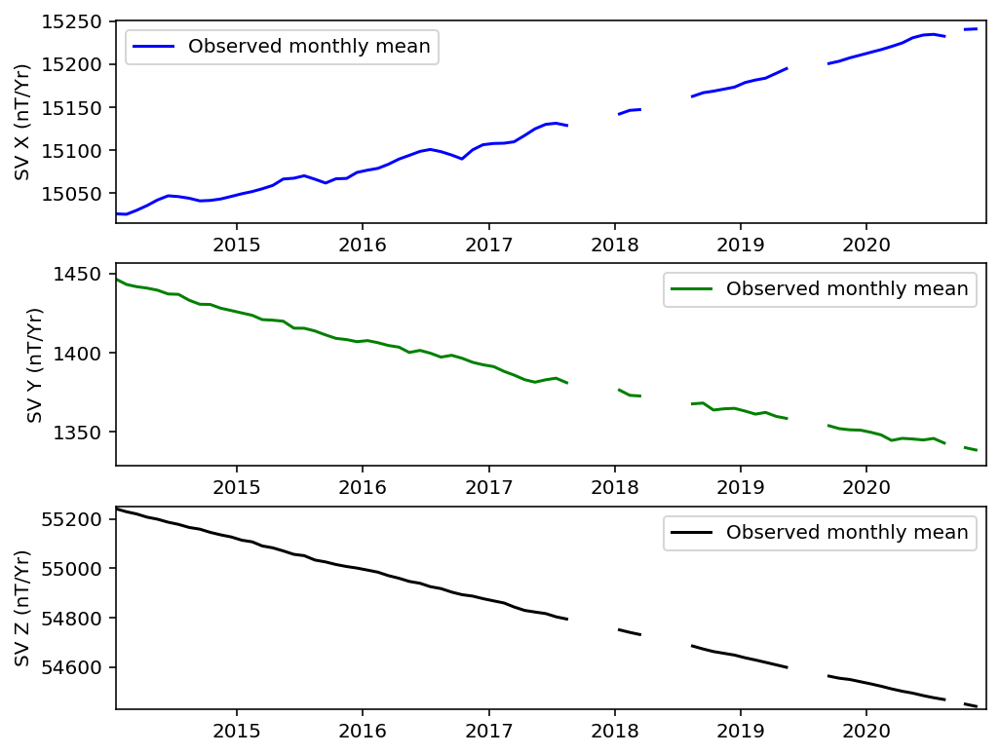

Reading files from BRW...
Initiating geomagnetic field computation for BRW.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


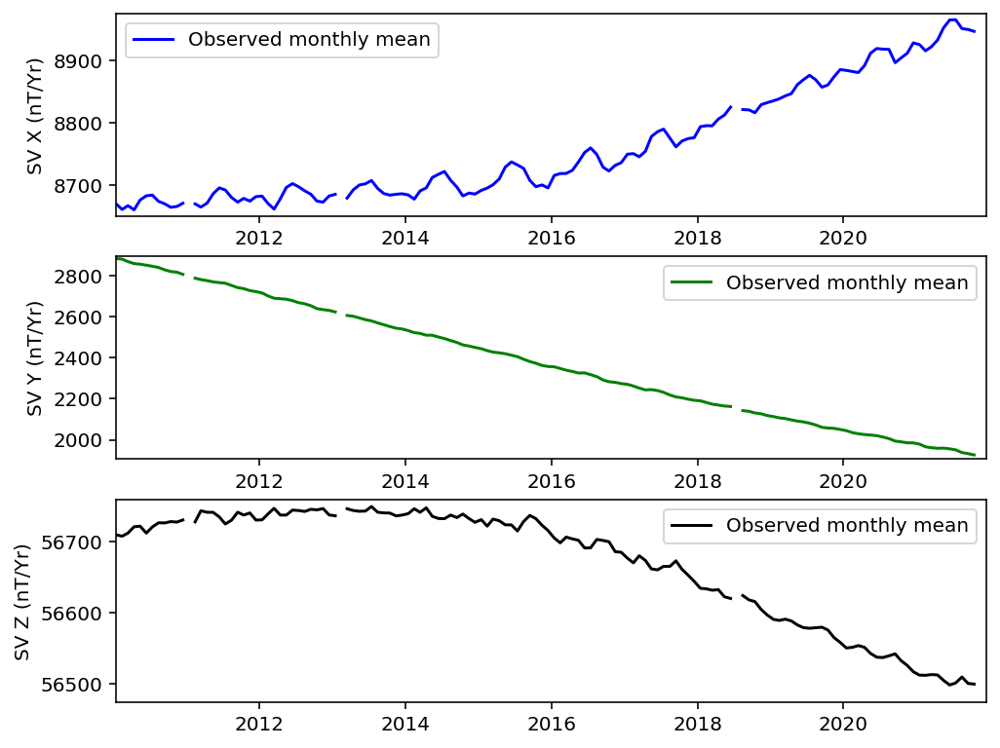

Reading files from CBB...
Initiating geomagnetic field computation for CBB.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


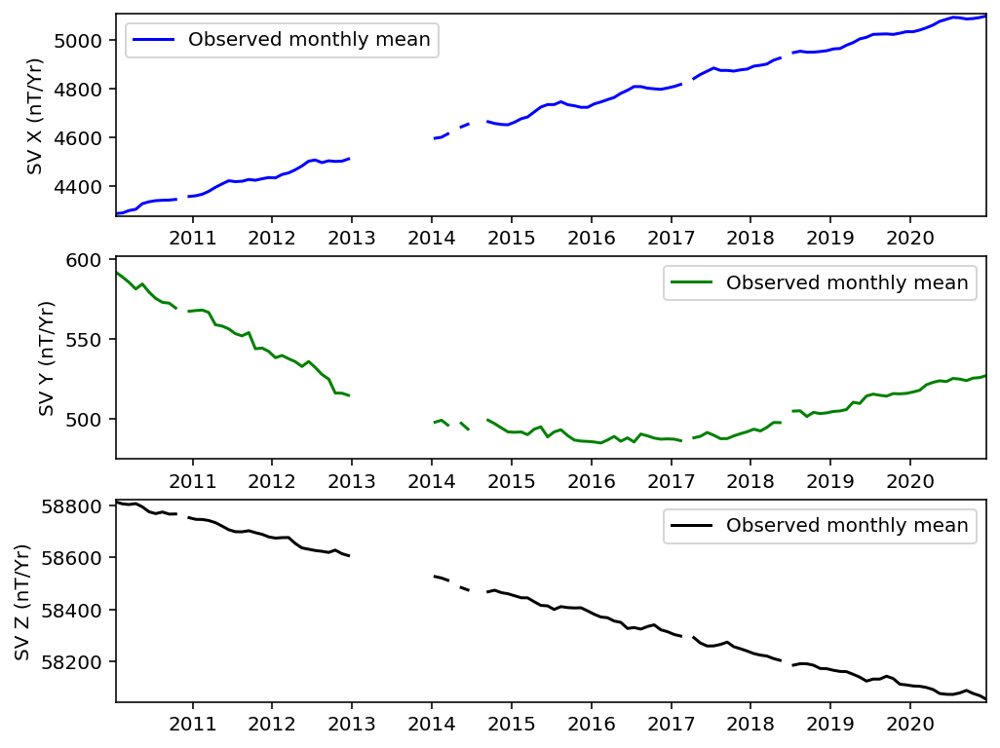

Reading files from CKI...
Initiating geomagnetic field computation for CKI.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


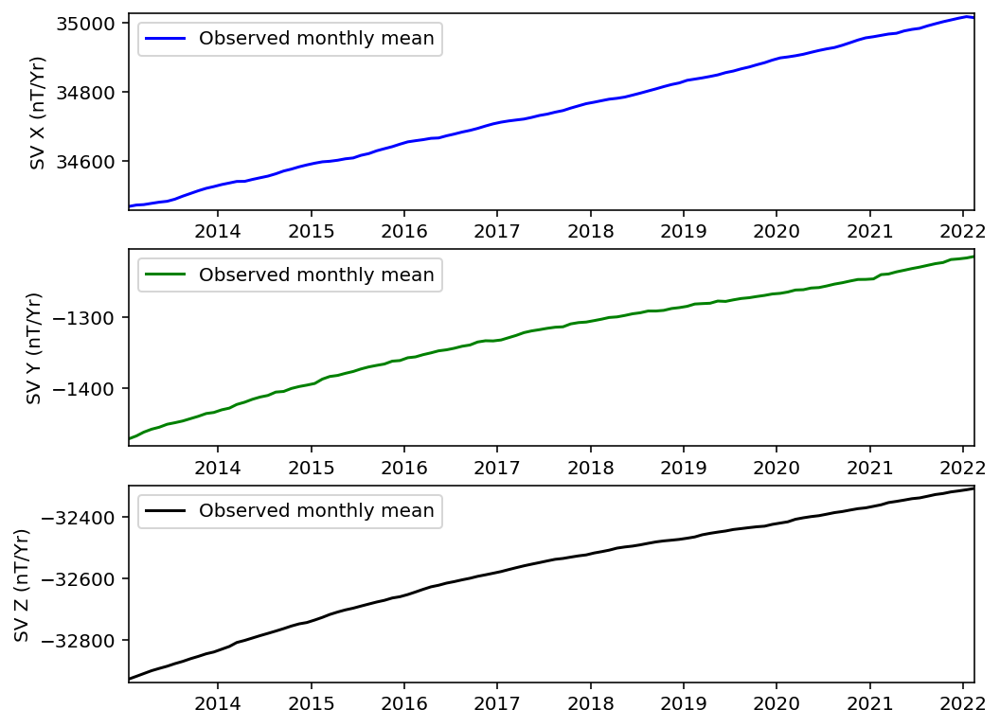

Reading files from CLF...
Initiating geomagnetic field computation for CLF.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


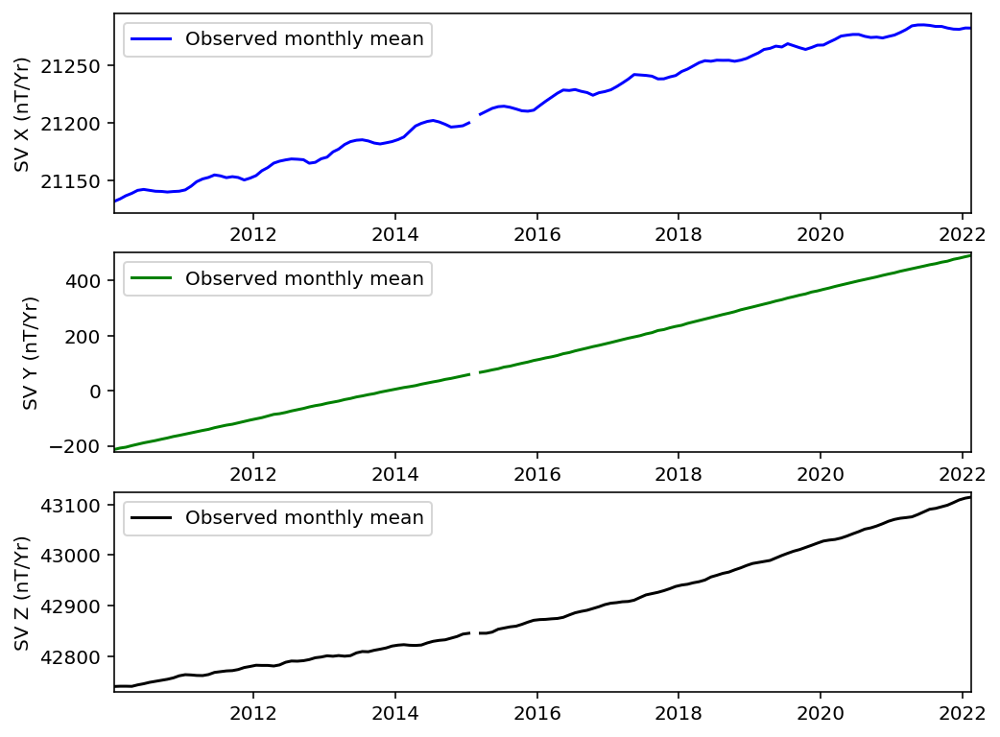

Reading files from CMO...
Initiating geomagnetic field computation for CMO.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


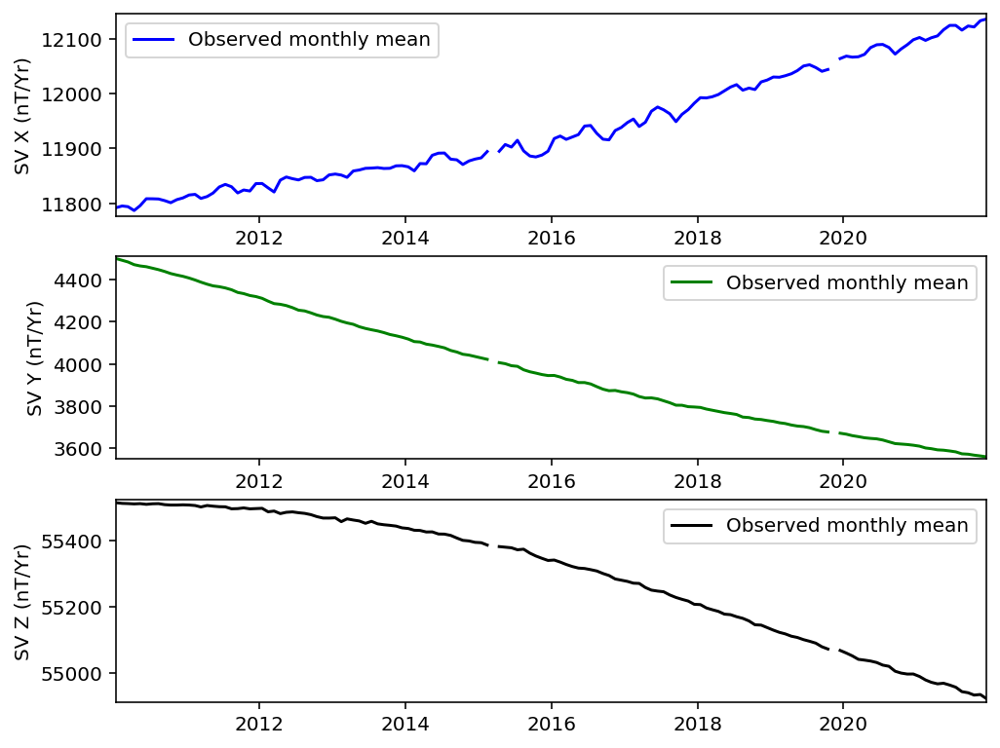

Reading files from CNB...
Initiating geomagnetic field computation for CNB.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


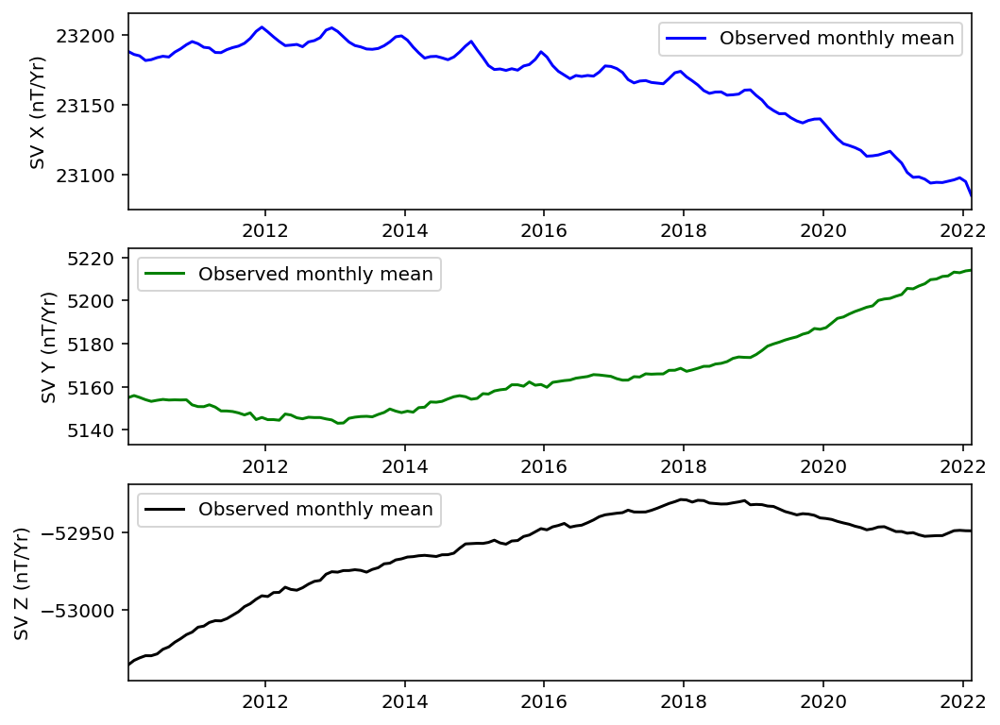

Reading files from CPL...
Initiating geomagnetic field computation for CPL.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


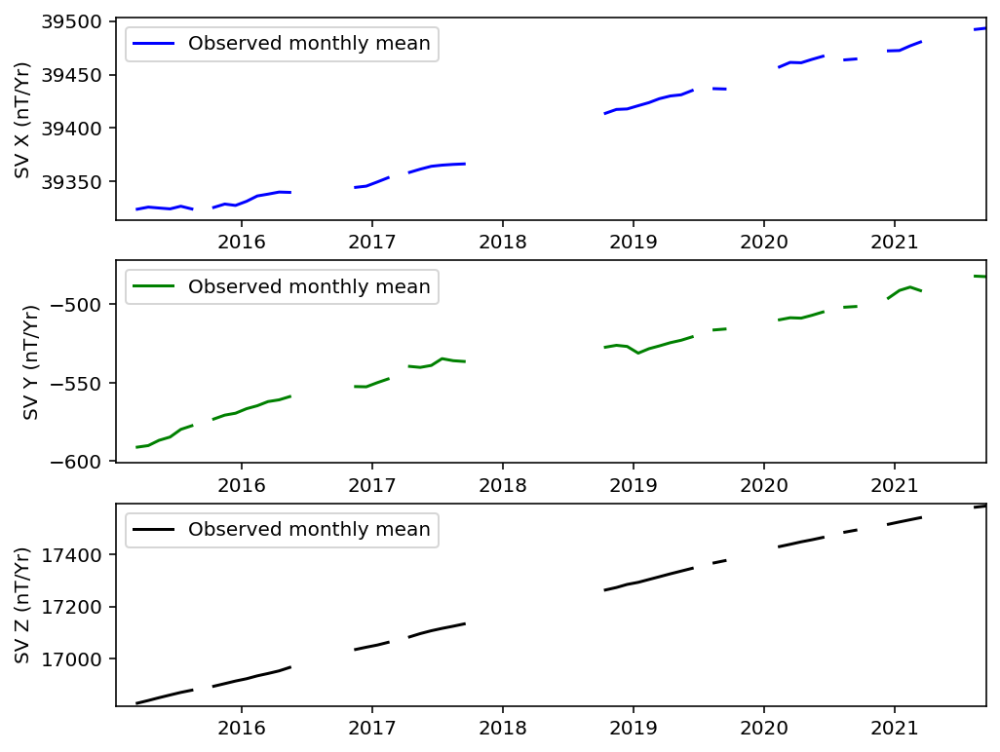

Reading files from CSY...
Initiating geomagnetic field computation for CSY.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


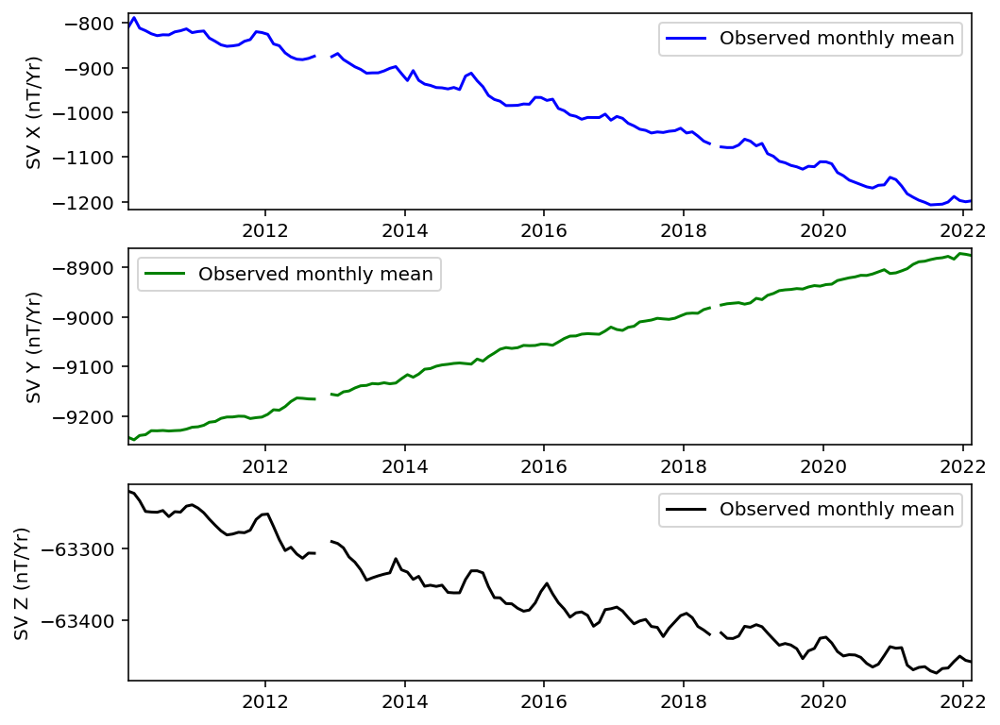

Reading files from CTA...
Initiating geomagnetic field computation for CTA.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


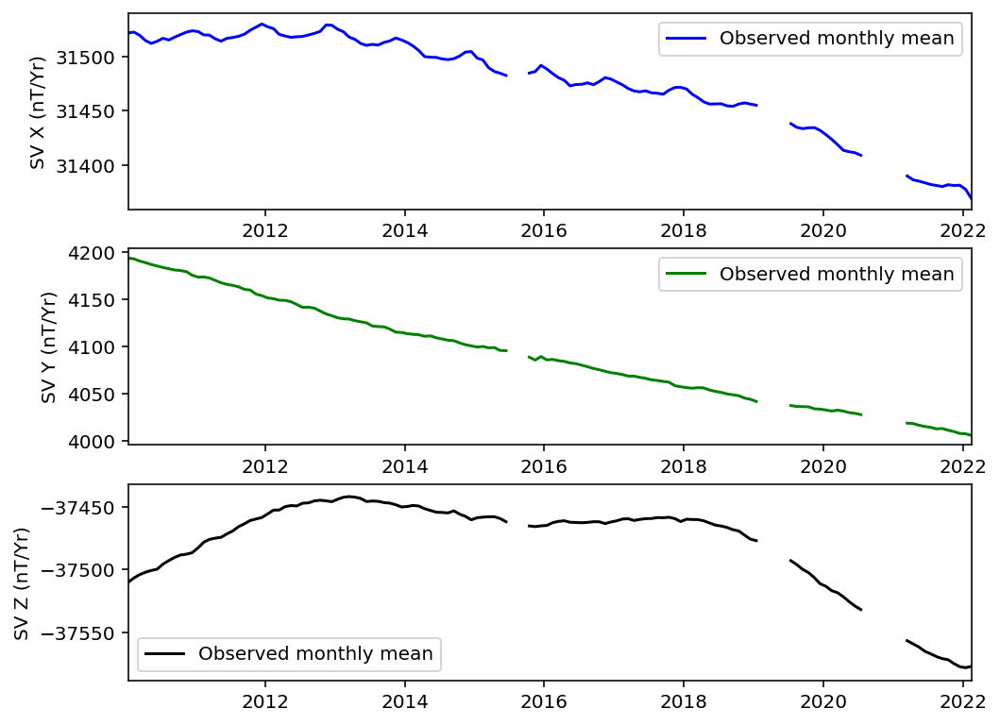

Reading files from CZT...
Initiating geomagnetic field computation for CZT.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


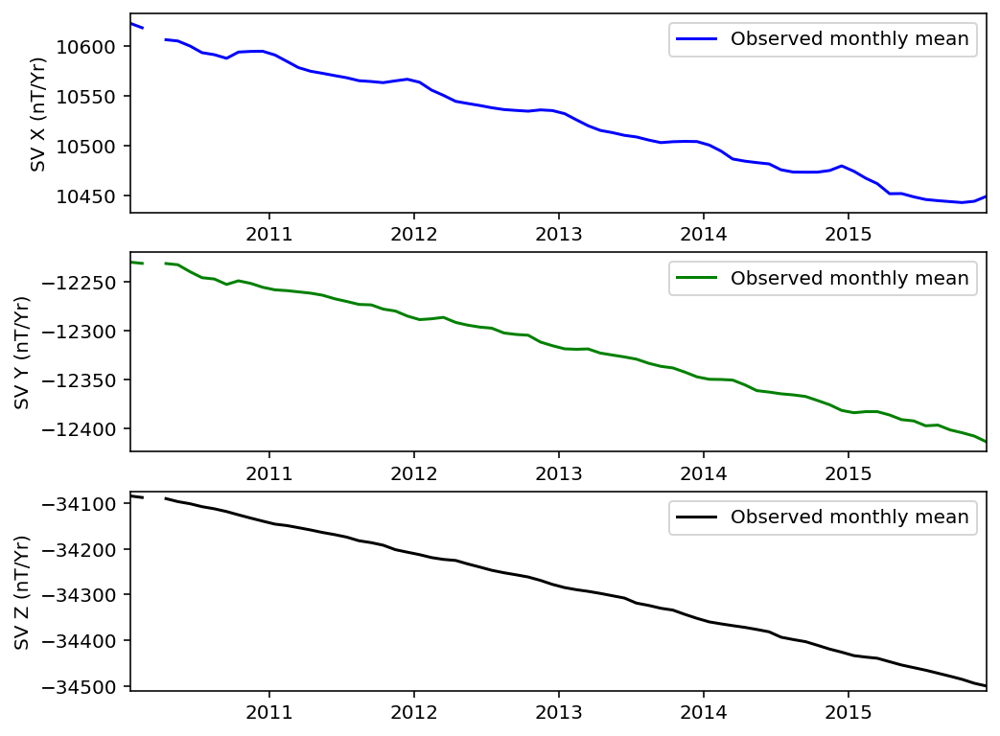

Reading files from DED...
Initiating geomagnetic field computation for DED.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


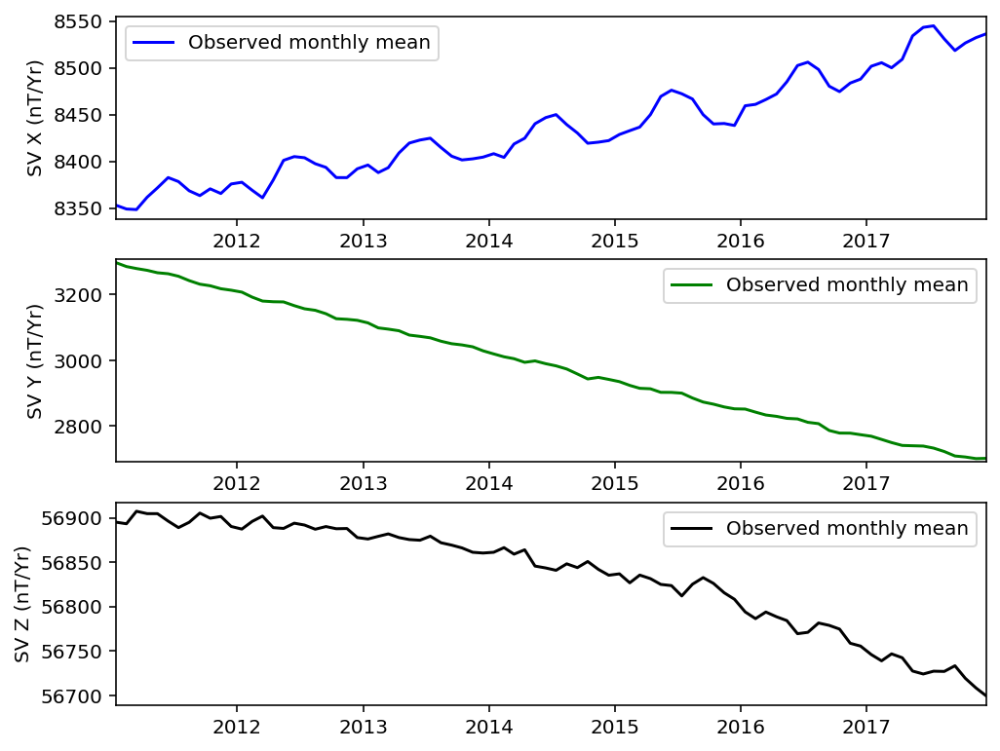

Reading files from DUR...
Initiating geomagnetic field computation for DUR.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


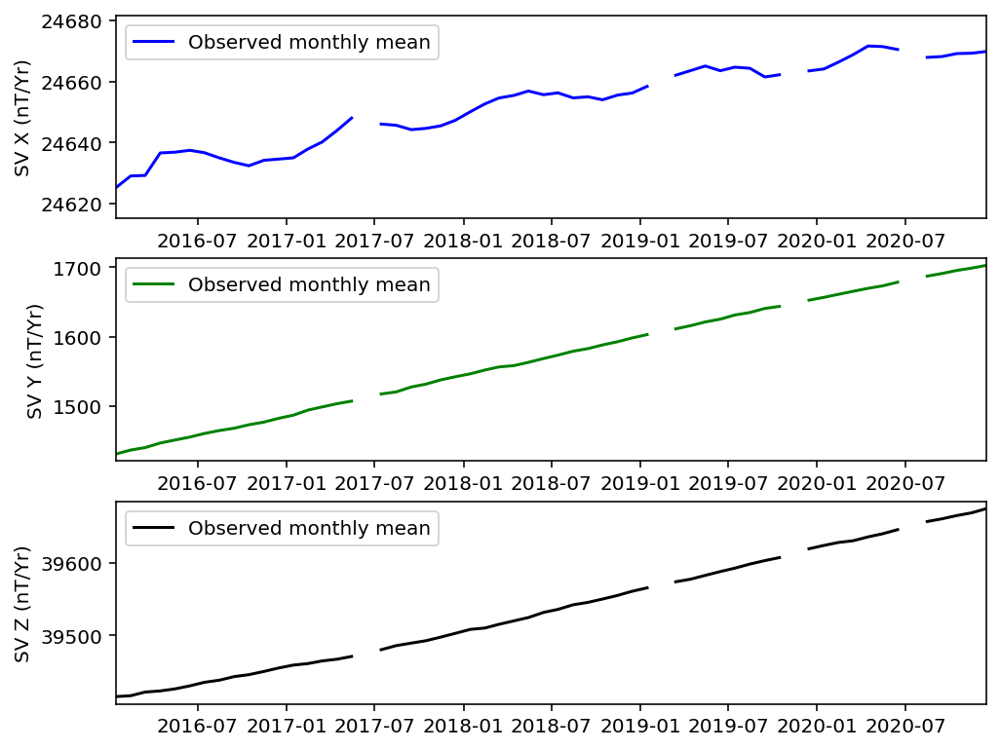

Reading files from ESK...
Initiating geomagnetic field computation for ESK.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


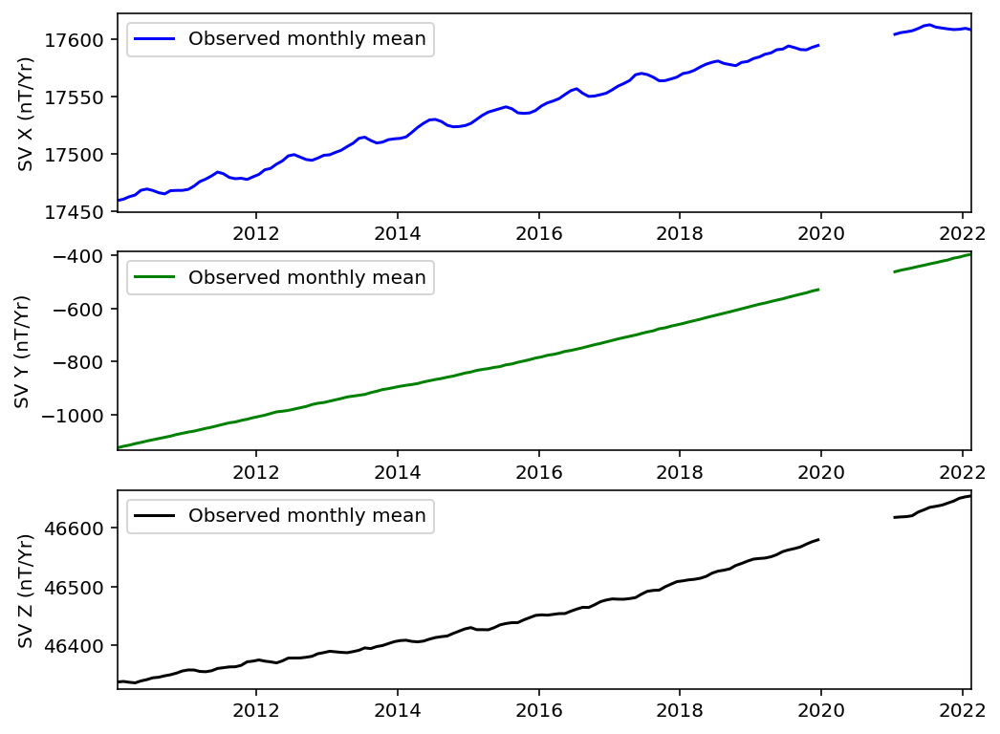

Reading files from FCC...
Initiating geomagnetic field computation for FCC.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


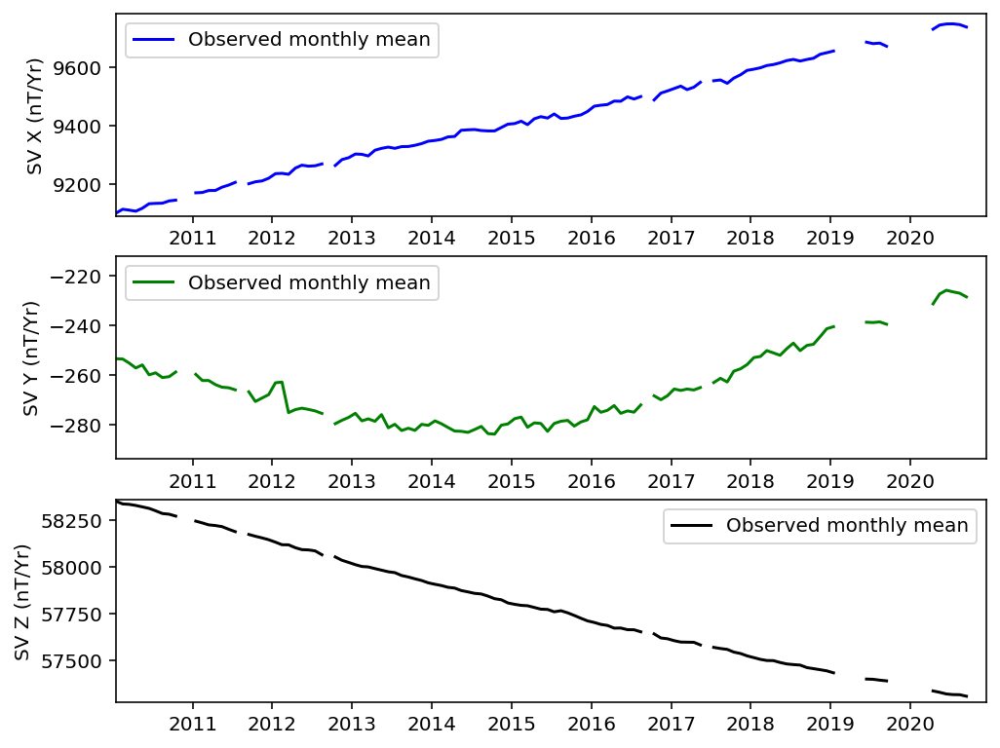

Reading files from FRD...
Initiating geomagnetic field computation for FRD.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


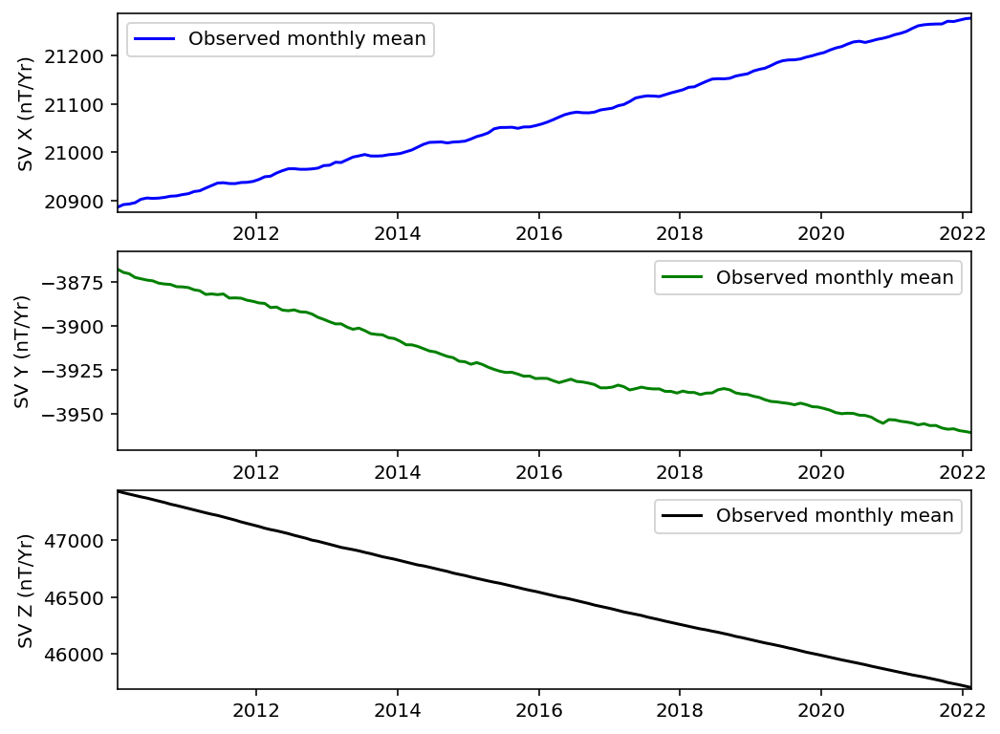

Reading files from FRN...
Initiating geomagnetic field computation for FRN.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


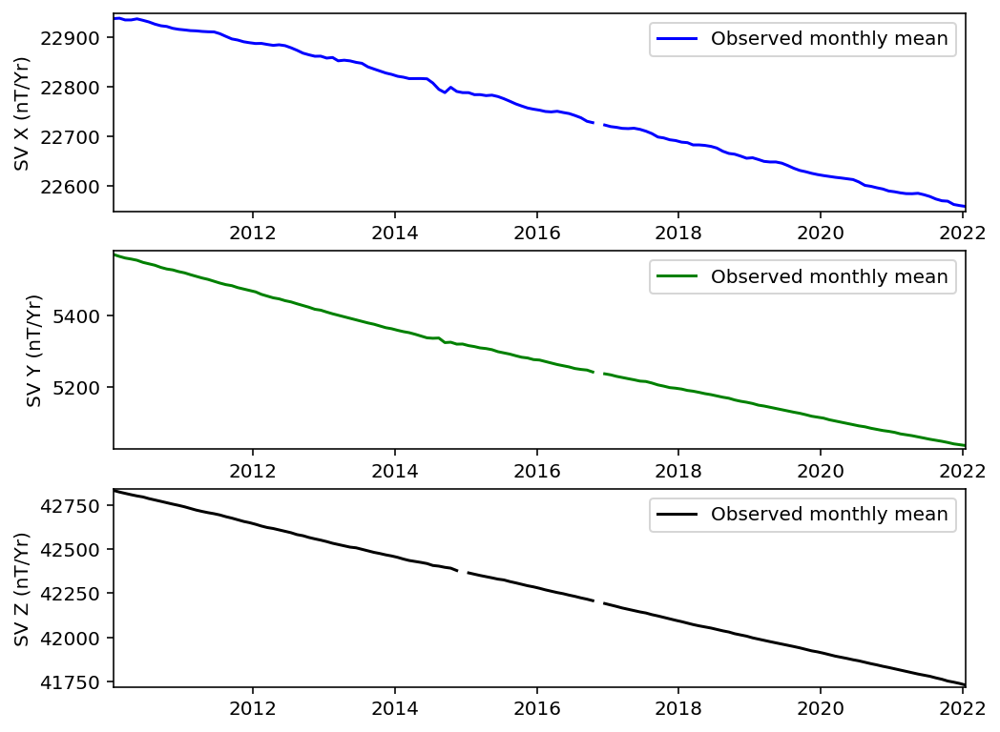

Reading files from FUR...
Initiating geomagnetic field computation for FUR.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


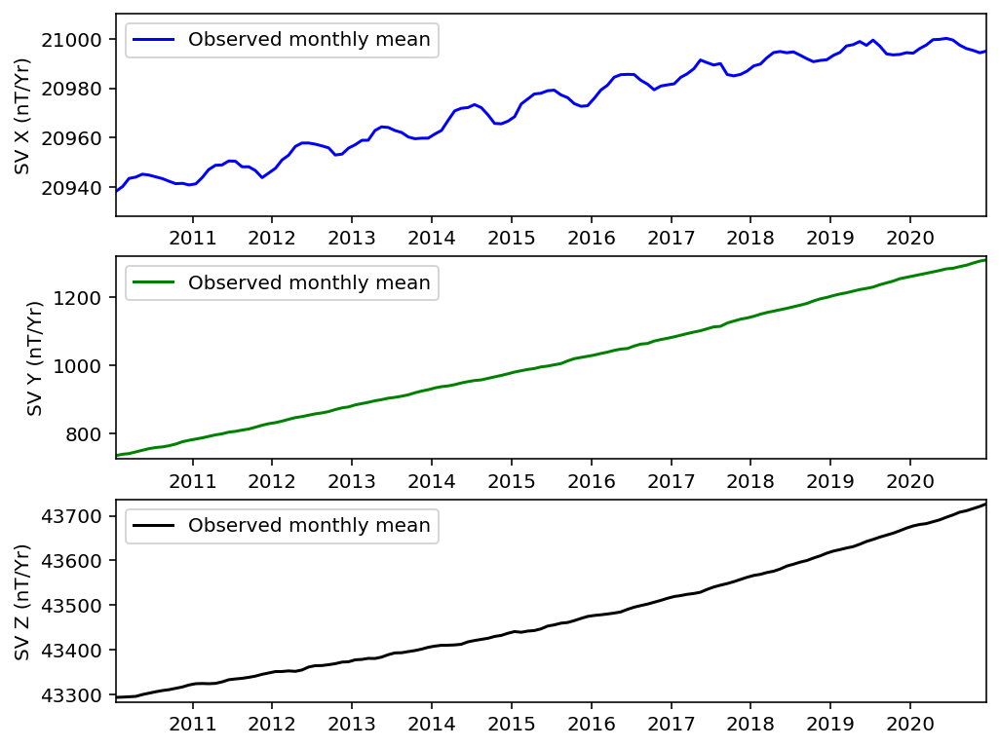

Reading files from GAN...
Initiating geomagnetic field computation for GAN.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


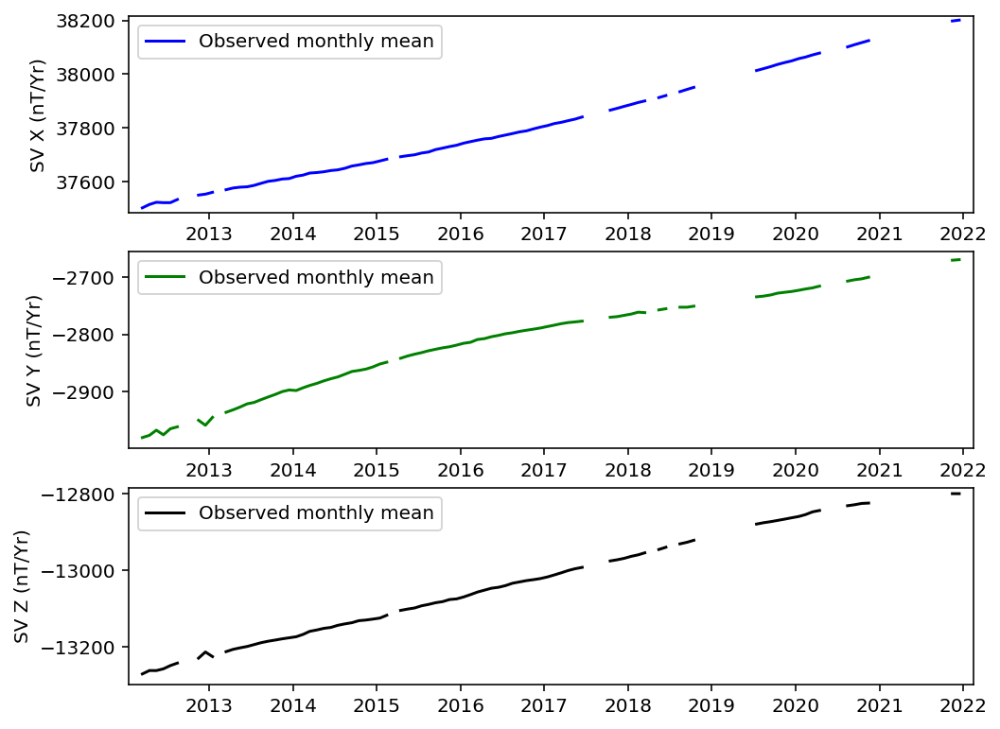

Reading files from GCK...
Initiating geomagnetic field computation for GCK.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


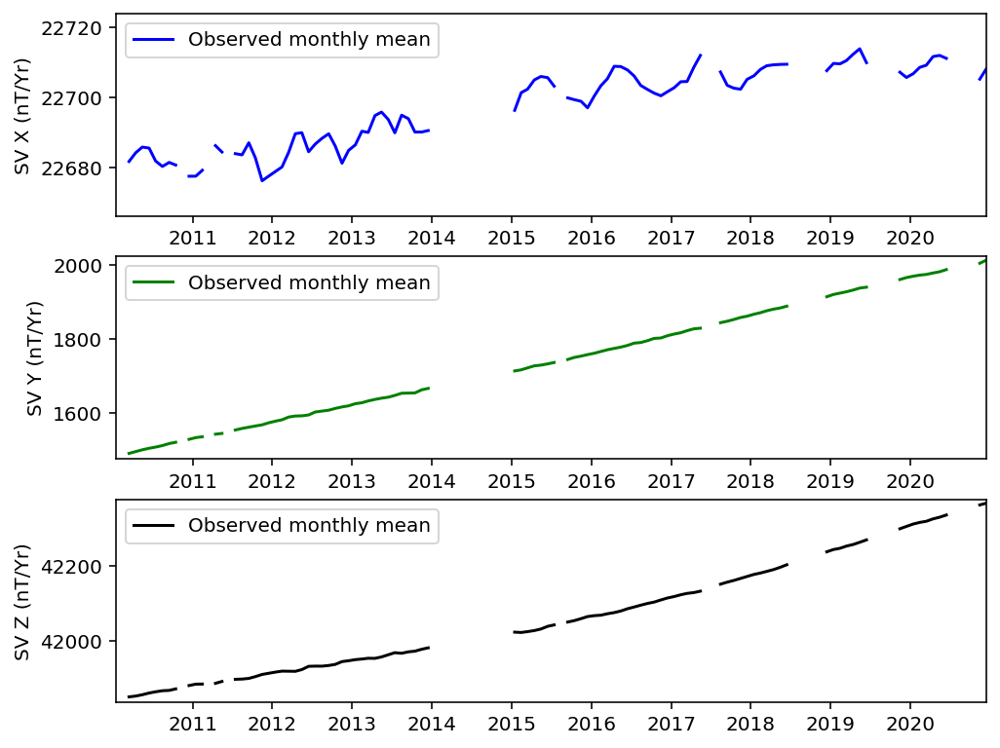

Reading files from GDH...
Initiating geomagnetic field computation for GDH.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


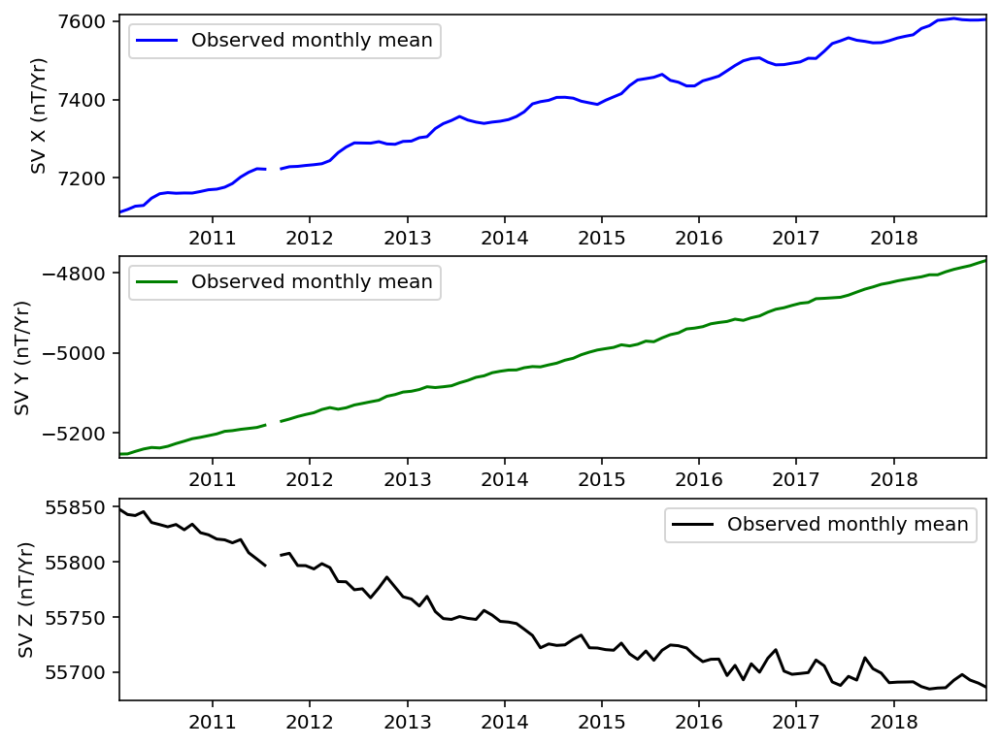

Reading files from GNG...
Initiating geomagnetic field computation for GNG.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


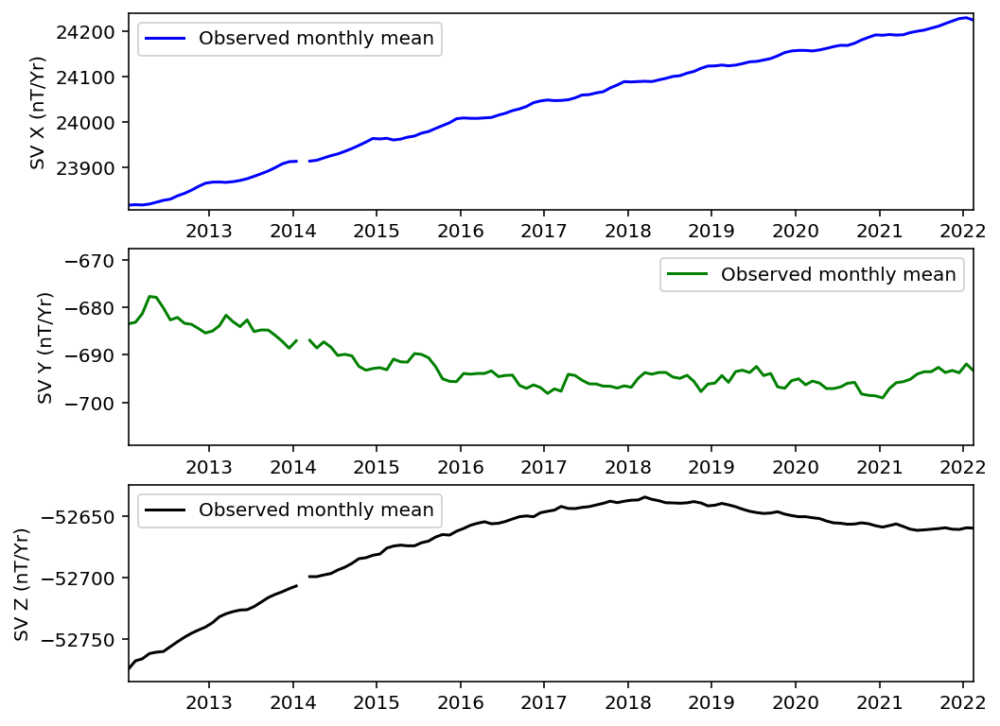

Reading files from GUA...
Initiating geomagnetic field computation for GUA.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


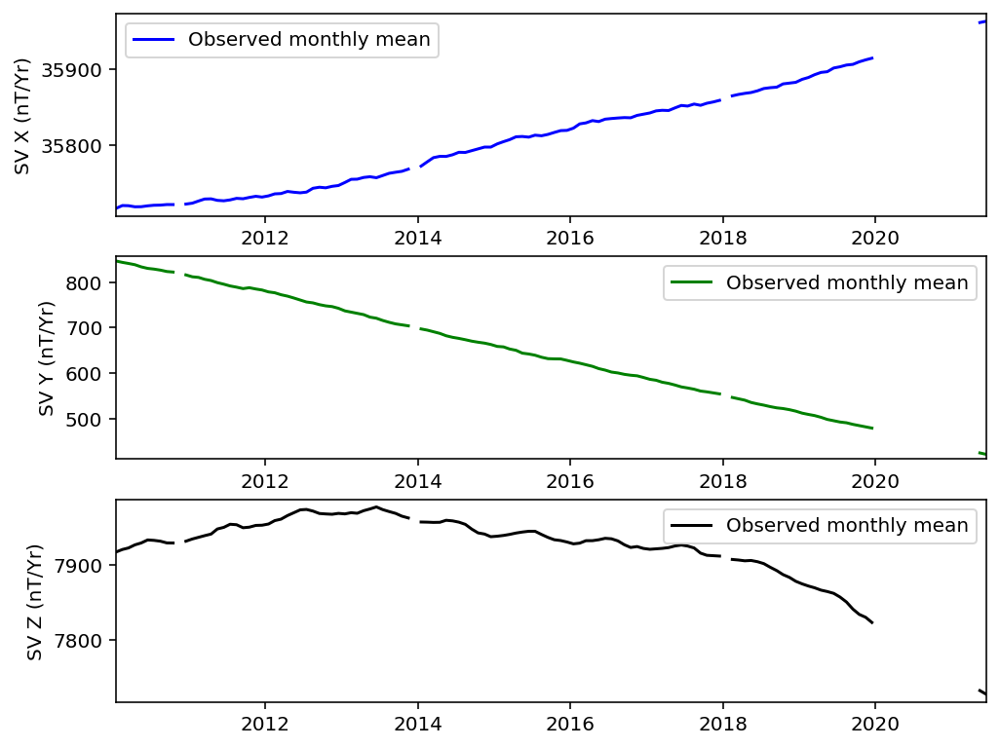

Reading files from GUI...
Initiating geomagnetic field computation for GUI.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


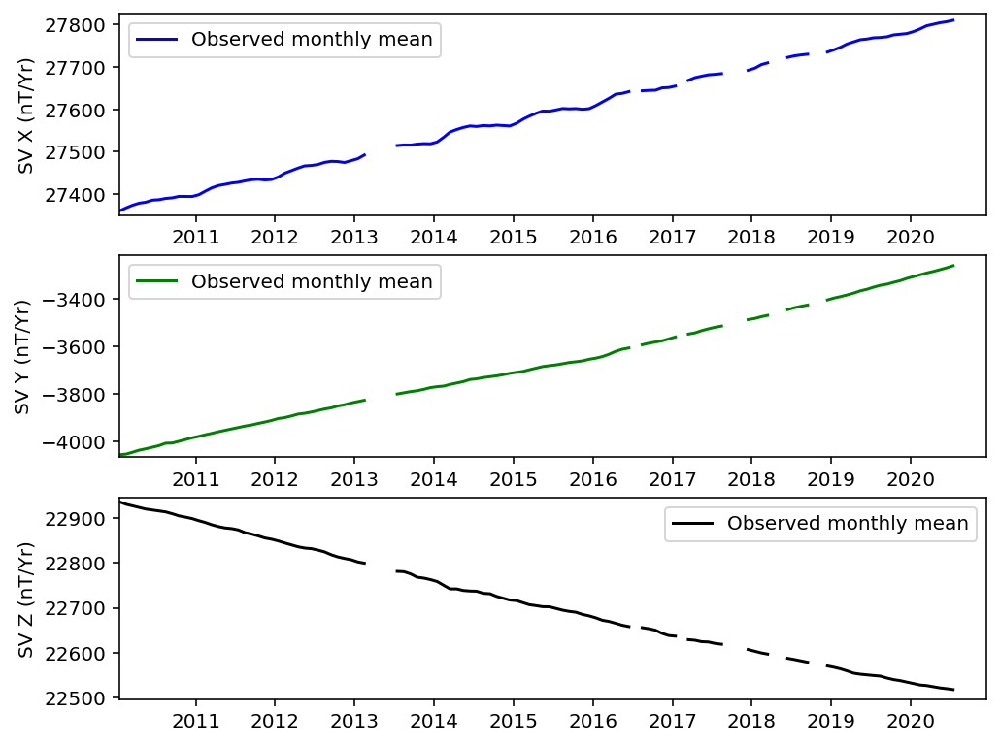

Reading files from HAD...
Initiating geomagnetic field computation for HAD.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


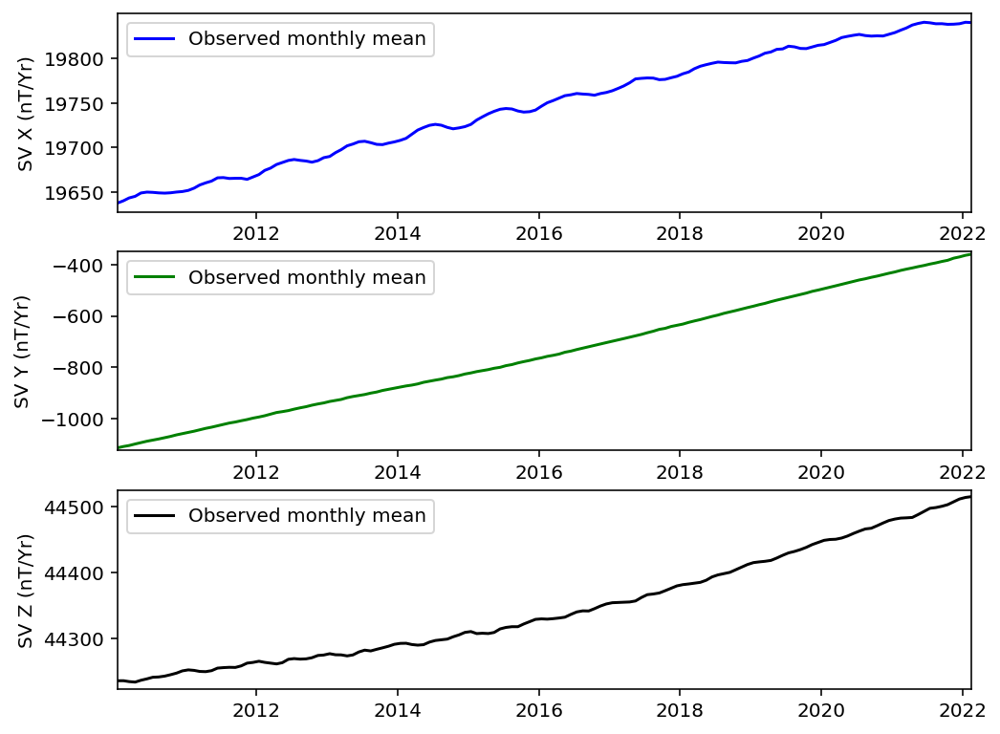

Reading files from HBK...
Initiating geomagnetic field computation for HBK.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


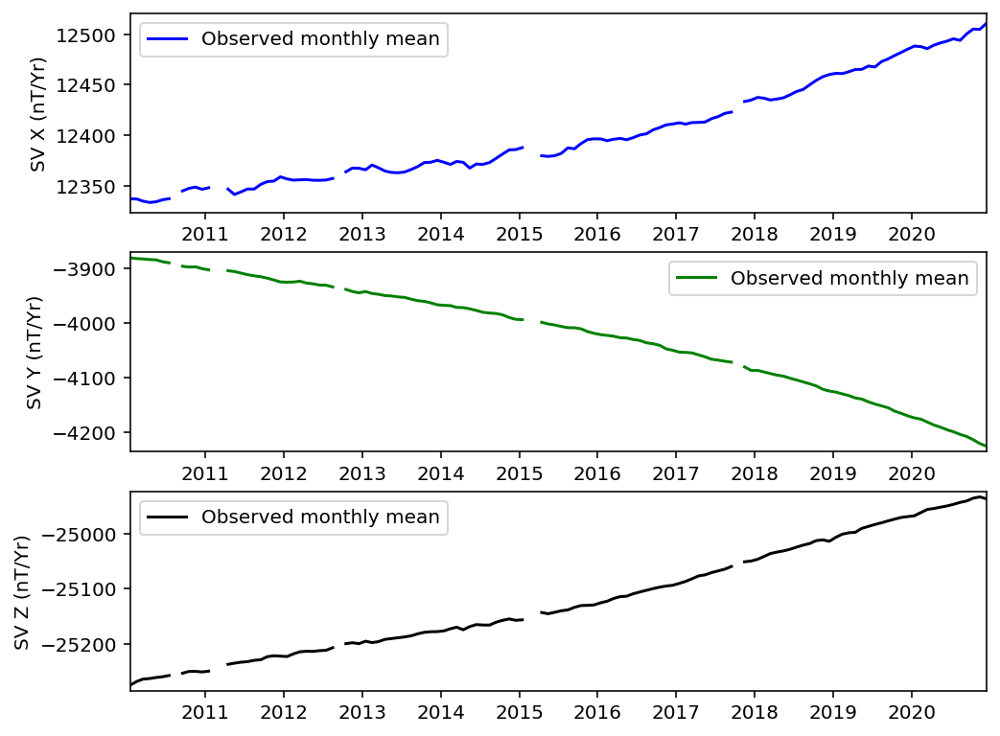

Reading files from HER...
Initiating geomagnetic field computation for HER.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


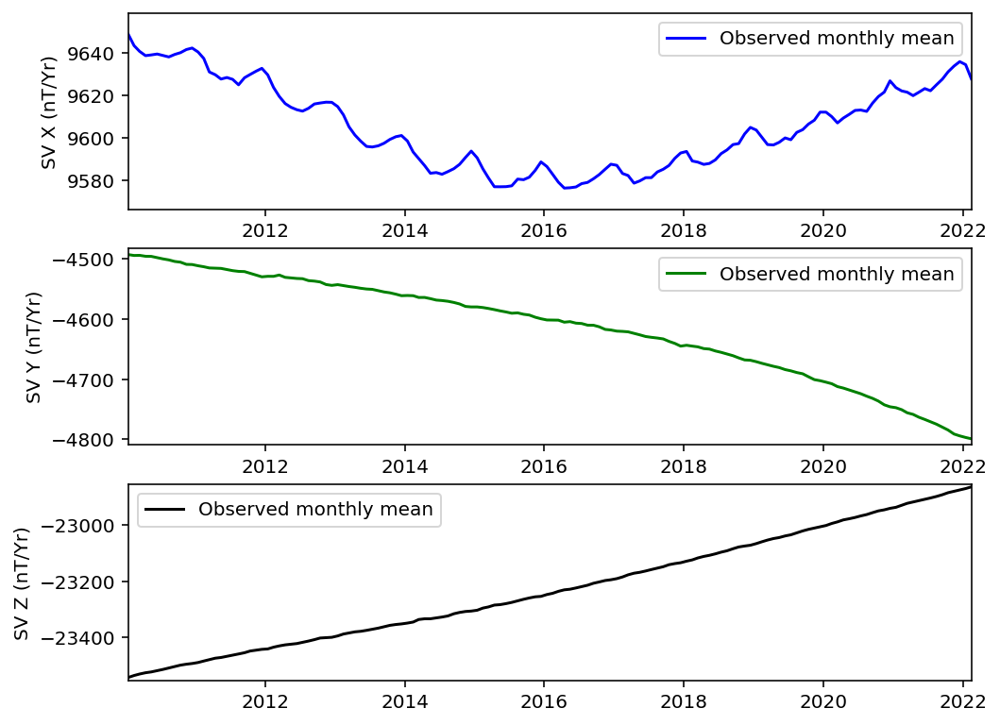

Reading files from HLP...
Initiating geomagnetic field computation for HLP.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


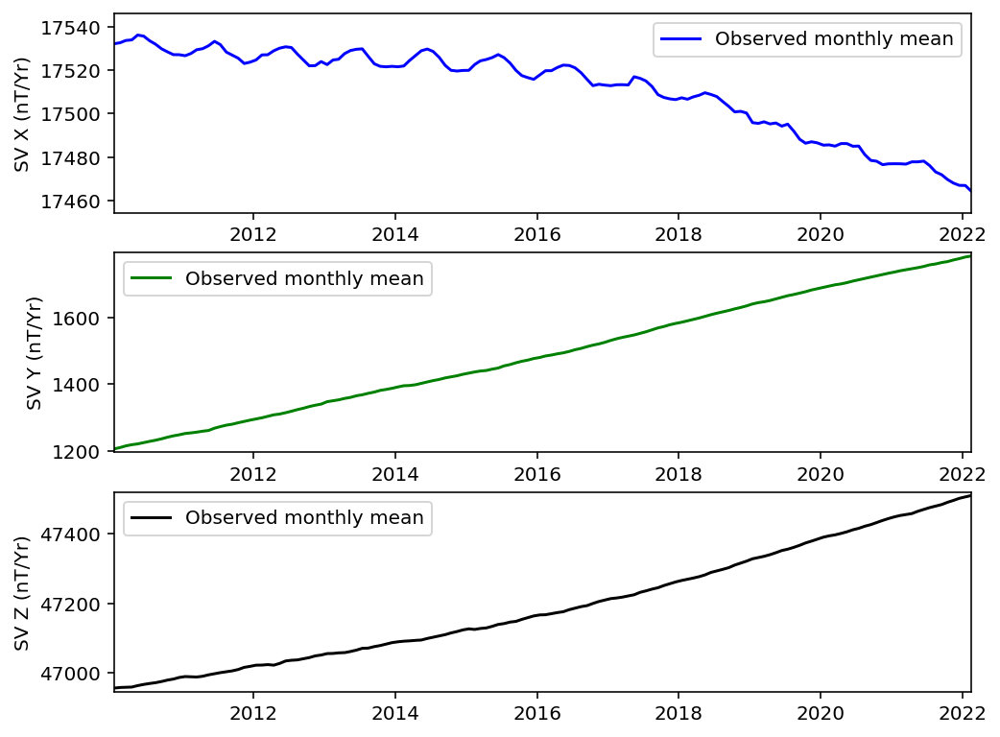

Reading files from HUA...
Initiating geomagnetic field computation for HUA.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


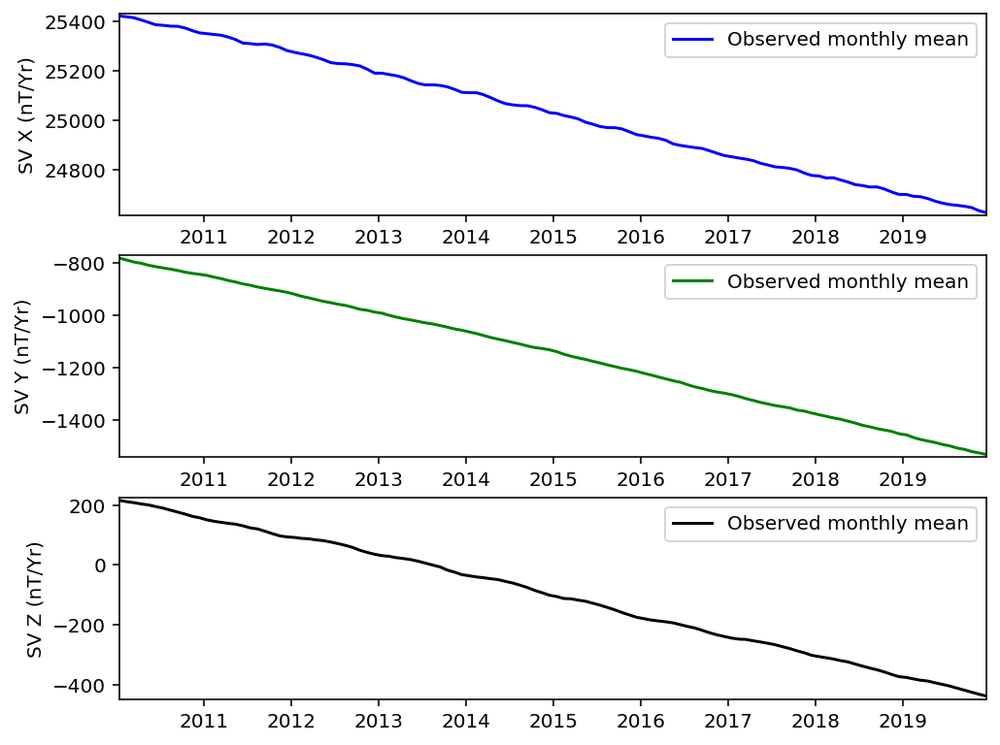

Reading files from HYB...
Initiating geomagnetic field computation for HYB.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


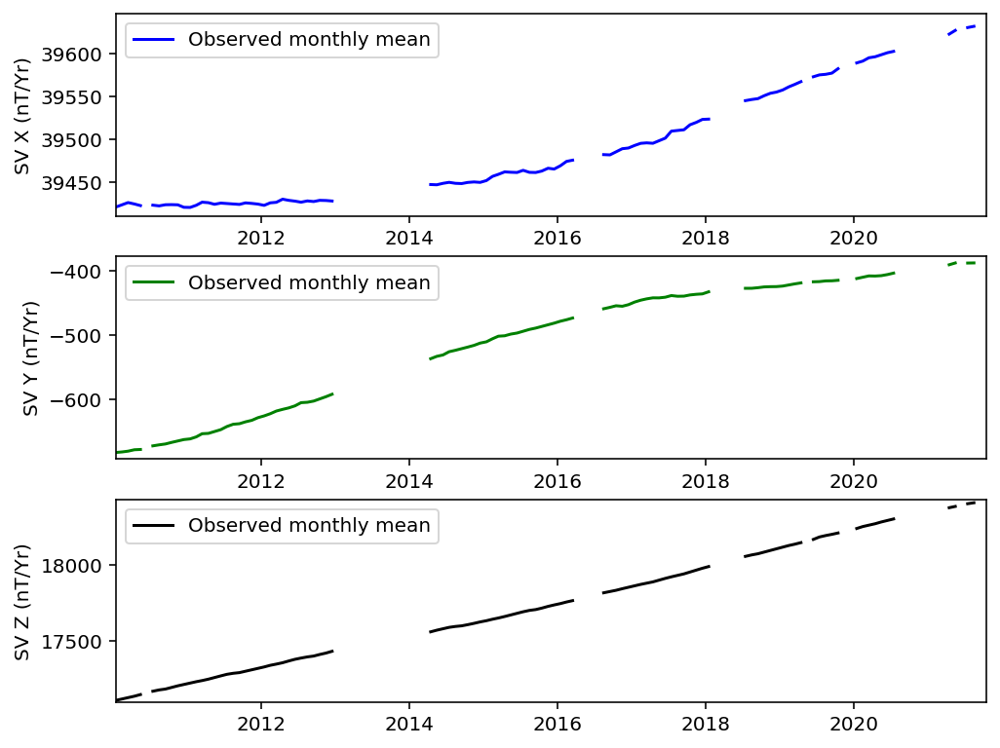

Reading files from IPM...
Initiating geomagnetic field computation for IPM.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


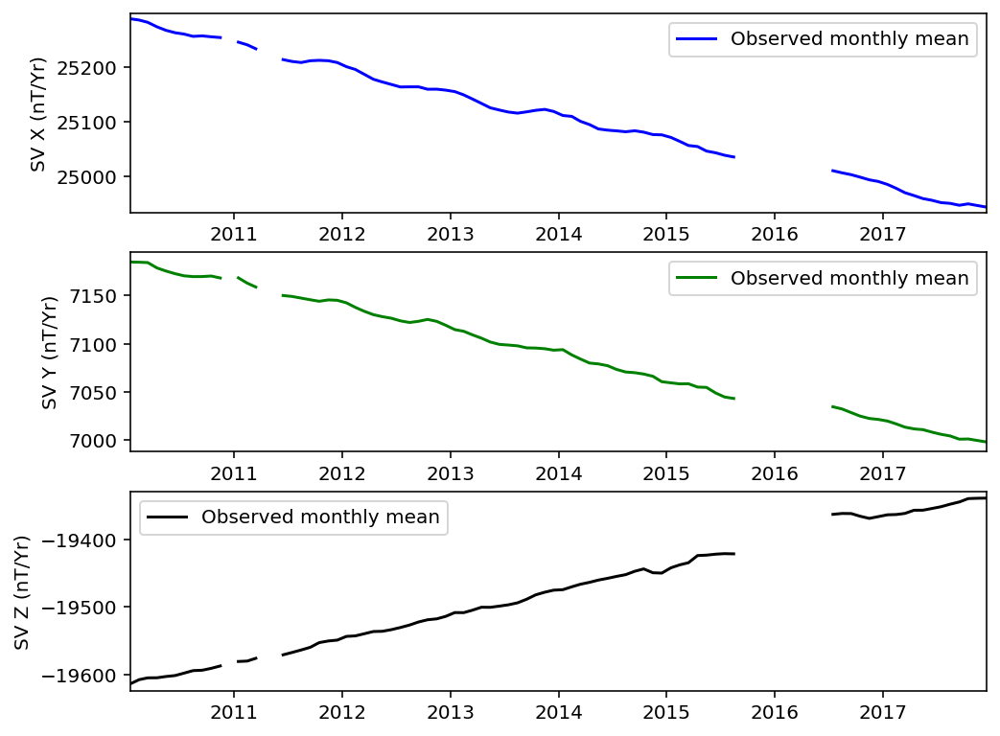

Reading files from IQA...
Initiating geomagnetic field computation for IQA.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


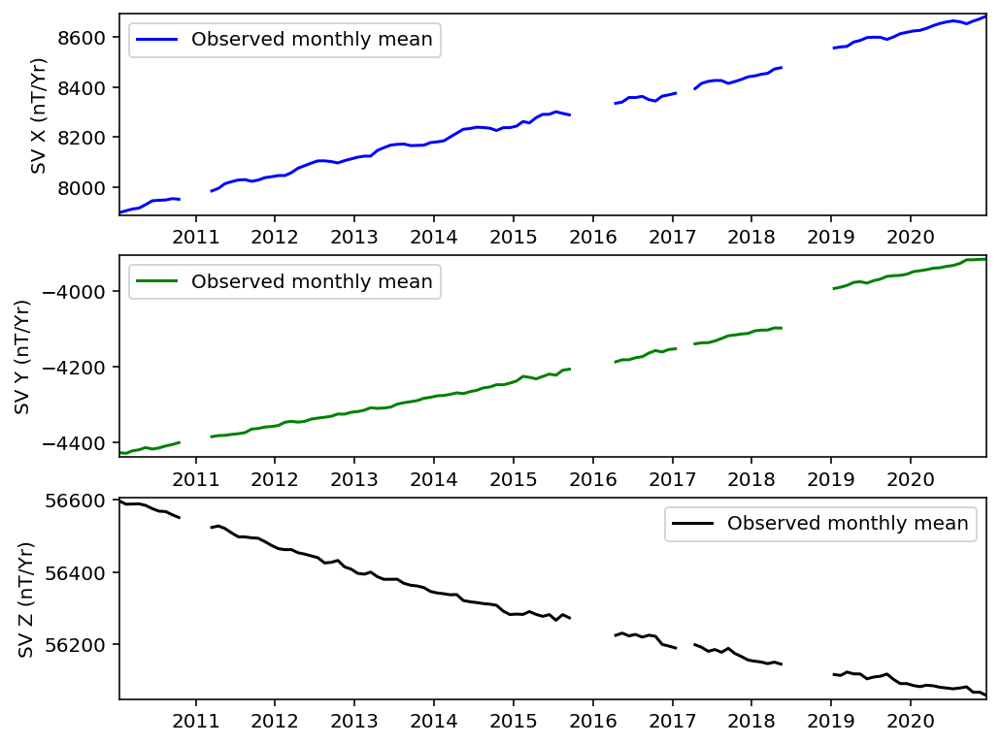

Reading files from IZN...
Initiating geomagnetic field computation for IZN.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


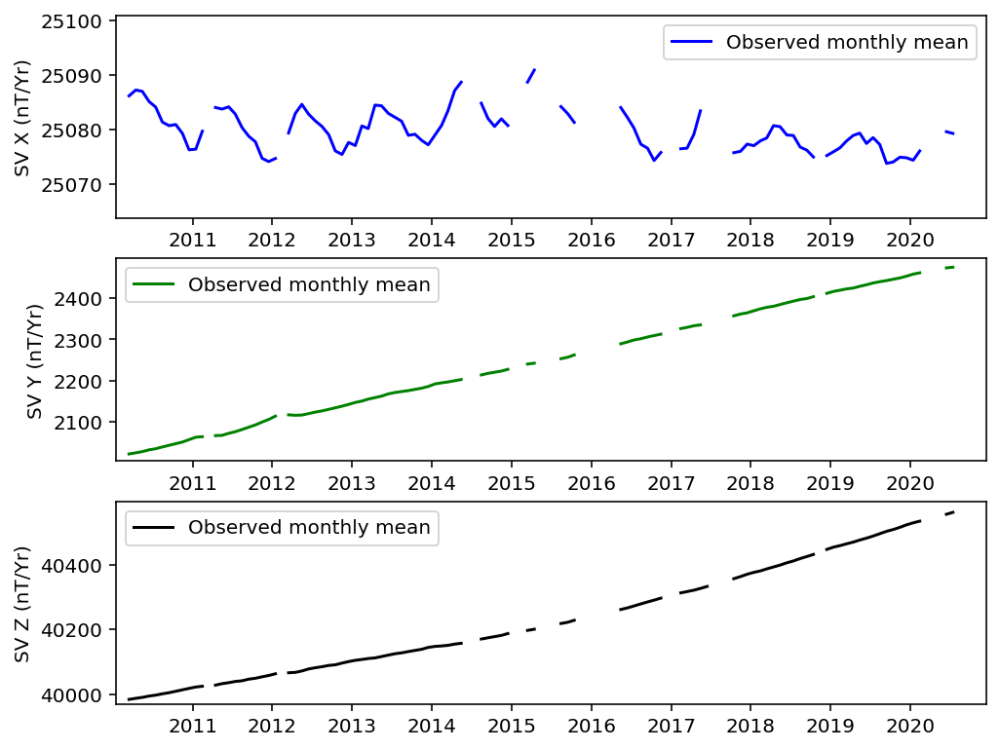

Reading files from JAI...
Initiating geomagnetic field computation for JAI.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


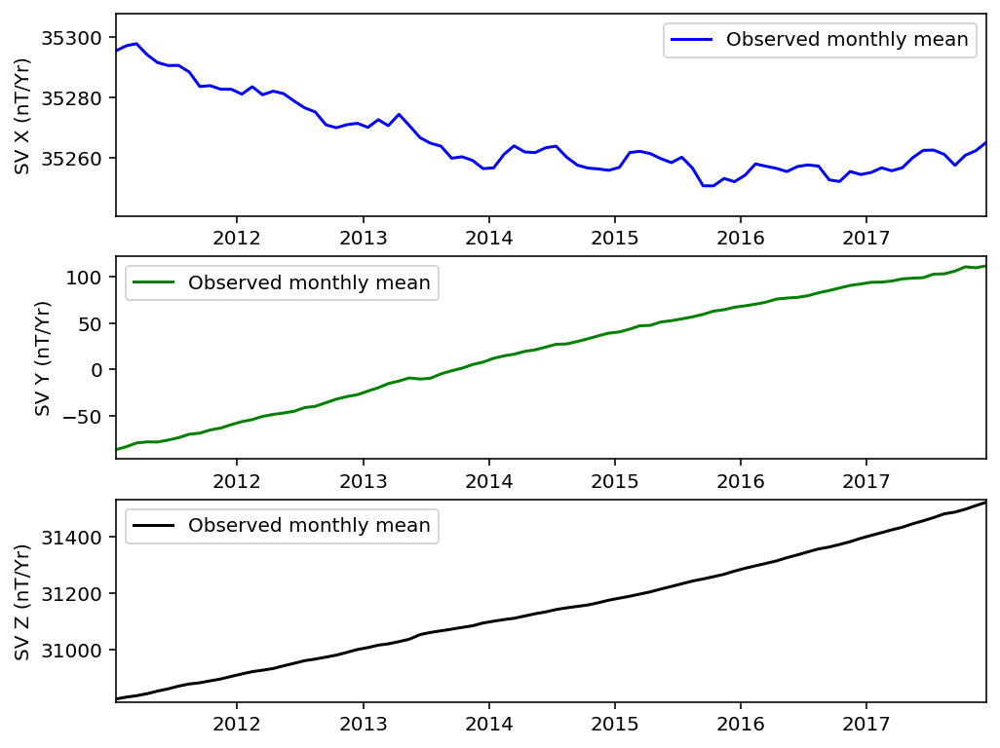

Reading files from JCO...
Initiating geomagnetic field computation for JCO.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


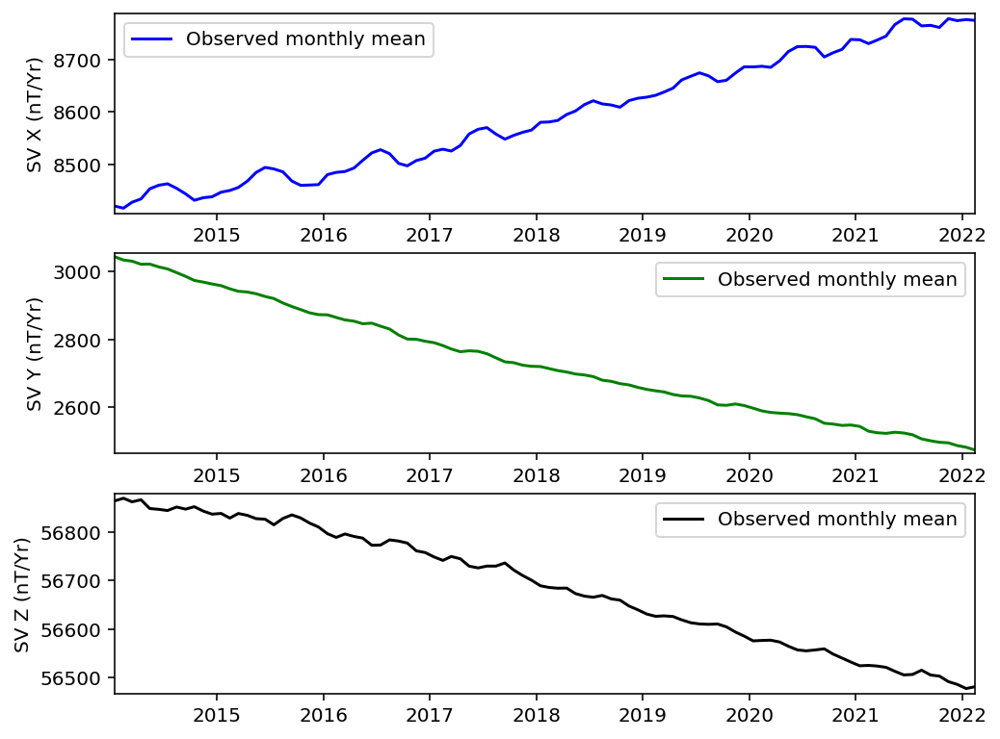

Reading files from KAK...
Initiating geomagnetic field computation for KAK.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


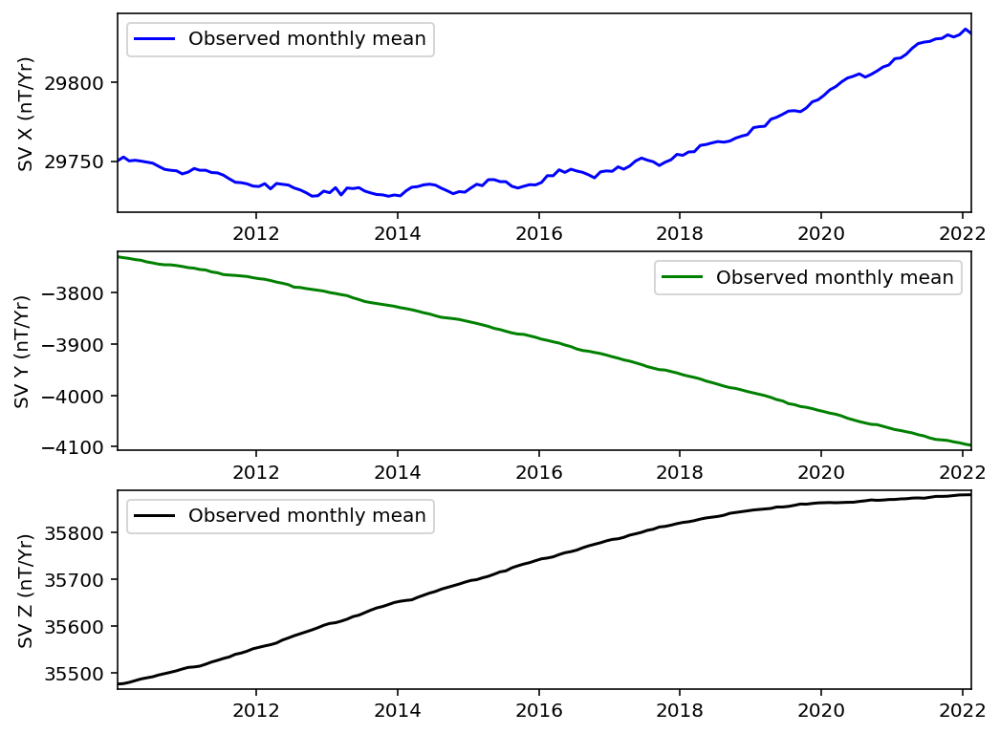

Reading files from KDU...
Initiating geomagnetic field computation for KDU.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


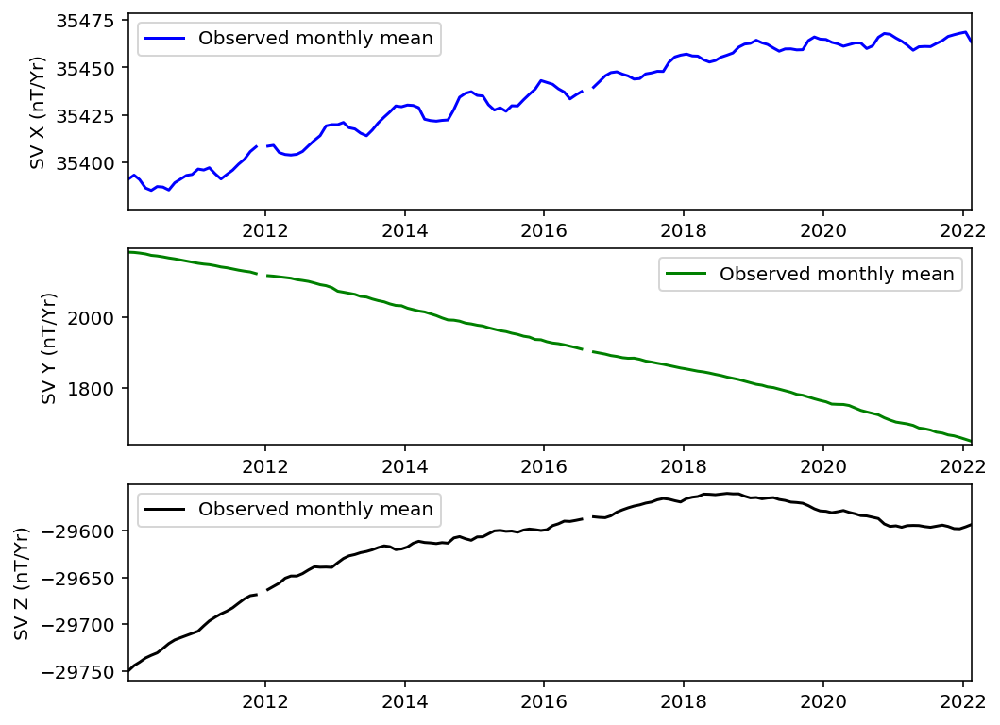

Reading files from KEP...
Initiating geomagnetic field computation for KEP.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


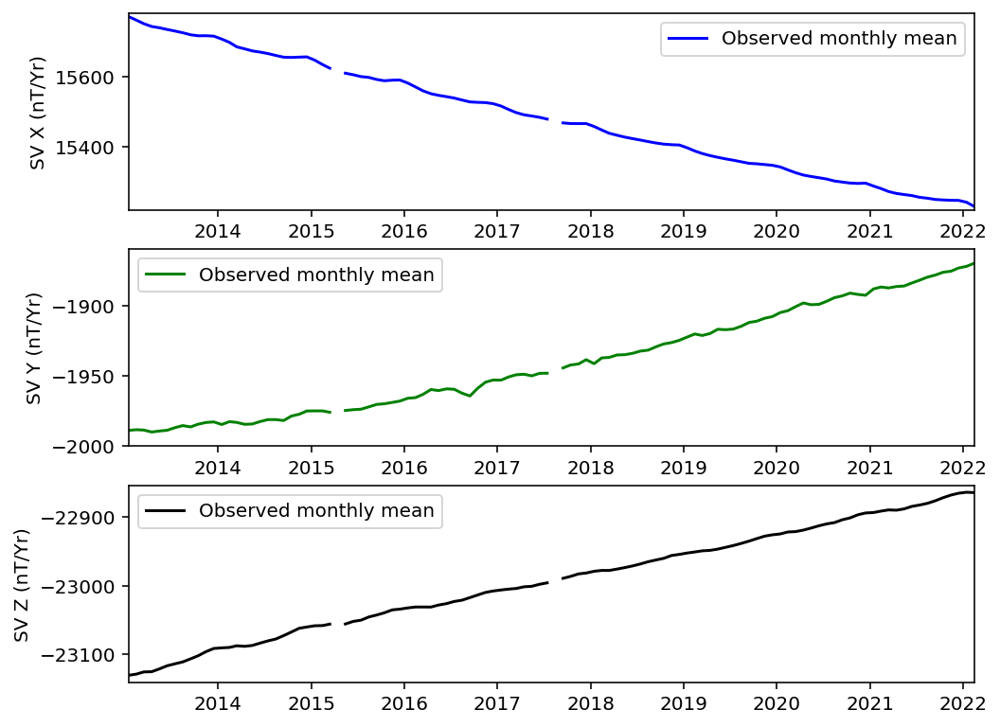

Reading files from KMH...
Initiating geomagnetic field computation for KMH.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


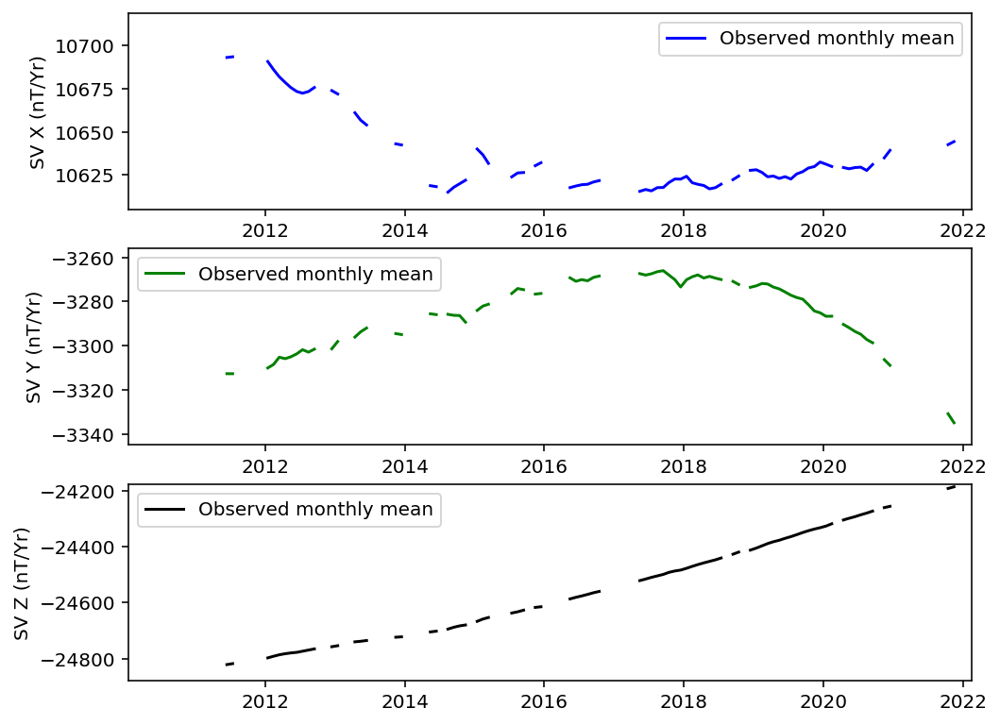

Reading files from KNY...
Initiating geomagnetic field computation for KNY.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


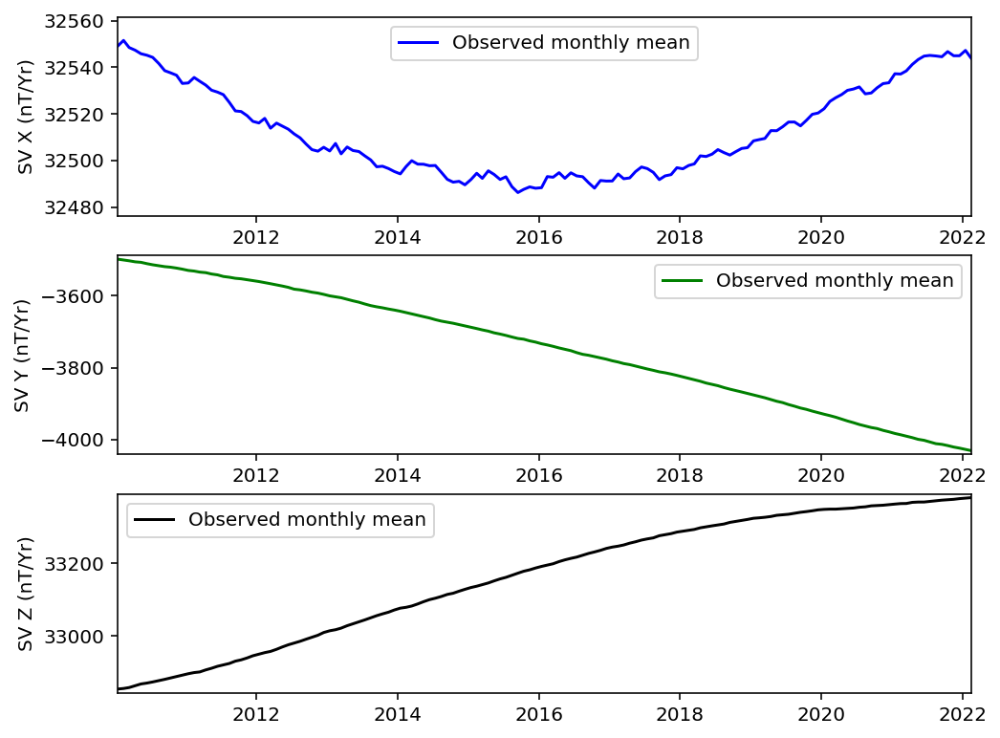

Reading files from KOU...
Initiating geomagnetic field computation for KOU.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


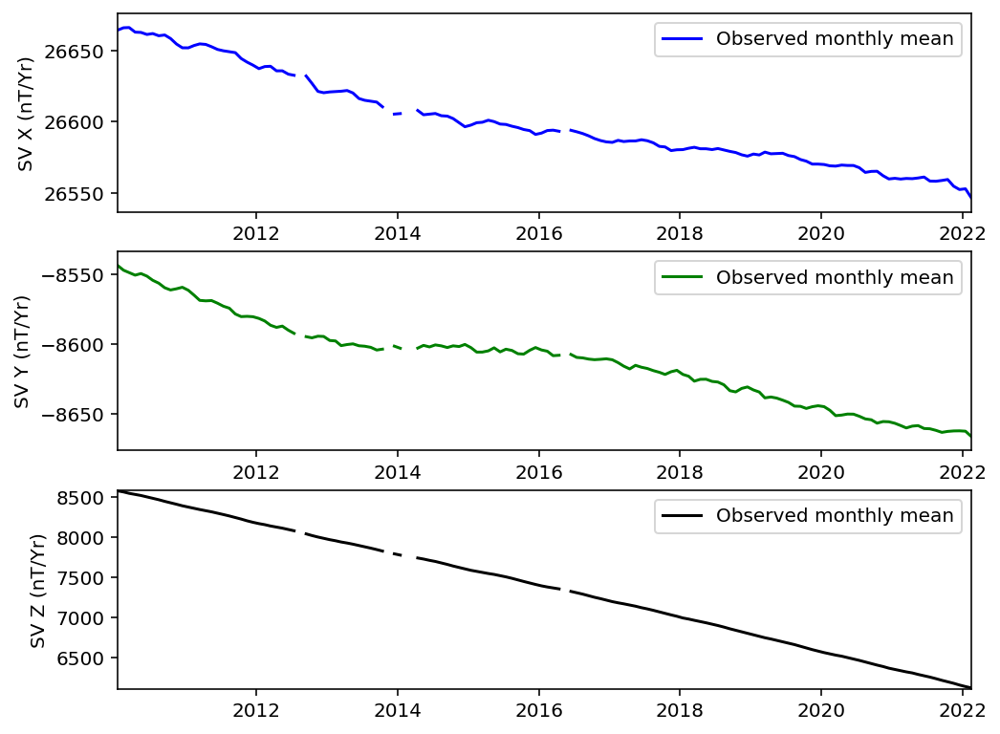

Reading files from LER...
Initiating geomagnetic field computation for LER.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


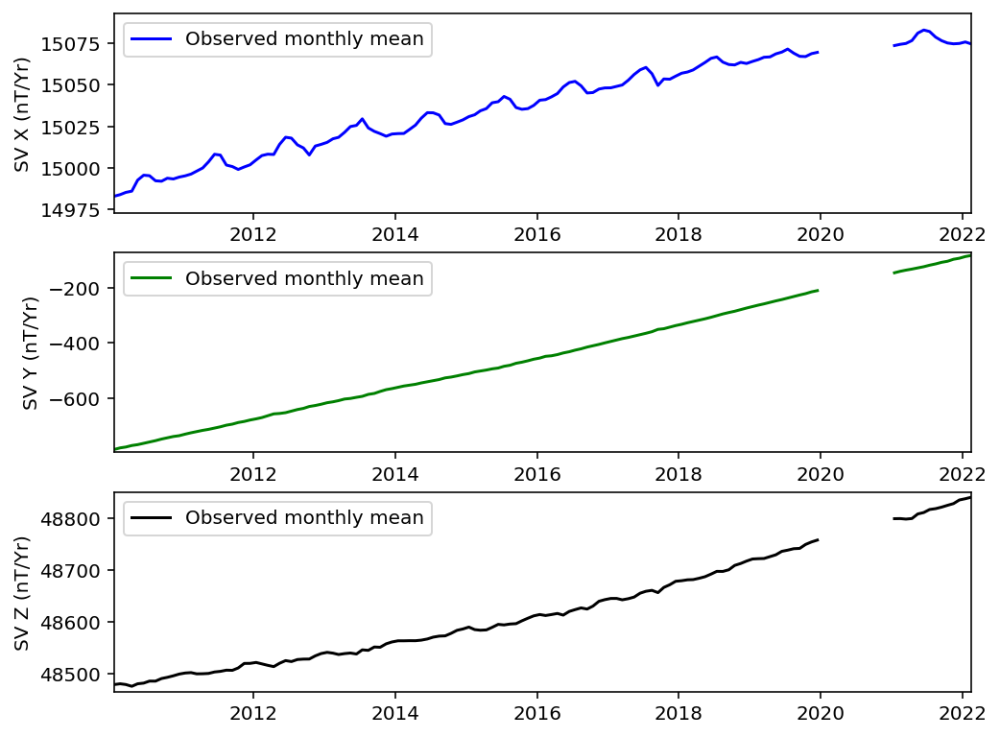

Reading files from LON...
Initiating geomagnetic field computation for LON.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


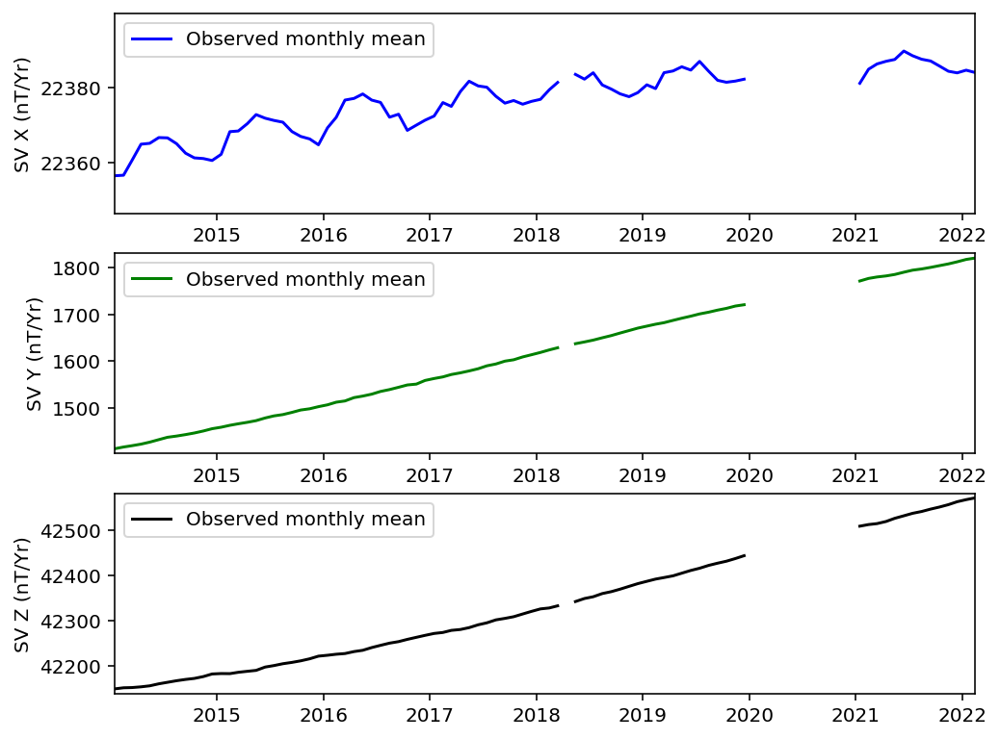

Reading files from LRM...
Initiating geomagnetic field computation for LRM.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


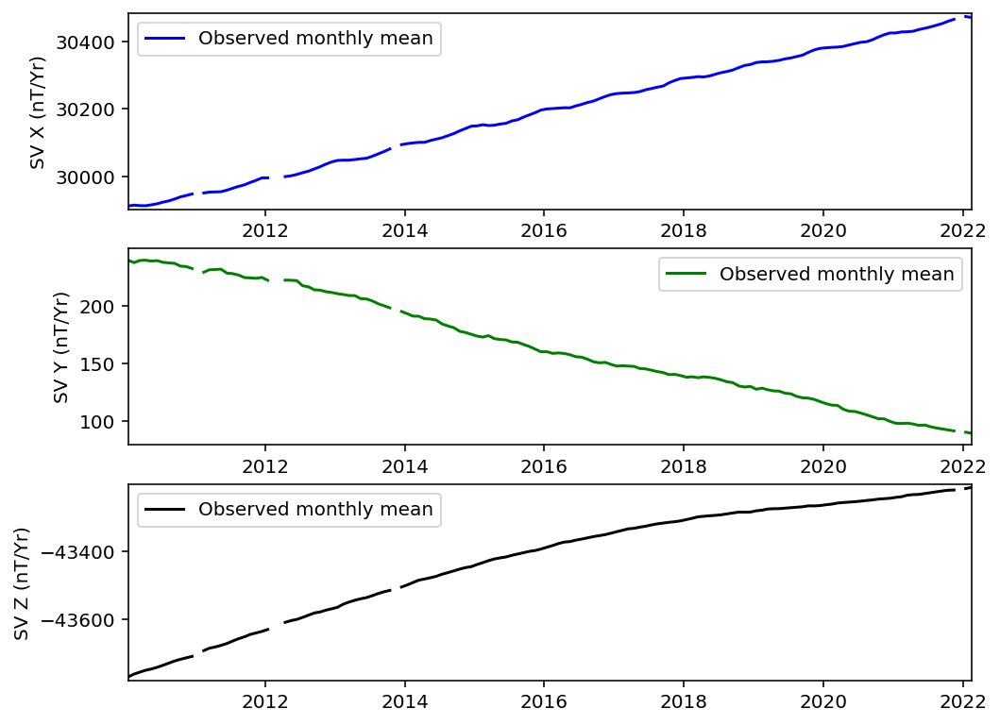

Reading files from LYC...
Initiating geomagnetic field computation for LYC.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


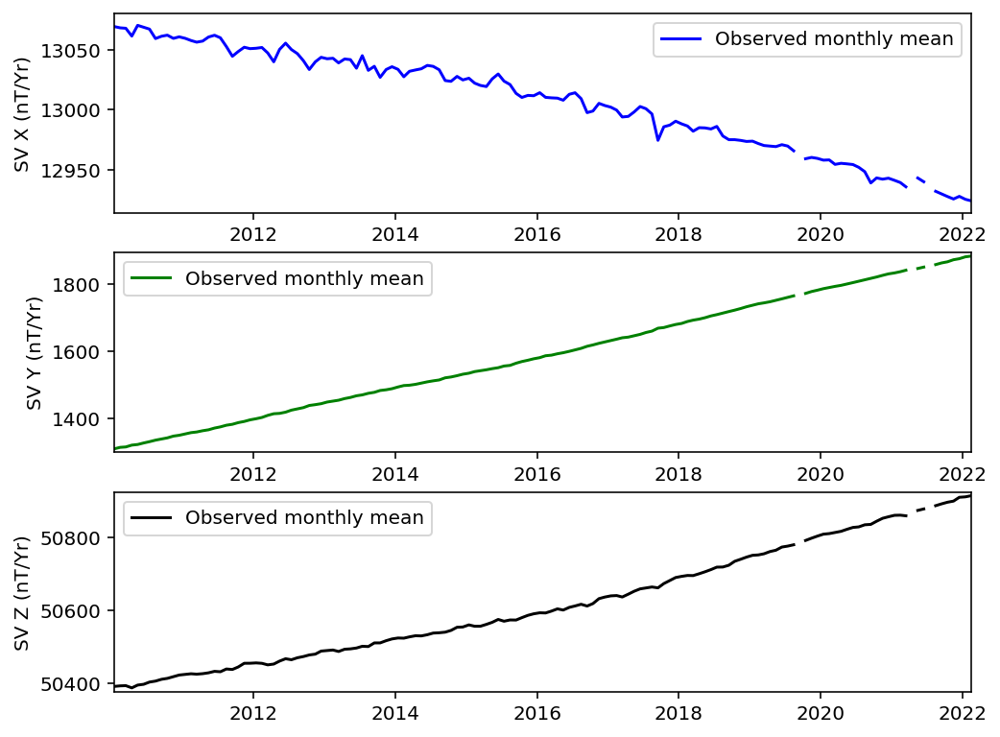

Reading files from MAW...
Initiating geomagnetic field computation for MAW.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


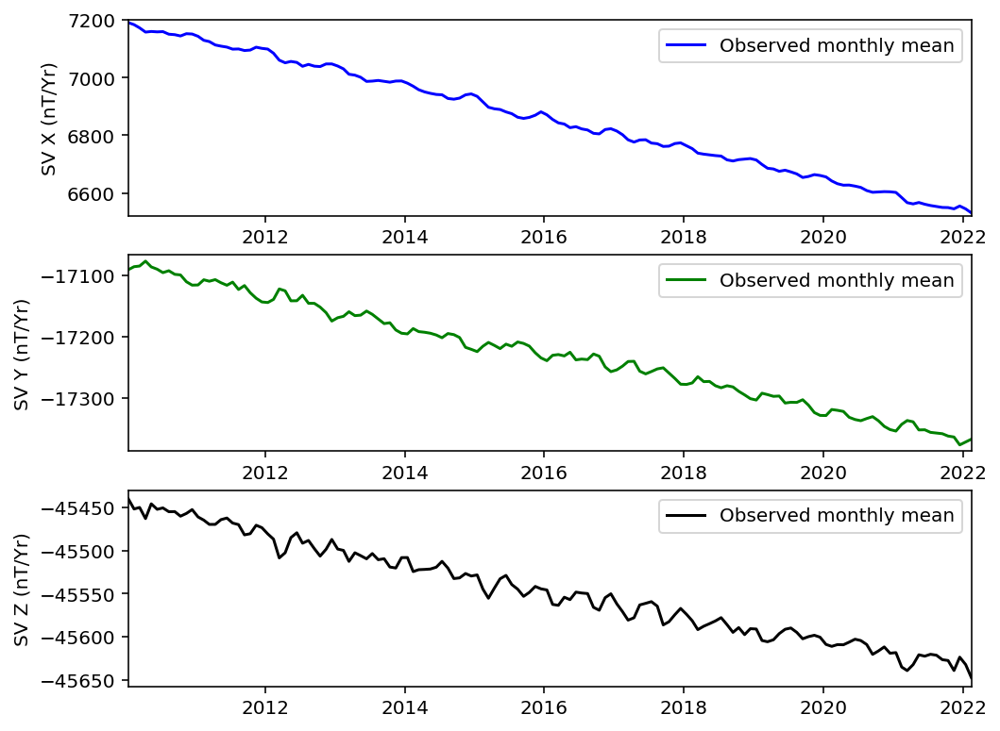

Reading files from MCQ...
Initiating geomagnetic field computation for MCQ.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


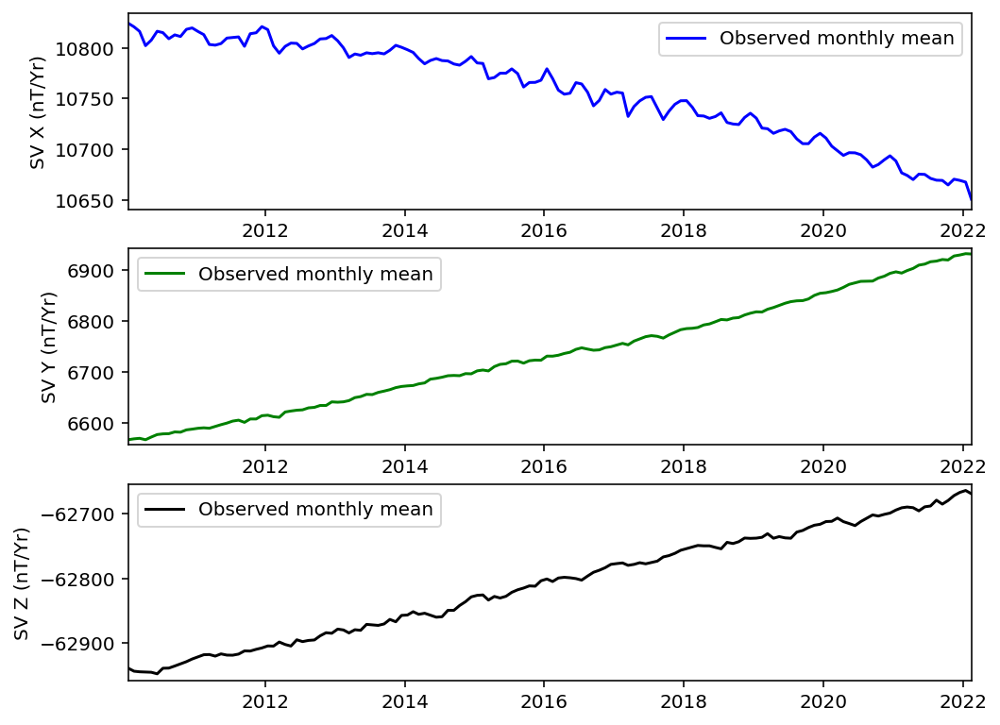

Reading files from MEA...
Initiating geomagnetic field computation for MEA.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


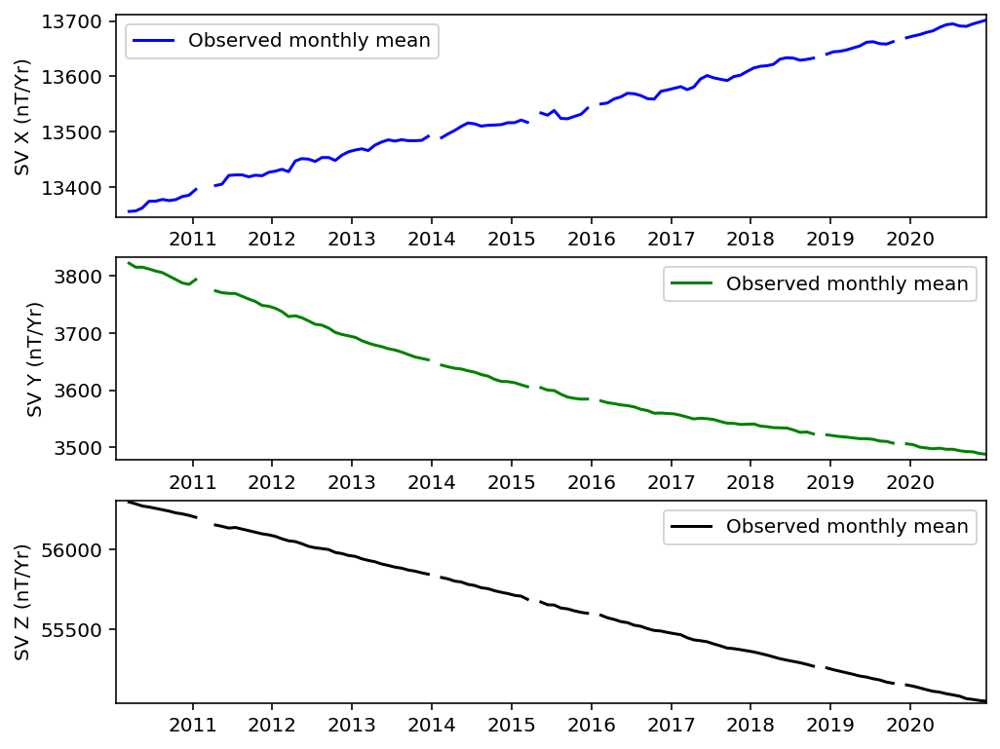

Reading files from MGD...
Initiating geomagnetic field computation for MGD.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


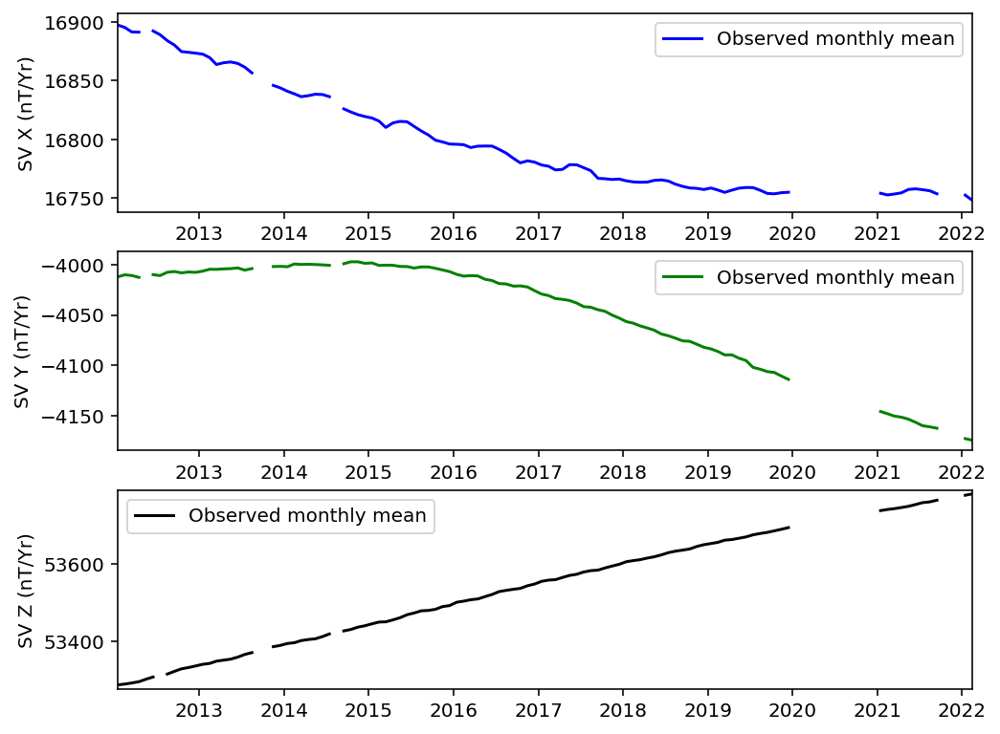

Reading files from MMB...
Initiating geomagnetic field computation for MMB.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


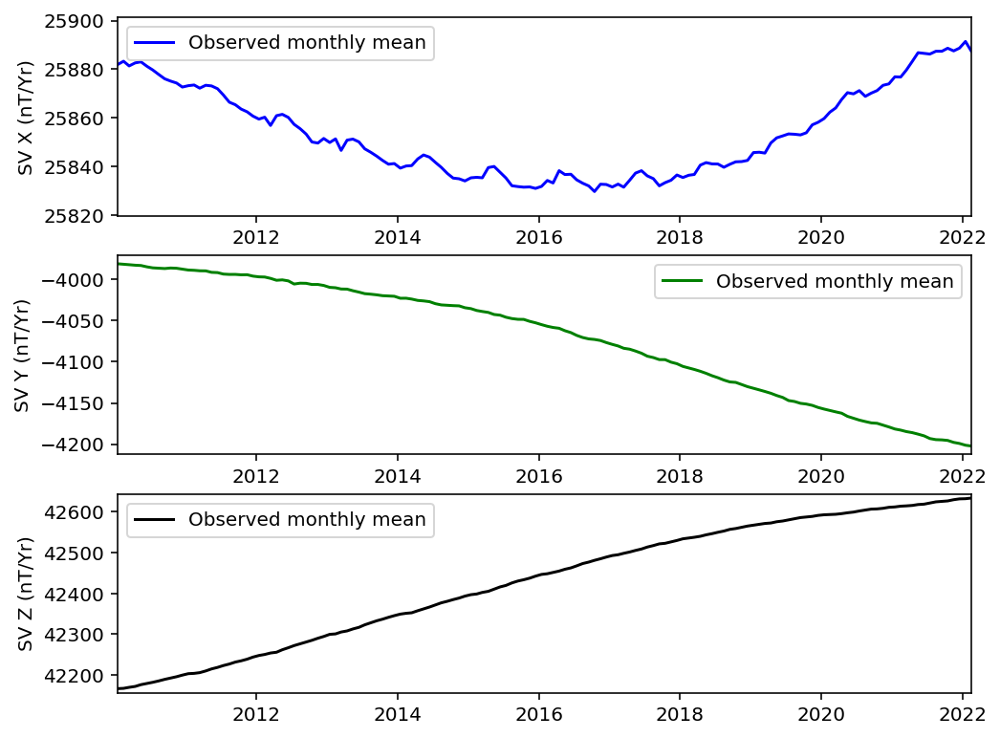

Reading files from NAQ...
Initiating geomagnetic field computation for NAQ.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


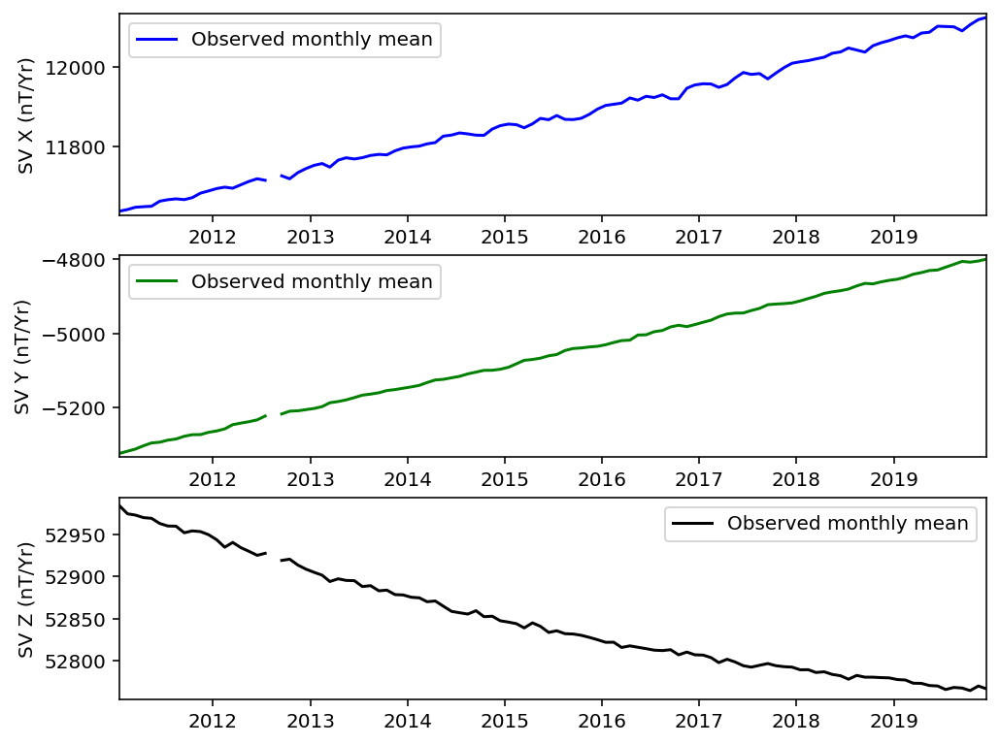

Reading files from NEW...
Initiating geomagnetic field computation for NEW.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


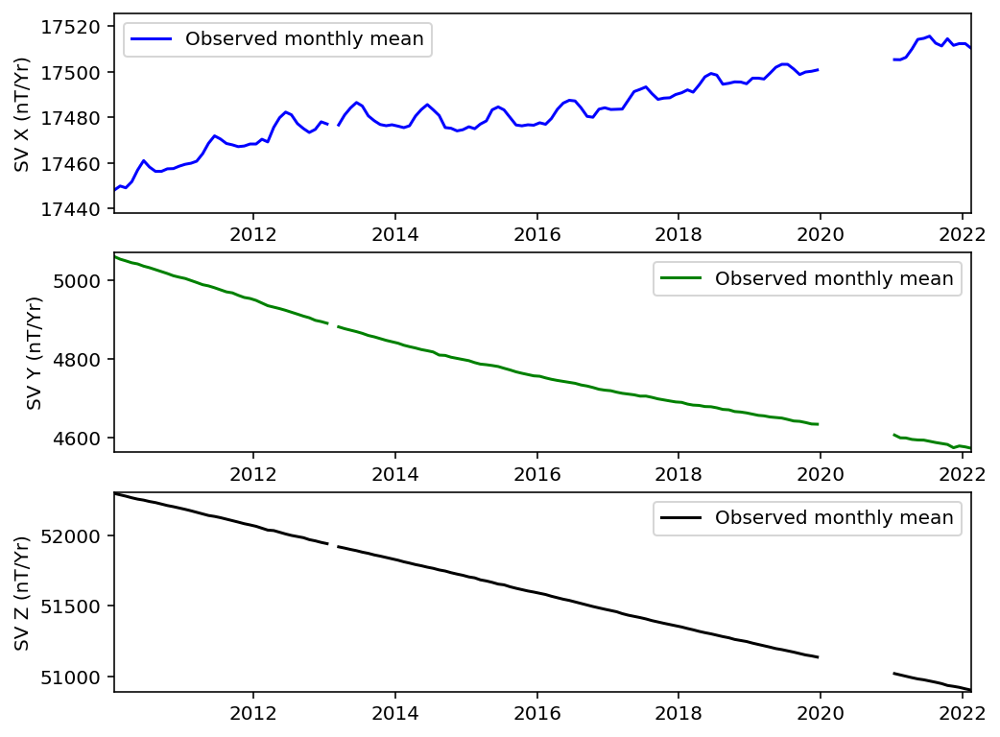

Reading files from NGK...
Initiating geomagnetic field computation for NGK.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


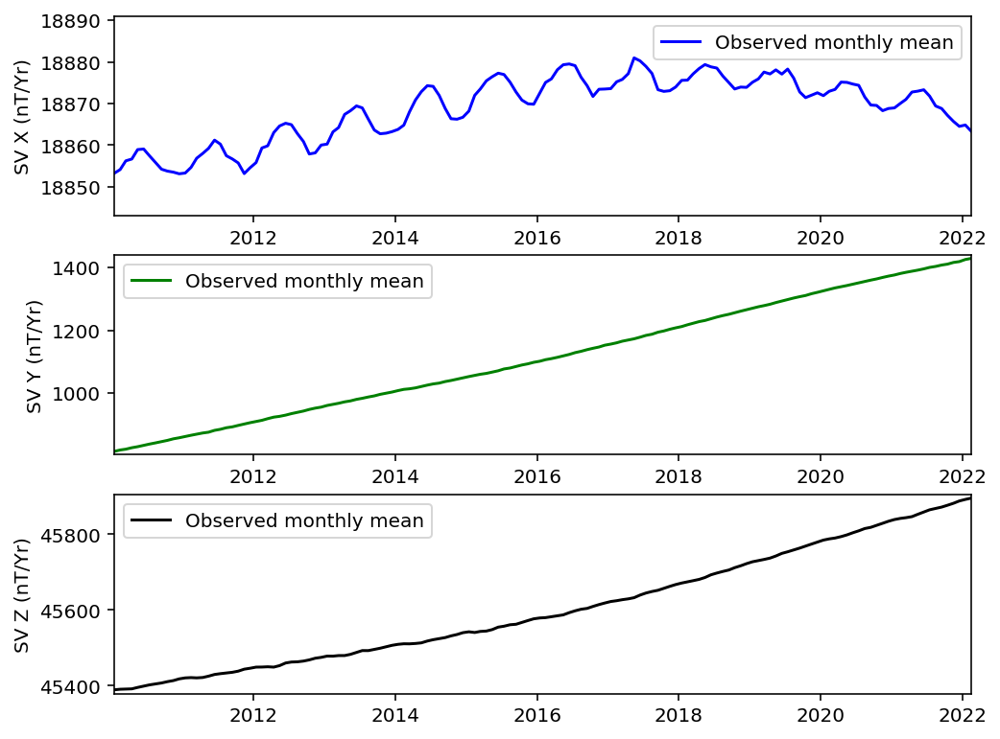

Reading files from NVS...
Initiating geomagnetic field computation for NVS.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


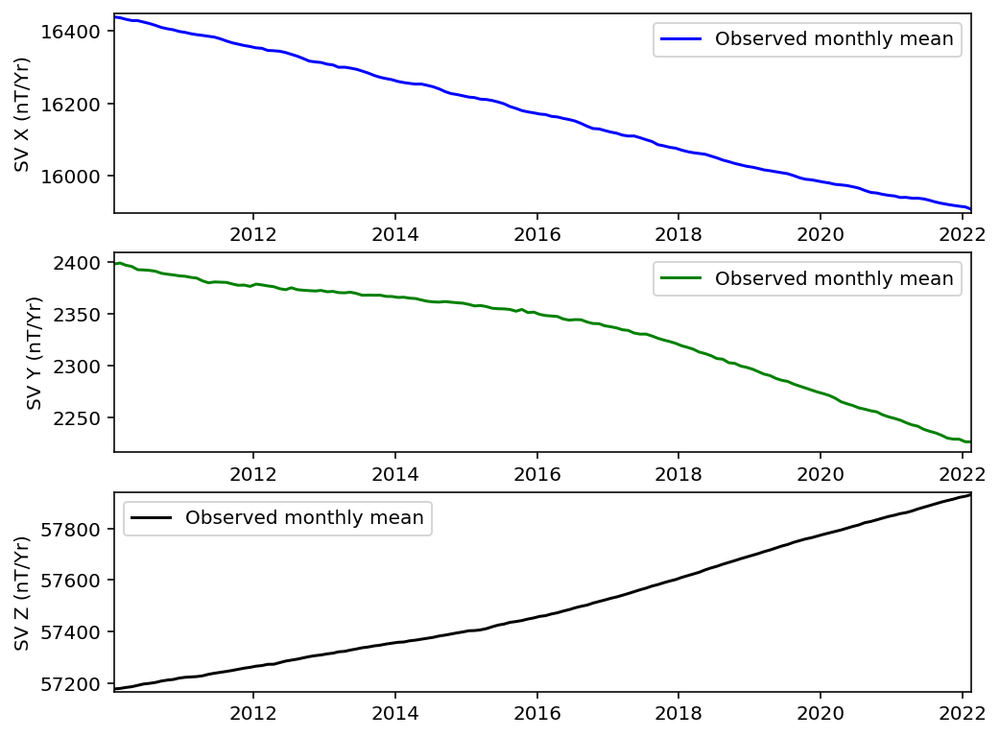

Reading files from OTT...
Initiating geomagnetic field computation for OTT.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


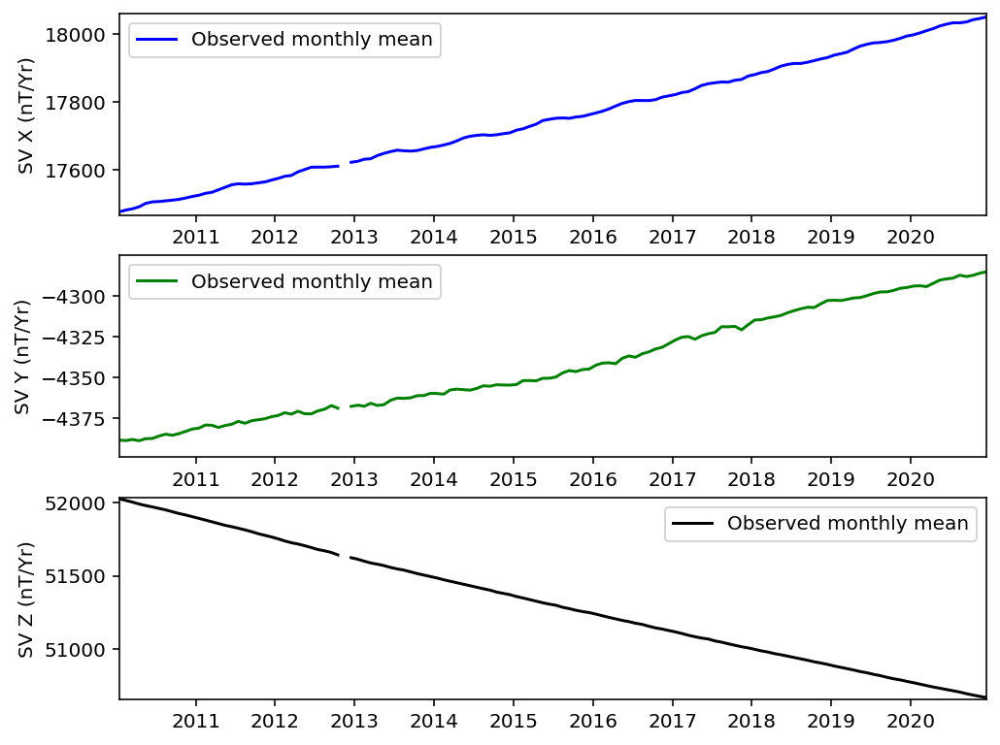

Reading files from PAG...
Initiating geomagnetic field computation for PAG.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


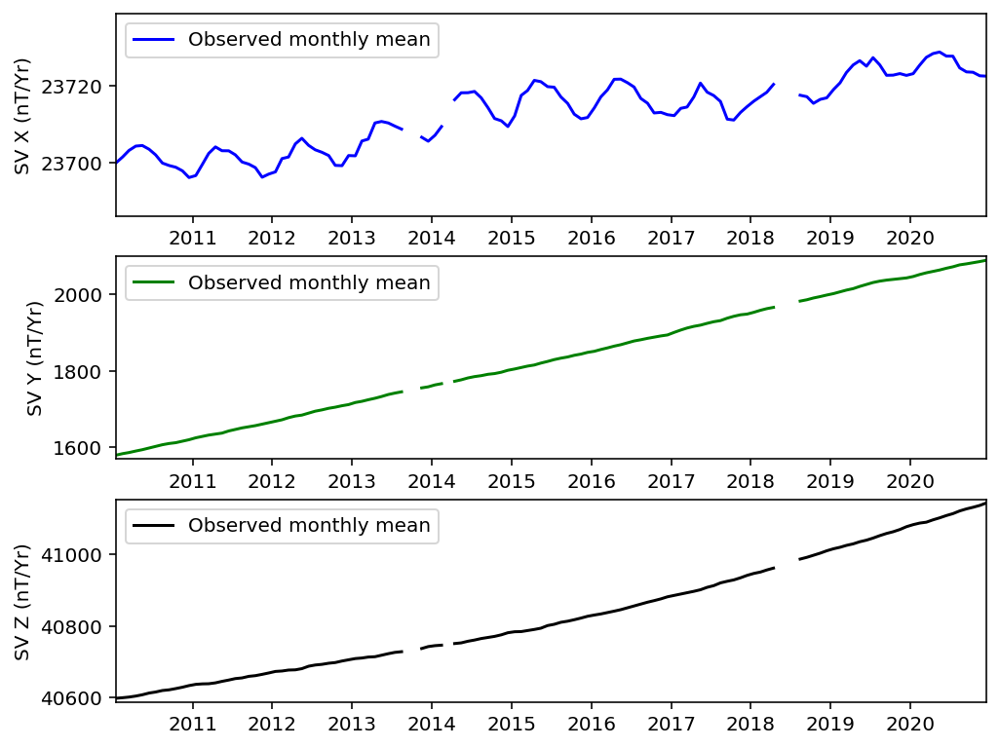

Reading files from PET...
Initiating geomagnetic field computation for PET.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


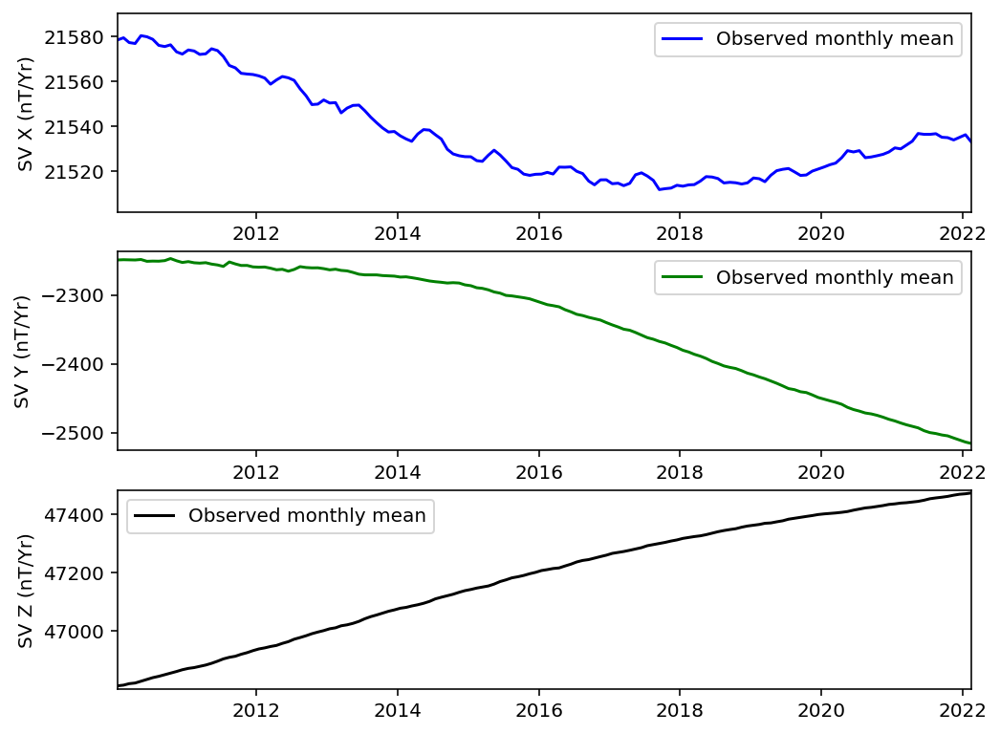

Reading files from PIL...
Initiating geomagnetic field computation for PIL.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


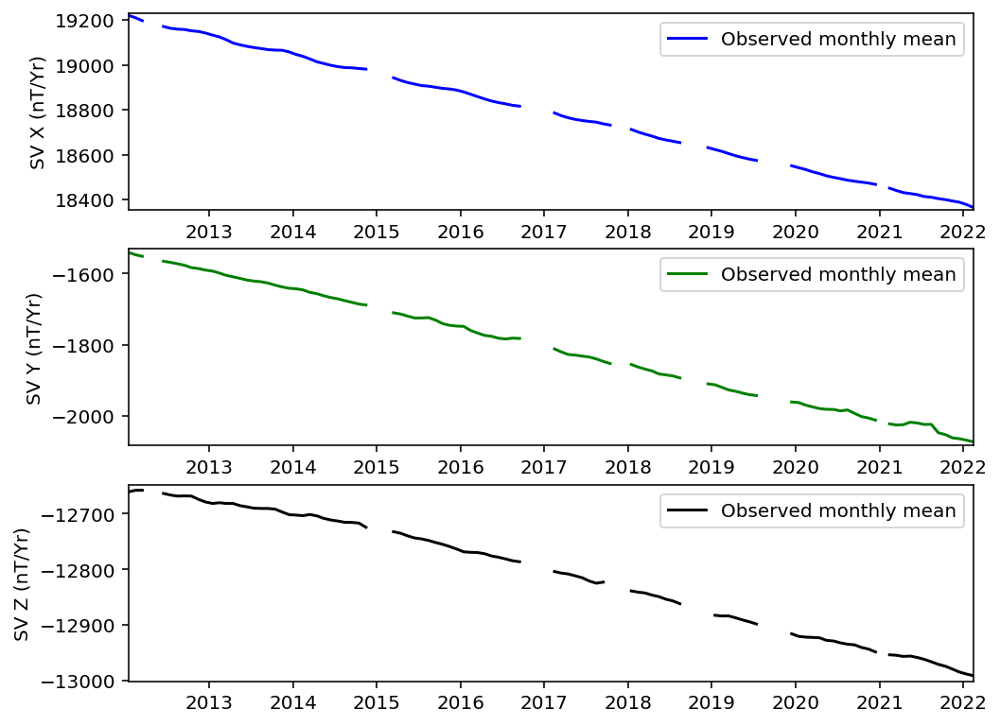

Reading files from PST...
Initiating geomagnetic field computation for PST.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


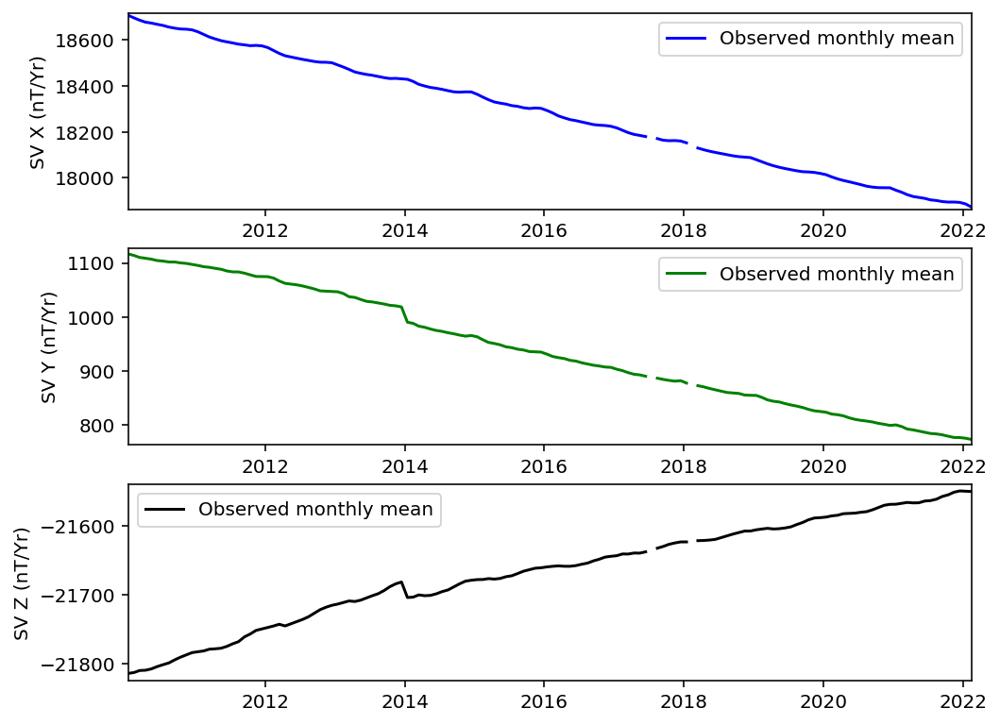

Reading files from RES...
Initiating geomagnetic field computation for RES.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


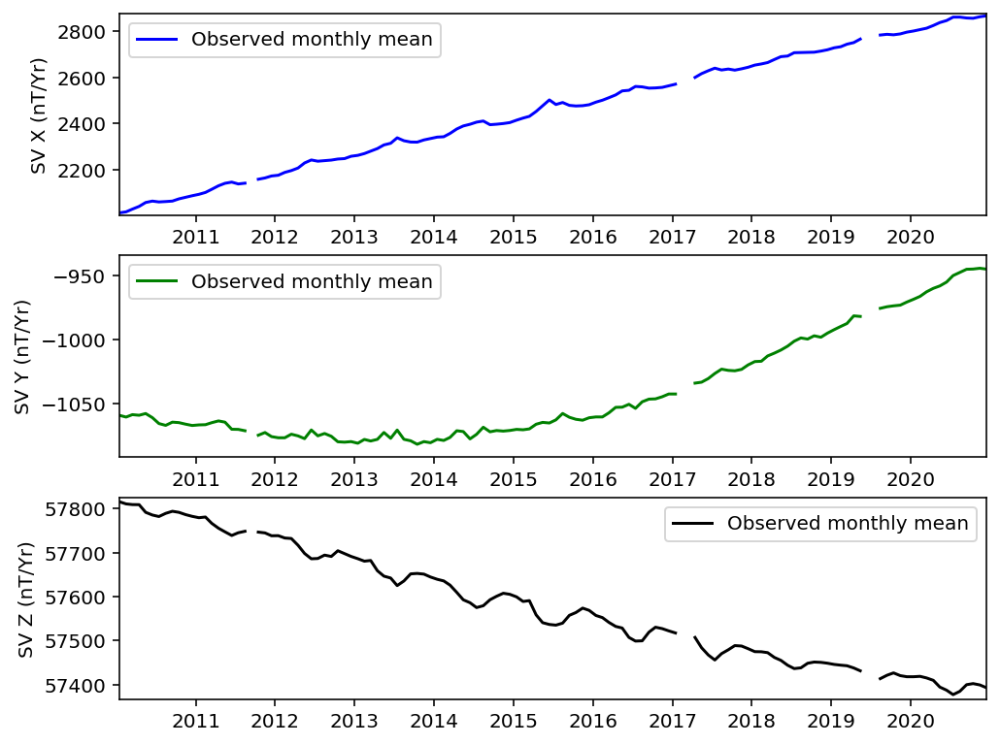

Reading files from SBL...
Initiating geomagnetic field computation for SBL.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


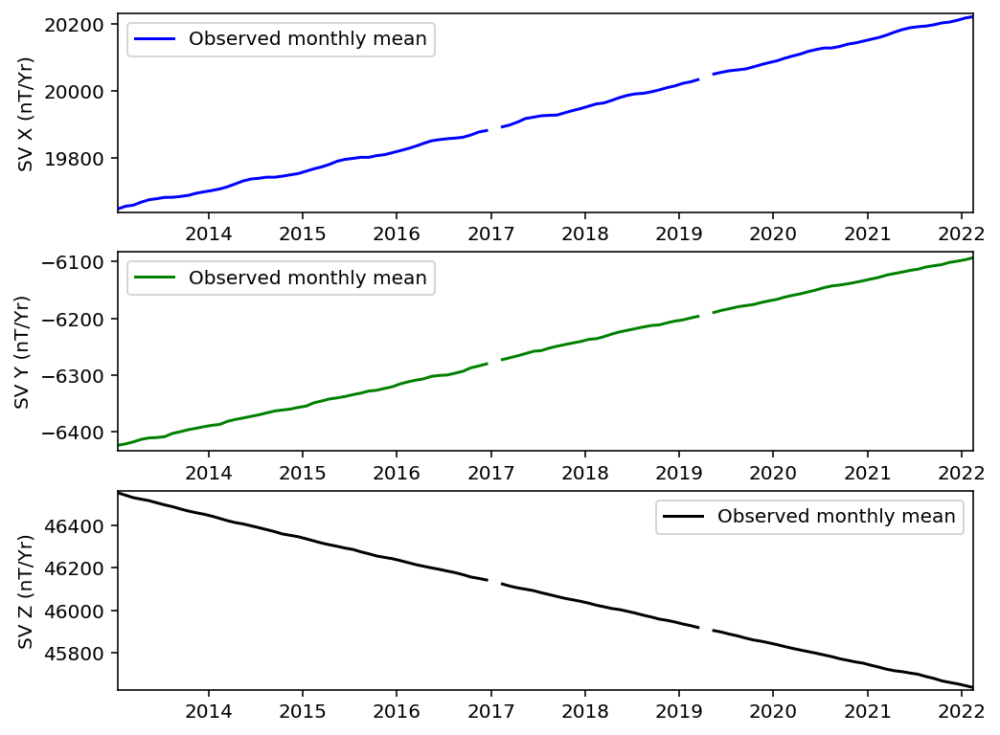

Reading files from SHE...
Initiating geomagnetic field computation for SHE.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


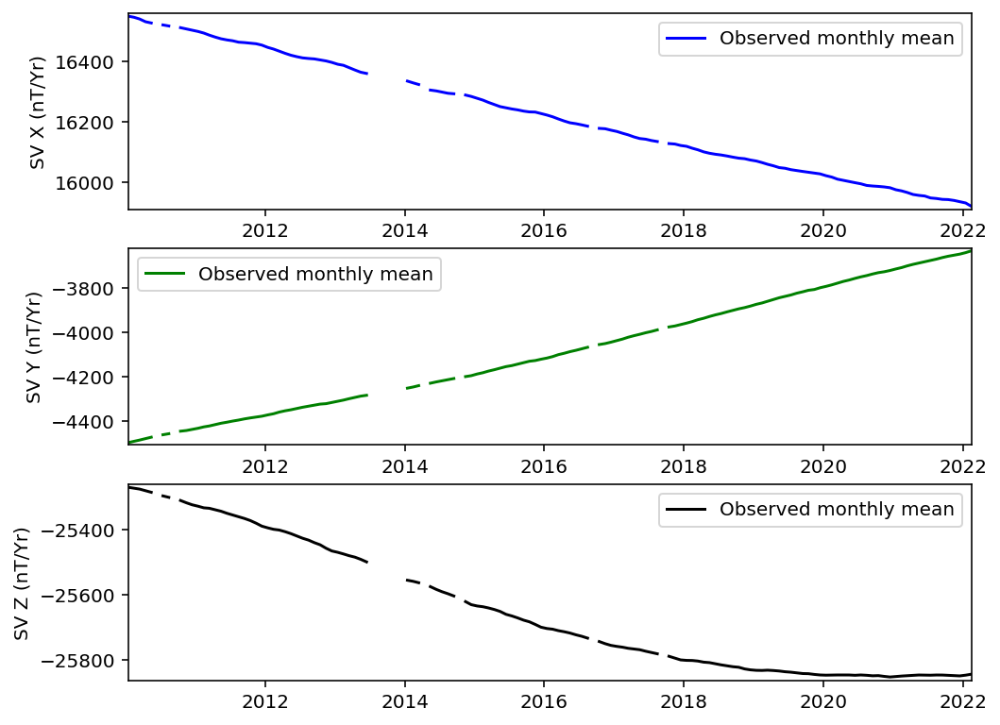

Reading files from SHU...
Initiating geomagnetic field computation for SHU.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


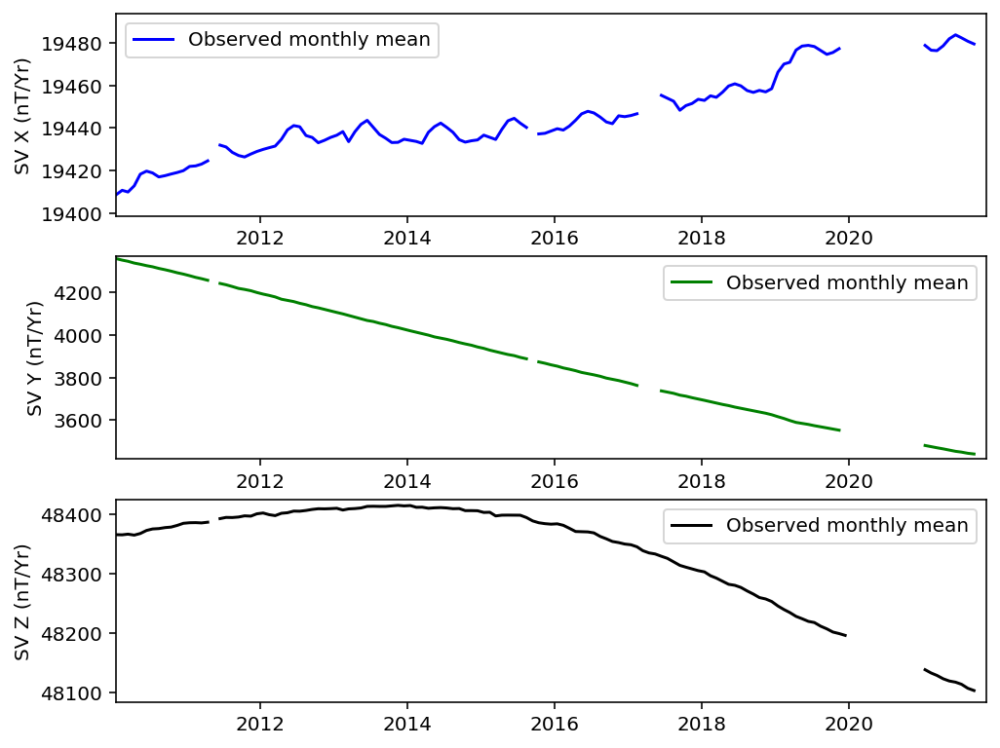

Reading files from SIT...
Initiating geomagnetic field computation for SIT.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


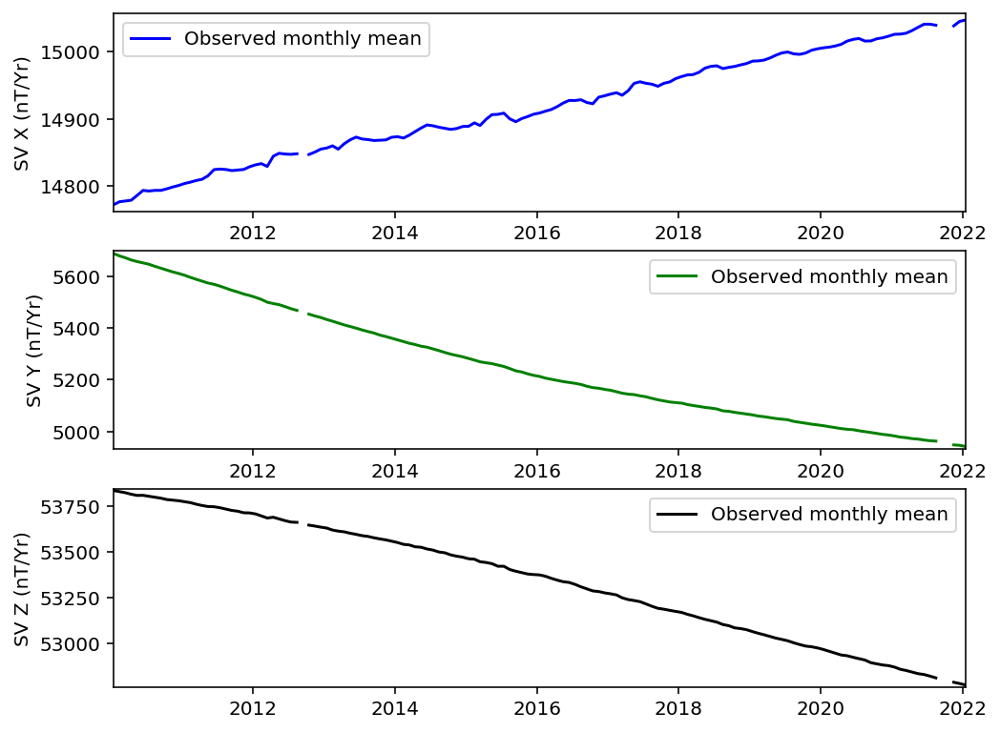

Reading files from SJG...
Initiating geomagnetic field computation for SJG.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


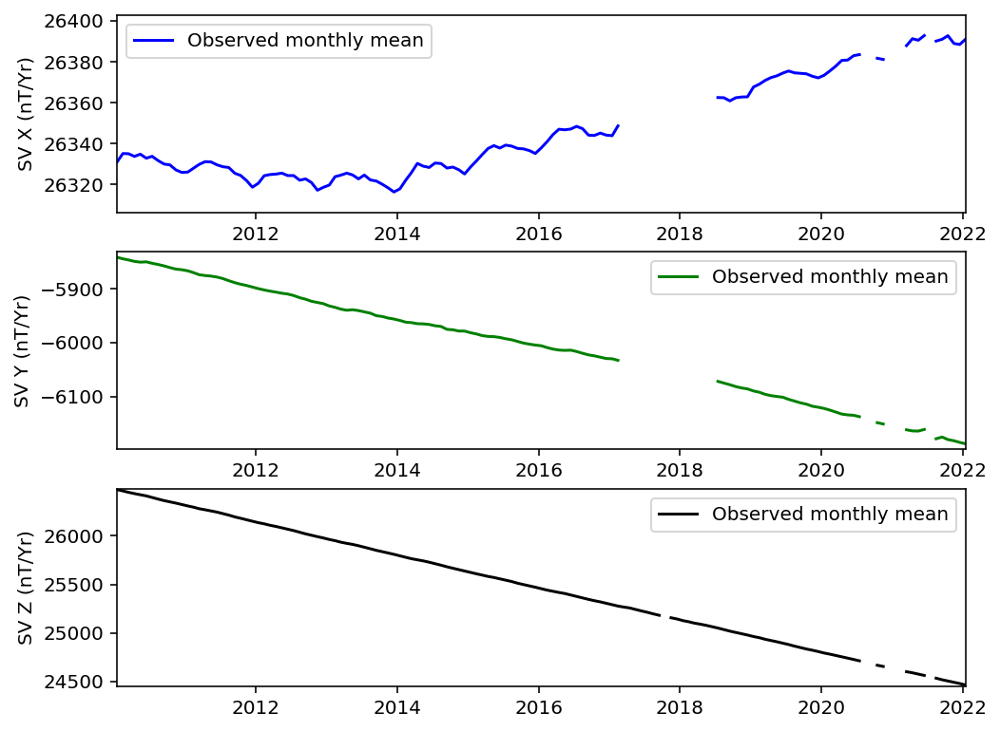

Reading files from SPT...
Initiating geomagnetic field computation for SPT.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


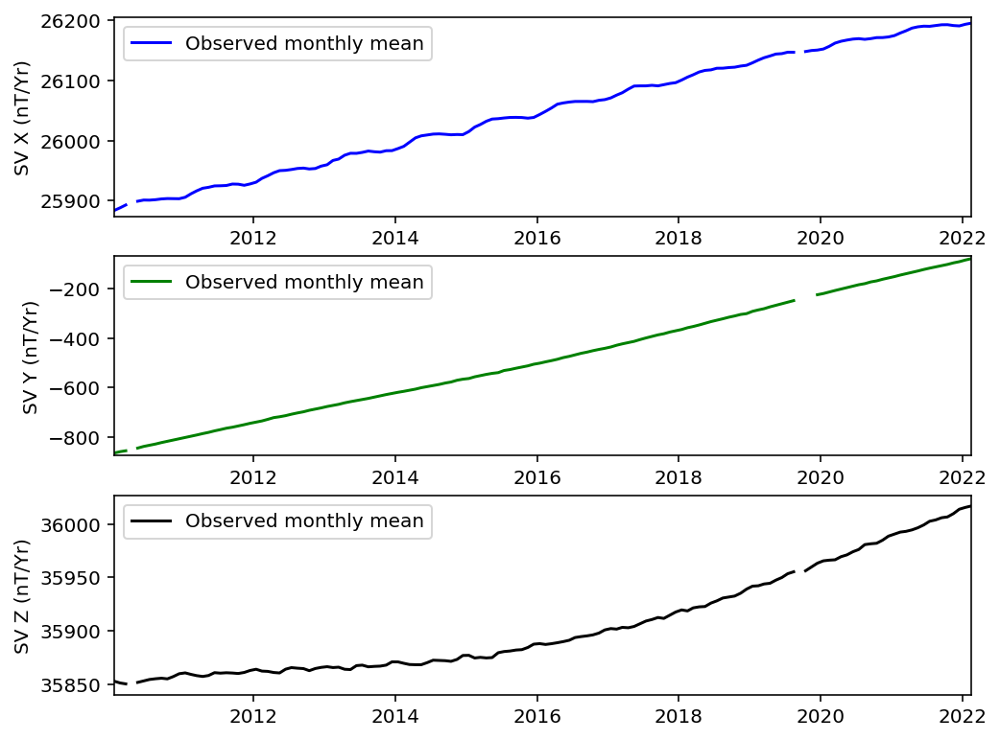

Reading files from STJ...
Initiating geomagnetic field computation for STJ.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


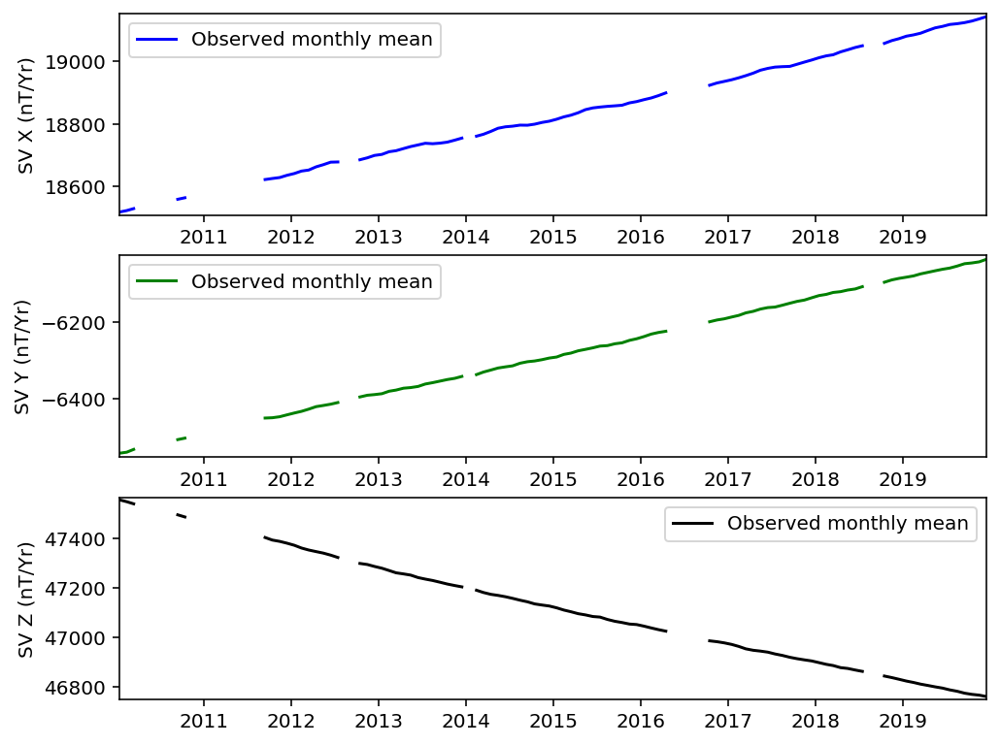

Reading files from SUA...
Initiating geomagnetic field computation for SUA.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


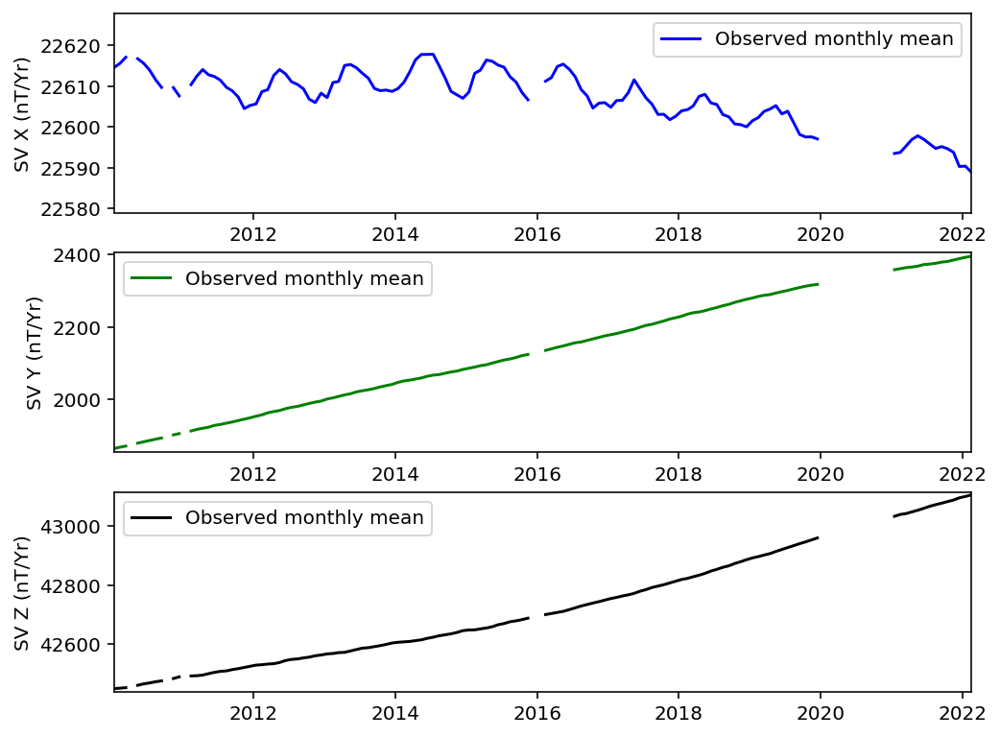

Reading files from TAM...
Initiating geomagnetic field computation for TAM.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


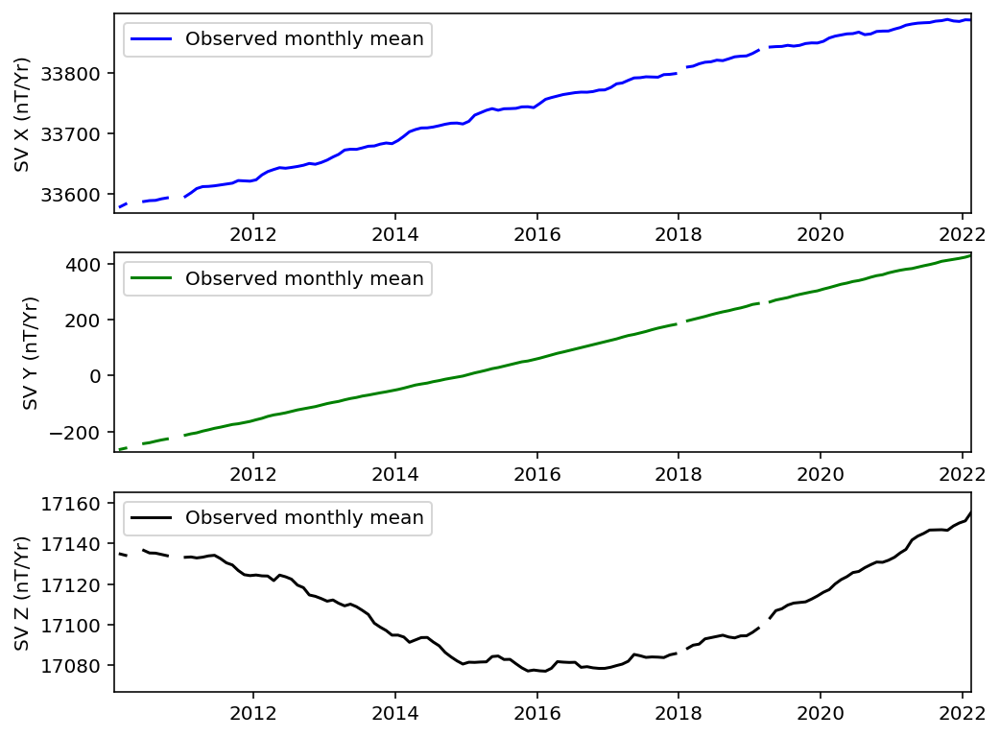

Reading files from TDC...
Initiating geomagnetic field computation for TDC.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


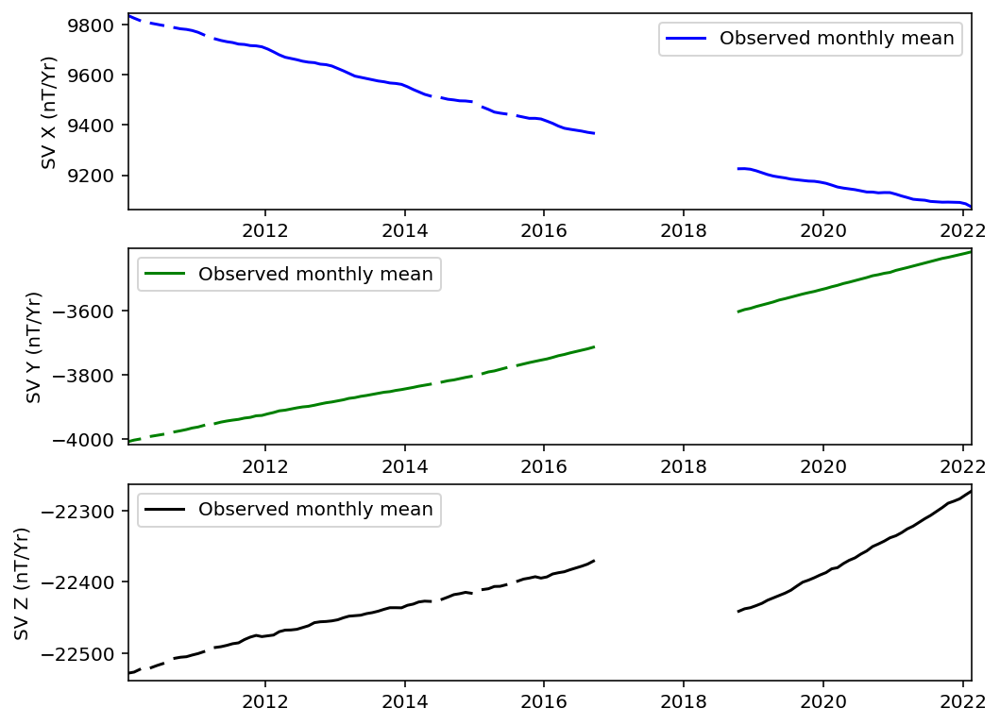

Reading files from THL...
Initiating geomagnetic field computation for THL.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


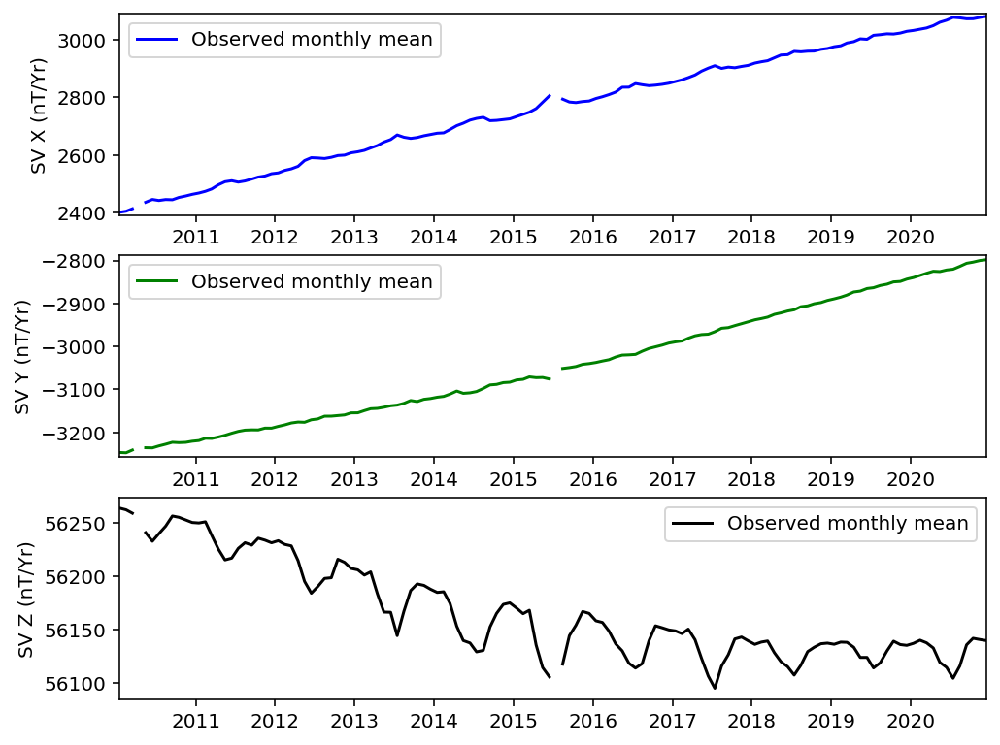

Reading files from THY...
Initiating geomagnetic field computation for THY.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


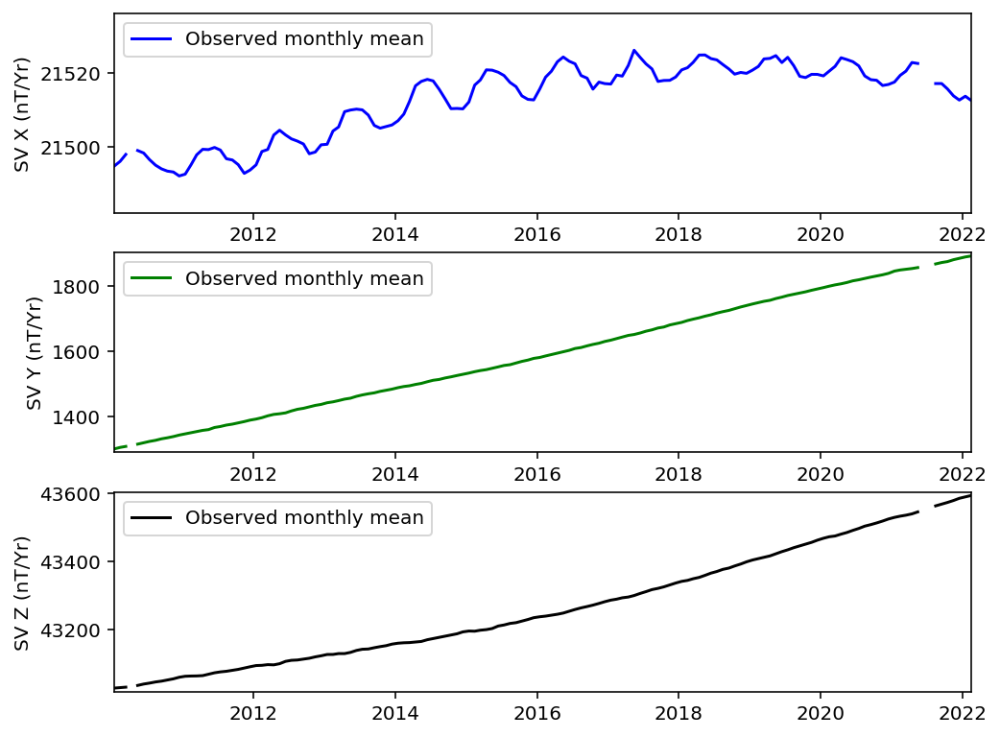

Reading files from TSU...
Initiating geomagnetic field computation for TSU.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


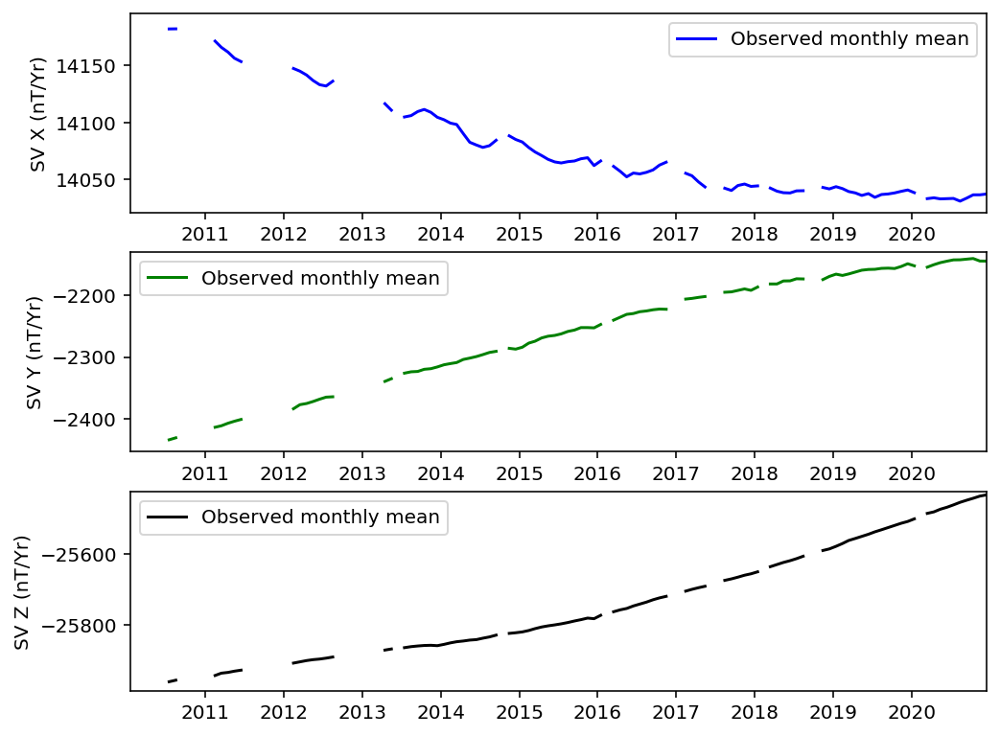

Reading files from TUC...
Initiating geomagnetic field computation for TUC.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


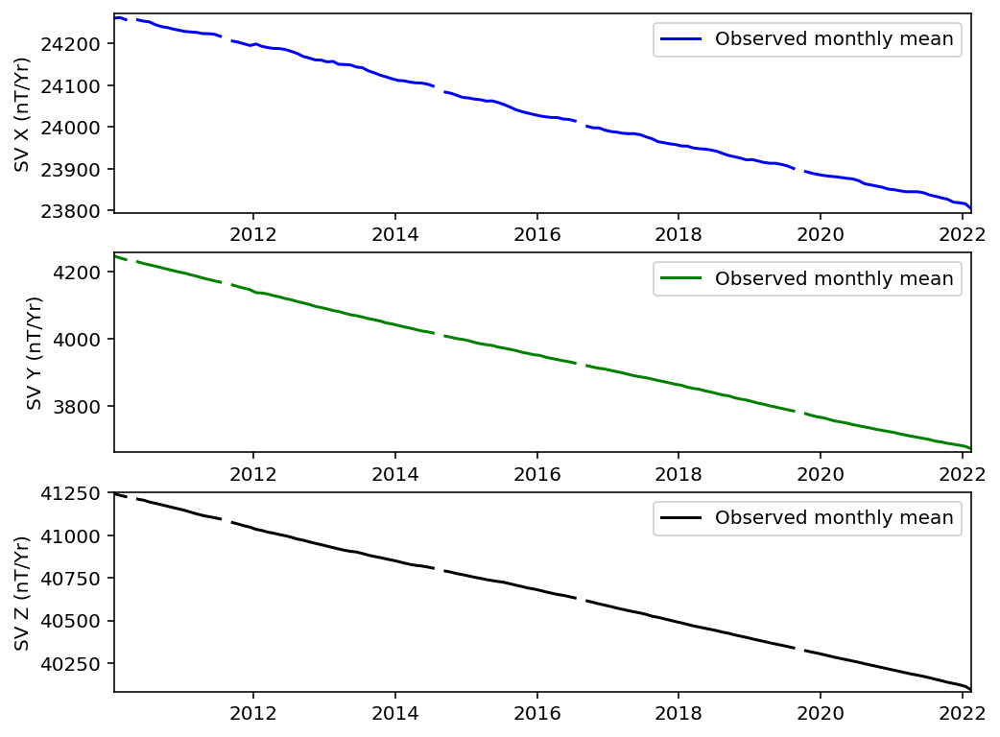

Reading files from UPS...
Initiating geomagnetic field computation for UPS.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


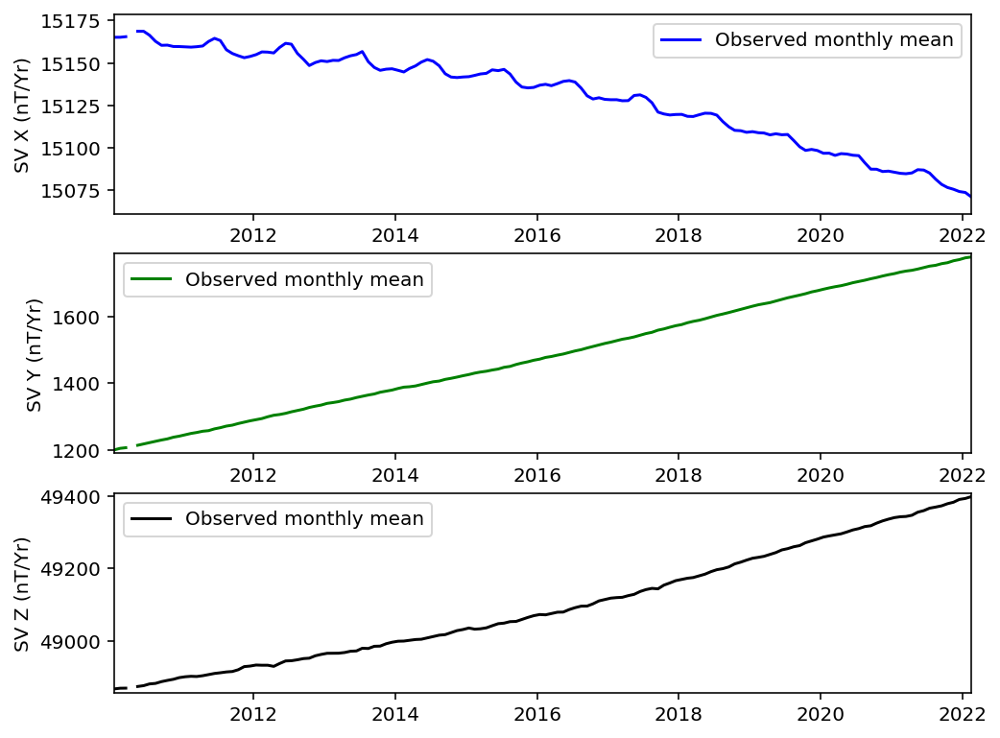

Reading files from VIC...
Initiating geomagnetic field computation for VIC.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


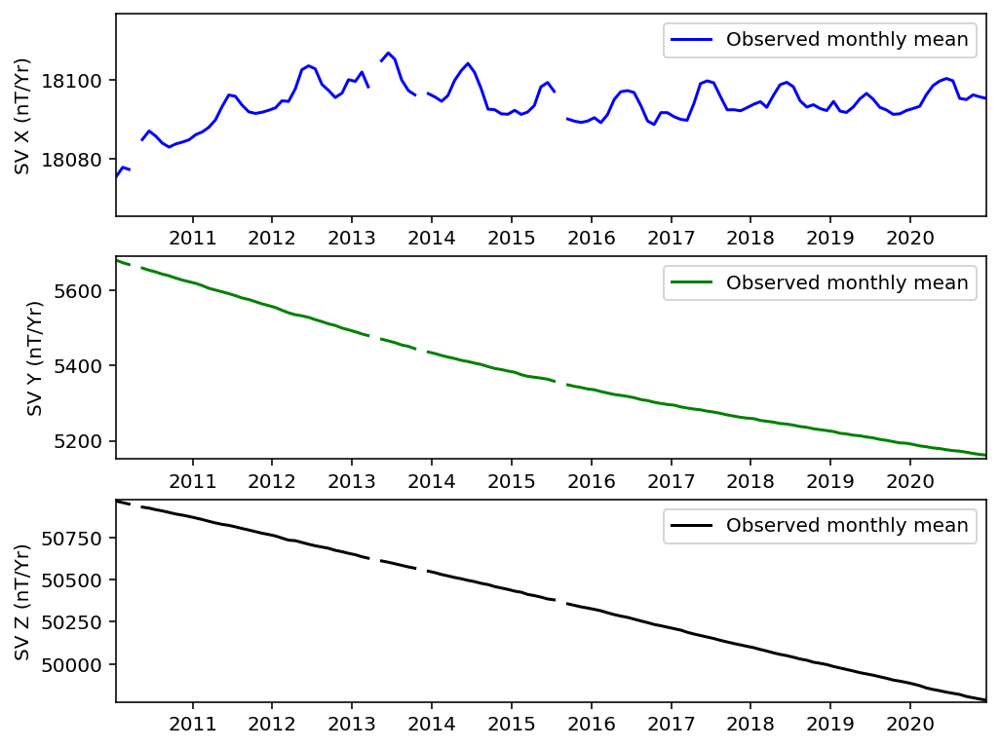

Reading files from VNA...
Initiating geomagnetic field computation for VNA.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


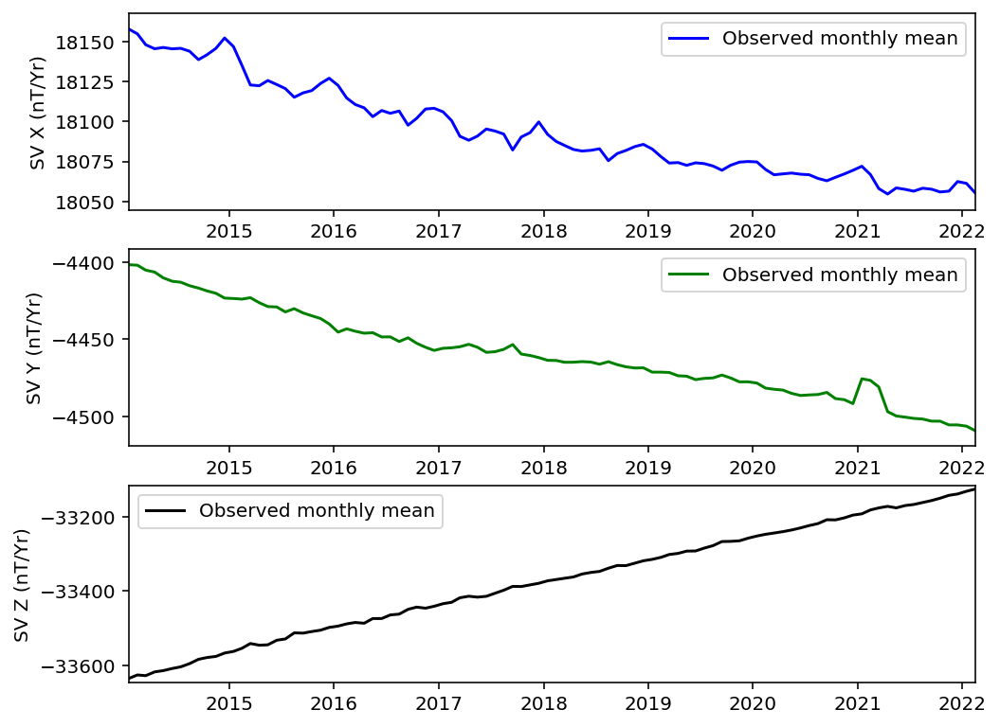

Reading files from VSS...
Initiating geomagnetic field computation for VSS.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


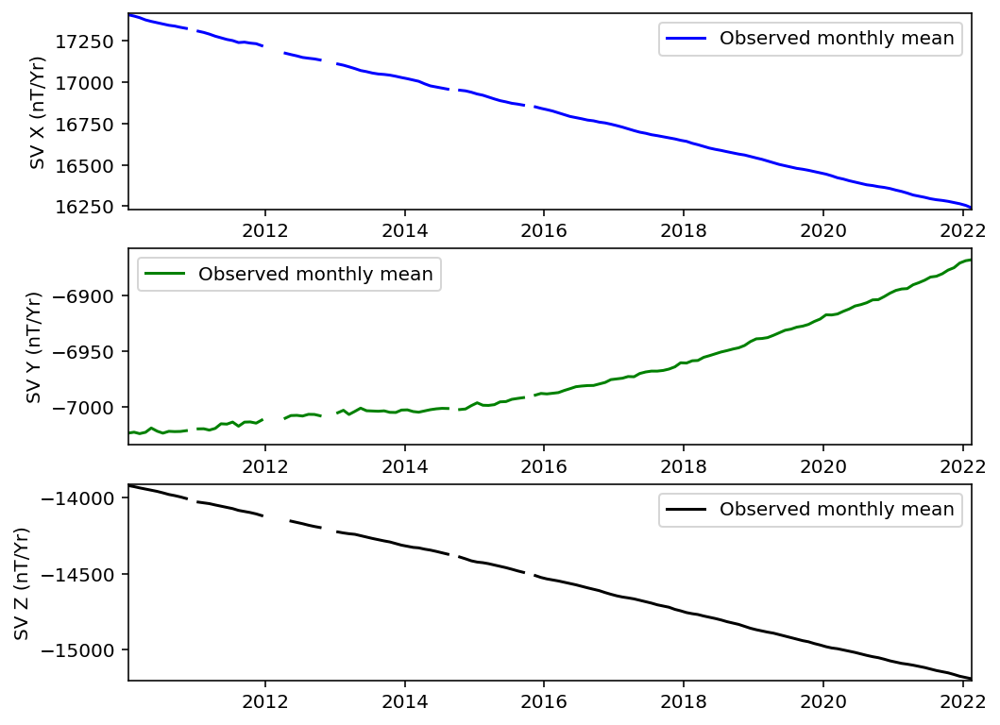

Reading files from WNG...
Initiating geomagnetic field computation for WNG.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


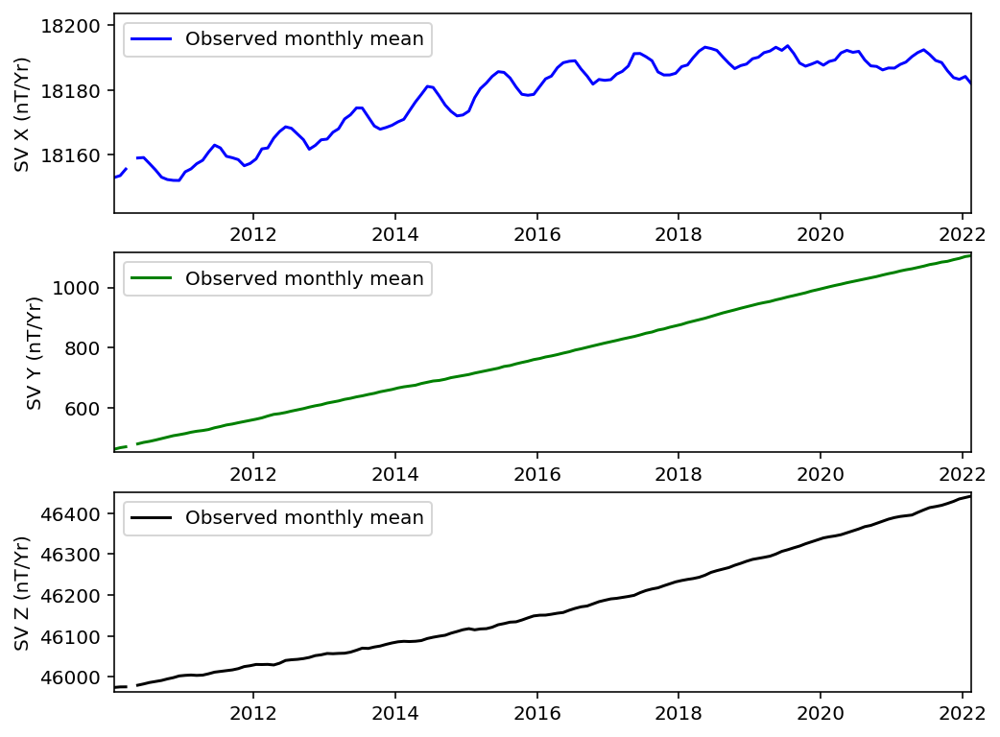

Reading files from YAK...
Initiating geomagnetic field computation for YAK.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


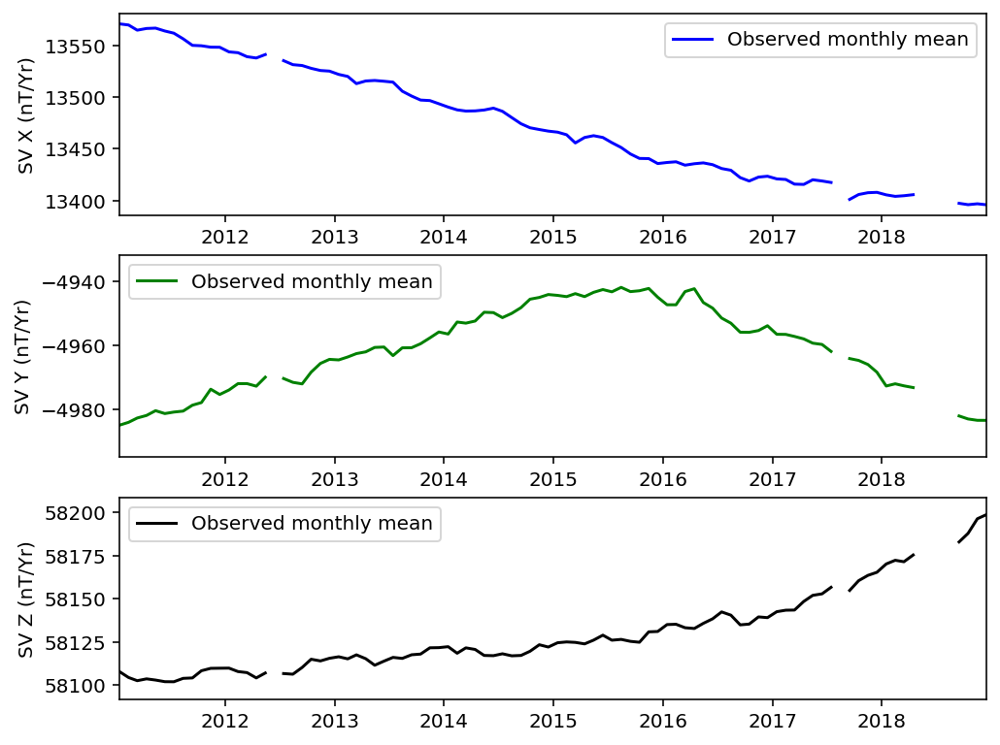

Reading files from LZH...
Initiating geomagnetic field computation for LZH.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


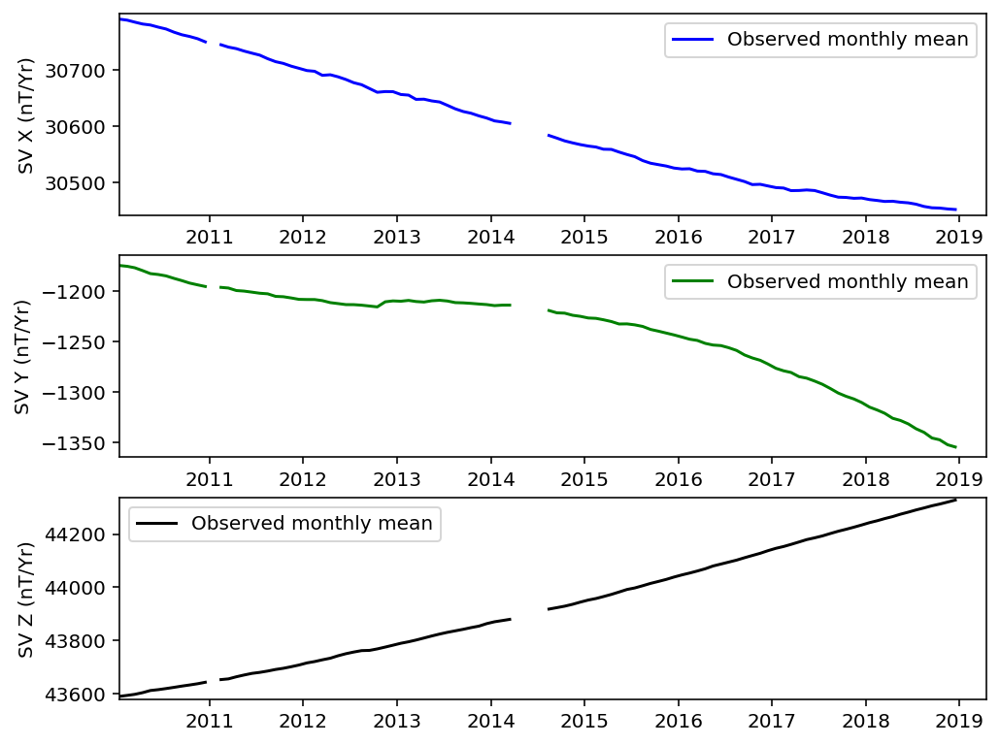

Reading files from MBO...
Initiating geomagnetic field computation for MBO.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.


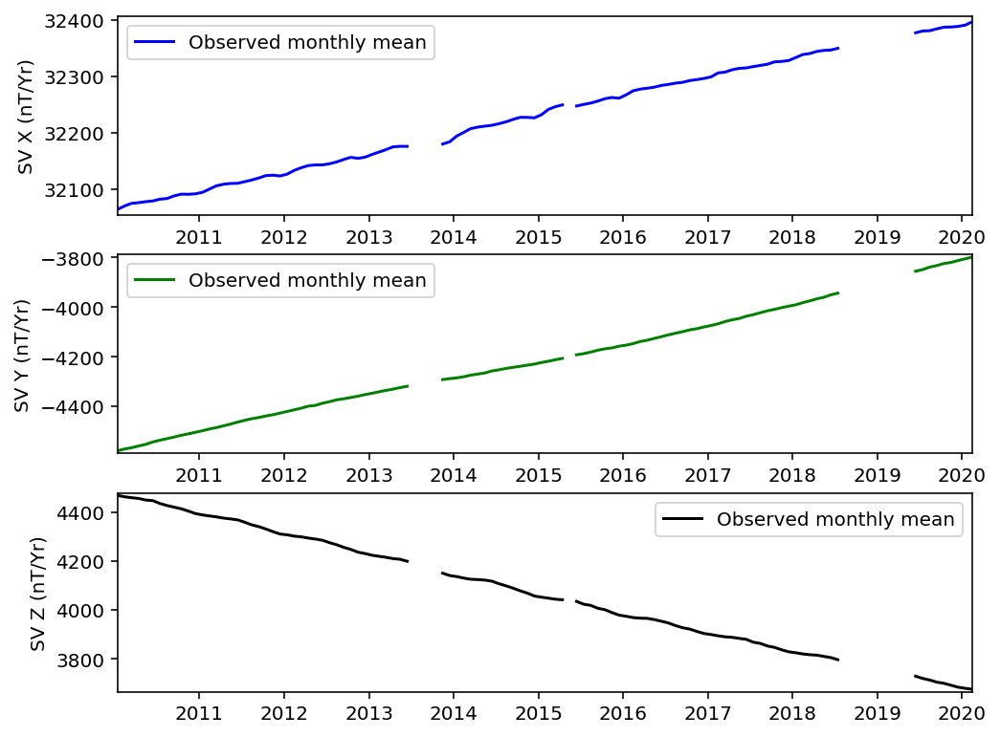

In [4]:
#df_RMS2['Y_RMS'] = []
#df_RMS2['Z_RMS'] = []
stations = ['BRW','VSS']
starttime = '2000-01-01'
endtime = '2022-04-30'
bad_imos = []


#df_RMS = pd.DataFrame()
for station in df_RMS.index:
    #computing dataframe for the selected period
    
    path = f'RMS_figures/{station}_RMS_monthly_mean_MAP.jpeg'
    if os.path.isfile(path) == True:
        pass
    else:
        try:
            df_station =  mvs.load_INTERMAGNET_files(station,
                                                     starttime = starttime,
                                                     endtime = endtime)
            
            df_station = utt.HDZ_to_XYZ_conversion(station = station, dataframe=df_station)
                                                
                                                 
        except:
            print(f'No files for { station.upper()} in the selected period')
            bad_imos.append(station)
            
            continue
            
        if len(df_station.resample('M').mean()) <= 48:
            print('not enought data for secular variation')
                                                 
                                                 
        else:
            
            
            #df_Station = pd.read_csv('SV_update/' + station + '_data/SV_'+ station + '.txt', sep = '\t', skiprows = 9, index_col='Date')
            #df_station.index = pd.to_datetime(df_Station.index)
            #path = glob.glob(f'SV_update/{station.upper()}_data/{station.upper()}*')
            #df_chaos = pd.read_csv(path[0],
            #                       sep = '\s+',
            #                       header = None,
            #                       skiprows = 1,
            #                       usecols= [0,1,2,3],
            #                       names = ['Date','X','Y','Z'],
            #                       index_col = 'Date')
            #df_chaos.index = pd.to_datetime(df_chaos.index)
            df_station, df_chaos= dpt.external_field_correction_chaos_model(station = station,
                                                                            starttime = starttime,
                                                                            endtime = endtime,
                                                                            df_station =df_station,
                                                                            df_chaos = None)
            
            #df_station_sv = dpt.calculate_SV(dataframe = df_station,
            #                                 method= 'ADMM',
            #                                 columns = None, apply_percentage=True)
            ##
            #df_chaos_sv = dpt.calculate_SV(dataframe = df_chaos,
            #                               method = 'ADMM',
            #                               columns = ['X_int','Y_int','Z_int'])
            
            #rms = dpt.rms(df_chaos_sv,df_station_sv)
            
            df_station_sv = dpt.resample_obs_data(df_station, 'M', apply_percentage= True)
        
            fig, axis = plt.subplots(3,1, figsize = (8,6.5))
            
            #for col, ax, color in zip(df_station_sv.columns, axis.flatten(), ['blue','green','black']):
            #    ax.plot(df_station_sv[col],color = color, label = 'Observed monthly mean')
            #    #ax.plot(df_chaos_sv[cols],color = 'red', label  = f'Predicted - rms {i}')
            #    #ax.text(0.4,0.85, f'RMS = {i}', size=10, ha="center", 
            #         #transform=ax.transAxes)
            #    ax.set_ylabel(f'SV {col} (nT/Yr)', fontsize = 10)
            #    ax.set_xlim(df_station_sv[col].index[0],df_station_sv[col].index[-1])
            #    ax.set_ylim(df_station_sv[col].min() - 10,df_station_sv[col].max() +10)
            #    
            #    ax.legend()#
            #plt.savefig(f'RMS_figures/{station}_RMS_monthly_mean_MAP.jpeg',bbox_inches = 'tight')
            #plt.show()

In [136]:
station = 'VSS'
path = glob.glob(f'SV_update/{station.upper()}_data/{station.upper()}*')
pd.read_csv(path[0],
            sep = '\s+',
            header = None,
            skiprows = 1,
            usecols= [0,1,2,3],
            names = ['Date','X','Y','Z'],
            index_col = 'Date')

,X,Y,Z
Date,,,
2000-07-15,-85.195,0.314,-87.160
2000-08-15,-84.913,0.360,-86.883
2000-09-15,-84.662,0.433,-86.572
2000-10-15,-84.555,0.535,-86.342
2000-11-15,-84.480,0.658,-86.087
...,...,...,...
2021-04-15,-95.602,26.055,-99.351
2021-05-15,-95.883,26.558,-99.421
2021-06-15,-96.241,27.095,-99.539


In [49]:
df_RMS

,X_RMS,Y_RMS,Z_RMS,Latitude,Longitude
ABG,5.382,6.568,5.360,18.638,72.872
API,5.702,6.206,6.418,-13.815,-171.781
ABK,11.237,2.585,5.988,68.358,18.823
ASC,3.924,5.849,3.682,-7.950,-14.380
BDV,2.287,1.391,2.624,49.080,14.020
...,...,...,...,...,...
VSS,3.372,2.765,1.965,-22.400,-43.650
WNG,1.815,2.449,1.628,53.725,9.053
YAK,6.071,4.522,6.144,61.960,129.660
LZH,4.995,5.414,3.534,36.087,103.845


In [67]:
import numpy as np 
from pandas import DataFrame
import seaborn as sns


#Index= ['aaa', 'bbb', 'ccc', 'ddd', 'eee']
#Cols = ['A', 'B', 'C', 'D']
#df = DataFrame(abs(np.random.randn(5, 4)), index=Index, columns=Cols)

M_lat[['X_RMS','Y_RMS','Z_RMS']].style.background_gradient(cmap='Reds')

,X_RMS,Y_RMS,Z_RMS
BDV,2.287000,1.391000,2.624000
BEL,2.600000,1.934000,1.996000
BFO,1.832000,1.686000,1.353000
BMT,2.596000,1.558000,1.764000
BOU,2.696000,2.365000,3.038000
BOX,2.936000,4.864000,3.849000
BRD,4.036000,3.680000,6.594000
CLF,1.903000,1.312000,1.350000
CNB,2.448000,1.768000,1.857000
CZT,3.420000,3.376000,2.925000


In [74]:
L_lat[['X_RMS','Y_RMS','Z_RMS']].round(2).style.background_gradient(cmap='Reds')

,X_RMS,Y_RMS,Z_RMS
ABG,5.380000,6.570000,5.360000
API,5.700000,6.210000,6.420000
ASC,3.920000,5.850000,3.680000
CKI,3.330000,2.120000,2.610000
CPL,7.780000,2.680000,5.490000
CTA,3.380000,2.370000,2.420000
GAN,3.300000,4.540000,3.530000
GUA,3.400000,2.800000,4.290000
GUI,4.260000,7.120000,4.620000
HBK,4.270000,2.620000,4.350000


In [73]:
H_lat[['X_RMS','Y_RMS','Z_RMS']].style.background_gradient(cmap='Reds')

,X_RMS,Y_RMS,Z_RMS
ABK,11.237000,2.585000,5.988000
BLC,6.674000,3.619000,12.277000
BRW,9.555000,4.874000,9.111000
CBB,9.450000,5.219000,11.992000
CMO,10.625000,4.943000,6.049000
CSY,14.981000,6.686000,14.109000
DED,9.432000,9.346000,11.565000
GDH,7.749000,4.596000,11.329000
IQA,9.212000,5.200000,10.353000
JCO,9.899000,14.260000,13.505000


In [51]:
M_lat

,X_RMS,Y_RMS,Z_RMS,Latitude,Longitude
BDV,2.287,1.391,2.624,49.080,14.020
BEL,2.600,1.934,1.996,51.840,20.790
BFO,1.832,1.686,1.353,48.331,8.325
BMT,2.596,1.558,1.764,40.300,116.200
BOU,2.696,2.365,3.038,40.140,-105.233
BOX,2.936,4.864,3.849,58.070,38.230
BRD,4.036,3.680,6.594,49.870,-99.974
CLF,1.903,1.312,1.350,48.025,2.260
CNB,2.448,1.768,1.857,-35.320,149.360
CZT,3.420,3.376,2.925,-46.430,51.870


In [77]:
df_RMS_n = pd.DataFrame()
df_RMS_n['X_RMS'] = []
df_RMS_n['Y_RMS'] = []
df_RMS_n['Z_RMS'] = []

df_RMS_c = pd.DataFrame()
df_RMS_c['X_RMS'] = []
df_RMS_c['Y_RMS'] = []
df_RMS_c['Z_RMS'] = []

stations = ['BRW','VSS']
starttime = '2000-01-01'
endtime = '2022-02-28'
bad_imos = []

df_imos = pd.read_csv('Thesis_Marcos/Data/Imos informations/IMOS_INTERMAGNET.txt', sep = '\s+', index_col = [0])

#df_RMS = pd.DataFrame()
for station in df_imos.index[2:150]:
    #computing dataframe for the selected period
    try:
        #df_station =  mvs.load_INTERMAGNET_files(station,
        #                                         starttime = starttime,
        #                                         endtime = endtime)
        
        #df_station = utt.HDZ_to_XYZ_conversion(station = station, dataframe=df_station)
        df_station = pd.read_csv(f'hourly_data/{station}_hourly_data.txt', sep = '\t')
        df_station.index = pd.to_datetime(df_station['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
        df_station.pop('Date')                                     
                                             
    except:
        print(f'No files for { station.upper()} in the selected period')
        bad_imos.append(station)
        
        continue
        
    if len(df_station.resample('M').mean()) <= 48:
        print('not enought data for secular variation')
                                             
                                             
    else:
        
        
        #df_Station = pd.read_csv('SV_update/' + station + '_data/SV_'+ station + '.txt', sep = '\t', skiprows = 9, index_col='Date')
        #df_station.index = pd.to_datetime(df_Station.index)
        df_chaos = pd.read_csv(f'hourly_data/{station}_chaos_hourly_data.txt', sep = '\t')
        df_chaos.index = pd.to_datetime(df_chaos['Unnamed: 0'], format= '%Y-%m-%d %H:%M:%S.%f')
        df_chaos.pop('Unnamed: 0')
        #try:
        #    df_station_corrected, df_chaos= dpt.external_field_correction_chaos_model(station = station,
        #                                                                              starttime = starttime,
        #                                                                              endtime = endtime,
        #                                                                              df_station =df_station,
        #                                                                              df_chaos = df_chaos)
        #except:
        #    df_station_corrected, df_chaos= dpt.external_field_correction_chaos_model(station = station,
        #                                                                              starttime = starttime,
        #                                                                              endtime = endtime,
        #                                                                              df_station =df_station,
        #                                                                              df_chaos = None)
        df_station_sv = dpt.calculate_SV(df_station, apply_percentage=True)
        
        #df_station_sv_corrected = dpt.calculate_SV(dataframe = df_station_corrected,
        #                                           method= 'ADMM',
        #                                           columns = None,
        #                                           apply_percentage=True)
        #    
        df_chaos_sv = dpt.calculate_SV(dataframe = df_chaos,
                                       method = 'ADMM',
                                       columns = ['X_tot','Y_tot','Z_tot'])
        
        rms_normal = dpt.rms(df_chaos_sv, df_station_sv)
        
        #rms_corrected = dpt.rms(df_chaos_sv, df_station_sv_corrected)
        
        df_RMS_n.loc[station] = rms_normal
        df_RMS_n.to_csv('RMS_tot_from_2000to202202.txt',sep = ' ')
        
        #df_RMS_c.loc[station] = rms_corrected
        #df_RMS_c.to_csv('RMS_corrected_from_2000to202202.txt',sep = ' ')
    
        #fig, axis = plt.subplots(3,1, figsize = (8,6.5))
        #
        #for col,col_c, ax, i in zip(df_station_sv.columns,['X_int','Y_int','Z_int'], axis.flatten(), rms):
        #    ax.plot(df_station_sv[col], 'o',color = 'blue', label = 'Observed - corrected')
        #    ax.plot(df_chaos_sv[col_c],color = 'red', label  = f'Predicted - rms {i}')
        #    #ax.text(0.4,0.85, f'RMS = {i}', size=10, ha="center", 
        #         #transform=ax.transAxes)
        #    ax.set_ylabel(f'SV {col} (nT/Yr)', fontsize = 10)
        #    ax.set_xlim(df_station_sv[col].index[0],df_station_sv[col].index[-1])
        #    ax.set_ylim(df_station_sv[col].min() - 10,df_station_sv[col].max() +10)
        #    
        #    ax.legend()#
        #plt.savefig(f'RMS_figures/{station}_RMS_correction_MAP.jpeg',bbox_inches = 'tight')
        #plt.show()

No files for ABK in the selected period
No files for AIA in the selected period


NameError: name 'dpt' is not defined

In [12]:
stations = ['BRW','VSS']
starttime = '2010-01-01'
endtime = '2022-02-28'
bad_imos = []
station = 'ABG'

df_station =  mvs.load_INTERMAGNET_files(station,
                                         starttime = starttime,
                                         endtime = endtime)

df_station = utt.HDZ_to_XYZ_conversion(station = station, dataframe=df_station)
        
df_station, df_chaos = dpt.external_field_correction_chaos_model(station = station,
                                          starttime = starttime,
                                          endtime = endtime,
                                          df_station =df_station,
                                          df_chaos = None)

Reading files from ABG...
Initiating geomagnetic field computation for ABG.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.


TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'Index'

In [15]:
df_station.resample('H').mean()

,X,Y,Z
Date,,,
2010-01-01 00:00:00,38122.405000,-39.046667,19341.766667
2010-01-01 01:00:00,38122.938333,-38.655000,19342.753333
2010-01-01 02:00:00,38123.906667,-35.583333,19345.493333
2010-01-01 03:00:00,38126.758333,-24.443333,19349.123333
2010-01-01 04:00:00,38132.105000,-12.531667,19344.936667
...,...,...,...
2020-12-31 19:00:00,38263.806667,313.403333,20477.185000
2020-12-31 20:00:00,38264.158333,313.531667,20476.968333
2020-12-31 21:00:00,38265.385000,312.843333,20476.525000


In [8]:
df_chaos

,X_tot,Y_tot,Z_tot,X_int,Y_int,Z_int,X_crust,Y_crust,Z_crust,X_ext_gsm,Y_ext_gsm,Z_ext_gsm,X_ext_sm,Y_ext_sm,Z_ext_sm
Unnamed: 0,,,,,,,,,,,,,,,
2000-01-01 00:00:00,18156.58,-6966.46,-13115.57,18150.28,-6975.73,-13087.32,81.59,-2.96,-18.77,-8.32,6.19,-3.92,-66.97,6.03,-5.55
2000-01-01 01:00:00,18157.74,-6967.79,-13116.13,18150.27,-6975.73,-13087.34,81.59,-2.96,-18.77,-7.53,4.96,-4.14,-66.59,5.93,-5.88
2000-01-01 02:00:00,18177.54,-6971.56,-13116.29,18150.26,-6975.73,-13087.34,81.59,-2.96,-18.77,-6.95,3.17,-4.36,-47.36,3.95,-5.82
2000-01-01 03:00:00,18191.48,-6975.29,-13116.27,18150.25,-6975.73,-13087.36,81.59,-2.96,-18.77,-6.68,0.96,-4.54,-33.68,2.44,-5.60
2000-01-01 04:00:00,18191.08,-6977.86,-13116.29,18150.24,-6975.73,-13087.36,81.59,-2.96,-18.77,-6.78,-1.44,-4.67,-33.98,2.26,-5.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-28 19:00:00,16188.14,-6806.01,-15286.09,16110.78,-6804.07,-15262.27,81.59,-2.96,-18.77,-11.94,1.03,-3.93,7.72,-0.02,-1.12
2022-02-28 20:00:00,16184.80,-6805.20,-15286.20,16110.77,-6804.07,-15262.28,81.59,-2.96,-18.77,-11.98,1.44,-3.91,4.42,0.38,-1.24
2022-02-28 21:00:00,16183.00,-6804.33,-15286.31,16110.76,-6804.07,-15262.29,81.59,-2.96,-18.77,-11.89,2.03,-3.90,2.55,0.66,-1.35


In [2]:
df_RMS_n = pd.read_csv('RMS_no_correction.txt', sep = ' ', usecols = [0,1,2,3], index_col = [0] )

In [7]:
df_RMS_n.nlargest(5,columns = ['Z_RMS'])

,X_RMS,Y_RMS,Z_RMS
DED,12.165,11.031,20.608
JCO,12.988,15.087,19.886
GDH,8.268,5.015,18.813
BLC,9.911,3.861,18.676
CSY,15.295,6.707,17.637


In [20]:
X_p = []
Y_p = []
Z_p = []
def get_change(current, previous):
    if current == previous:
        return 0
    try:
        return (float(current - previous) / previous) * 100.0
    except ZeroDivisionError:
        return float('inf')

In [48]:
for no_correction, corrected in zip(df_RMS_n['Y_RMS'], df_RMS['Y_RMS']):
    
    Y_p.append((get_change(no_correction, corrected)))

In [45]:
Z_p

[-0.037313432835833354,
 6.871299470239947,
 99.48229792919172,
 -1.6295491580662698,
 218.59756097560972,
 287.77555110220436,
 378.7878787878788,
 52.12185387309602,
 198.12925170068027,
 131.43515470704412,
 102.77994284229668,
 2.1534728541097885,
 66.46910328174732,
 41.70280186791192,
 101.3803680981595,
 437.9259259259258,
 66.15969581749049,
 272.1055465805062,
 -14.905247813411087,
 25.005315755900494,
 94.63696369636963,
 155.8974358974359,
 78.19282317336793,
 -6.003752345215766,
 314.5999064108563,
 71.93625024747574,
 83.04709141274238,
 169.8031496062992,
 331.4763231197772,
 3.7372593431483607,
 149.36230514879549,
 66.06055256421571,
 295.62130177514797,
 7.4539948753785294,
 87.82176076141033,
 377.67857142857144,
 35.66996092852217,
 139.21397379912662,
 259.6560846560847,
 -1.620591039084842,
 -1.1075312122432663,
 35.9243336199484,
 70.2211919250459,
 53.51657235246563,
 2.8950863213811417,
 47.249166975194356,
 206.82680151706703,
 30.77362260919213,
 220.596458527

In [46]:
df_RMS

,X_RMS,Y_RMS,Z_RMS,Latitude,Longitude
ABG,5.382,6.568,5.360,18.638,72.872
API,5.702,6.206,6.418,-13.815,-171.781
ABK,11.237,2.585,5.988,68.358,18.823
ASC,3.924,5.849,3.682,-7.950,-14.380
BDV,2.287,1.391,2.624,49.080,14.020
...,...,...,...,...,...
VSS,3.372,2.765,1.965,-22.400,-43.650
WNG,1.815,2.449,1.628,53.725,9.053
YAK,6.071,4.522,6.144,61.960,129.660
LZH,4.995,5.414,3.534,36.087,103.845


In [36]:
df_RMS_n

,X_RMS,Y_RMS,Z_RMS
ABG,16.389,6.916,5.358
API,20.626,6.523,6.859
ABK,15.216,4.082,11.945
ASC,17.491,5.753,3.622
BDV,10.429,3.072,8.360
...,...,...,...
VSS,12.826,2.974,2.950
WNG,8.790,2.930,7.890
YAK,14.957,4.383,11.723
LZH,17.285,5.303,6.770


In [49]:
data = {'X_change': X_p, 'Y_change': Y_p, 'Z_change': Z_p}
df_perc = pd.DataFrame(data)

In [50]:
df_perc.index = df_RMS.index

In [51]:
df_perc['Latitude'] = df_RMS['Latitude']
df_perc['Longitude'] = df_RMS['Longitude']

In [202]:
df_perc[['X_change','Y_change','Z_change']].mean().round(2)

X_change    248.48
Y_change     28.61
Z_change    121.30
dtype: float64

In [62]:
# create subplots
import plotly.graph_objects as go
from plotly.subplots import make_subplots
fig = make_subplots(rows=1, cols=2, specs=[[{}, {}]], shared_xaxes=True,
                    shared_yaxes=True, horizontal_spacing=0, subplot_titles=['<-- GDP of countries in 1975', 'GDP of countries in 2015 -->'])
#add bars to teh figure
fig.append_trace(go.Bar(name = 'GDP in 1975', y=df_['Country'], x=df_africa_gdp1[1975], orientation='h', width=0.4, showlegend=False, marker_color='#80bff3', text = np.round(np.abs(df_africa_gdp1['1975 in negative']), -3)), 1, 1)
fig.append_trace(go.Bar(name = 'GDP in 2015', y=df_africa_gdp1['Country'], x=df_africa_gdp1[2015], orientation='h', width=0.4, showlegend=False, marker_color='#0e668b', text = np.round(df_africa_gdp1[2015], -3)), 1, 2)

#specify the hover template
fig.update_traces(
    hovertemplate="<br>".join([
        "<b>%{y}</b>",
        "GDP : %{x}"]))
fig.update_traces(textposition='outside')

fig.update_layout(title = "<b>Comparison of GDP of countries in Sub-Saharan African region in the years 1975 and 2015</b>", height = 800)
fig.update_layout(height = 1000)

#reverse the range so that the left plor gets plotted from right to left
fig['layout']['xaxis1']['autorange'] = "reversed"
fig.show()

NameError: name 'df_africa_gdp1' is not defined

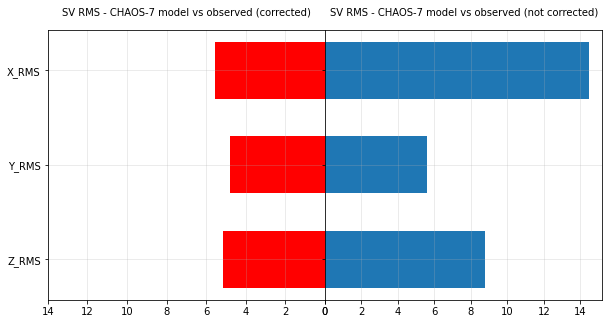

In [74]:
font_color = '#525252'
hfont = {'fontname':'Calibri'}
facecolor = '#eaeaf2'
color_red = '#fd625e'
color_blue = '#01b8aa'
#index = data.index
title0 = 'SV RMS - CHAOS-7 model vs observed (corrected)'
title1 = 'SV RMS - CHAOS-7 model vs observed (not corrected)'


fig, axes = plt.subplots(figsize=(10,5), ncols=2, sharey=True)
fig.tight_layout()

axes[0].barh(df_RMS[['X_RMS','Y_RMS','Z_RMS']].mean().index,df_RMS[['X_RMS','Y_RMS','Z_RMS']].mean(),
             tick_label=df_RMS[['X_RMS','Y_RMS','Z_RMS']].mean().index,
             height=0.6,
             color = 'red')

axes[0].set_title(title0, fontsize=10, pad=15, color='black')
axes[1].set_title(title1, fontsize=10, pad=15, color='black')
#axes[0].tick_params(axis='y', colors='black')
axes[0].set_xticks(np.arange(0,16,2))
axes[1].set_xticks(np.arange(0,16,2))
axes[0].invert_xaxis() 


axes[1].barh(df_RMS_n[['X_RMS','Y_RMS','Z_RMS']].mean().index,
             df_RMS_n[['X_RMS','Y_RMS','Z_RMS']].mean(), height=0.6)

#axes[0].set(yticks=list(dic_.values()), yticklabels=list(dic_.values()))
#axes[0].yaxis.tick_left()
#axes[0].tick_params(axis='y', colors='white') 
plt.subplots_adjust(wspace=0, top=0.85, bottom=0.1, left=0.18, right=0.95)
axes[0].grid(alpha = 0.3)
axes[1].grid(alpha  = 0.3)
plt.gca().invert_yaxis()
plt.savefig('histo_rms_comparison.png', dpi = 300)

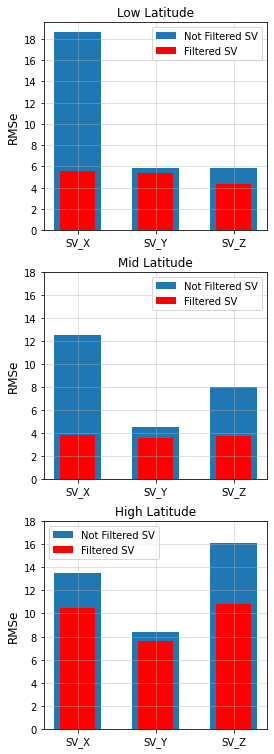

In [32]:
fig, axes = plt.subplots(3,1, figsize = (4,13))


for ax, df, df_n, comp in zip(axes.flatten(), [L_lat,M_lat,H_lat],[L_lat_n,M_lat_n,H_lat_n], ['Low','Mid','High']):
    ax.bar(df_n[['X_RMS','Y_RMS','Z_RMS']].mean().index,
            df_n[['X_RMS','Y_RMS','Z_RMS']].mean(),
            width=0.6, label = 'Not Filtered SV')
    
    ax.bar(df[['X_RMS','Y_RMS','Z_RMS']].mean().index,df[['X_RMS','Y_RMS','Z_RMS']].mean(),
            tick_label=['SV_X','SV_Y','SV_Z'],
            label = 'Filtered SV',
                 width=0.45,
                 color = 'red')
    
    ax.set_yticks(np.arange(0,20,2))
    ax.set_ylabel('RMSe', fontsize = 12)
    ax.grid(alpha = 0.5)
    ax.set_title(f'{comp} Latitude')
    #fig.text(0.5, 0.09, 'Year', ha='center', va='center',fontsize = 12,**csfont)
    #fig.text(0.03, 0.5, f'RMSe', ha='center', va='center', rotation='vertical',fontsize = 12)
    ax.legend()
    plt.savefig('RMS_comparison.png', dpi = 300, bbox_inches = 'tight')
plt.show()

In [59]:
def get_change(current, previous):
    if current == previous:
        return 0
    try:
        return (abs(current - previous) / previous) * 100.0
    except ZeroDivisionError:
        return float('inf')

In [70]:
round(get_change(7.97,3.76),2)

111.97

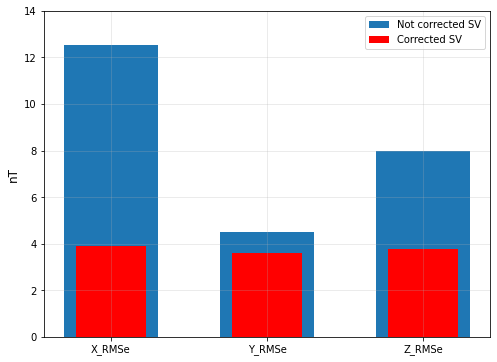

In [152]:
plt.figure(figsize = (8,6))

plt.bar(M_lat_n[['X_RMS','Y_RMS','Z_RMS']].mean().index,
             M_lat_n[['X_RMS','Y_RMS','Z_RMS']].mean(),
        width=0.6, label = 'Not corrected SV')

plt.bar(M_lat[['X_RMS','Y_RMS','Z_RMS']].mean().index,M_lat[['X_RMS','Y_RMS','Z_RMS']].mean(),
             tick_label=['X_RMSe','Y_RMSe','Z_RMSe'],
        label = 'Corrected SV',
             width=0.45,
             color = 'red')

plt.yticks(np.arange(0,16,2))
plt.ylabel('nT', fontsize = 12)
plt.grid(alpha = 0.3)
plt.legend()
plt.savefig('RMS_comparison_mid_lat.png', dpi = 300, bbox_inches = 'tight')
plt.show()

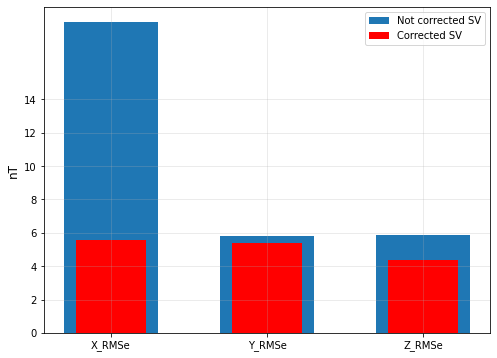

In [154]:
plt.figure(figsize = (8,6))

plt.bar(L_lat_n[['X_RMS','Y_RMS','Z_RMS']].mean().index,
             L_lat_n[['X_RMS','Y_RMS','Z_RMS']].mean(),
        width=0.6, label = 'Not corrected SV')

plt.bar(L_lat[['X_RMS','Y_RMS','Z_RMS']].mean().index,L_lat[['X_RMS','Y_RMS','Z_RMS']].mean(),
             tick_label=['X_RMSe','Y_RMSe','Z_RMSe'],
        label = 'Corrected SV',
             width=0.45,
             color = 'red')

plt.yticks(np.arange(0,16,2))
plt.ylabel('nT', fontsize = 12)
plt.grid(alpha = 0.3)
plt.legend()
plt.savefig('RMS_comparison_low_lat.png', dpi = 300, bbox_inches = 'tight')
plt.show()

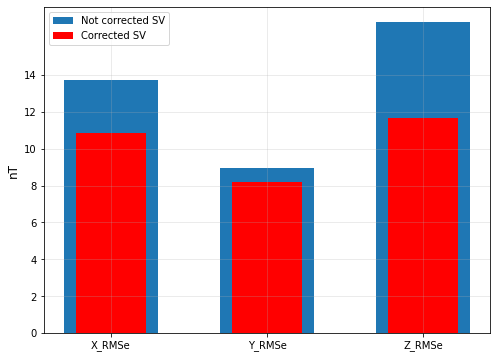

In [155]:
plt.figure(figsize = (8,6))

plt.bar(H_lat_n[['X_RMS','Y_RMS','Z_RMS']].mean().index,
             H_lat_n[['X_RMS','Y_RMS','Z_RMS']].mean(),
        width=0.6, label = 'Not corrected SV')

plt.bar(H_lat[['X_RMS','Y_RMS','Z_RMS']].mean().index,H_lat[['X_RMS','Y_RMS','Z_RMS']].mean(),
             tick_label=['X_RMSe','Y_RMSe','Z_RMSe'],
        label = 'Corrected SV',
             width=0.45,
             color = 'red')

plt.yticks(np.arange(0,16,2))
plt.ylabel('nT', fontsize = 12)
plt.grid(alpha = 0.3)
plt.legend()
plt.savefig('RMS_comparison_high_lat.png', dpi = 300, bbox_inches = 'tight')
plt.show()

In [15]:
df_RMS[['X_RMS','Y_RMS','Z_RMS']].median()

X_RMS    3.372
Y_RMS    2.765
Z_RMS    3.392
dtype: float64

In [16]:
df_RMS_n[['X_RMS','Y_RMS','Z_RMS']].median()

X_RMS    11.883
Y_RMS     3.849
Z_RMS     7.044
dtype: float64

In [21]:

print(get_change(df_RMS_n['X_RMS'].median(),df_RMS['X_RMS'].median()))

252.4021352313167


In [22]:
print(get_change(df_RMS_n['Y_RMS'].median(),df_RMS['Y_RMS'].median()))

39.20433996383363


In [23]:
print(get_change(df_RMS_n['Z_RMS'].median(),df_RMS['Z_RMS'].median()))

107.66509433962264


In [91]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import pandas as pd
# Load Data
#df = px.data.tips()
#creating dict for stations
csv = dict({'VSS': 'VSS',
            'NGK': 'NGK',
           'KAK':'KAK'})

#creating dict for pillars
samples = dict({'hourly':'H',
                'daily': 'D',
                'monthly': 'M',
                'annual': 'Y'})

# Build App
app = JupyterDash(__name__)

fig = go.Figure(data=[go.Scatter(x=[], y=[])])

app.layout = html.Div([
    html.H1("IMOS dashboard"),
    
    dcc.Graph(id='graph', figure = fig),
    html.Label([
         "IMOS",
          dcc.Input(id='imos-dropdown',
                    debounce=True,
                    size = '5',
                    style={'width':'40%',
                           'margin-top':'120px'},
                    value = 'VSS')
                                               #style={'width':'90%','margin-left':10,'margin-right':10,'max-width':5000})
    ]),
    html.Label([
         "Samples",
          dcc.Dropdown(id='samples-dropdown',                                        
                       clearable=False,
                       value = 'H',
                       style={'width':'50%',
                             'margin-top':'-100px'},
                       options=[{"label": i, "value": j} for i, j in samples.items()])
        # 
    ])
])

# Define callback to update graph
@app.callback(Output('graph', 'figure'),
              Input("imos-dropdown", "value"),
             Input('samples-dropdown','value')
)


def update_figure(imo, sample):
    
    df = pd.read_csv(f'hourly_data/{imo}_hourly_data.txt', sep = '\s+')
    df.index = pd.to_datetime(df.index + ' ' + df['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
    df.pop('Date')
    df = dpt.resample_obs_data(df, sample, apply_percentage=True)
    
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.03,
            row_heights=[0.55, 0.55, 0.55])
    
    #fig.update_layout(xaxis_rangeslider_visible=True)
    fig.update_layout(height=600, width=900, title_text="Side By Side Subplots")
    fig.add_trace(
        go.Scatter(x=df.index, y=df['X']),
        row=1, col=1
    )
    
    fig.add_trace(
        go.Scatter(x=df.index, y=df['Y']),
        row=2, col=1
    )
    
    fig.add_trace(
        go.Scatter(x=df.index, y=df['Z']),
        row=3, col=1
    )

    
    
    return fig
# Run app and display result inline in the notebook
app.run_server(mode='external',port=2224)
#app.run_server(mode='external',port=2224)
#app.run_server(debug=True, host='0.0.0.0')

SyntaxError: invalid syntax (253014268.py, line 32)

In [13]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output
import pandas as pd
# Load Data
#df = px.data.tips()
#creating dict for stations
csv = dict({'VSS': 'VSS',
            'NGK': 'NGK',
           'KAK':'KAK'})

#creating dict for pillars
samples = dict({'hourly':'H',
                'daily': 'D',
                'monthly': 'M',
                'annual': 'Y'})

# Build App
app = JupyterDash(__name__)

fig = go.Figure(data=[go.Scatter(x=[], y=[])])

app.layout = html.Div([
        dcc.Graph(id='graph',
                figure = fig),
              html.Label(["IMOS"],
                          style={'font-weight': 'bold',
                                  "text-align": "center"}
                        ),
              dcc.Input(id='imos-dropdown',
                        debounce=True,
                        size = '5',
                        style={'marginBottom': 20, 'marginTop': 20},
                        value = 'VSS'
                       )
             ]
            ),
    html.Div ([
        html.Label(["Samples"]),
        dcc.Dropdown(id='samples-dropdown',                                        
                     clearable=False,
                     value = 'H',
                     style={'width':'40%',
                            'marginBottom': 50,
                            'marginTop': 25,
                            'marginLeft':20,
                            'fontSize': 20},
                     options=[{"label": i, "value": j} for i, j in samples.items()
                             ])
        ])


# Define callback to update graph
@app.callback(Output('graph', 'figure'),
              Input("imos-dropdown", "value"),
             Input('samples-dropdown','value')
)


def update_figure(imo, sample):
    
    df = pd.read_csv(f'hourly_data/{imo}_hourly_data.txt', sep = '\s+')
    df.index = pd.to_datetime(df.index + ' ' + df['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
    df.pop('Date')
    df = dpt.resample_obs_data(df, sample, apply_percentage=True)
    
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.03,
            row_heights=[0.55, 0.55, 0.55])
    
    #fig.update_layout(xaxis_rangeslider_visible=True)
    fig.update_layout(height=600, width=900)
    fig.add_trace(
        go.Scatter(x=df.index, y=df['X']),
        row=1, col=1
    )
    
    fig.add_trace(
        go.Scatter(x=df.index, y=df['Y']),
        row=2, col=1
    )
    
    fig.add_trace(
        go.Scatter(x=df.index, y=df['Z']),
        row=3, col=1
    )

    
    
    return fig
# Run app and display result inline in the notebook
app.run_server(mode='external',port=2224)
#app.run_server(mode='external',port=2224)
#app.run_server(debug=True, host='0.0.0.0')

IndentationError: unexpected indent (2077402809.py, line 42)

In [2]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from jupyter_dash import JupyterDash
from dash import Dash, Input, Output, ctx, html, dcc
import pandas as pd
import dash_bootstrap_components as dbc

In [3]:
csv = dict({'VSS': 'VSS',
            'NGK': 'NGK',
           'KAK':'KAK'})

#creating dict for pillars
samples = dict({'hourly':'H',
                'daily': 'D',
                'monthly': 'M',
                'annual': 'Y',
                'Secular Variation':'SV'})

data_selection = dict({'Empty':'Not',
                       'nighttime':'NT',
                      'quiet-days':'QD',
                      'disturbed-days':'DD',
                      'Kp-index':'KP'})

# Build App
app = JupyterDash(__name__)

fig = go.Figure(data=[go.Scatter(x=[], y=[])])

app.layout = html.Div([
    html.H1('Secular Variation Dashboard'),
    html.Div(className="content", children=[
        html.Label('Sample rate'),
                          dcc.Dropdown(
                              id='samples-dropdown',                                        
                              clearable=False,
                              value = 'H',
                              options=[{"label": i, "value": j} for i, j in samples.items()
                             ],style={'width':'33%'}),
        html.Br(),
        html.Label('Data Selection'),
                          dcc.Dropdown(
                              id='selection-dropdown',                                        
                              clearable=False,
                              value = 'Not',
                              options=[{"label": i, "value": j} for i, j in data_selection.items()
                             ],style={'width':'33%'}),
        html.Br(),
        html.Label('IAGA CODE'),
        dcc.Input(
            id='imos-input',
            debounce=True,
            size = '5',
            value = 'VSS'),
    ],style={'display':'flex'}),
    html.Br(),
    

    html.Div(className = 'radio-itens',children=[
            html.Label('CHAOS-7 correction'),
            dcc.RadioItems(id = 'chaos',
                           options = ['Yes', 'No'],
                           value = 'No',
                           style={'width':'33%'}, className = 'radio-1'),
            html.Label('Plot CHAOS'),
            dcc.RadioItems(id = 'chaos-plot',
                           options = ['Yes', 'No'],
                           value = 'No')
    ]),
    html.Div(className = 'Button', children=[
        html.Button(
            'Save data',
            id='button1',
            n_clicks = 0)
    ]),
    html.Div(className = 'graph', children=[
    dcc.Graph(
        id='graph',
        figure=fig
    )])
])

#html.Div([
#    html.Div([
#        dcc.Graph(id='graph',
#                figure = fig)])])])
#


@app.callback(Output('graph', 'figure'),
              Input("imos-input", "value"),
              Input('samples-dropdown','value'),
              Input('selection-dropdown','value'),
              Input('chaos', 'value'),
              Input('chaos-plot','value'),
              Input('button1', 'n_clicks')
)



def update_figure(imo, sample, selection, chaos, plot, n_click):
    
    mode = 'lines'
    
    
    df = pd.read_csv(f'hourly_data/{imo}_hourly_data.txt', sep = '\s+')
    df.index = pd.to_datetime(df.index + ' ' + df['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
    df.pop('Date')
    
    df_chaos = pd.read_csv(f'hourly_data/{imo}_chaos_hourly_data.txt', sep = '\t')
    df_chaos.index = pd.to_datetime(df_chaos['Unnamed: 0'], format= '%Y-%m-%d %H:%M:%S.%f')
    df_chaos.pop('Unnamed: 0')
    
    if chaos == 'Yes':    
        
        df, df_chaos = dpt.external_field_correction_chaos_model(imo,
                                                                 '2010-01-01',
                                                                 '2022-02-28',
                                                                 df,
                                                                 df_chaos)
        
        
    if selection == 'DD':
        df = dpt.remove_Disturbed_Days(df)
    if selection == 'QD':
        df = dpt.keep_Q_Days(df)
    if selection == 'KP':
        df = dpt.kp_index_correction(df, kp = 2)
    if selection == 'NT':
        df = dpt.night_time_selection(df)
        
    if sample != 'SV':    
        df = dpt.resample_obs_data(df, sample, apply_percentage=True)
    else:
        df = dpt.calculate_SV(df)
        mode = 'markers'
    
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.01,
            row_heights=[0.55, 0.55, 0.55])
    
    #fig.update_layout(xaxis_rangeslider_visible=True)
    
    
    #updating entire figure layout
    fig.update_layout(title = 'Secular variotion ',height=700, width=1200)  #plot_bgcolor='rgba(153,153,153,153)'  < - plot color
    
    #coltroling subplots
    for col, row, color in zip(df.columns, [1,2,3], ['#1616A7','#1CA71C','#222A2A']):
        fig.add_trace(
            go.Scatter(x=df.index, y=df[col], mode = mode, line_color=color),
            row=row, col=1)
    
    #setting axis label
    
    for col, row in zip(df.columns, [1,2,3]):
        fig.update_yaxes(title_text= f'{col} (nT)', row=row, col=1)

    if sample == 'SV':
        for col, row in zip(df.columns, [1,2,3]):
            fig.update_yaxes(title_text= f'SV {col} (nT/Yr)', row=row, col=1)

    fig.update_xaxes(title_text= 'Date', row=3, col=1)
    
    #adding chaos SV prediction
    if plot == 'Yes' and sample == 'SV':
        
        df_chaos = dpt.calculate_SV(df_chaos, columns = ['X_int','Y_int','Z_int'])
        
        fig.add_trace(go.Scatter(x=df_chaos.index, y=df_chaos['X_int'], mode = mode, line_color='#D62728'),row=1, col=1)
        fig.add_trace(go.Scatter(x=df_chaos.index, y=df_chaos['Y_int'], mode = mode, line_color='#D62728'),row=2, col=1)
        fig.add_trace(go.Scatter(x=df_chaos.index, y=df_chaos['Z_int'], mode = mode, line_color='#D62728'),row=3, col=1)
        
     
    triggered_id = ctx.triggered_id
    print(triggered_id)
    
    if triggered_id == 'button1':
        
        df.to_csv('teste_save.txt', sep = ' ')
        
    #raise dash.exceptions.PreventUpdate

    
    return fig

# Run app and display result inline in the notebook
app.run_server(mode='external',port=2222)

Dash app running on http://127.0.0.1:2222/


In [41]:
row = html.Div(
            [
                dbc.Col(html.Div('Teste',[
        dcc.Dropdown(id='samples-dropdown',                                        
                     clearable=False,
                     value = 'H',
                     style={'width':'40%',
                            'marginBottom': 50,
                            'marginTop': 25,
                            'marginLeft':20,
                            'fontSize': 20},
                     options=[{"label": i, "value": j} for i, j in samples.items()
                             ])
        ])),
                dbc.Col(html.Div("One of three columns")),
            ]
        )

TypeError: `id` prop must be a string or dict, not [Dropdown(options=[{'label': 'hourly', 'value': 'H'}, {'label': 'daily', 'value': 'D'}, {'label': 'monthly', 'value': 'M'}, {'label': 'annual', 'value': 'Y'}, {'label': 'Secular Variation', 'value': 'SV'}], value='H', clearable=False, style={'width': '40%', 'marginBottom': 50, 'marginTop': 25, 'marginLeft': 20, 'fontSize': 20}, id='samples-dropdown')]

In [35]:
df = pd.read_csv(f'hourly_data/vss_chaos_hourly_data.txt', sep = '\t')
df.index = pd.to_datetime(df['Unnamed: 0'], format= '%Y-%m-%d %H:%M:%S.%f')
df.pop('Unnamed: 0')

Unnamed: 0
2010-01-01 00:00:00    2010-01-01 00:00:00
2010-01-01 01:00:00    2010-01-01 01:00:00
2010-01-01 02:00:00    2010-01-01 02:00:00
2010-01-01 03:00:00    2010-01-01 03:00:00
2010-01-01 04:00:00    2010-01-01 04:00:00
                              ...         
2022-02-28 19:00:00    2022-02-28 19:00:00
2022-02-28 20:00:00    2022-02-28 20:00:00
2022-02-28 21:00:00    2022-02-28 21:00:00
2022-02-28 22:00:00    2022-02-28 22:00:00
2022-02-28 23:00:00    2022-02-28 23:00:00
Name: Unnamed: 0, Length: 106608, dtype: object

In [40]:
app.layout = html.Button('Click Me', id='my-button')

@app.callback(Output('my-button','children'), [Input('my-button', 'n_clicks')])
def on_click(number_of_times_button_has_clicked):
    print('X')


In [22]:
    df2 = pd.read_csv(f'hourly_data/vss_hourly_data.txt', sep = '\s+')
    df2.index = pd.to_datetime(df2.index + ' ' + df2['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
    df2.pop('Date')

2010-01-01 00:29:30    00:29:30
2010-01-01 01:29:30    01:29:30
2010-01-01 02:29:30    02:29:30
2010-01-01 03:29:30    03:29:30
2010-01-01 04:29:30    04:29:30
                         ...   
2022-02-28 19:29:30    19:29:30
2022-02-28 20:29:30    20:29:30
2022-02-28 21:29:30    21:29:30
2022-02-28 22:29:30    22:29:30
2022-02-28 23:29:30    23:29:30
Name: Date, Length: 106608, dtype: object

In [39]:
df2

,X,Y,Z
2010-01-01 00:29:30,17402.23,-7018.74,-13921.48
2010-01-01 01:29:30,17402.26,-7020.37,-13921.18
2010-01-01 02:29:30,17402.99,-7021.71,-13920.74
2010-01-01 03:29:30,17403.22,-7022.93,-13920.30
2010-01-01 04:29:30,17404.05,-7024.09,-13919.66
...,...,...,...
2022-02-28 19:29:30,16215.44,-6852.01,-15198.83
2022-02-28 20:29:30,16214.67,-6847.43,-15198.00
2022-02-28 21:29:30,16214.51,-6849.84,-15198.33
2022-02-28 22:29:30,16214.81,-6854.27,-15197.86


In [41]:
df_real, df_chaos = dpt.external_field_correction_chaos_model('VSS','2010-01-01','2022-02-28',df2,df)

The external field predicted using CHAOS-model was removed from the data.


In [43]:
df_real

NameError: name 'test' is not defined

In [43]:
df_chaos

,X_tot,Y_tot,Z_tot,X_int,Y_int,Z_int,X_crust,Y_crust,Z_crust,X_ext_gsm,Y_ext_gsm,Z_ext_gsm,X_ext_sm,Y_ext_sm,Z_ext_sm,X_ext,Y_ext,Z_ext
Unnamed: 0,,,,,,,,,,,,,,,,,,
2010-01-01 00:00:00,17377.44,-6963.93,-14011.61,17298.23,-6967.25,-13990.28,81.59,-2.96,-18.77,-8.33,6.18,-3.91,5.95,0.09,1.36,-2.38,6.27,-2.55
2010-01-01 01:00:00,17378.19,-6965.41,-14011.96,17298.22,-6967.24,-13990.29,81.59,-2.96,-18.77,-7.54,4.97,-4.14,5.92,-0.17,1.24,-1.62,4.80,-2.90
2010-01-01 02:00:00,17379.00,-6967.62,-14012.29,17298.21,-6967.24,-13990.30,81.59,-2.96,-18.77,-6.96,3.18,-4.36,6.16,-0.60,1.14,-0.80,2.58,-3.22
2010-01-01 03:00:00,17379.14,-6970.27,-14012.55,17298.20,-6967.24,-13990.31,81.59,-2.96,-18.77,-6.69,0.97,-4.54,6.04,-1.04,1.08,-0.65,-0.07,-3.46
2010-01-01 04:00:00,17379.48,-6973.10,-14012.70,17298.19,-6967.24,-13990.33,81.59,-2.96,-18.77,-6.79,-1.43,-4.67,6.49,-1.48,1.07,-0.30,-2.91,-3.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-28 19:00:00,16188.14,-6806.01,-15286.09,16110.78,-6804.07,-15262.27,81.59,-2.96,-18.77,-11.94,1.03,-3.93,7.72,-0.02,-1.12,-4.22,1.01,-5.05
2022-02-28 20:00:00,16184.80,-6805.20,-15286.20,16110.77,-6804.07,-15262.28,81.59,-2.96,-18.77,-11.98,1.44,-3.91,4.42,0.38,-1.24,-7.56,1.82,-5.15
2022-02-28 21:00:00,16183.00,-6804.33,-15286.31,16110.76,-6804.07,-15262.29,81.59,-2.96,-18.77,-11.89,2.03,-3.90,2.55,0.66,-1.35,-9.34,2.69,-5.25


In [26]:
str(df2.columns[0])

'X'

In [4]:
csv = dict({'VSS': 'VSS',
            'NGK': 'NGK',
           'KAK':'KAK'})

#creating dict for pillars
samples = dict({'hourly':'H',
                'daily': 'D',
                'monthly': 'M',
                'annual': 'Y',
                'Secular Variation':'SV'})

data_selection = dict({'Empty':'Not',
                       'nighttime':'NT',
                      'quiet-days':'QD',
                      'disturbed-days':'DD',
                      'Kp-index':'KP'})



# Build App
app = JupyterDash(__name__)

fig = go.Figure(data=[go.Scatter(x=[], y=[])])

fig.update_layout(paper_bgcolor="#2A3F54")

fig2 = go.Figure(data = [go.Table()])

fig2.update_layout(paper_bgcolor="#2A3F54",
                      plot_bgcolor = "#2A3F54",
                      width = 250,
                      height = 100)



app.layout = html.Div(
    className="content",
    children =[
        html.H1('Secular Variation Dashboard', id = 'title1'),
        html.Div(
            className = 'left-content',
            children=[
                html.H1('Data processing options', id = 'left-content-title'),
                html.Div(
                    className = 'Input',
                    children = [
                        html.Label('IAGA CODE'),
                        html.Br(),
                        dcc.Input(
                            id='imos-input',
                            type = 'text',
                            minLength = 3,
                            maxLength = 3,
                            debounce=True,
                            size = '5',
                            value = 'VSS')
                    ]),
                html.Div(
                    className = 'dropdowns',
                    children = [
                        html.Label('Sample rate'),
                        dcc.Dropdown(
                            id='samples-dropdown',                                        
                            clearable=False,
                            value = 'H',
                            options=[{"label": i, "value": j} for i, j in samples.items()]),
                        html.Br(),
                        html.Label('use resample condition?'),
                        dcc.RadioItems(
                            id = 'resample-cond',
                            options = ['Yes', 'No'],
                            value = 'No'),
                        html.Label('Data Selection'),
                        dcc.Dropdown(
                            id='selection-dropdown',                                        
                            clearable=False,
                            value = 'Not',
                            options=[{"label": i, "value": j} for i, j in data_selection.items()])
                    ]),
                html.Div(
                    className = 'radio-itens',
                    children=[
                        html.Label('CHAOS-7 correction'),
                        html.Br(),
                        dcc.RadioItems(
                            id = 'chaos',
                            options = ['Yes', 'No'],
                            value = 'No'),
                        html.Label('Plot CHAOS'),
                        dcc.RadioItems(id = 'chaos-plot',
                                       options = ['Yes', 'No'],
                                       value = 'No')
                    ]),
                html.Div(
                    className = 'jerk_input',
                    children = [
                        html.H1('Geomagnetic jerk detection', id = 'title-detection'),
                        html.Label('Start-date'),
                        html.Br(),
                        dcc.Input(
                            id='start-date-input',
                            placeholder="yyyy-mm",
                            minLength = 7,
                            maxLength = 7,
                            debounce = True),
                        html.Br(),
                        html.Label('End-date'),
                        html.Br(),
                        dcc.Input(
                            id='end-date-input',
                            placeholder = 'yyyy-mm',
                            minLength = 7,
                            maxLength = 7,
                            debounce = True),
                        html.Br(),
                        html.Button(
                            'Detect',
                            id = 'button2',
                            n_clicks = 0)    
                    ]),
                

                html.Div(className = 'jerk_stats', children=[
                    html.H3('Jerk detection statistics', id = 'jerk-stats-title'),
                    html.Div(
                    className = 'Graph_stats',
                    children = [
                        dcc.Graph(
                            id='graph2',
                            figure=fig2)
                    
                ]),
                html.Div(
                    className = 'Button',
                    children=[
                        html.Button(
                            'Save data',
                            id='button1',
                            n_clicks = 0)
                    ]),
                
                ])
            ]),
        html.Div(
            className = 'right-content', 
            children=[
                html.Div(
                    className = 'Graph',
                    children = [
                        dcc.Graph(
                            id='graph',
                            figure=fig)])
            ])
    ])


#html.Div([
#    html.Div([
#        dcc.Graph(id='graph',
#                figure = fig)])])])
#



@app.callback([Output('graph', 'figure'),
               Output('graph2', 'figure')],
              [Input("imos-input", "value"),
              Input('samples-dropdown','value'),
              Input('resample-cond','value'),
              Input('selection-dropdown','value'),
              Input('chaos', 'value'),
              Input('chaos-plot','value'),
              Input('button1', 'n_clicks'),
              Input('start-date-input','value'),
              Input('end-date-input','value'),
              Input('button2', 'n_clicks')]
)

def update_figure(imo, sample, condition, selection, chaos, plot, n_click, starttime, endtime, n_click2):

    triggered_id = ctx.triggered_id
    
    mode = 'lines'
    
    annotations = []
    
    if condition == 'Yes':
        apply_percentage = True
    else:
        apply_percentage = False
    
    if selection in ['DD','QD', 'NT', 'KP']:
        apply_percentage = False
    
    fig2 = go.Figure(data = [go.Table()])

    fig2.update_layout(paper_bgcolor="#2A3F54",
                       plot_bgcolor = "#2A3F54",
                       width = 250,
                       height = 100)
    
    fig2.update_xaxes(showline=False, showgrid = False)
    fig2.update_yaxes(showline=False, showgrid = False)
    
    df_jerk_window = pd.DataFrame()
    
    df = pd.read_csv(f'hourly_data/{imo}_hourly_data.txt', sep = '\t')
    df.index = pd.to_datetime(df['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
    df.pop('Date')
    
    df_chaos = pd.read_csv(f'hourly_data/{imo}_chaos_hourly_data.txt', sep = '\t')
    df_chaos.index = pd.to_datetime(df_chaos['Unnamed: 0'], format= '%Y-%m-%d %H:%M:%S.%f')
    df_chaos.pop('Unnamed: 0')
    
    if chaos == 'Yes':    
        
        df, df_chaos = dpt.external_field_correction_chaos_model(imo,
                                                                 '2000-01-01',
                                                                 '2022-02-28',
                                                                 df,
                                                                 df_chaos,
                                                                 apply_percentage = apply_percentage)
    else:
        pass
        
        
    if selection == 'DD':
        df = dpt.remove_Disturbed_Days(df)
    if selection == 'QD':
        df = dpt.keep_Q_Days(df)
    if selection == 'KP':
        df = dpt.kp_index_correction(df,
                                     kp = 2)
    if selection == 'NT':
        df = dpt.night_time_selection(station = imo,
                                      dataframe = df)
    
    df_detection = df
    
    if sample != 'SV':    
        df = dpt.resample_obs_data(df, sample, apply_percentage=apply_percentage)
    else:
        df = dpt.calculate_SV(df, apply_percentage = apply_percentage)
        mode = 'markers'
    
    if sample == 'Y':
        mode = 'lines+markers'
    

    
    
    if starttime != None and endtime != None and sample == 'SV' and triggered_id == 'button2':
        
        
        
        df_jerk_window, df_slopes, breakpoints, r2 = dpt.jerk_detection_window(station = imo,
                                                                            window_start = str(starttime),
                                                                            window_end = str(endtime),
                                                                            starttime = str(df.index.date[0]),
                                                                            endtime = str(df.index.date[-1]),
                                                                            df_station = df_detection,
                                                                            df_CHAOS = df_chaos,
                                                                            CHAOS_correction = False, 
                                                                            plot_CHAOS_prediction=False,
                                                                            plot_detection=False)
        
        df_jerk_stats = pd.DataFrame()
        
        df_jerk_stats['Comp'] = ['SV_X','SV_Y','SV_Z']
            
        df_jerk_stats['Occur'] =  breakpoints.iloc[1].values.round(2)

        df_jerk_stats['Amplitude'] = df_slopes.diff().iloc[1].values.round(2)
        
        df_jerk_stats['R2'] = r2
        
        fig2 = go.Figure(data=[go.Table(
            header=dict(values=list(df_jerk_stats.columns),
                        fill_color='#2A3F54',
                        align='left'),
            cells=dict(values=[df_jerk_stats.Comp, df_jerk_stats.Occur, df_jerk_stats.Amplitude, df_jerk_stats.R2], # 2nd column
                       line_color='#2A3F54',
                       fill_color='#2A3F54',
                       align='left'))
        ])
        
        fig2.update_layout(width = 250,
                           height = 100,
                           margin=dict(l=0, r=0, t=10, b=0),
                           paper_bgcolor="#2A3F54",
                           plot_bgcolor = '#2A3F54',
                           font_color = 'white')
        
    
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.01,
            row_heights=[0.55, 0.55, 0.55])
    
    #fig.update_layout(xaxis_rangeslider_visible=True)
    
    
    #coltroling subplots
    if sample != 'SV':
        for col, row, color in zip(df.columns, [1,2,3], ['#1616A7','#1CA71C','#222A2A']):
            fig.add_trace(
                go.Scatter(x=df.index, y=df[col], mode = mode, line_color=color, name= col),
                row=row, col=1)
    
    #setting axis label
    
    for col, row in zip(df.columns, [1,2,3]):
        fig.update_yaxes(title_text= f'{col} (nT)', row=row, col=1, color = 'white')

    if sample == 'SV':
        for col, row, color  in zip(df.columns, [1,2,3], ['#1616A7','#1CA71C','#222A2A']):
            
            fig.update_yaxes(
                title_text= f'SV {col} (nT/Yr)', row=row, col=1, color = 'white')
            
            fig.add_trace(
                go.Scatter(x= df.index, y=df[col], mode = mode, line_color=color, name= f' SV {col}'),
                row=row, col=1)

    fig.update_xaxes(title_text= 'Date', row=3, col=1, color = 'white')
    
    #adding chaos SV prediction
    if plot == 'Yes' and sample == 'SV':
        
        df_chaos = dpt.calculate_SV(df_chaos, columns = ['X_int','Y_int','Z_int'])
        
        fig.add_trace(go.Scatter(x=df_chaos.index, y=df_chaos['X_int'], mode = 'lines', line_color='#D62728', name = 'CHAOS SV X'),row=1, col=1)
        fig.add_trace(go.Scatter(x=df_chaos.index, y=df_chaos['Y_int'], mode = 'lines', line_color='#D62728', name = 'CHAOS SV Y'),row=2, col=1)
        fig.add_trace(go.Scatter(x=df_chaos.index, y=df_chaos['Z_int'], mode = 'lines', line_color='#D62728', name = 'CHAOS SV Z'),row=3, col=1)
        
     
    if df_jerk_window.empty == False:
        
        fig.add_trace(go.Scatter(x=df_jerk_window.index, y=df_jerk_window['X'], mode = 'lines', line_color='rgb(102,102,102)', name = 'SV X detection'),row=1, col=1)
        fig.add_trace(go.Scatter(x=df_jerk_window.index, y=df_jerk_window['Y'], mode = 'lines', line_color='rgb(102,102,102)',name = 'SV Y detection'),row=2, col=1)
        fig.add_trace(go.Scatter(x=df_jerk_window.index, y=df_jerk_window['Z'], mode = 'lines', line_color='rgb(102,102,102)', name = 'SV Z detection'),row=3, col=1)
        
    #updating entire figure layout

    
    fig.update_layout(title = 'Secular variation plot',
                      title_font_color=' white',
                      title_font_size = 20,
                      font_color= 'white',
                      height=600,
                      annotations= annotations,
                      width=1100,
                      autosize=False,
                      margin=dict(l=0, r=0, t=35, b=0),
                      paper_bgcolor="#2A3F54",
                      hovermode='x unified',
                      hoverlabel = dict(
                      bgcolor = 'white',
                      font_color = 'black'))  #plot_bgcolor='rgba(153,153,153,153)'  < - plot color
    #fig.update_traces(hovertemplate=hovertemp)
    
    if triggered_id == 'button1':
        
        df.to_csv('teste_save.txt', sep = ' ')
        
    #raise dash.exceptions.PreventUpdate

    
    return fig, fig2



# Run app and display result inline in the notebook
app.run_server(mode='external', port = 3)

Dash app running on http://127.0.0.1:3/

ASC Jerk statistics for the X component.

Jerk occurence time -t0-: 2011.8
Jerk amplitute: 14.59
R^2: 0.45

****************************************************************

ASC Jerk statistics for the Y component.

Jerk occurence time -t0-: 2010.2
Jerk amplitute: -19.69
R^2: 0.91

****************************************************************

ASC Jerk statistics for the Z component.

Jerk occurence time -t0-: 2011.04
Jerk amplitute: -17.63
R^2: 0.92

****************************************************************

ASC Jerk statistics for the X component.

Jerk occurence time -t0-: 2011.78
Jerk amplitute: 15.6
R^2: 0.45

****************************************************************

ASC Jerk statistics for the Y component.

Jerk occurence time -t0-: 2010.18
Jerk amplitute: -20.08
R^2: 0.86

****************************************************************

ASC Jerk statistics for the Z component.

Jerk occurence time -t0-: 2010.94
Jerk amp


TAM Jerk statistics for the X component.

Jerk occurence time -t0-: 2007.45
Jerk amplitute: -9.43
R^2: 0.28

****************************************************************

TAM Jerk statistics for the Y component.

Jerk occurence time -t0-: 2005.79
Jerk amplitute: 8.15
R^2: 0.9

****************************************************************

TAM Jerk statistics for the Z component.

Jerk occurence time -t0-: 2007.32
Jerk amplitute: 13.25
R^2: 0.92

****************************************************************

TAM Jerk statistics for the X component.

Jerk occurence time -t0-: 2011.56
Jerk amplitute: 14.04
R^2: 0.5

****************************************************************

TAM Jerk statistics for the Y component.

Jerk occurence time -t0-: 2009.48
Jerk amplitute: -6.78
R^2: 0.86

****************************************************************

TAM Jerk statistics for the Z component.

Jerk occurence time -t0-: 2011.07
Jerk amplitute: -10.08
R^2: 0.65

*****************


ASC Jerk statistics for the X component.

Jerk occurence time -t0-: 2015.23
Jerk amplitute: 9.73
R^2: 0.13

****************************************************************

ASC Jerk statistics for the Y component.

Jerk occurence time -t0-: 2013.87
Jerk amplitute: 17.42
R^2: 0.85

****************************************************************

ASC Jerk statistics for the Z component.

Jerk occurence time -t0-: 2014.27
Jerk amplitute: 16.74
R^2: 0.9

****************************************************************

ASC Jerk statistics for the X component.

Jerk occurence time -t0-: 2015.2
Jerk amplitute: 9.99
R^2: 0.13

****************************************************************

ASC Jerk statistics for the Y component.

Jerk occurence time -t0-: 2013.87
Jerk amplitute: 17.33
R^2: 0.83

****************************************************************

ASC Jerk statistics for the Z component.

Jerk occurence time -t0-: 2014.07
Jerk amplitute: 17.7
R^2: 0.94

********************


EBR Jerk statistics for the X component.

Jerk occurence time -t0-: 2006.08
Jerk amplitute: -11.07
R^2: 0.46

****************************************************************

EBR Jerk statistics for the Y component.

Jerk occurence time -t0-: 2006.2
Jerk amplitute: 8.22
R^2: 0.65

****************************************************************

EBR Jerk statistics for the Z component.

Jerk occurence time -t0-: 2006.04
Jerk amplitute: 7.48
R^2: 0.68

****************************************************************

EBR Jerk statistics for the X component.

Jerk occurence time -t0-: 2006.2
Jerk amplitute: -12.8
R^2: 0.52

****************************************************************

EBR Jerk statistics for the Y component.

Jerk occurence time -t0-: 2005.4
Jerk amplitute: 7.85
R^2: 0.78

****************************************************************

EBR Jerk statistics for the Z component.

Jerk occurence time -t0-: 2006.2
Jerk amplitute: 9.65
R^2: 0.64

**********************


EBR Jerk statistics for the X component.

Jerk occurence time -t0-: 2011.26
Jerk amplitute: 12.5
R^2: 0.49

****************************************************************

EBR Jerk statistics for the Y component.

Jerk occurence time -t0-: 2011.83
Jerk amplitute: -11.51
R^2: 0.75

****************************************************************

EBR Jerk statistics for the Z component.

Jerk occurence time -t0-: 2011.61
Jerk amplitute: -6.79
R^2: 0.39

****************************************************************

EBR Jerk statistics for the X component.

Jerk occurence time -t0-: 2012.54
Jerk amplitute: -13.08
R^2: 0.2

****************************************************************

EBR Jerk statistics for the Y component.

Jerk occurence time -t0-: 2013.79
Jerk amplitute: 8.15
R^2: 0.74

****************************************************************

EBR Jerk statistics for the Z component.

Jerk occurence time -t0-: 2012.79
Jerk amplitute: 11.53
R^2: 0.67

****************


TAM Jerk statistics for the X component.

Jerk occurence time -t0-: 2013.95
Jerk amplitute: -27.98
R^2: 0.53

****************************************************************

TAM Jerk statistics for the Y component.

Jerk occurence time -t0-: 2013.94
Jerk amplitute: 12.38
R^2: 0.78

****************************************************************

TAM Jerk statistics for the Z component.

Jerk occurence time -t0-: 2013.91
Jerk amplitute: 19.75
R^2: 0.92

****************************************************************

TAM Jerk statistics for the X component.

Jerk occurence time -t0-: 2014.01
Jerk amplitute: -40.53
R^2: 0.54

****************************************************************

TAM Jerk statistics for the Y component.

Jerk occurence time -t0-: 2013.95
Jerk amplitute: 13.65
R^2: 0.72

****************************************************************

TAM Jerk statistics for the Z component.

Jerk occurence time -t0-: 2013.99
Jerk amplitute: 22.62
R^2: 0.89

*************


EBR Jerk statistics for the X component.

Jerk occurence time -t0-: 2012.67
Jerk amplitute: -27.93
R^2: 0.37

****************************************************************

EBR Jerk statistics for the Y component.

Jerk occurence time -t0-: 2013.98
Jerk amplitute: 16.02
R^2: 0.83

****************************************************************

EBR Jerk statistics for the Z component.

Jerk occurence time -t0-: 2014.02
Jerk amplitute: 25.98
R^2: 0.64

****************************************************************

EBR Jerk statistics for the X component.

Jerk occurence time -t0-: 2014.0
Jerk amplitute: -31.99
R^2: 0.4

****************************************************************

EBR Jerk statistics for the Y component.

Jerk occurence time -t0-: 2013.98
Jerk amplitute: 15.99
R^2: 0.83

****************************************************************

EBR Jerk statistics for the Z component.

Jerk occurence time -t0-: 2014.01
Jerk amplitute: 25.28
R^2: 0.67

***************

In [19]:
x = pd.DataFrame()

In [22]:
if x.empty == True:
    print('x')

x


In [14]:
df = mvs.load_INTERMAGNET_files('VSS','2010-01-01','2021-12-31')

Reading files from VSS...


In [6]:
import pwlf

In [7]:
my_pwlf = pwlf.PiecewiseLinFit(x, y)

NameError: name 'x' is not defined

Initiating geomagnetic field computation for VSS.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
Reading files from VSS...

VSS Jerk statistics for the X component.

Jerk occurence time -t0-: 2016.27
Jerk amplitute: 38.9
R^2: 0.27

****************************************************************

VSS Jerk statistics for the Y component.

Jerk occurence time -t0-: 2018.62
Jerk amplitute: -0.92
R^2: 0.96

****************************************************************

VSS Jerk statistics for the Z component.

Jerk occurence time -t0-: 2019.1
Jerk amplitute: 6.43
R^2: 0.84

****************************************************************


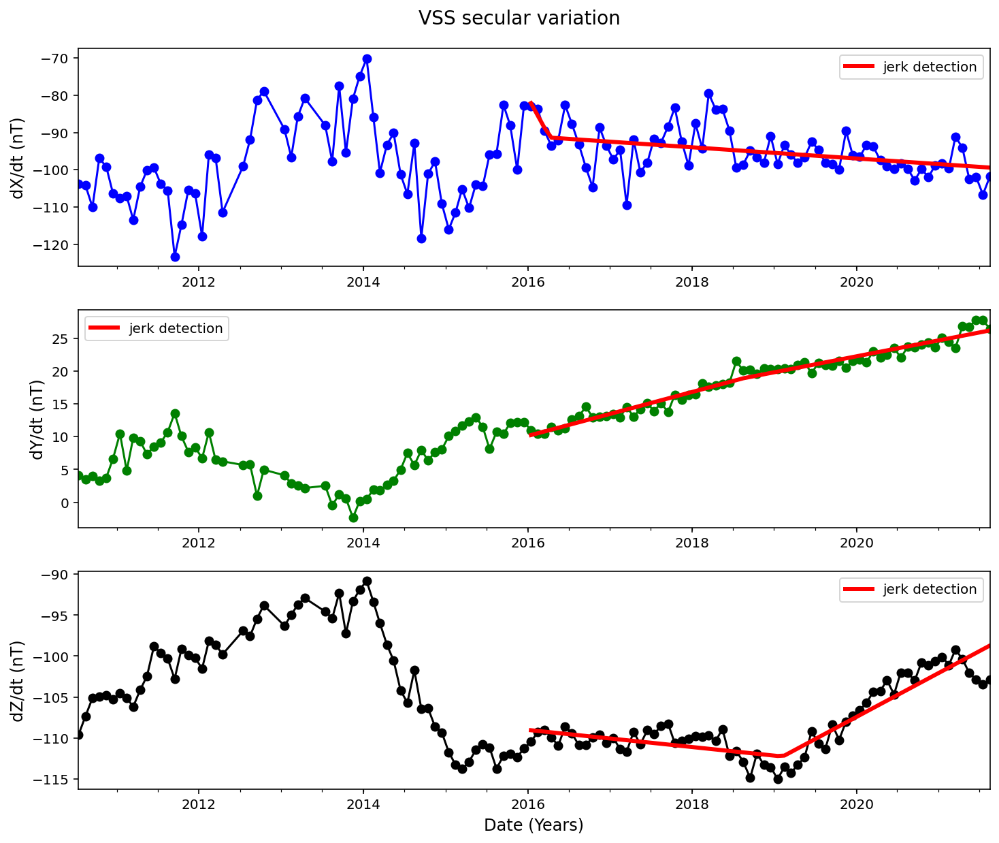

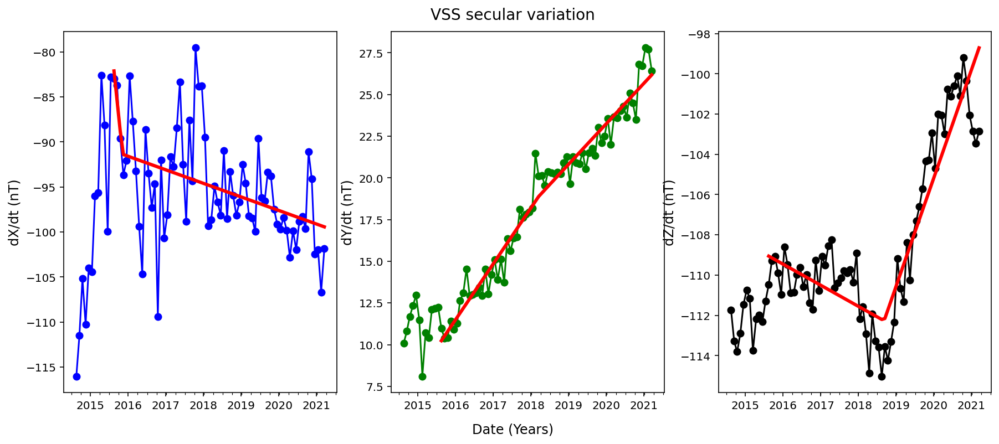

In [246]:
df_chaos = dpt.chaos_model_prediction('vss','2010-01-01','2022-02-28')
df, slops, breaks = dpt.jerk_detection_window(station = 'VSS',
                         window_start= '2016-01',
                         window_end = '2021-12',
                         starttime = '2010-01-01',
                         endtime = '2022-02-28',
                         df_CHAOS= df_chaos,
                        CHAOS_correction=False)

In [15]:
df2 = dpt.resample_obs_data(df, 'H', apply_percentage= True)
df_sv = dpt.calculate_SV(df2, apply_percentage=True)

,X,Y,Z
Date,,,
2010-07-15,-103.823,4.120,-109.605
2010-08-15,-104.158,3.479,-107.308
2010-09-15,-110.134,4.045,-105.158
2010-10-15,-96.945,3.307,-104.986
2010-11-15,-99.142,3.730,-104.803
...,...,...,...
2021-02-14,-99.644,24.473,-101.085
2021-03-15,-91.102,23.495,-99.195
2021-04-15,-94.112,26.830,-100.355


In [5]:
def test(chaos:bool = True):
    if chaos == True:
        print('True')
    if chaos == False:
        print('False')
   

In [7]:
test(chaos = True)

True


In [74]:
print(f'Geomagnetic jerk'
      f'\ndetection statistics')

Geomagnetic jerk
detection statistics


In [109]:
fig = go.Figure()
fig.add_trace(go.Indicator(
    value = df_jerk['Ocurrence time'][0],
    title = 'Ocurrence Time',
    number={"font":{"size":40}},
    gauge = {
        'axis': {'visible': False}},
    domain = {'x': [0.1, 0.5], 'y': [0.5, 1]})) 

fig.add_trace(go.Indicator(
    value = df_jerk['Ocurrence time'][0],
    title = 'Jerk Amplitude',
    number={"font":{"size":40}},
    gauge = {
        'axis': {'visible': False}},
    domain = {'x': [0.3, 0.5], 'y': [0.5, 1]})) 

fig.add_trace(go.Indicator(
    value = df_jerk['R^2'][0],
    title = 'R^2',
    number={"font":{"size":40}},
    gauge = {
        'axis': {'visible': False}},
    domain = {'x': [0.5, 0.5], 'y': [0.5, 1]})) 

fig.update_layout(height = 150)

In [35]:
data = [{'R^2':0,
        'Amplitude':0,
        'Ocurrence time':0}]
df = pd.DataFrame(data)

In [319]:
df.to_csv('jerk_detection_info.txt', sep = '\t', index = False)

In [199]:
df_jerk = pd.read_csv('jerk_detection_info.txt', sep = ' ')
df_jerk

,Component,R2,Amplitude,Ocurrence
0,SV_X,1,2,3
1,SV_Y,2,3,4
2,SV_Z,4,5,6


In [198]:
df_jerk['Ocurrence time'].values

KeyError: 'Ocurrence time'

In [335]:
fig = go.Figure() 

go.Table(
    header=dict(values=list('A'),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[1,2,3], # 2nd column
               line_color='darkslategray',
               fill_color='lightcyan',
               align='left'))

fig

In [224]:
df_jerk['Component'][1]

'SV_Y'

In [181]:
df_jerk.R2

AttributeError: 'DataFrame' object has no attribute 'R2'

In [204]:
    fig2(go.Figure(data=[go.Table(
        header=dict(values=list(df_jerk.columns),
                    fill_color='paleturquoise',
                    align='left'),
        cells=dict(values=[df_jerk.Component, df_jerk.R2,df_jerk.Amplitude,df_jerk.Ocurrence], # 2nd column
                   line_color='darkslategray',
                   fill_color='lightcyan',
                   align='left'))
    ]))

TypeError: 'Figure' object is not callable

In [281]:
#df_jerk['Amplitude'] = df_jerk['Amplitude'].replace(df_jerk['Amplitude'][0], breaks['X'].diff()[1].round(2))
df_jerk['Amplitude'] = df_jerk['Amplitude'].replace(df_jerk['Amplitude'][1], breaks['Y'].diff()[1].round(2))
#df_jerk['Amplitude'] = df_jerk['Amplitude'].replace(df_jerk['Amplitude'][2], breaks['Z'].diff()[1].round(2))

In [299]:
df_jerk['t'] = breaks.diff().iloc[1].values.round(2)

In [308]:
breaks.iloc[1].values.round(2)

array([2016.27, 2018.62, 2019.1 ])

In [305]:
slops.diff().iloc[1].values.round(2)

array([38.9 , -0.92,  6.43])

In [355]:
r2 = []

In [4]:
r2.append(5)

NameError: name 'r2' is not defined

In [4]:
df = mvs.load_INTERMAGNET_files('WIC','2010-01-01','2022-02-28')

Reading files from WIC...


array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

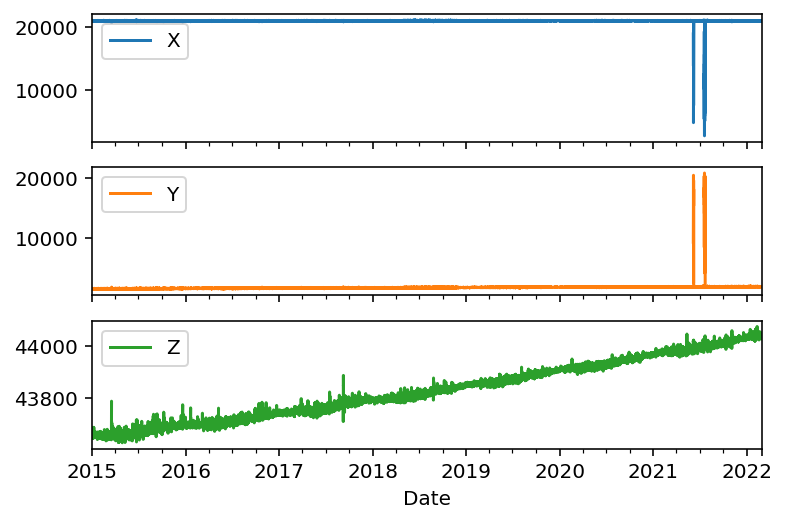

The external field predicted using CHAOS-model was removed from the data.
The external field predicted using CHAOS-model was removed from the data.
The external field predicted using CHAOS-model was removed from the data.


C:\Users\marco\Downloads\Thesis_notebooks\Thesis_Marcos\support_functions.py:79: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



Top 5 disturbed days for each month were removed from the data.


C:\Users\marco\Downloads\Thesis_notebooks\Thesis_Marcos\support_functions.py:79: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



Top 5 disturbed days for each month were removed from the data.
The external field predicted using CHAOS-model was removed from the data.


C:\Users\marco\Downloads\Thesis_notebooks\Thesis_Marcos\support_functions.py:79: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



Top 5 disturbed days for each month were removed from the data.
The external field predicted using CHAOS-model was removed from the data.
The external field predicted using CHAOS-model was removed from the data.
The external field predicted using CHAOS-model was removed from the data.
The external field predicted using CHAOS-model was removed from the data.


In [6]:
df.plot(subplots = True)

In [64]:
    df = pd.read_csv(f'hourly_data/SHU_hourly_data.txt', sep = '\t')
    df.index = pd.to_datetime(df['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
    df.pop('Date')
    #df.dropna()

Date
2010-01-01 00:29:30    2010-01-01 00:29:30
2010-01-01 01:29:30    2010-01-01 01:29:30
2010-01-01 02:29:30    2010-01-01 02:29:30
2010-01-01 03:29:30    2010-01-01 03:29:30
2010-01-01 04:29:30    2010-01-01 04:29:30
                              ...         
2021-11-30 19:29:30    2021-11-30 19:29:30
2021-11-30 20:29:30    2021-11-30 20:29:30
2021-11-30 21:29:30    2021-11-30 21:29:30
2021-11-30 22:29:30    2021-11-30 22:29:30
2021-11-30 23:29:30    2021-11-30 23:29:30
Name: Date, Length: 104448, dtype: object

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

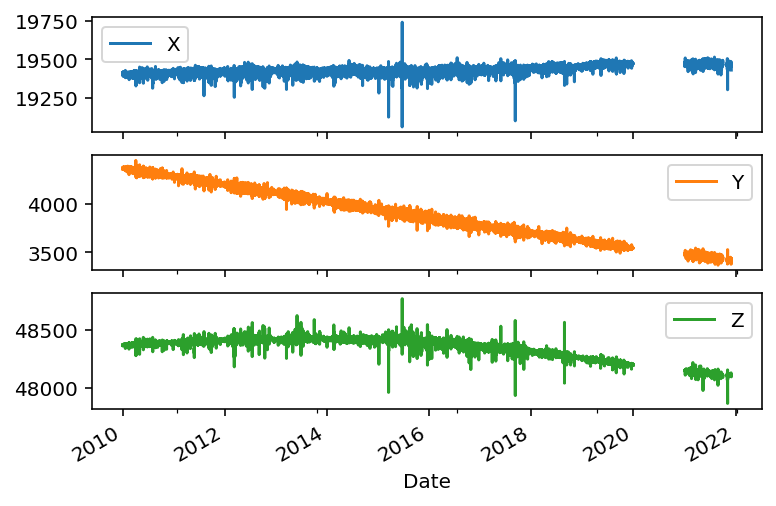

In [65]:
df.plot(subplots = True)

In [66]:
df_m = dpt.resample_obs_data(df,'M', apply_percentage=True)

In [67]:
df_m

,X,Y,Z
Date,,,
2010-01-15,19405.796142,4360.023737,48371.792070
2010-02-14,19403.666443,4351.791964,48375.048958
2010-03-15,19405.389866,4347.067406,48375.229516
2010-04-15,19401.257639,4336.409861,48378.597972
2010-05-15,19408.692715,4331.228441,48380.906438
...,...,...,...
2021-07-15,19475.686747,3447.938737,48124.776707
2021-08-15,19472.395840,3442.161762,48118.727184
2021-09-15,19470.821885,3438.796271,48115.819361


In [70]:
df_sv = (df_m.diff(6) - df_m.diff(-6).round(3)).dropna()

In [71]:
df_sv

,X,Y,Z
Date,,,
2010-07-15,10.661968,-81.278441,24.106487
2010-08-15,8.786589,-82.049502,23.392722
2010-09-15,7.053134,-83.679364,24.536178
2010-10-15,12.714818,-80.648232,22.348568
2010-12-15,9.553267,-84.438449,22.144719
...,...,...,...
2019-01-15,19.898962,-81.369790,-61.720868
2019-02-14,23.311398,-79.818737,-62.784877
2019-03-15,19.718185,-80.298432,-62.382230


array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

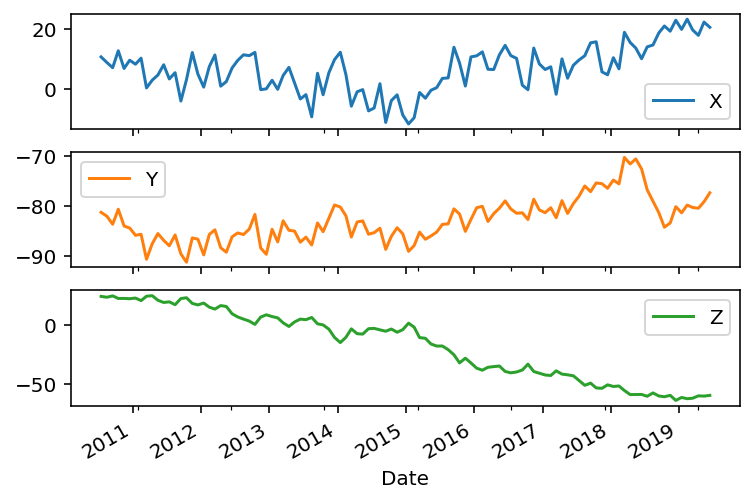

In [33]:
df_sv.plot(subplots = True)

In [39]:
import pandas as pd
from Thesis_Marcos import thesis_functions as mvs
from Thesis_Marcos import data_processing_tools as dpt
from Thesis_Marcos import utilities_tools as utt
from Thesis_Marcos import support_functions as spf
df_imos = pd.read_csv('Thesis_Marcos/Data/Imos informations/IMOS_INTERMAGNET.txt', sep = '\s+', index_col = [0])
df_imos = df_imos.drop(['MAA','COI'])

In [9]:
starttime = '2018-01-01'
endtime = '2022-08-30'
#for station in df_imos.index:
for station in ['PIL']:
    try:
        df = mvs.load_INTERMAGNET_files(station , starttime, endtime)
        df = utt.HDZ_to_XYZ_conversion(station, df)
        df = dpt.resample_obs_data(df, 'H', apply_percentage= True)
        
        df2 = pd.read_csv(f'hourly_data/MGD_hourly_data.txt', sep = '\t')
        df2.index = pd.to_datetime(df2['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
        df2.pop('Date')
        
        #df_chaos = pd.read_csv(f'hourly_data/{station}_chaos_hourly_data.txt', sep = '\t')
        #df_chaos.index = pd.to_datetime(df_chaos['Unnamed: 0'], format= '%Y-%m-%d %H:%M:%S.%f')
        #df_chaos.pop('Unnamed: 0')

        
        df_new_imo = pd.concat([df2,df])
        df_new_imo.round(2).drop_duplicates.to_csv(f"hourly_data/{station}_hourly_data.txt", sep = '\t')
        #df_new = dpt.chaos_model_prediction(station, starttime, endtime)
        #df.round(2).to_csv(f'hourly_data/{station}_hourly_data.txt',sep = '\t')
        #df_new = pd.concat([df, df_chaos])
        #df_new.round(2).to_csv(f"hourly_data/{station.upper()}_chaos_hourly_data.txt", sep = '\t')
    except:
        pass

In [8]:
df2 = pd.read_csv(f'hourly_data/MGD_hourly_data.txt', sep = '\t')
df2.index = pd.to_datetime(df2['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
df2.pop('Date')
df2

,X,Y,Z
Date,,,
2012-01-01 00:29:30,16883.54,-4020.12,53302.45
2012-01-01 01:29:30,16881.32,-4020.44,53302.26
2012-01-01 02:29:30,16880.08,-4026.18,53303.18
2012-01-01 03:29:30,16884.59,-4030.29,53304.71
2012-01-01 04:29:30,16889.03,-4026.37,53303.60
...,...,...,...
2022-04-20 19:29:30,16756.97,-4163.39,53807.78
2022-04-20 20:29:30,16755.10,-4163.80,53805.76
2022-04-20 21:29:30,16750.28,-4158.54,53805.45


In [57]:
import os.path, time
import ftplib
time.ctime(os.path.getmtime('O:/jmat/TTB0/TTB0_20220524.ppm'))

'Tue Jun 21 07:36:46 2022'

In [63]:
with open('O:/jmat/TTB0/TTB0_20220524.ppm') as f:
    lines = f.readlines()

In [64]:
lines

['00:00:00 05-24-2022 00:00:00 26351.81 99\n',
 '00:00:01 05-24-2022 00:00:01 26351.76 99\n',
 '00:00:02 05-24-2022 00:00:02 26351.87 99\n',
 '00:00:03 05-24-2022 00:00:03 26351.83 99\n',
 '00:00:04 05-24-2022 00:00:04 26351.70 99\n',
 '00:00:05 05-24-2022 00:00:05 26351.78 99\n',
 '00:00:06 05-24-2022 00:00:06 26351.75 99\n',
 '00:00:07 05-24-2022 00:00:07 26351.76 99\n',
 '00:00:08 05-24-2022 00:00:08 26351.80 99\n',
 '00:00:09 05-24-2022 00:00:09 26351.77 99\n',
 '00:00:10 05-24-2022 00:00:10 26351.83 99\n',
 '00:00:11 05-24-2022 00:00:11 26351.78 99\n',
 '00:00:12 05-24-2022 00:00:12 26351.80 99\n',
 '00:00:13 05-24-2022 00:00:13 26351.79 99\n',
 '00:00:14 05-24-2022 00:00:14 26351.78 99\n',
 '00:00:15 05-24-2022 00:00:15 26351.82 99\n',
 '00:00:16 05-24-2022 00:00:16 26351.88 99\n',
 '00:00:17 05-24-2022 00:00:17 26351.81 99\n',
 '00:00:18 05-24-2022 00:00:18 26351.85 99\n',
 '00:00:19 05-24-2022 00:00:19 26351.86 99\n',
 '00:00:20 05-24-2022 00:00:20 26351.81 99\n',
 '00:00:21 05

In [61]:
ftp = ftplib.FTP(f'ftp.gfz-potsdam.de')
ftp.login('anonymous', 'email@email.com')
path_secppm = f'/pub/home/obs/data/relative/second/jmat/TTB0'
ftp.cwd(path_secppm) 
files_ftp = ftp.nlst('TTB0_20220620*')
timestamp = ftp.voidcmd("MDTM files_ftp")[4:].strip()

time = parser.parse(timestamp)

print(time)

error_perm: 550 files_ftp: No such file or directory.

In [65]:
import filecmp

In [70]:
filecmp.cmp(f'O:/jmat/TTB0/TTB0_20220621.ppm', f'O:/jmat/TTB0/tmp_TTB0_20220620.ppm')

False

In [68]:
os.remove(f'O:/jmat/TTB0/teste1.txt')

In [7]:
x = 9
if x != 10:
    lr = True
else:
    lr = False

In [8]:
lr

True

In [3]:
import os
#os.environ["CDF_LIB"] = "~/CDF/lib"
from spacepy import pycdf
#cdf = pycdf.CDF('TTB0_20151121.cdf')
#print(cdf)

In [4]:
import cdflib

In [5]:
cdf_file = cdflib.CDF('TTB0_20151121.cdf')

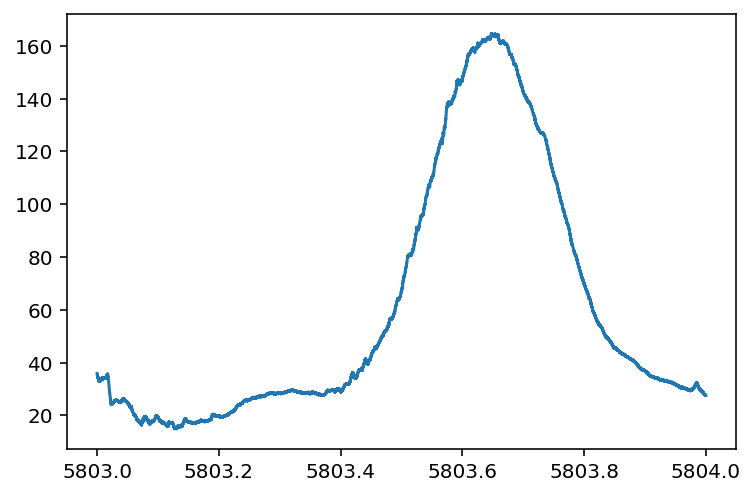

In [42]:
plt.plot(cdf_file['time'],cdf_file['HNvar'])

In [6]:
cdf_file.

AttributeError: 'CDF' object has no attribute 'var'

In [173]:
df_cdf['HNvar'][:]

2021-04-01 00:00:00    18590.69
2021-04-01 00:00:01    18590.67
2021-04-01 00:00:02    18590.68
2021-04-01 00:00:03    18590.71
2021-04-01 00:00:04    18590.69
                         ...   
2021-04-01 23:59:55    18584.46
2021-04-01 23:59:56    18584.40
2021-04-01 23:59:57    18584.41
2021-04-01 23:59:58    18584.38
2021-04-01 23:59:59    18584.33
Name: HNvar, Length: 86400, dtype: float64

In [5]:
from spacepy import pycdf
import pandas as pd

In [9]:
data = pycdf.CDF('cdfs/TTB0_20220621.cdf', readonly=False)

In [46]:
data.keys()

KeysView(<CDF:
Basetrig: CDF_DOUBLE [16]
D0: CDF_DOUBLE [16]
F0: CDF_DOUBLE [16]
Fsc: CDF_DOUBLE [86400]
FscQP: CDF_INT1 [86400]
Fscflag: CDF_INT1 [86400]
H0: CDF_DOUBLE [16]
HEflag: CDF_INT1 [86400]
HEscv: CDF_DOUBLE [16]
HEvar: CDF_DOUBLE [86400]
HNflag: CDF_INT1 [86400]
HNscv: CDF_DOUBLE [16]
HNvar: CDF_DOUBLE [86400]
T1: CDF_DOUBLE [86400]
T1flag: CDF_INT1 [86400]
T2: CDF_DOUBLE [86400]
T2flag: CDF_INT1 [86400]
Timeerr: CDF_DOUBLE [1]
Timeerrtrig: CDF_DOUBLE [1]
Z0: CDF_DOUBLE [16]
Zflag: CDF_INT1 [86400]
Zscv: CDF_DOUBLE [16]
Zvar: CDF_DOUBLE [86400]
time: CDF_DOUBLE [86400]
timefge: CDF_DOUBLE [86400]
timegps: CDF_DOUBLE [86400]
timeppm: CDF_DOUBLE [86400]
>)

In [57]:
data['timegps'][...]

array([8189.        , 8189.00001157, 8189.00002315, ..., 8189.99996528,
       8189.99997685, 8189.99998843])

In [174]:
data['time'] = [1,2,3,4]
data['H'] = df_cdf['HNvar'].values
data.save()

In [198]:
data2.del('time')

SyntaxError: invalid syntax (694160543.py, line 1)

In [190]:
for key, value in zip(data.keys(), data.values()):
    data2[key] = value


In [193]:
data2
data2.save()

In [16]:
data['HNvar'][...] +  data['H0'][1]

array([26251.02, 26250.99, 26250.98, ..., 26242.95, 26243.02, 26243.01])

In [2]:
import glob
import pandas as pd
#glob.glob('cdfs/TTB_2022*')

In [10]:
data = pycdf.concatCDF([pycdf.CDF(f) for f in glob.glob('Dados OBS/maa/*')])

In [10]:
df_cdf = pd.DataFrame()
#df_cdf['F_calc'] = np.sqrt((data['HNvar'] + data['H0'][1])**2 + (data['HEvar'] + data['D0'][1])**2 + (data['Zvar'] +data['Z0'][1])**2 )
df_cdf['Fsc'] = data['Fsc']
df_cdf['HNvar'] = data['HNvar']
df_cdf['Zvar'] = data['Zvar']
df_cdf['HEvar'] = data['HEvar']
df_cdf['T1'] = data['T1']
df_cdf['T2'] = data['T2']
df_cdf.index = pd.to_datetime(cp.data_utils.timestamp(data['time'][:]))

In [60]:
df_cdf

,Fsc,HNvar,Zvar,HEvar,T1,T2
2022-06-03 00:00:00,23336.33,-855.22,-895.01,-171.06,22.0,NaN
2022-06-03 00:00:01,23336.33,-855.24,-895.08,-170.98,22.0,NaN
2022-06-03 00:00:02,23336.33,-855.20,-895.00,-170.85,22.0,NaN
2022-06-03 00:00:03,23336.33,-855.22,-895.10,-171.01,22.0,NaN
2022-06-03 00:00:04,23336.33,-855.18,-895.23,-170.98,22.0,NaN
...,...,...,...,...,...,...
2022-06-03 23:59:55,23342.32,-847.59,-895.22,-169.90,22.0,NaN
2022-06-03 23:59:56,23342.32,-847.61,-895.22,-169.91,22.0,NaN
2022-06-03 23:59:57,23342.32,-847.70,-895.16,-169.97,22.0,NaN
2022-06-03 23:59:58,23342.32,-847.71,-895.06,-169.98,22.0,NaN


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


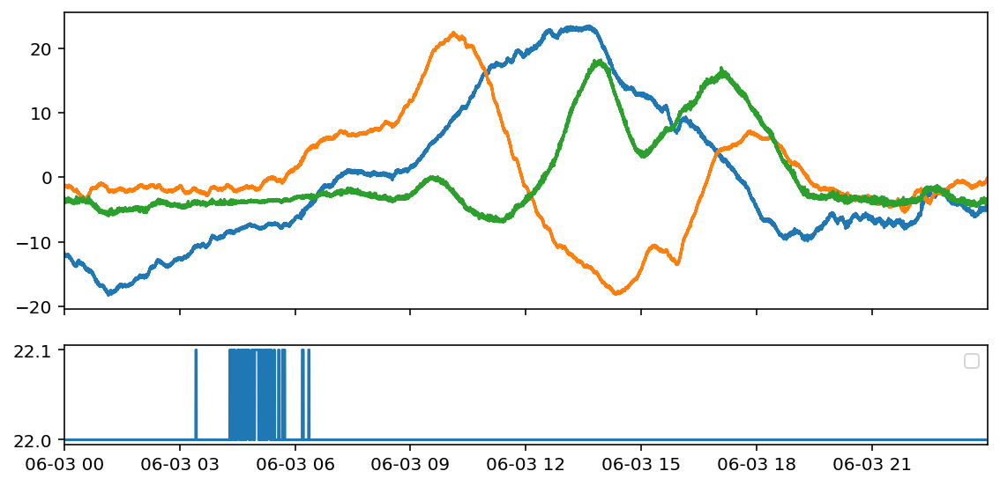

In [69]:
fig, ax = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]}, sharex = True, figsize = (8,4))
fig.tight_layout()

ax[0].plot(df_cdf['HNvar'] - df_cdf['HNvar'].mean(), label = 'X')
ax[0].plot(df_cdf['HEvar'] - df_cdf['HEvar'].mean(), label = 'Y')
ax[0].plot(df_cdf['Zvar'] - df_cdf['Zvar'].mean(), label = 'Z')

ax[1].plot(df_cdf['T1'])
ax[0].set_xlim(df_cdf.index[0], df_cdf.index[-1])
plt.legend()
#plt.savefig('xyz.jpeg', bbox_inches = 'tight', dpi = 300)

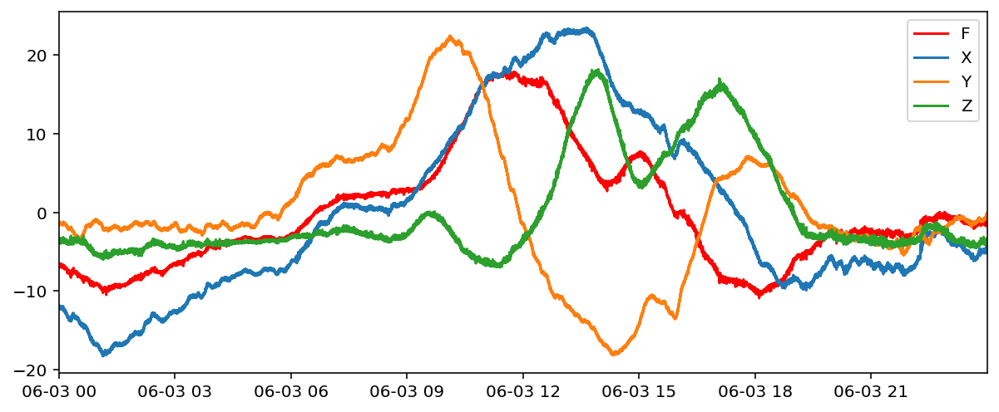

In [71]:
plt.figure(figsize = (10,4))

plt.plot(df_cdf['Fsc'] - df_cdf['Fsc'].mean(),color = 'red', label = 'F')
plt.plot(df_cdf['HNvar'] - df_cdf['HNvar'].mean(), label = 'X')
plt.plot(df_cdf['HEvar'] - df_cdf['HEvar'].mean(), label = 'Y')
plt.plot(df_cdf['Zvar'] - df_cdf['Zvar'].mean(), label = 'Z')

plt.xlim(df_cdf.index[0], df_cdf.index[-1])
plt.legend()
plt.savefig('fxyz.jpeg', bbox_inches = 'tight', dpi = 300)

In [6]:
def hampel_filter_denoising(dataframe,
                            window_size,
                            columns,
                            n_sigmas=3,
                            plot_figure= False):
    '''

    
    ------------------------------------------------------------------------------------
    
    Inputs:
    
    dataframe - a pandas dataframe with geomagnetic data. 
    
    window_size - integer, size of the moving window to calculate the absolute median
    
    n_sigmas - Number of standard deviations to be consider as a outlier
    
    plot_figure - boolean, option to plot a comparison between real and denoised data.
    
    ------------------------------------------------------------------------------------
    
    Return a hourly dataframe denoised 
    '''
    
    #validating the inputs
    
    assert isinstance(dataframe, pd.DataFrame), 'dataframe must be a pandas dataframe.'
    
    assert isinstance(window_size, int), 'window_size must be an integer.'
    
    #dataframe = resample_obs_data(dataframe,'H',
    #                              apply_percentage=True
    #                              )
    
    df_denoised = dataframe.copy()
    
    columns = columns

    print('Denoising the data')

    for column in columns:
        
        n = len(dataframe[column])
        #denoised_dataframe = dataframe.copy()
        k = 1.4826 # scale factor for Gaussian distribution
        
        for i in range((window_size),(n - window_size)):
            x0 = np.median(dataframe[column][(i - window_size):(i + window_size)])
            S0 = k * np.median(np.abs(dataframe[column][(i - window_size):(i + window_size)] - x0))
            if (np.abs(dataframe[column][i] - x0) > n_sigmas * S0):
                df_denoised[column][i] = x0
                
    if plot_figure == True:
        
        fig, axis = plt.subplots(3 ,1, figsize = (16,10))
        for col, ax in zip(columns, axis.flatten()):
            
            ax.plot(dataframe[col], 'k', label = 'Removed Outliers')
            ax.plot(df_denoised[col], 'r', label = 'Denoised ' + col)
            ax.set_xlim(dataframe[col].index[0], dataframe[col].index[-1])
            ax.legend(loc='best', fontsize = 12)
            ax.grid()
        plt.show()
               
    else:
        pass
        
    return df_denoised


Denoising the data


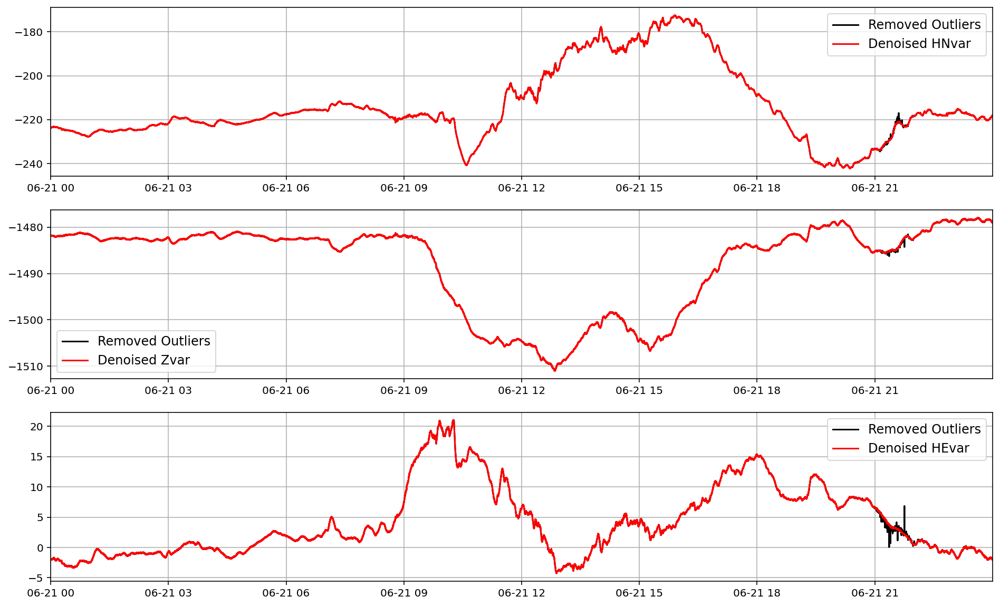

In [11]:
df_denoised = hampel_filter_denoising(dataframe=df_cdf,
                                      window_size = 30,
                                      columns = ['HNvar','Zvar', 'HEvar'],
                                      n_sigmas = 2,
                                      plot_figure=True)

Text(0, 0.5, 'HEvar (nT)')

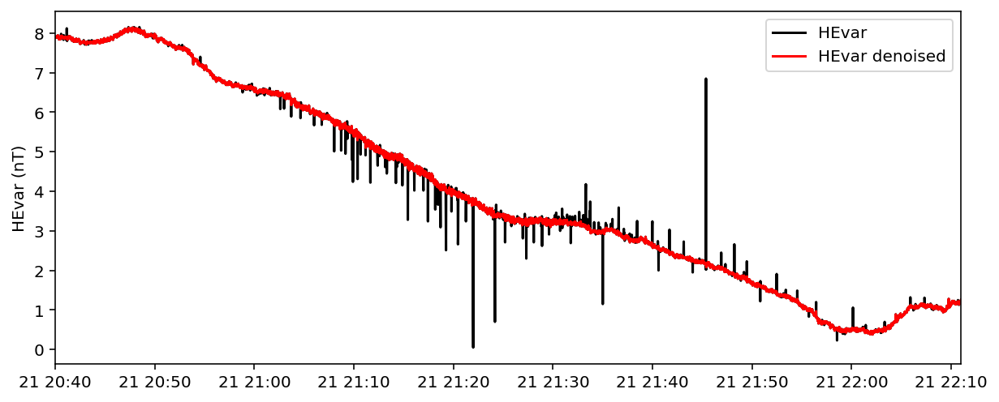

In [28]:
plt.figure(figsize = (10,4))
plt.plot(df_cdf.loc['2022-06-21 20:40':'2022-06-21 22:10']['HEvar'], label = 'HEvar', color = 'black')
plt.plot(df_denoised.loc['2022-06-21 20:40':'2022-06-21 22:10']['HEvar'], label = 'HEvar denoised', color = 'red')

plt.legend()
plt.xlim(df_denoised.loc['2022-06-21 20:40':'2022-06-21 22:10'].index[0],df_denoised.loc['2022-06-21 20:40':'2022-06-21 22:10'].index[-1])
plt.ylabel('HEvar (nT)')


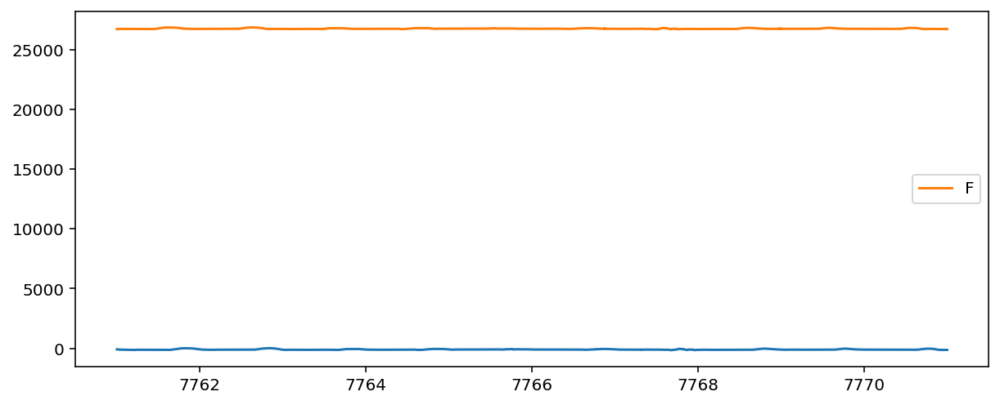

In [14]:
plt.figure(figsize = (10,4))
plt.plot(data['time'],data['HNvar'] )
plt.plot(data['time'],data['Fsc'], label = 'F')
#plt.plot(data['time'],Fcal - np.mean(Fcal), label = 'F_calc')
plt.legend()

In [14]:
data['HNvar']

dmarray([35.84, 35.79, 35.77, ..., 27.25, 27.18, 27.19])

In [67]:
data['timegps']

dmarray([5803.        , 5803.00005787, 5803.00011574, ..., 5806.51521991,
         5806.51521991,           nan])

In [92]:
Fcal = np.sqrt((data['HNvar'] + data['H0'][1])**2 + (data['HEvar'] + data['D0'][1])**2 + (data['Zvar'] +data['Z0'][1])**2 ) 

In [97]:
data['HNvar'] + data['H0'][1]

dmarray([18590.69, 18590.67, 18590.68, ..., 18584.41, 18584.38, 18584.33])

In [46]:
	
pd.to_datetime(cp.data_utils.timestamp(data['time'][:]))

DatetimeIndex(['2021-05-02 00:00:00', '2021-05-02 00:00:01',
               '2021-05-02 00:00:02', '2021-05-02 00:00:03',
               '2021-05-02 00:00:04', '2021-05-02 00:00:05',
               '2021-05-02 00:00:06', '2021-05-02 00:00:07',
               '2021-05-02 00:00:08', '2021-05-02 00:00:09',
               ...
               '2021-05-02 23:59:50', '2021-05-02 23:59:51',
               '2021-05-02 23:59:52', '2021-05-02 23:59:53',
               '2021-05-02 23:59:54', '2021-05-02 23:59:55',
               '2021-05-02 23:59:56', '2021-05-02 23:59:57',
               '2021-05-02 23:59:58', '2021-05-02 23:59:59'],
              dtype='datetime64[ns]', length=86400, freq=None)

In [155]:
df_cdf = pd.DataFrame()
df_cdf['F_calc'] = np.sqrt((data['HNvar'] + data['H0'][1])**2 + (data['HEvar'] + data['D0'][1])**2 + (data['Zvar'] +data['Z0'][1])**2 )
df_cdf['Fsc'] = data['Fsc']
df_cdf['HNvar'] = data['HNvar'] + data['H0'][1]
df_cdf['Zvar'] = data['Zvar']
df_cdf['HEvar'] = data['HEvar']
df_cdf.index = pd.to_datetime(cp.data_utils.timestamp(data['time'][:]))

In [147]:
df_cdf.loc[df_cdf['HNvar'] >= 20]

,F_calc,Fsc,HNvar,Zvar,HEvar
5803.000000,26496.419493,26503.36,35.84,72.57,61.31
5803.000012,26496.369898,NaN,35.79,72.54,61.30
5803.000023,26496.350439,NaN,35.77,72.50,61.29
5803.000035,26496.290769,NaN,35.71,72.47,61.23
5803.000046,26496.280646,NaN,35.70,72.48,61.24
...,...,...,...,...,...
5822.999942,26490.524350,NaN,27.24,-87.54,60.83
5822.999954,26490.514168,NaN,27.23,-87.53,60.84
5822.999965,26490.534992,NaN,27.25,-87.57,60.86
5822.999977,26490.464975,NaN,27.18,-87.57,60.84


In [136]:
with cdf.CDF('filename.cdf', '') as cdf_file:
    print(data)

AttributeError: 'CDF' object has no attribute 'CDF'

In [158]:
#cdf = pycdf.CDF('MyCDF.cdf', '')
cdf.save()
#cdf = data.copy()


In [156]:
cdf['time'] = df_cdf.index

C:\Users\marco\anaconda3\lib\site-packages\spacepy\pycdf\__init__.py:4618: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  absolutes = numpy.abs(d[d != 0])


UFuncTypeError: ufunc 'absolute' did not contain a loop with signature matching types <class 'numpy.dtype[datetime64]'> -> None

In [140]:
with cdf.CDF('filename.cdf', '') as cdf_file:
    print(cdf)

AttributeError: 'CDF' object has no attribute 'CDF'

In [76]:
try:
    obs[0:3] in ['MAA', 'TTB', 'VSS']
except KeyError:
    print(f'obs must be VSS, MAA or TTB')

In [74]:
obs in ['MAA', 'TTB', 'VBS0']

True

In [99]:
from scipy.signal import correlate
from scipy.signal import correlation_lags
from datetime import timedelta
import numpy as np
def cross_correlation_computation(x, y):
    

    
    
    #if len(x) < len(y):
    #    
    #    y = y.reindex(x.index)
    #if len(x) > len(y):
    #    x = x.reindex(y.index)

    x = x.interpolate()
    y = y.interpolate() 
        
    a = (x - x.mean()).values 
    b = (y - y.mean()).values
    
    #corre_cof = np.corrcoef(a,b)[0, 1]
    
    Z = np.argmax(correlate(a,b))
    lags = correlation_lags(a.size, b.size, mode="full")
    lag = lags[Z]
    print(f"Best lag: {str(timedelta(seconds=float(lag)))}")
    return lag

In [100]:
cross_correlation_computation(df_cdf['HNvar'], df_cdf['Fsc'])

Best lag: 4:41:08


16868

In [116]:
df_cdf['Fsc'].corr(df_cdf['HNvar'].shift(-14000, freq = 's'))

0.934156294618723

In [120]:
data['H0'] = 10

In [121]:
data['H0']

10

In [125]:
data.from_data()

AttributeError: 'SpaceData' object has no attribute 'from_data'

In [126]:
data

{'H0': dmarray([18678., 18678., 18678., 18678., 18678., 18678., 18678., 18678.,
          18678., 18678., 18678., 18678., 18678., 18678., 18678., 18678.]),
 'D0': dmarray([-22.4525, -22.4525, -22.4525, -22.4525, -22.4525, -22.4525,
          -22.4525, -22.4525, -22.4525, -22.4525, -22.4525, -22.4525,
          -22.4525, -22.4525, -22.4525, -22.4525]),
 'Z0': dmarray([-14428.99, -14428.99, -14428.99, -14428.99, -14428.99, -14428.99,
          -14428.99, -14428.99, -14428.99, -14428.99, -14428.99, -14428.99,
          -14428.99, -14428.99, -14428.99, -14428.99]),
 'F0': dmarray([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 'HNscv': dmarray([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'HEscv': dmarray([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'Zscv': dmarray([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 'Basetrig': dmarray([7761.   , 7761.   , 7761.125, 7761.125, 7761.25 , 7761.25 ,
          7761

In [139]:
df_ppm = pd.read_csv(f'O:/jmat/MAA0/MAA0_20210427.ppm',
                     header = None,
                     skiprows = 0,
                     sep = '\s+',
                     parse_dates = {'Date': ['date', 'time']},
                     usecols = [1, 2, 3],
                     names = ['date', 'time', 'F'],
                     index_col = 'Date')

In [81]:
df_ppm

,F
Date,
2021-04-26 00:00:00,26704.70
2021-04-26 00:00:01,26704.70
2021-04-26 00:00:02,26704.70
2021-04-26 00:00:03,26704.70
2021-04-26 00:00:04,26704.70
...,...
2021-04-26 23:59:55,26700.36
2021-04-26 23:59:56,26700.36
2021-04-26 23:59:57,26700.36


In [141]:
df_sec2 = pd.read_csv(f'O:/jmat/MAA0/MAA02_20210427.sec',
                     header = None,
                     skiprows = 0,
                     delim_whitespace=True,
                     usecols = [0, 1, 2, 3, 4, 5],
                     names = ['time', 'X', 'Y', 'Z','T1','T2'])
#df_sec.loc[df_sec['X'] >= 99999.0, 'X'] = np.nan
#df_sec.loc[df_sec['Y'] >= 99999.0, 'Y'] = np.nan
#df_sec.loc[df_sec['Z'] >= 99999.0, 'Z'] = np.nan

df_sec2.index = pd.date_range('20210427 ' + df_sec2['time'].values[0], '20210427 ' + df_sec2['time'].values[-1], freq = 's')

In [94]:
df_sec3

,time,X,Y,Z,T1,T2
0,00:00:00,-120.30,-1.87,-91.34,31.4,36.8
1,00:00:01,-120.32,-1.87,-91.34,31.4,36.8
2,00:00:02,-120.33,-1.87,-91.33,31.4,36.8
3,00:00:03,-120.33,-1.92,-91.30,31.4,36.8
4,00:00:04,-120.32,-1.89,-91.31,31.4,36.8
...,...,...,...,...,...,...
172795,23:59:55,-104.29,5.73,-80.52,32.0,37.4
172796,23:59:56,-104.28,5.76,-80.51,32.0,37.4
172797,23:59:57,-104.32,5.76,-80.49,32.0,37.4
172798,23:59:58,-104.33,5.73,-80.54,32.0,37.4


In [142]:
df_sec = pd.read_csv(f'O:/jmat/MAA0/MAA0_20210428.sec',
                     header = None,
                     skiprows = 0,
                     sep = '\s+',
                     usecols = [0, 1, 2, 3, 4, 5],
                     names = ['time', 'X', 'Y', 'Z','T1','T2'])
#df_sec.loc[df_sec['X'] >= 99999.0, 'X'] = np.nan
#df_sec.loc[df_sec['Y'] >= 99999.0, 'Y'] = np.nan
#df_sec.loc[df_sec['Z'] >= 99999.0, 'Z'] = np.nan

df_sec.index = pd.date_range('20210428 ' + df_sec['time'].values[0], '20210428 ' + df_sec['time'].values[-1], freq = 's')

In [143]:
df_sec3 = pd.read_csv(f'O:/jmat/MAA0/MAA0_20210429.sec',
                     header = None,
                     skiprows = 0,
                     sep = '\s+',
                     usecols = [0, 1, 2, 3, 4, 5],
                     names = ['time', 'X', 'Y', 'Z','T1','T2'])
#df_sec.loc[df_sec['X'] >= 99999.0, 'X'] = np.nan
#df_sec.loc[df_sec['Y'] >= 99999.0, 'Y'] = np.nan
#df_sec.loc[df_sec['Z'] >= 99999.0, 'Z'] = np.nan

df_sec3.index = pd.date_range('20210429 ' + df_sec3['time'].values[0], '20210429 ' + df_sec3['time'].values[-1], freq = 's')

In [144]:
df_sec = pd.concat([df_sec2,df_sec,df_sec3])

In [145]:
df_sec = df_sec.shift(-16935, freq = 's')

In [149]:
df_sec.loc['2021-04-27'].index.time

array([datetime.time(0, 0), datetime.time(0, 0, 1),
       datetime.time(0, 0, 2), ..., datetime.time(23, 59, 57),
       datetime.time(23, 59, 58), datetime.time(23, 59, 59)], dtype=object)

In [150]:
df_sec['time'].loc['2021-04-27'] = df_sec.loc['2021-04-27'].index.time

C:\Users\marco\AppData\Local\Temp\ipykernel_18176\4048077238.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sec['time'].loc['2021-04-27'] = df_sec.loc['2021-04-27'].index.time


In [70]:
df_sec.loc['2021-04-27'].drop(df_sec['2021-04-27'].index)

C:\Users\marco\AppData\Local\Temp\ipykernel_18176\2515939159.py:1: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  df_sec.loc['2021-04-27'].drop(df_sec['2021-04-27'].index)


,time,X,Y,Z,T1,T2


In [152]:
df_sec.loc['2021-04-27'].to_csv('MAA0_20210427.sec',header = None, index = False,sep = ' ', float_format="%.2f")

In [125]:
df_sec3

,time,X,Y,Z,T1,T2
2021-04-29 00:00:00,00:00:00,-104.36,5.75,-80.53,32.0,37.4
2021-04-29 00:00:01,00:00:01,-104.35,5.76,-80.52,32.0,37.4
2021-04-29 00:00:02,00:00:02,-104.34,5.73,-80.53,32.0,37.4
2021-04-29 00:00:03,00:00:03,-104.37,5.72,-80.52,32.0,37.4
2021-04-29 00:00:04,00:00:04,-104.40,5.73,-80.54,32.0,37.4
...,...,...,...,...,...,...
2021-04-29 23:59:55,23:59:55,-108.09,1.95,-85.67,32.1,37.8
2021-04-29 23:59:56,23:59:56,-108.05,1.97,-85.67,32.1,37.8
2021-04-29 23:59:57,23:59:57,-108.09,1.97,-85.67,32.1,37.8
2021-04-29 23:59:58,23:59:58,-108.08,1.97,-85.69,32.1,37.8


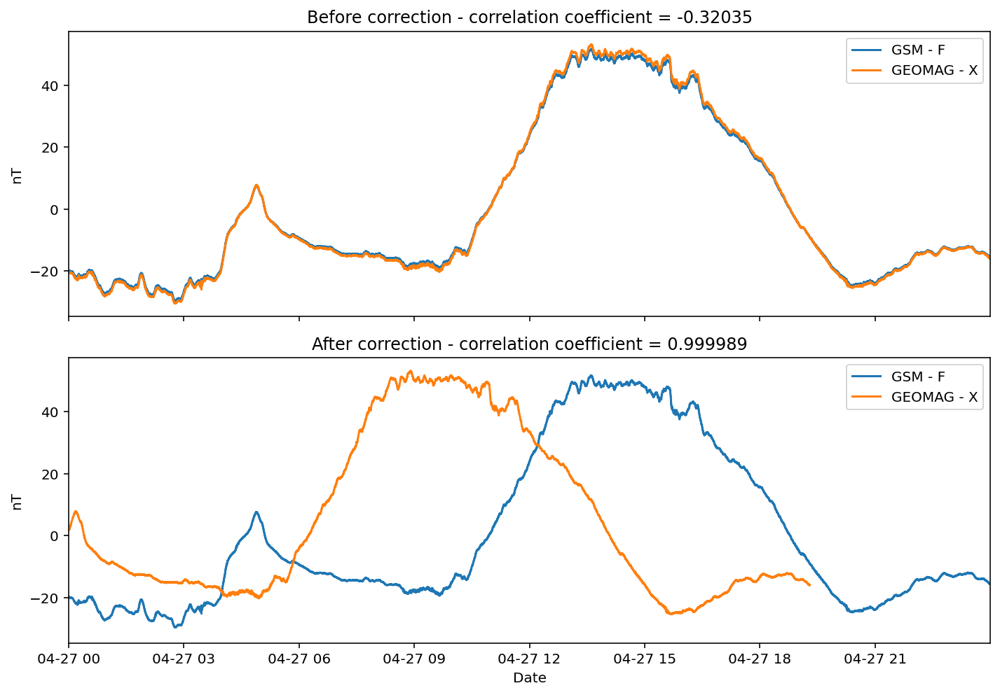

In [146]:
fig, ax = plt.subplots(2,1, figsize = (10,7), sharex = True)

ax[0].plot(df_ppm['F'].loc['2021-04-27'] - df_ppm['F'].loc['2021-04-27'].mean(), label =  'GSM - F')
ax[0].plot((df_sec['X'].loc['2021-04-27'] - df_sec['X'].loc['2021-04-27'].mean()), label = 'GEOMAG - X')

ax[0].set_xlim(df_ppm.index[0], df_ppm.index[-1])
ax[0].set_ylabel('nT')
ax[0].set_title(f'Before correction - correlation coefficient = -0.32035')
ax[0].legend()



ax[1].plot(df_ppm['F'].loc['2021-04-27'] - df_ppm['F'].loc['2021-04-27'].mean(), label =  'GSM - F')
ax[1].plot((df_sec['X'].loc['2021-04-27'] - df_sec['X'].loc['2021-04-27'].mean()).shift(-16935, freq = 's'), label = 'GEOMAG - X')

ax[1].set_xlim(df_ppm.index[0], df_ppm.index[-1])
ax[1].set_title(f'After correction - correlation coefficient = 0.999989')
ax[1].set_xlabel('Date')
ax[1].set_ylabel('nT')
ax[1].legend()

fig.tight_layout(pad=1)
#plt.savefig('time_shift.jpeg', dpi =300, tight_layout = True)
plt.show()

<AxesSubplot:>

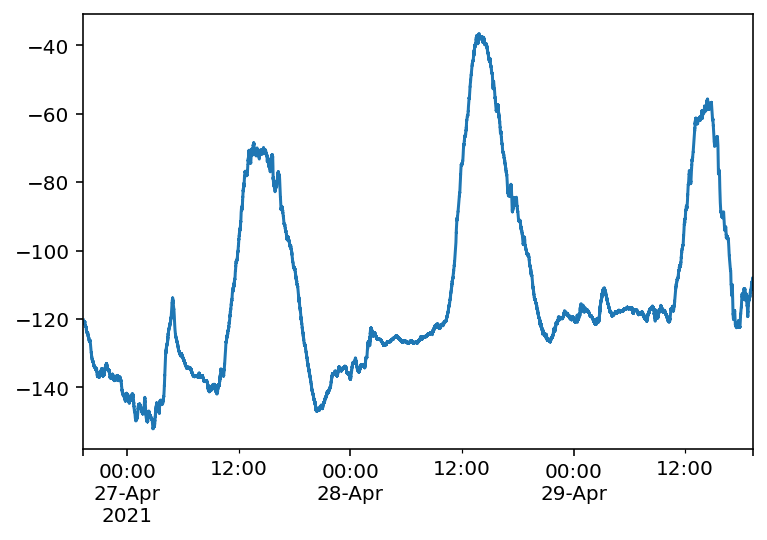

In [147]:
df_sec['X'].plot()

In [121]:
df_sec.loc['2021-04-26 23:59:59':'2021-04-27 00:50:59']

,time,X,Y,Z,T1,T2
2021-04-26 23:59:59,04:42:14,-142.07,-2.28,-83.72,31.7,36.1
2021-04-27 00:00:00,00:00:00,-142.09,-2.27,-83.75,31.7,36.1
2021-04-27 00:00:01,00:00:01,-142.08,-2.27,-83.74,31.7,36.1
2021-04-27 00:00:02,00:00:02,-142.10,-2.28,-83.74,31.7,36.1
2021-04-27 00:00:03,00:00:03,-142.09,-2.27,-83.74,31.7,36.1
...,...,...,...,...,...,...
2021-04-27 00:50:55,00:50:55,-147.94,-1.39,-85.66,31.7,36.1
2021-04-27 00:50:56,00:50:56,-147.99,-1.38,-85.67,31.7,36.1
2021-04-27 00:50:57,00:50:57,-148.00,-1.38,-85.67,31.7,36.1
2021-04-27 00:50:58,00:50:58,-147.98,-1.36,-85.67,31.7,36.1


In [168]:
from datetime import timedelta, date, datetime
date = (datetime.strptime('20210501', "%Y%m%d") + timedelta(days=1)).date().strftime('%Y%m%d')

In [170]:
'20210501' < date

True

In [171]:
from itertools import repeat

In [174]:
date_list = []
date_list.extend(repeat('str',5))

In [175]:
date_list

['str', 'str', 'str', 'str', 'str']

In [198]:
df=pd.read_csv('C:/Users/marco/Downloads/obs_data_processing/Geoomagnetic_observatory_data_processing/teste.txt',
               sep = '\t',
               index_col = 'Date')

In [199]:
df

,coef,Shift-Time (hh:mm:ss),Shift-Time (s),filetype
Date,,,,
20210401,0.999999,0:00:00,0,sec
20210402,0.999998,0:00:00,0,sec
20210403,0.999975,0:00:00,0,sec
20210404,0.999995,0:00:00,0,sec
20210405,0.999753,0:00:00,0,sec


In [200]:
df.loc[(df.index == int('20210401')) & (df.loc[df['filetype'] == 'sec'])]['Time-seconds'].values

ValueError: Unable to coerce to Series, length must be 4: given 5

In [206]:
int(df.loc[(df.index == int(date)) & (df['filetype'] == filetype)]['Shift-Time (s)'].values)

0

In [2]:
df = mvs.load_INTERMAGNET_files('NGK','2010-01-01','2019-12-31')

Reading files from NGK...


In [3]:
start_time = datetime.now() 
dpt.hampel_filter_denoising(df, window_size=48)
time_elapsed = datetime.now() - start_time 

print('Time elapsed (hh:mm:ss.ms) {}'.format(time_elapsed))


Denoising the data
Time elapsed (hh:mm:ss.ms) 1:12:36.182712


Time elapsed (hh:mm:ss.ms) 0:01:19.179616 - Hourly data - 10 years

Time elapsed (hh:mm:ss.ms) 1:12:36.182712 - minute data - 10 years

Reading files from NGK...
Initiating geomagnetic field computation for NGK.
Computing core field.
Computing crustal field up to degree 110.
Computing field due to external sources, incl. induced field: GSM.
The external field predicted using CHAOS-model was removed from the data.

NGK Jerk statistics for the X component.

Jerk occurence time -t0-: 2014.62
Jerk amplitute: -1.74
R^2: 0.72

****************************************************************

NGK Jerk statistics for the Y component.

Jerk occurence time -t0-: 2014.27
Jerk amplitute: 7.26
R^2: 0.96

****************************************************************

NGK Jerk statistics for the Z component.

Jerk occurence time -t0-: 2014.62
Jerk amplitute: 4.44
R^2: 0.98

****************************************************************


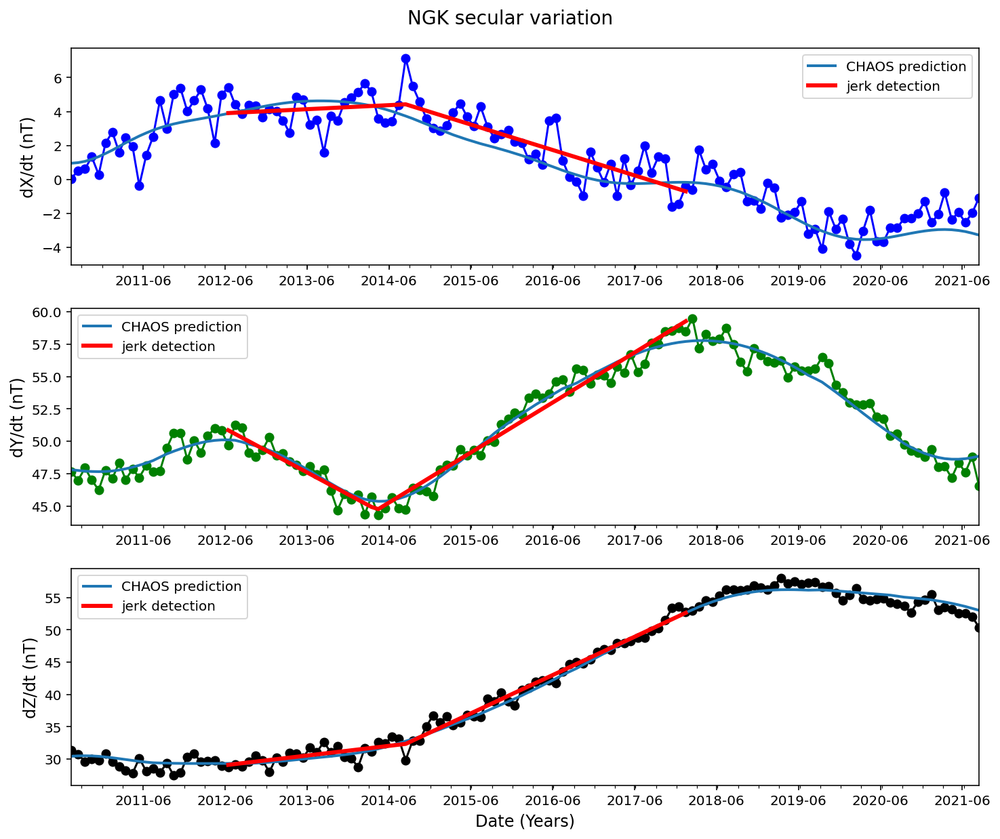

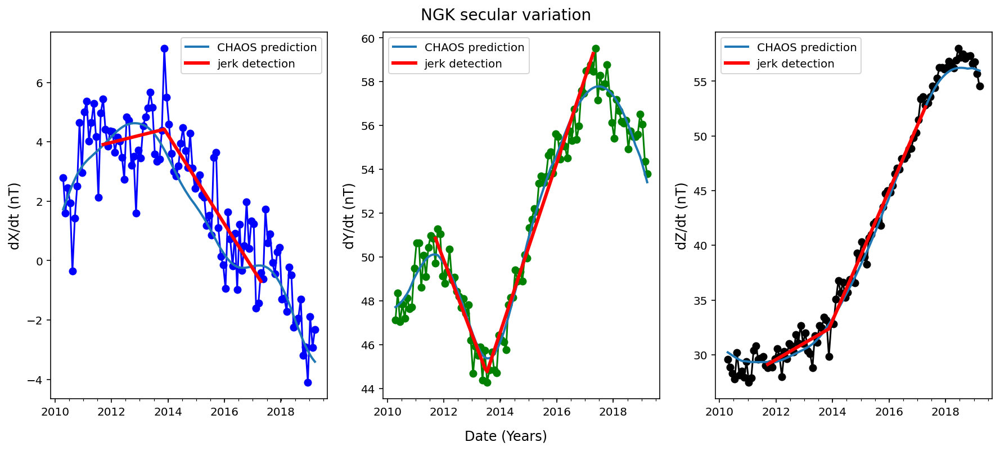

(                   X          Y          Z
 Date                                      
 2012-06-15  3.908674  50.852859  29.122912
 2012-07-15  3.928151  50.575104  29.245551
 2012-08-15  3.948277  50.288090  29.372277
 2012-09-15  3.968403  50.001076  29.499004
 2012-10-15  3.987880  49.723320  29.621642
 ...              ...        ...        ...
 2017-09-15 -0.198355  57.987676  50.660646
 2017-10-15 -0.321491  58.305594  51.148147
 2017-11-15 -0.448731  58.634110  51.651898
 2017-12-15 -0.571867  58.952029  52.139400
 2018-01-15 -0.699108  59.280544  52.643151
 
 [68 rows x 3 columns],
           X         Y         Z
 0  0.237617 -3.388617  1.496189
 1 -1.498155  3.868009  5.931265,
              X            Y            Z
 0  2012.453552  2012.453552  2012.453552
 1  2014.619228  2014.269050  2014.619178
 2  2018.038356  2018.038356  2018.038356,
 [0.72, 0.96, 0.98])

In [2]:
import sys
sys.path.insert(0, 'C:/Users/marco/Downloads/Thesis_notebooks/Thesis_Marcos')
import thesis_functions as mvs
import data_processing_tools as dpt
import utilities_tools as utt
import support_functions as spf

dpt.jerk_detection_window(station = 'NGK',
                          window_start= '2012-06',
                          window_end = '2018-01',
                          starttime = '2010-01-01',
                          endtime = '2022-02-28',
                          df_station=None,
                          df_CHAOS=None,
                          files_path=None,
                          plot_detection = True,
                          CHAOS_correction = True,
                          plot_CHAOS_prediction = True,
                          convert_hdz_to_xyz = False,
                          save_plots = True)

In [2]:
df = mvs.load_INTERMAGNET_files('VSS','2010-01-01','2022-05-30')

Reading files from VSS...


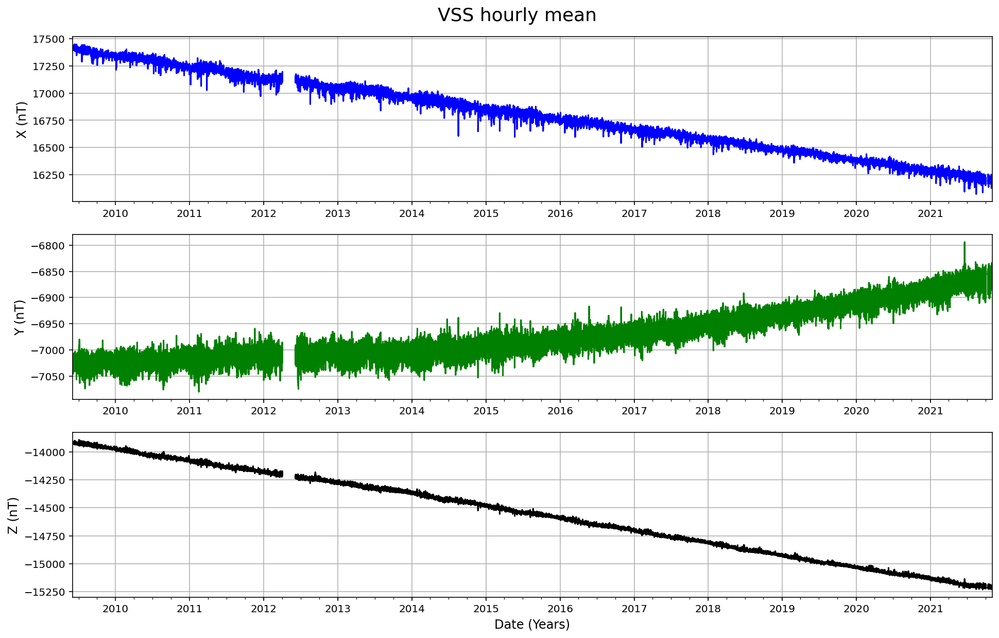

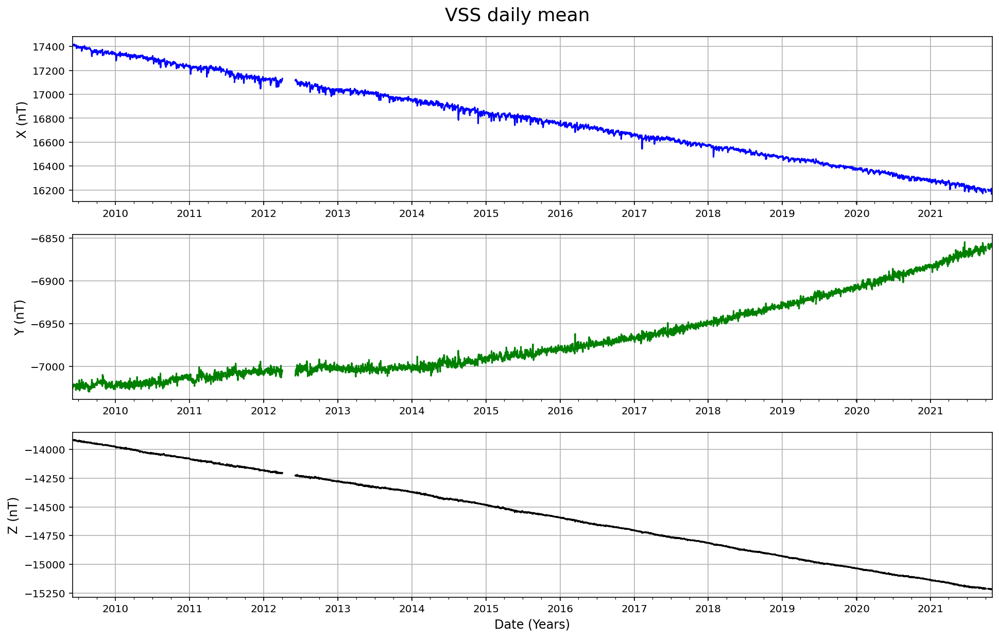

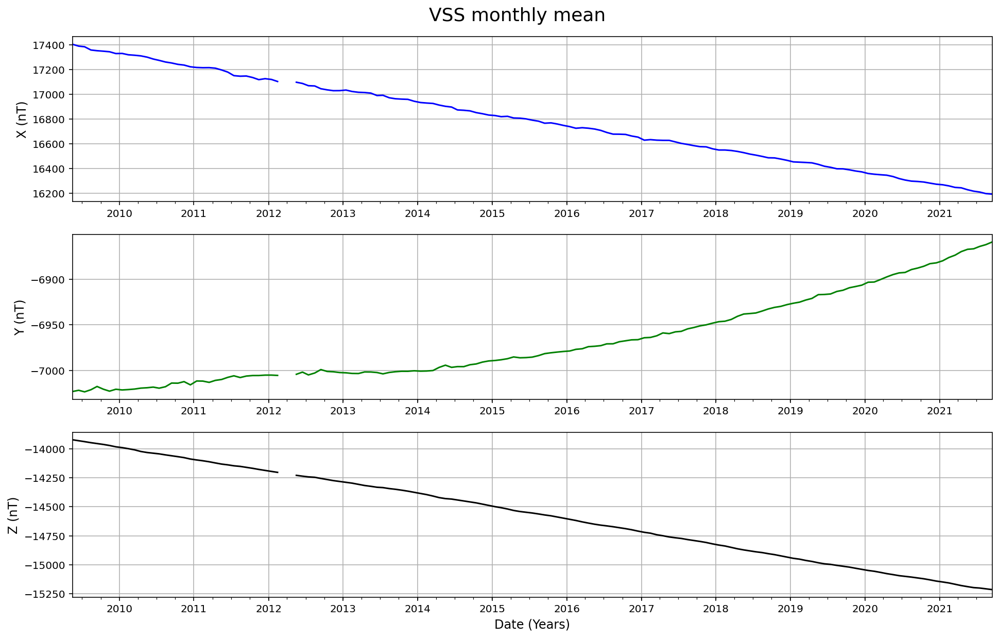

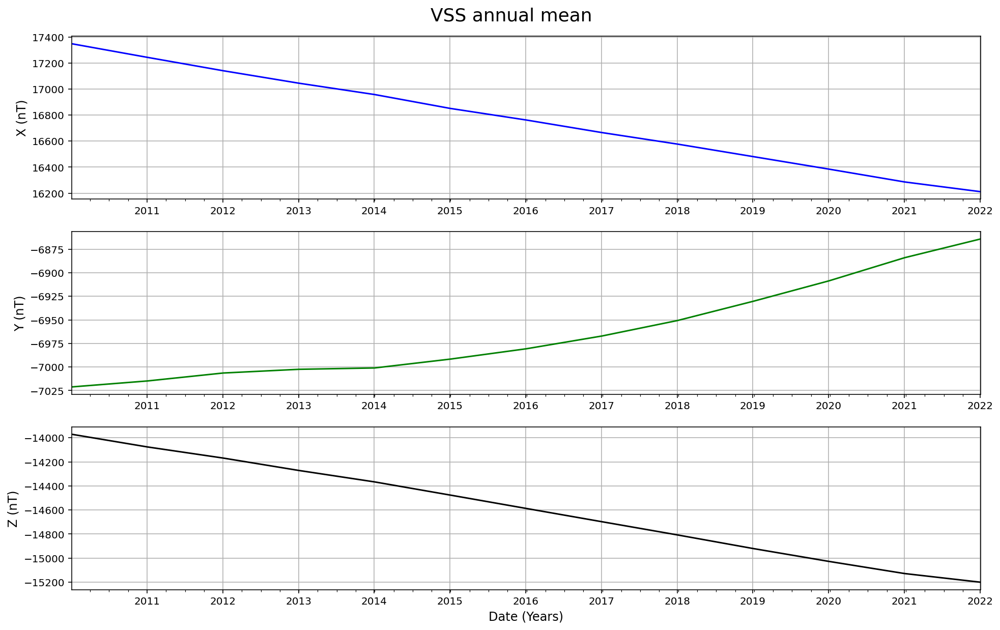

In [3]:
mvs.plot_samples('VSS', df)

Reading files from VSS...
Do You Want To denoise the data based on median absolute deviation? [y/n]: n
No data changed.
Press Q to use only Quiet Days, D to remove Disturbed Days, NT to use only the night-time, KP to Kp-Index <=3 or E to Exit without actions [Q/D/NT/KP/E]: E
No action
Do You want to correct the external field using the CHAOS model? [y/n]: n
Correction using CHAOS was not applied.
Do You Want To Save a File With the Variation? [y/n]: n
No files saved!
Do You Want To Save Plots of the Variation and SV for X, Y and Z? [y/n]: n
No plots saved


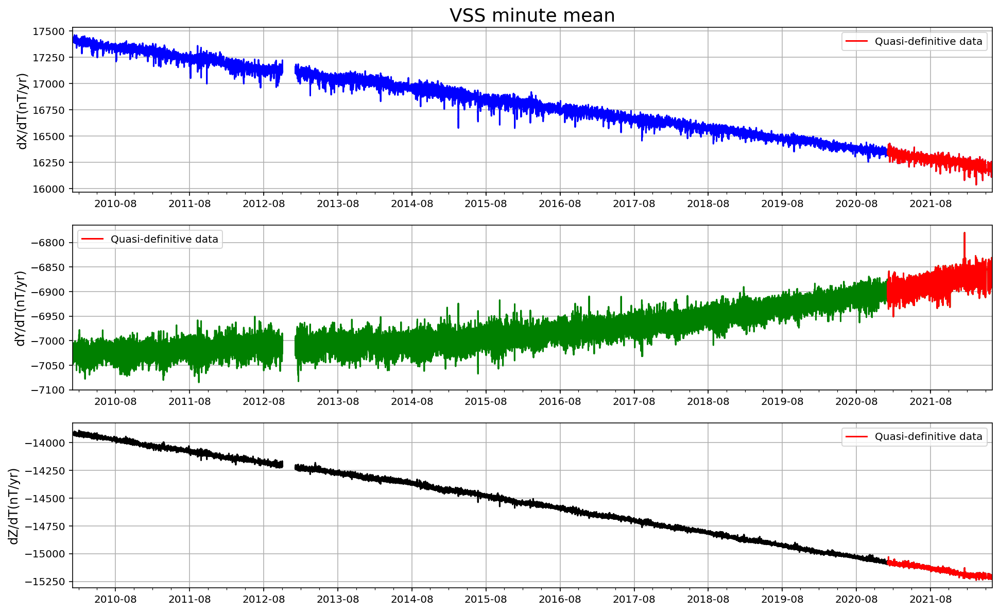

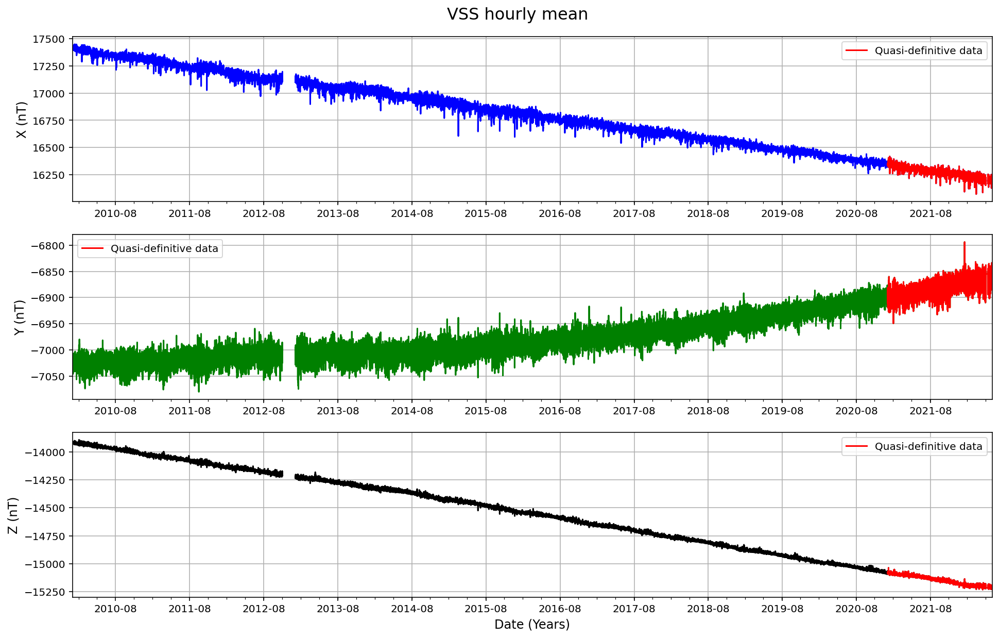

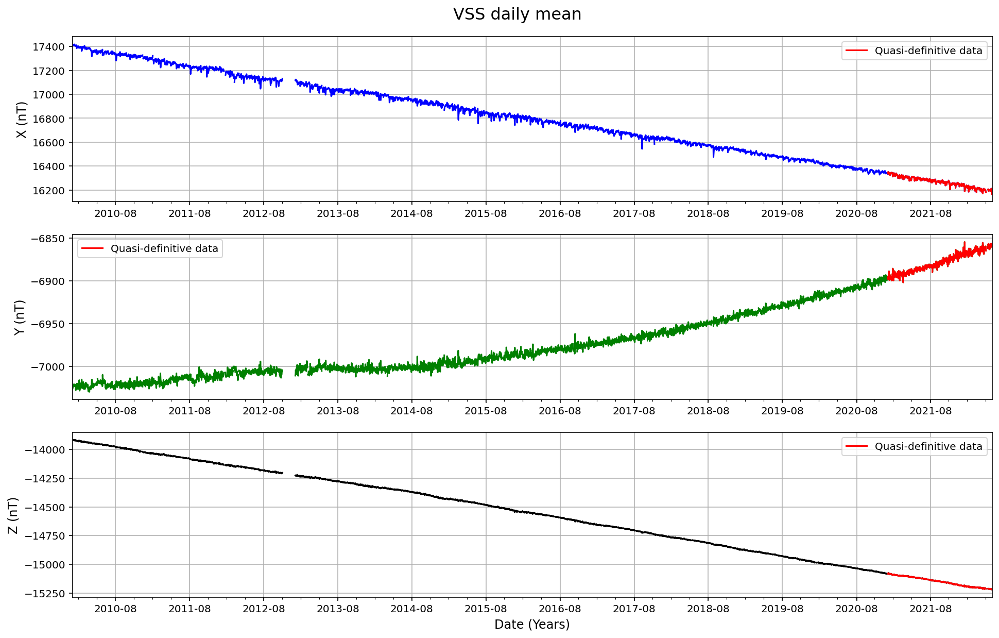

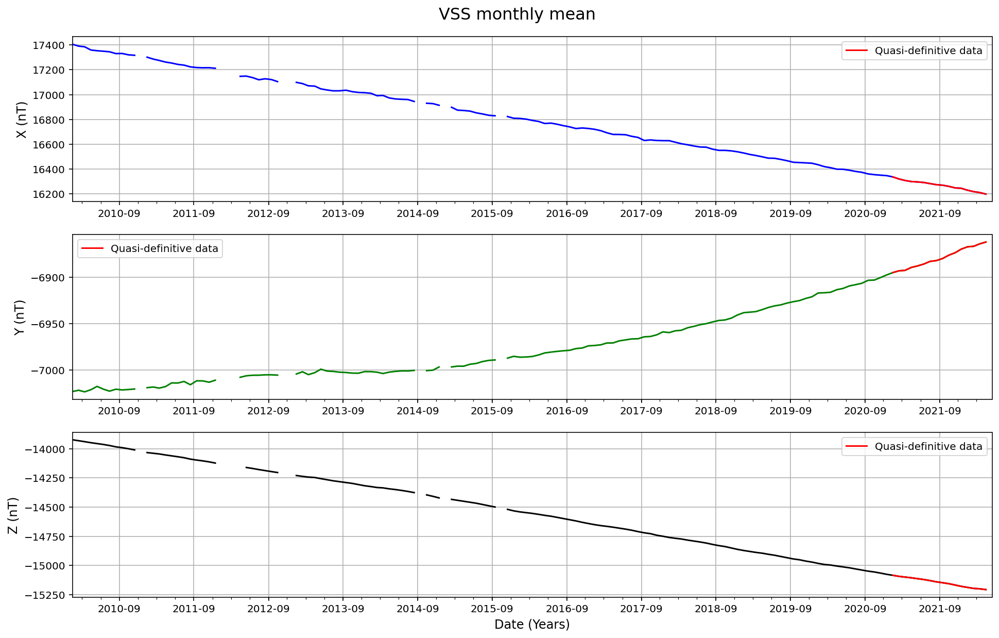

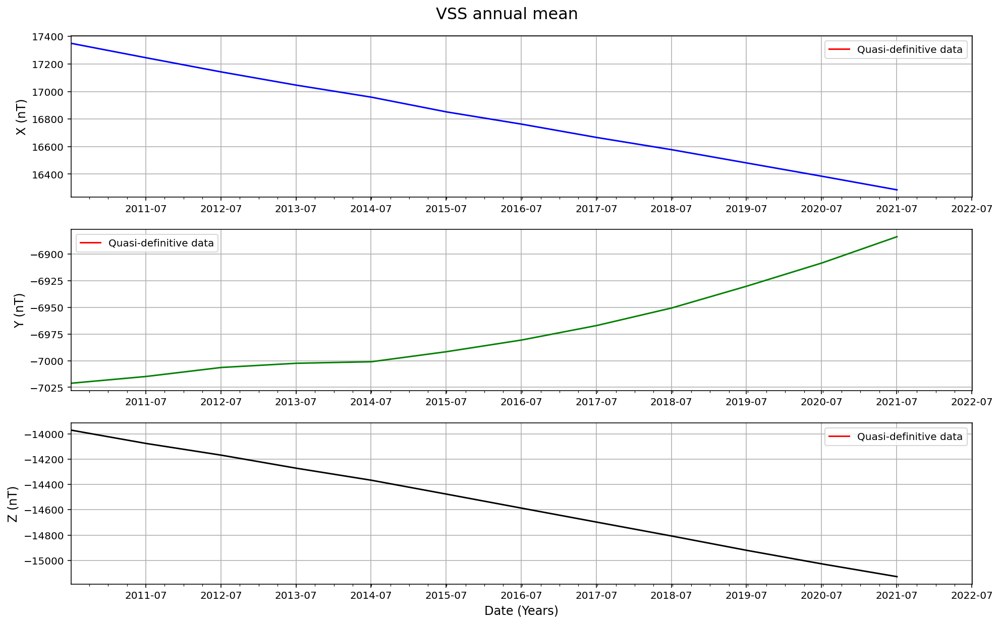

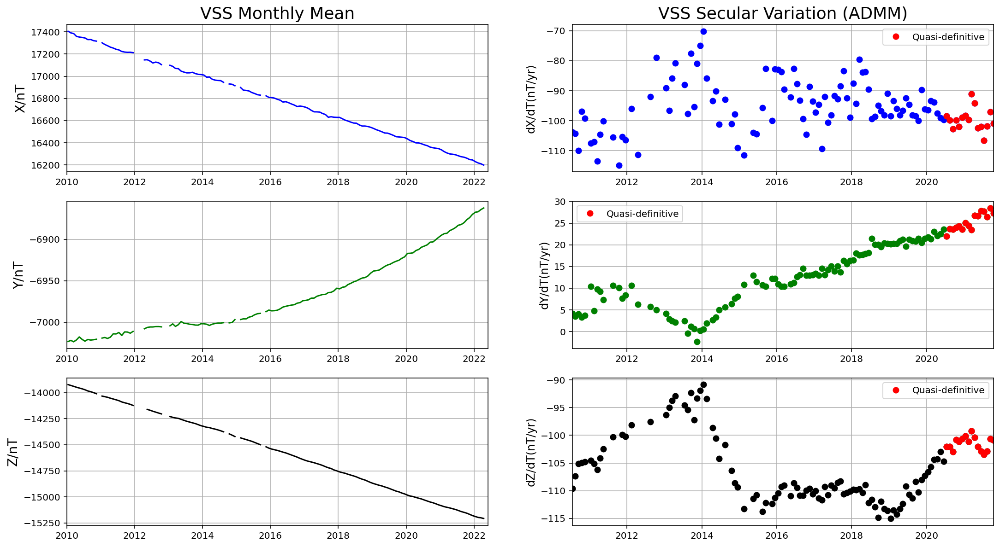

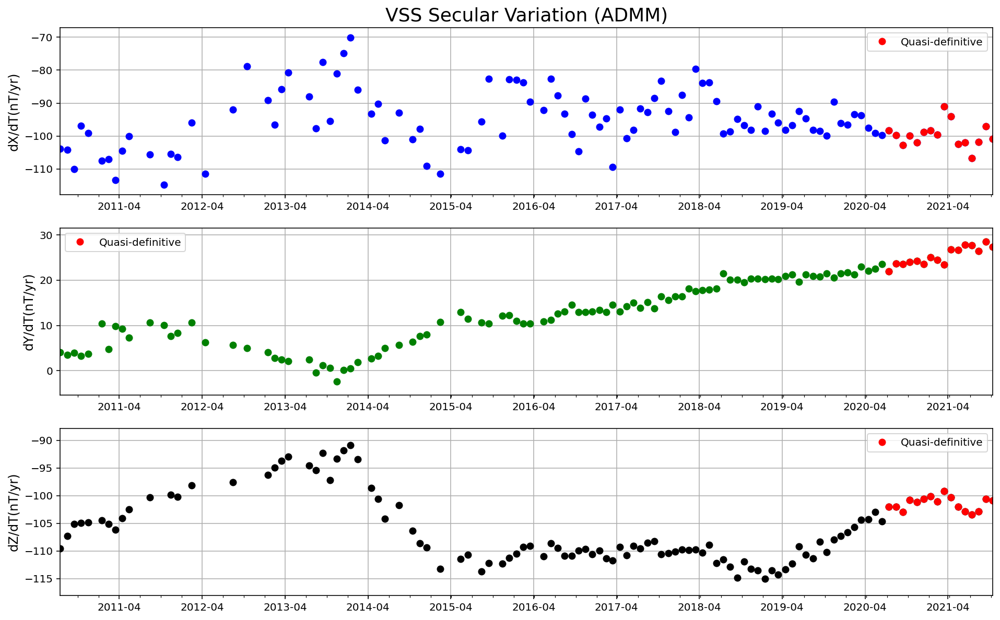

Do you want to detect a geomagnetic jerk? [y/n]: y
type the  start date for the jerk window [yyyy-mm]: 2015-04
type the end date for the jerk window [yyyy-mm]: 2021-04

VSS Jerk statistics for the X component.

Jerk occurence time -t0-: 2015.7
Jerk amplitute: -49.77
R^2: 0.31

****************************************************************

VSS Jerk statistics for the Y component.

Jerk occurence time -t0-: 2015.53
Jerk amplitute: 15.76
R^2: 0.96

****************************************************************

VSS Jerk statistics for the Z component.

Jerk occurence time -t0-: 2019.28
Jerk amplitute: 7.06
R^2: 0.86

****************************************************************


,X,Y,Z
Date,,,
2010-01-01 00:00:00,17402.60,-7017.70,-13921.30
2010-01-01 00:01:00,17402.80,-7018.00,-13921.50
2010-01-01 00:02:00,17402.70,-7018.00,-13921.50
2010-01-01 00:03:00,17402.70,-7018.10,-13921.50
2010-01-01 00:04:00,17402.70,-7018.10,-13921.50
...,...,...,...
2022-05-30 23:55:00,16162.59,-6859.56,-15219.35
2022-05-30 23:56:00,16162.44,-6859.64,-15219.25
2022-05-30 23:57:00,16162.34,-6859.68,-15219.23


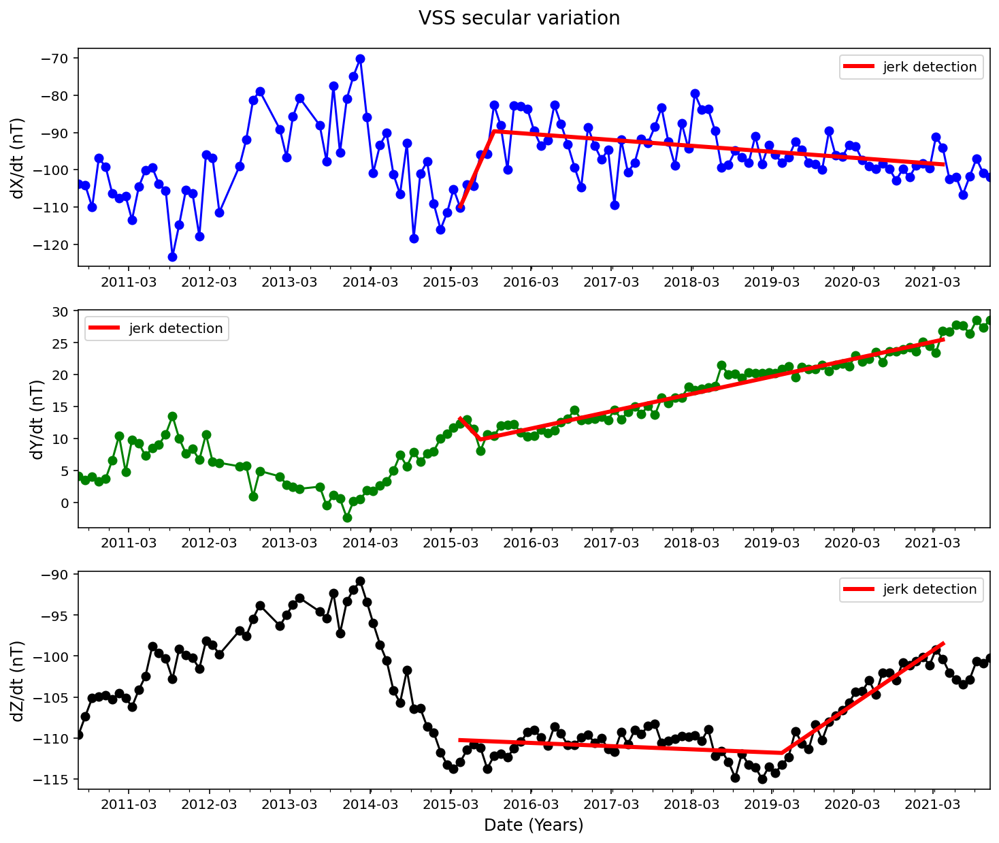

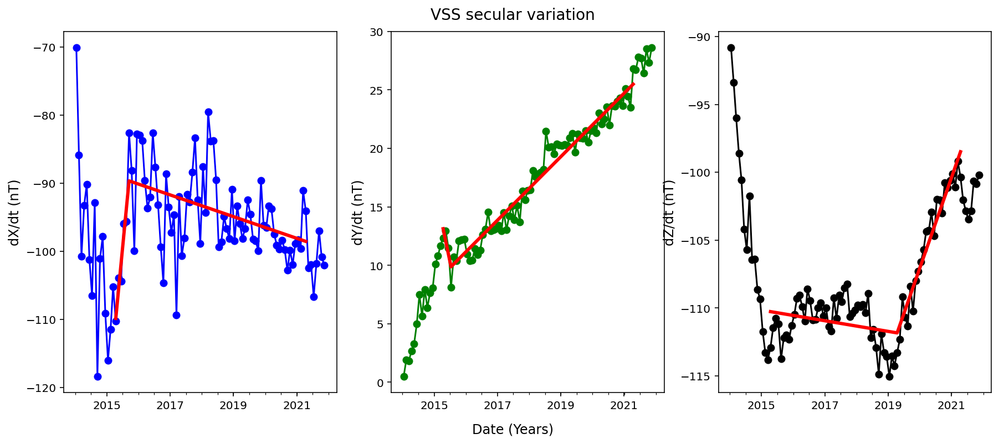

In [2]:

mvs.SV_obs('VSS','2010-01-01','2022-05-30',plot_chaos=True)

In [21]:
data = {'t0':[2013.37,2013.45,2013.43,2013.38,2013.56,2013.54],
                        'a':[7.07,7.59,6.5,6.92,5.91,6.18]}
data_vss = pd.DataFrame(data = data)

In [24]:
data_vss.std().round(2)

t0    0.08
a     0.62
dtype: float64

In [13]:
imo = 'NGK'
df = pd.read_csv(f'hourly_data/{imo}_hourly_data.txt', sep = '\t')
df.index = pd.to_datetime(df['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
df.pop('Date')

df_chaos = pd.read_csv(f'hourly_data/{imo}_chaos_hourly_data.txt', sep = '\t')
df_chaos.index = pd.to_datetime(df_chaos['Unnamed: 0'], format= '%Y-%m-%d %H:%M:%S.%f')
df_chaos.pop('Unnamed: 0')

Unnamed: 0
2000-01-01 00:00:00    2000-01-01 00:00:00
2000-01-01 01:00:00    2000-01-01 01:00:00
2000-01-01 02:00:00    2000-01-01 02:00:00
2000-01-01 03:00:00    2000-01-01 03:00:00
2000-01-01 04:00:00    2000-01-01 04:00:00
                              ...         
2022-05-30 19:00:00    2022-05-30 19:00:00
2022-05-30 20:00:00    2022-05-30 20:00:00
2022-05-30 21:00:00    2022-05-30 21:00:00
2022-05-30 22:00:00    2022-05-30 22:00:00
2022-05-30 23:00:00    2022-05-30 23:00:00
Name: Unnamed: 0, Length: 224184, dtype: object

In [42]:
    
df_imos = pd.read_csv('Thesis_Marcos/Data/Imos informations/IMOS_INTERMAGNET.txt',
                  skiprows = 1,
                   sep = '\s+',
                   usecols=[0, 1, 2, 3],
                   names = ['Imos', 'Latitude', 'Longitude', 'Elevation'],
                   index_col= ['Imos'])
starttime = '2000-01-01'
endtime = '2022-05-31'
for imo in df_imos.index[0:150]:

    df_chaos = pd.read_csv(f'hourly_data/{imo}_chaos_hourly_data.txt', sep = '\t')
    df_chaos.index = pd.to_datetime(df_chaos['Unnamed: 0'], format= '%Y-%m-%d %H:%M:%S.%f')
    df_chaos.pop('Unnamed: 0')
    
    
    df = pd.read_csv(f'hourly_data/{station}_hourly_data.txt', sep = '\t')
    df.index = pd.to_datetime(df['Date'], format= '%Y-%m-%d %H:%M:%S.%f')
    df.pop('Date')
    
    
    df_corrected, df_chaos = dpt.external_field_correction_chaos_model()
    
    df_sv_normal = dpt.calculate_SV(df, apply_percentage = True)
    df_sv_corrected = dpt.calculate_SV(df_corrected, apply_percentage = True)
    df_chaos_sv = dpt.calculate_SV(df_chaos)
    
    

The external field predicted using CHAOS-model was removed from the data.
The external field predicted using CHAOS-model was removed from the data.
The external field predicted using CHAOS-model was removed from the data.
The external field predicted using CHAOS-model was removed from the data.


In [5]:
df = mvs.load_INTERMAGNET_files('VSS', '2010-01-01','2015-06-01')

Reading files from VSS...


In [6]:
dpt.calculate_SV(df)

,X,Y,Z
Date,,,
2010-07-15,-103.844,4.126,-109.611
2010-08-15,-104.246,3.495,-107.331
2010-09-15,-110.052,4.024,-105.117
2010-10-15,-96.927,3.298,-104.983
2010-11-15,-99.160,3.731,-104.802
2010-12-15,-106.341,6.622,-105.291
2011-01-15,-107.594,10.466,-104.498
2011-02-14,-107.100,4.821,-105.123
2011-03-15,-113.460,9.836,-106.183


The external field predicted using CHAOS-model was removed from the data.
The external field predicted using CHAOS-model was removed from the data.


In [4]:
#2007
#data_ngk = {'t0':[2005.75, 2006],'A':[4.75, 4.6]}
#data_ebr = {'t0':[2006.28, 2006.4],'A':[6.16, 5.6]}
#data_tam = {'t0':[2005.79, 2005.7],'A':[8.15, 8.2]}
#data_asc = {'t0':[2006.9, 2006.9],'A':[22.72, 23.4]}
#
#2011
data_ngk = {'t0':[2011.84, 2011.8],'A':[-6.08, -6.2]}
data_ebr = {'t0':[2009.95, 2011],'A':[-7.76, -6.7]}
data_tam = {'t0':[2009.48, 2009.5],'A':[-6.78, -6.8]}
data_asc = {'t0':[2010.2, 2012],'A':[-19.35, -19.5]}
#2014
#data_ngk = {'t0':[2014.04, 2014],'A':[8.82, 7.2]}
#data_ebr = {'t0':[2014.02, 2014],'A':[15.28, 12.7]}
#data_tam = {'t0':[2013.96, 2014],'A':[13.03, 15.2]}
#data_asc = {'t0':[2013.99, 2014.1],'A':[21.87, 24.9]}

In [5]:
df_ngk = pd.DataFrame(data = data_ngk)
df_ebr = pd.DataFrame(data = data_ebr)
df_tam = pd.DataFrame(data = data_tam)
df_asc = pd.DataFrame(data = data_asc)

In [6]:
t0_diff = 0
A_diff = 0
t0_ptg = 0
A_ptg = 0
for x, obs in zip([df_ngk, df_ebr, df_tam, df_asc], ['ngk','ebr','tam','asc']):
    A_ptg = A_ptg + abs(df_ngk.pct_change()['A'][1]*100).round(2)
    t0_diff = t0_diff + abs(x.diff()['t0'][1].round(2))
    A_diff = A_diff + abs(x.diff()['A'][1].round(2))
    print('t0 diff for ' + obs.upper() +  ' was',abs(x.diff()['t0'][1].round(2)))
    print('A diff for ' + obs.upper() +  ' was ',abs(x.diff()['A'][1].round(2)))

t0 diff for NGK was 0.04
A diff for NGK was  0.12
t0 diff for EBR was 1.05
A diff for EBR was  1.06
t0 diff for TAM was 0.02
A diff for TAM was  0.02
t0 diff for ASC was 1.8
A diff for ASC was  0.15


In [11]:
A_ptg/4

1.97

In [15]:
t0_diff/4*365

265.5375

In [16]:
A_diff/4

0.3375

In [19]:
abs(df_ngk.pct_change()['A'][1]*100).round(2)

1.97

In [20]:
abs(df_ebr.pct_change()['A'][1]*100).round(2)

13.66

In [21]:
abs(df_tam.pct_change()['A'][1]*100).round(2)

0.29

In [22]:
abs(df_asc.pct_change()['A'][1]*100).round(2)

0.78

In [23]:
(1.97 + 13.66 + 0.29 + 0.78)/4

4.175

In [83]:
A_ptc_2014 = 18.37
A_ptc_2007 = 34.1
A_ptc_2011 = 0.98

ModuleNotFoundError: No module named 'openpyxl'

(array([0., 1.]), array([2.5, 3. , 3.5]), <BarContainer object of 2 artists>)

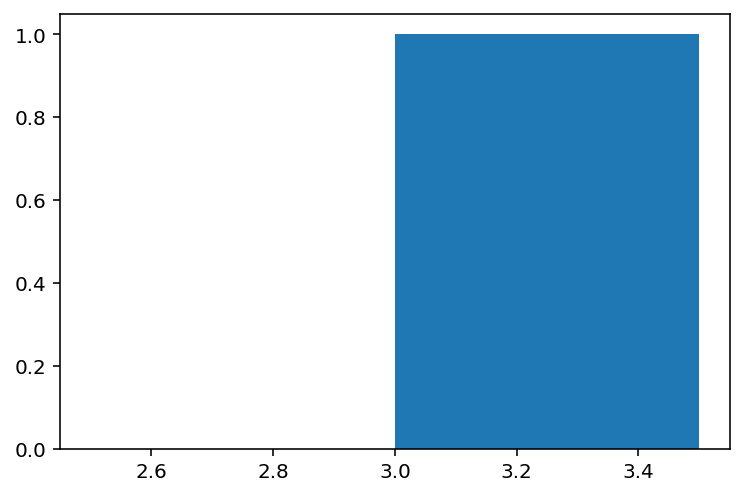

In [7]:
plt.hist(3,2)

In [8]:
a_y = {'CHAOS':[8.06],'KP':[8.11], 'NT': [6.37], 'QD': [5.61]}
t0_y = {'CHAOS':[45.89],'KP':[44.32], 'NT': [28.68], 'QD': [45.67]}
#data_ebr = {'t0':[2006.28, 2006.4],'A':[6.16, 5.6]}
#data_tam = {'t0':[2005.79, 2005.7],'A':[8.15, 8.2]}
#data_asc = {'t0':[2006.9, 2006.9],'A':[22.72, 23.4]}

(array([1., 0., 0., 1., 0., 0., 1., 0., 0., 1.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <BarContainer object of 10 artists>)

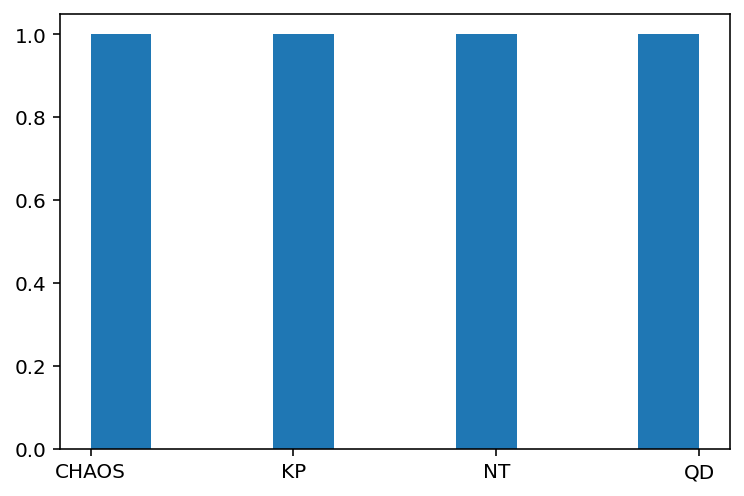

In [9]:
plt.hist(a_y)

NameError: name 'utt' is not defined